Hello World !

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image  as mpimg
import cv2
import glob
import numpy as np
from random import randint
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

#from os.path import dirname, realpath, sep, pardir
#import sys, os
#print(os.path)
#print(sys.path)
#sys.path.append('/Users/Mikkawi/anaconda/pkgs/opencv-3.2.0-np112py36_blas_openblas_201')
#sys.path.append('/Users/Mikkawi/anaconda/pkgs')

#print ("Hello World!")

#import cv2

#img = mpimg.imread('camera_cal/calibration1.jpg')
#plt.imshow(img)

images = glob.glob('camera_cal/calibration*.jpg')

In [2]:
objpoints = []
imgpoints = []

objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
#print(objp)

for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    print(idx," :",fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        #cv2.drawChessboardCorners(img,(9,6),corners,ret)
        write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        print(write_name)
        #cv2.imshow('img', img)
        #cv2.waitKey(500)
        #cv2.destroyAllWindows()


0  : camera_cal/calibration1.jpg
1  : camera_cal/calibration10.jpg
corners_found1.jpg
2  : camera_cal/calibration11.jpg
corners_found2.jpg
3  : camera_cal/calibration12.jpg
corners_found3.jpg
4  : camera_cal/calibration13.jpg
corners_found4.jpg
5  : camera_cal/calibration14.jpg
corners_found5.jpg
6  : camera_cal/calibration15.jpg
corners_found6.jpg
7  : camera_cal/calibration16.jpg
corners_found7.jpg
8  : camera_cal/calibration17.jpg
corners_found8.jpg
9  : camera_cal/calibration18.jpg
corners_found9.jpg
10  : camera_cal/calibration19.jpg
corners_found10.jpg
11  : camera_cal/calibration2.jpg
corners_found11.jpg
12  : camera_cal/calibration20.jpg
corners_found12.jpg
13  : camera_cal/calibration3.jpg
corners_found13.jpg
14  : camera_cal/calibration4.jpg
15  : camera_cal/calibration5.jpg
16  : camera_cal/calibration6.jpg
corners_found16.jpg
17  : camera_cal/calibration7.jpg
corners_found17.jpg
18  : camera_cal/calibration8.jpg
corners_found18.jpg
19  : camera_cal/calibration9.jpg
corners_

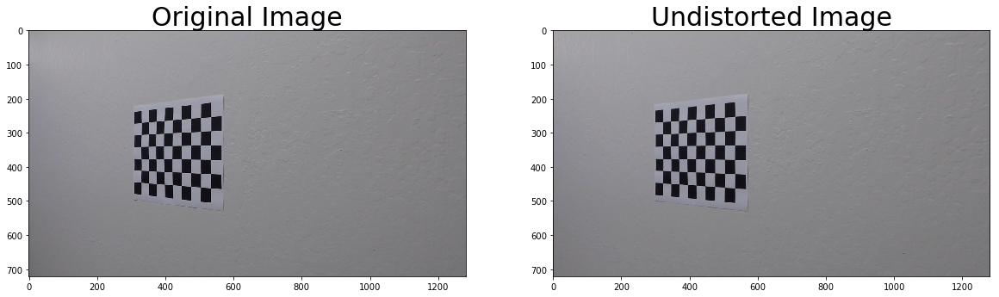

In [3]:
#from random import randint

x = randint(1,20)
filname= 'camera_cal/calibration'+str(x)+'.jpg'
img = mpimg.imread(filname)
img_size = (img.shape[1], img.shape[0])


# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.savefig('output_images/01 - calibration_original.png')
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
f.savefig('output_images/01 - calibration_original.png')

In [4]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if img.ndim ==2:
        gray = img

    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        #print('Colored photo')
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    abs_sobel = np.absolute(sobel) 
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    grad_binary = sbinary
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    if img.ndim ==2:
        gray = img
    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    gradmag = np.sqrt(sobelx**2+sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
  
    #print(img.shape, len(img),img.ndim)
    if img.ndim ==2:
        gray = img
    else: 
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F,0,1, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_direction = np.arctan2(abs_sobely,abs_sobelx)
    dir_binary = np.zeros_like(grad_direction)
    dir_binary[(grad_direction > thresh[0] )& (grad_direction < thresh[1])] = 1

    return dir_binary

def clr_threshold(img, thresh=(0,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    #thresh = (170, 255)
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    return S, binary
    

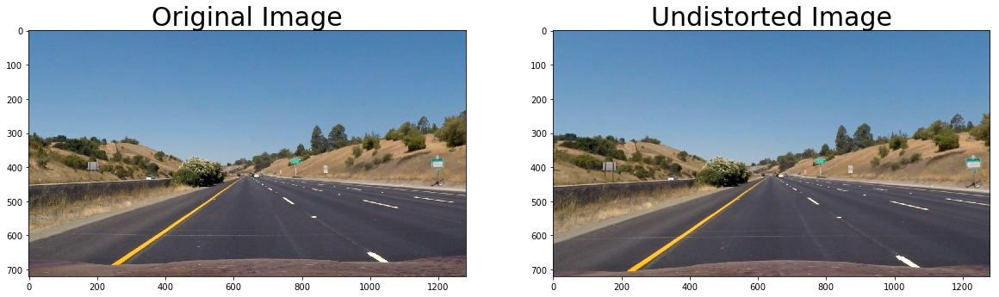

In [5]:
# 1- Removing distortion from image.
testimage = mpimg.imread('test_images/straight_lines1.jpg')
#testimage = mpimg.imread('test_images/straight_lines2.jpg')
#testimage = mpimg.imread('test_images/test1.jpg')
#testimage = mpimg.imread('test_images/test2.jpg')


testimage_u = cv2.undistort(testimage, mtx, dist, None, mtx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(testimage)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(testimage_u)
ax2.set_title('Undistorted Image', fontsize=30)
f.savefig('output_images/02 - calibration_roadimg.png')

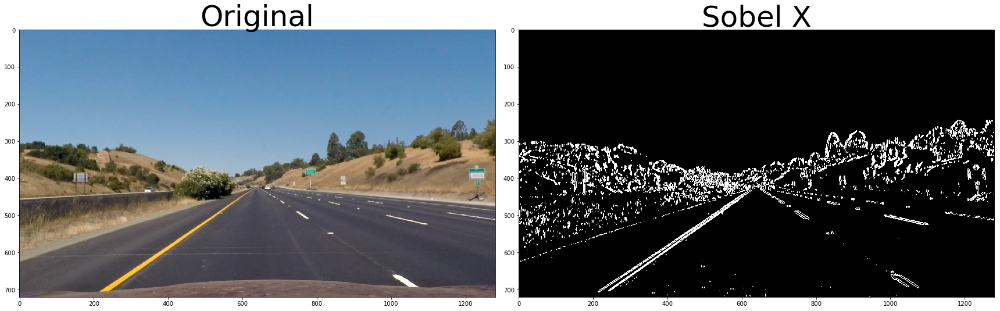

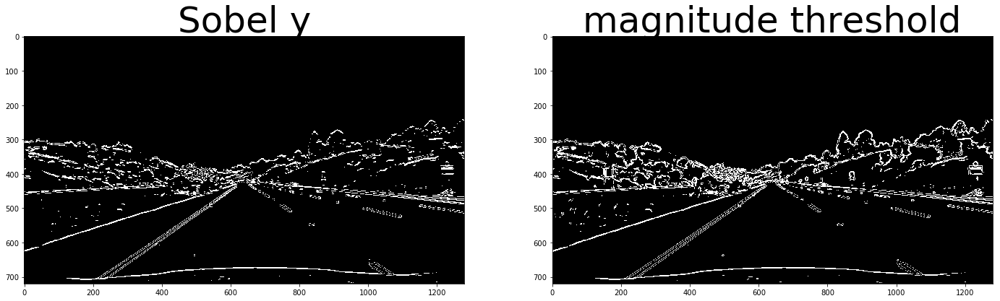

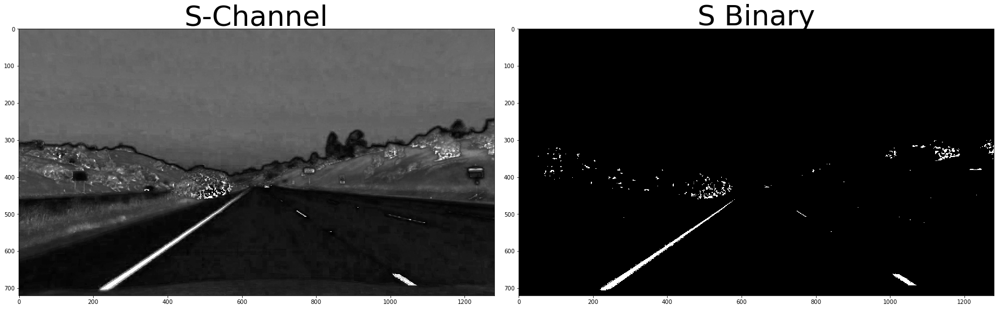

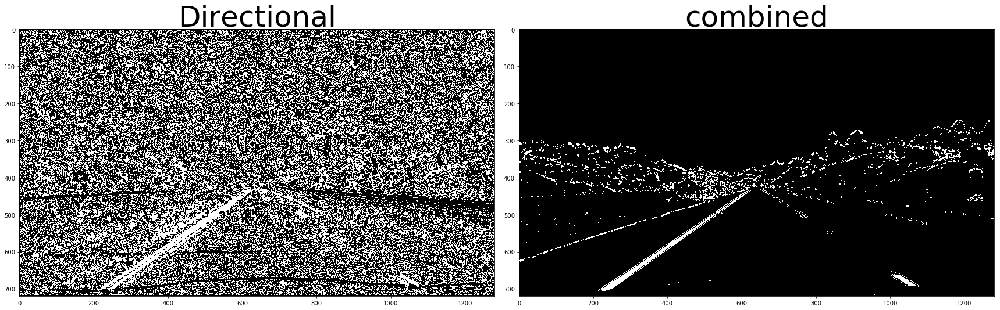

In [6]:

testimage = testimage_u



img_sobelx    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comp = np.zeros_like(img_sobelx)
img_comp[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(testimage, cmap='gray')
ax1.set_title('Original', fontsize=50)
ax2.imshow(img_sobelx, cmap='gray')
ax2.set_title('Sobel X', fontsize=50)
f.savefig('output_images/03 - findinglanes_original_sobelx.png')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

ff, (ax3, ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(img_sobely, cmap='gray')
ax3.set_title('Sobel y', fontsize=50)
ax4.imshow(img_mag, cmap='gray')
ax4.set_title('magnitude threshold', fontsize=50)
f.savefig('output_images/04 - findinglanes_sobely_magnitude.png')

#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

f, (ax5, ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(S, cmap ='gray')
ax5.set_title('S-Channel', fontsize=50)
ax6.imshow(img_clr, cmap='gray')
ax6.set_title('S Binary', fontsize=50)
f.savefig('output_images/05 - findinglanes_schannel_S_binary.png')
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(img_dir, cmap='gray')
ax7.set_title('Directional', fontsize=50)
ax8.imshow(img_comp, cmap='gray')
ax8.set_title('combined',fontsize = 50)
f.savefig('output_images/06 - directional_combo.png')


In [7]:
#Define a function to apply image mask

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

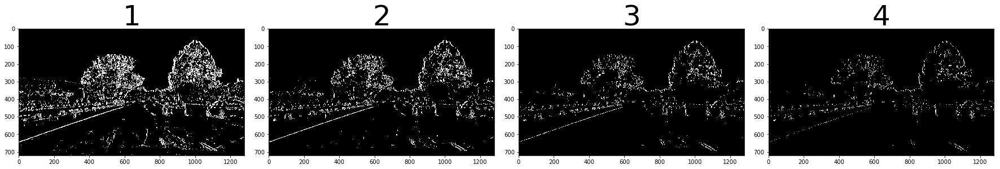

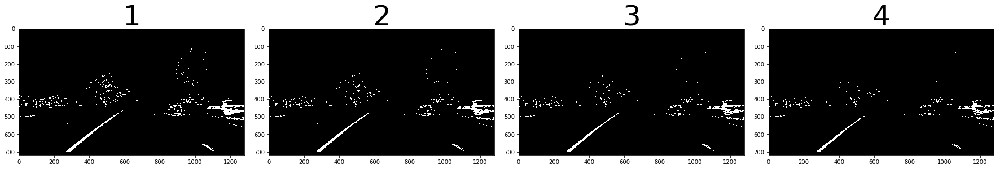

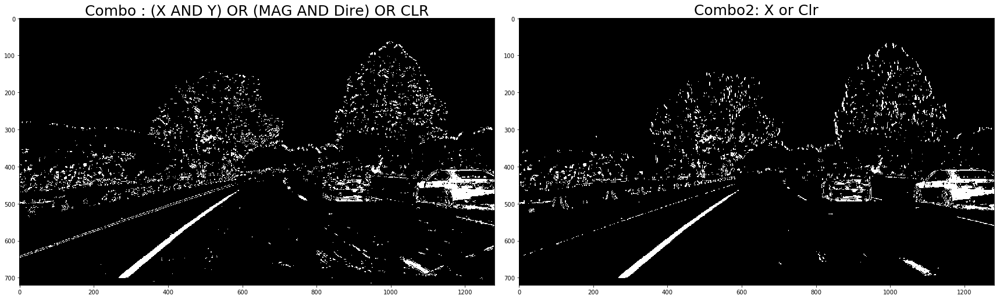

In [8]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test1.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test1     = testimage

img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


    
img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test1 = img_comb2 #selected threshold combo

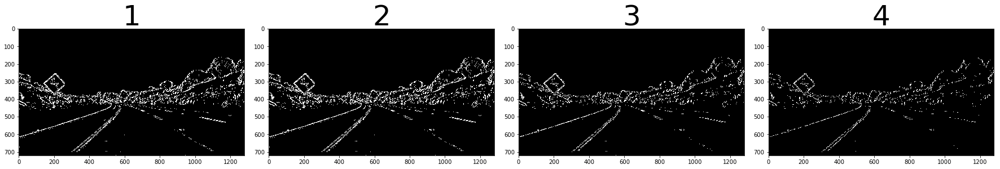

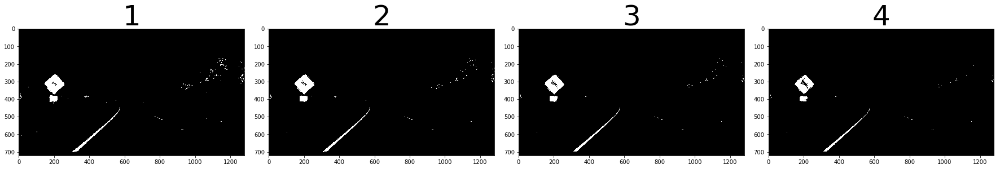

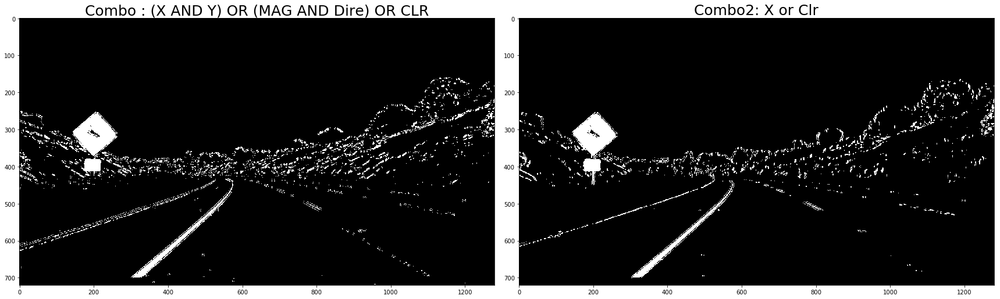

In [9]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test2.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test2     = testimage

img_sobel1    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test2 = img_comb2 #selected threshold combo

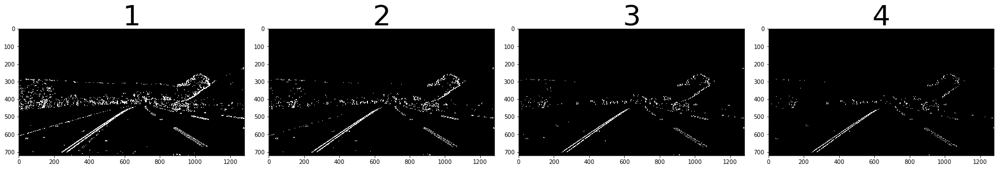

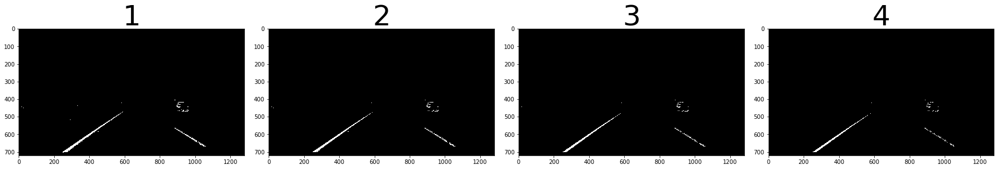

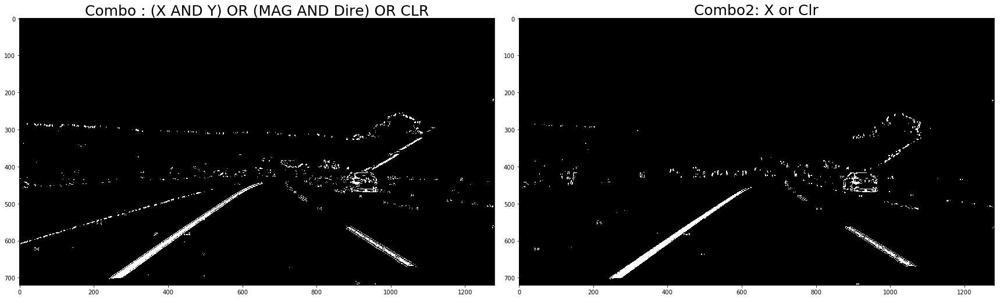

In [10]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test3.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test3     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                     = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test3 = img_comb2 #selected threshold combo

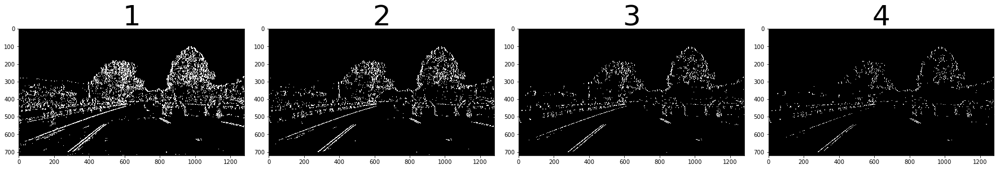

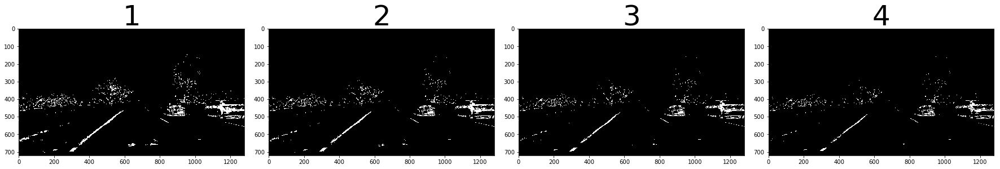

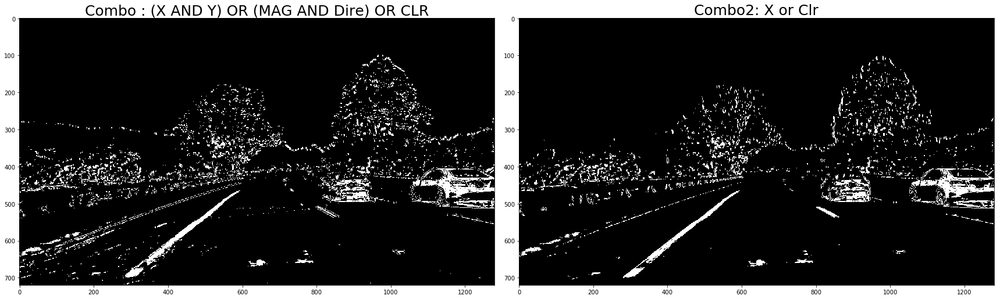

In [11]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test4.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test4     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test4 = img_comb2 #selected threshold combo

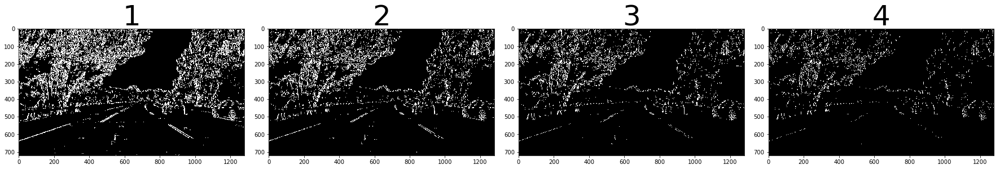

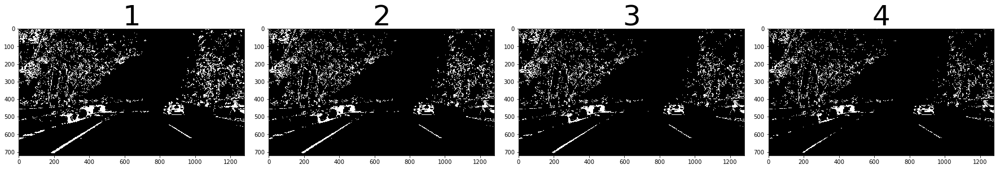

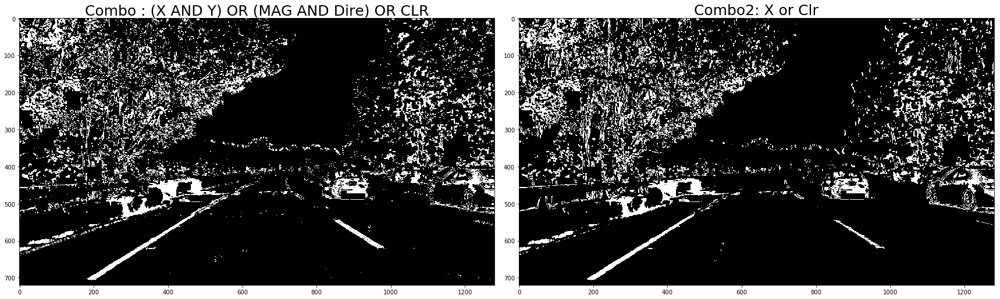

In [12]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test5.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test5     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                  = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)

img_test5 = img_comb2 #selected threshold combo

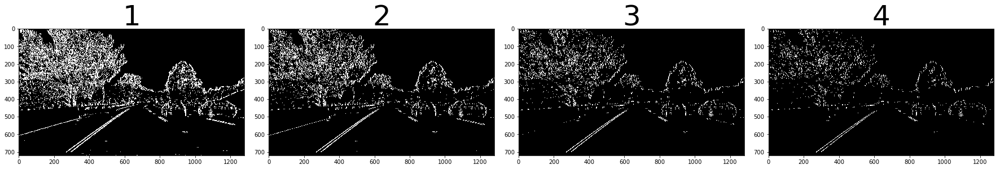

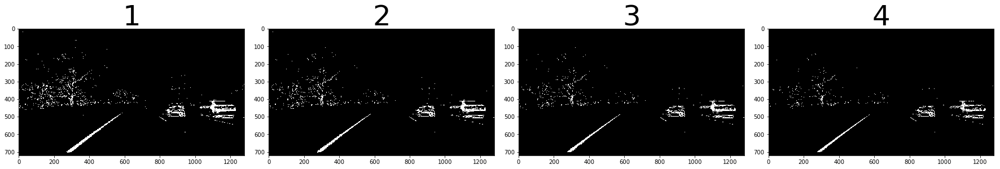

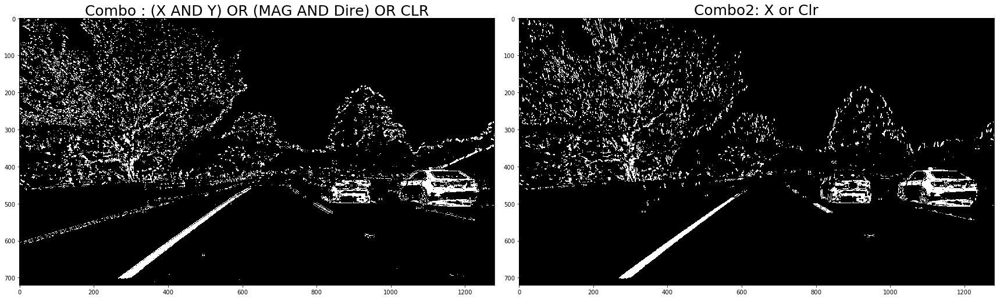

In [13]:
# Sobelx and S-Channel Binary images seem to have better lane lines detection
# will test both with different threshold, and combine their results
testimage = mpimg.imread('test_images/test6.jpg')
testimage = cv2.undistort(testimage, mtx, dist, None, mtx)
test6     = testimage
img_sobel1    = abs_sobel_thresh(testimage,'x',9,(20,100))
img_sobel2    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobel3    = abs_sobel_thresh(testimage,'x',9,(40,100))
img_sobel4    = abs_sobel_thresh(testimage,'x',9,(50,100))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_sobel1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_sobel2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_sobel3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_sobel4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
f.savefig('output_images/testing - 1.png')


S, img_clr1   = clr_threshold(testimage,(150,255))
S, img_clr2   = clr_threshold(testimage,(170,255))
S, img_clr3   = clr_threshold(testimage,(190,255))
S, img_clr4   = clr_threshold(testimage,(210,255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_clr1, cmap='gray')
ax1.set_title('1', fontsize=50)
ax2.imshow(img_clr2, cmap='gray')
ax2.set_title('2', fontsize=50)
ax3.imshow(img_clr3, cmap='gray')
ax3.set_title('3', fontsize=50)
ax4.imshow(img_clr4, cmap='gray')
ax4.set_title('4', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
f.savefig('output_images/testing - 2.png')
img_sobelx    = abs_sobel_thresh(testimage,'x',9,(30,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(40,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_comb      = np.zeros_like(img_sobelx)
img_comb2     = np.zeros_like(img_sobelx)

img_comb[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_comb2[((img_sobel4 == 1)  | (img_clr1 == 1))]                                                    = 1

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_comb, cmap='gray')
ax1.set_title('Combo : (X AND Y) OR (MAG AND Dire) OR CLR', fontsize=25)
ax2.imshow(img_comb2, cmap='gray')
ax2.set_title('Combo2: X or Clr', fontsize=25)
f.savefig('output_images/testing - 3.png')
img_test6 = img_comb2 #selected threshold combo

In [14]:
src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
print(src)
print(dst)

[[  585.5   460.5]
 [  203.5   721. ]
 [ 1127.5   721. ]
 [  695.5   460.5]]
[[ 320.25    0.  ]
 [ 320.25  721.  ]
 [ 960.75  721.  ]
 [ 960.75    0.  ]]


In [15]:
def inv_warp(img):
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[585,460],
    [203,720],
    [1127,720],
    [695,460]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[320,0],
     [320,720],
     [960,720],
     [960,0]])
    Minv = cv2.getPerspectiveTransform(dst,src)
    warped = cv2.warpPerspective(img,Minv,img_size,flags = cv2.INTER_LINEAR)
    
    return warped
def warp(img):
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[585,460],
    [203,720],
    [1127,720],
    [695,460]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[320,0],
     [320,720],
     [960,720],
     [960,0]])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
    
    return warped
def warp3(img):
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[718,470],
    [1065,690],
    [240,690],
    [565,470]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[800,0],
     [800,700],
     [400,700],
     [400,0]])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
    
    return warped

def warp2(img):  #old values, I changed the main function to test other settings
    img_size = (img.shape[1],img.shape[0])
    src = np.float32(
    [[670,440],
    [1065,690],
    [240,690],
    [610,440]])
    dst = np.float32(  # kept playing with these numbers to get an optimum result, better lines
    [[800,0],
     [800,700],
     [400,700],
     [400,0]])
    M = cv2.getPerspectiveTransform(src,dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
    
    return warped

[[[ 535  460]
  [ 153  720]
  [1177  720]
  [ 745  460]]]


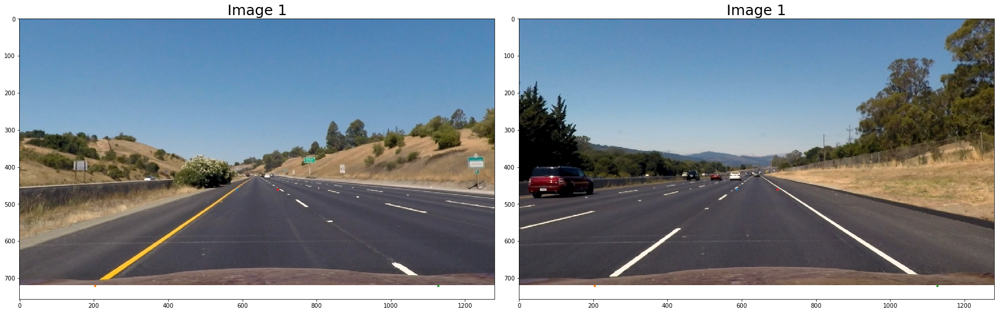

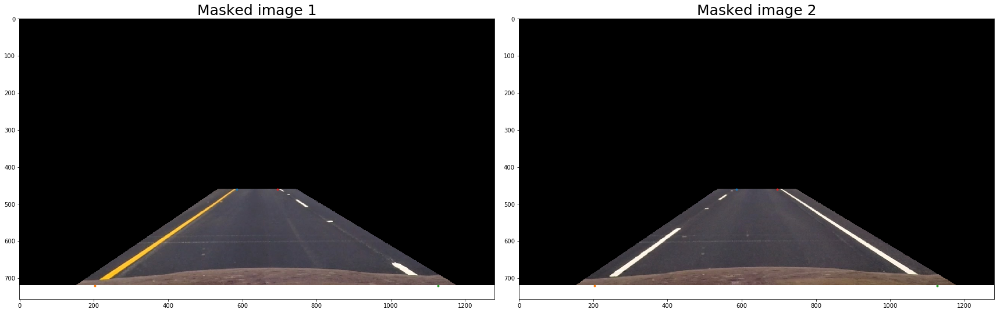

In [16]:
#Adjust polygen vertices to perform warping and masking

testimage  = mpimg.imread('test_images/straight_lines1.jpg')
testimage2 = mpimg.imread('test_images/straight_lines2.jpg')
testimage  = cv2.undistort(testimage, mtx, dist, None, mtx)
testimage2 = cv2.undistort(testimage2, mtx, dist, None, mtx)

#selected points on image for warping, based on many iterations
w_points = np.matrix([[585, 460],[203, 720],[1127,720],[695,460]])

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(testimage, cmap='gray')
ax1.set_title('Image 1', fontsize=25)
ax1.plot(w_points[0,0],w_points[0,1],'.')
ax1.plot(w_points[1,0],w_points[1,1],'.')
ax1.plot(w_points[2,0],w_points[2,1],'.')
ax1.plot(w_points[3,0],w_points[3,1],'.')

ax2.imshow(testimage2, cmap='gray')
ax2.set_title('Image 1', fontsize=25)
ax2.plot(w_points[0,0],w_points[0,1],'.')
ax2.plot(w_points[1,0],w_points[1,1],'.')
ax2.plot(w_points[2,0],w_points[2,1],'.')
ax2.plot(w_points[3,0],w_points[3,1],'.')

#masking vertices slightly to the right and left of the warping points
vertices = np.array([[(w_points[0,0],w_points[0,1]),(w_points[1,0],w_points[1,1]),(w_points[2,0],w_points[2,1]),(w_points[3,0],w_points[3,1])]],dtype=np.int32)
margin = 50
vertices = np.array([[(w_points[0,0]-margin,w_points[0,1]),(w_points[1,0]-margin,w_points[1,1]),(w_points[2,0]+margin,w_points[2,1]),(w_points[3,0]+margin,w_points[3,1])]],dtype=np.int32)
m_testimg1 = region_of_interest(testimage, vertices)
m_testimg2 = region_of_interest(testimage2, vertices)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(m_testimg1, cmap='gray')
ax1.set_title('Masked image 1', fontsize=25)
ax1.plot(w_points[0,0],w_points[0,1],'.')
ax1.plot(w_points[1,0],w_points[1,1],'.')
ax1.plot(w_points[2,0],w_points[2,1],'.')
ax1.plot(w_points[3,0],w_points[3,1],'.')

ax2.imshow(m_testimg2, cmap='gray')
ax2.set_title('Masked image 2', fontsize=25)
ax2.plot(w_points[0,0],w_points[0,1],'.')
ax2.plot(w_points[1,0],w_points[1,1],'.')
ax2.plot(w_points[2,0],w_points[2,1],'.')
ax2.plot(w_points[3,0],w_points[3,1],'.')

print(vertices)

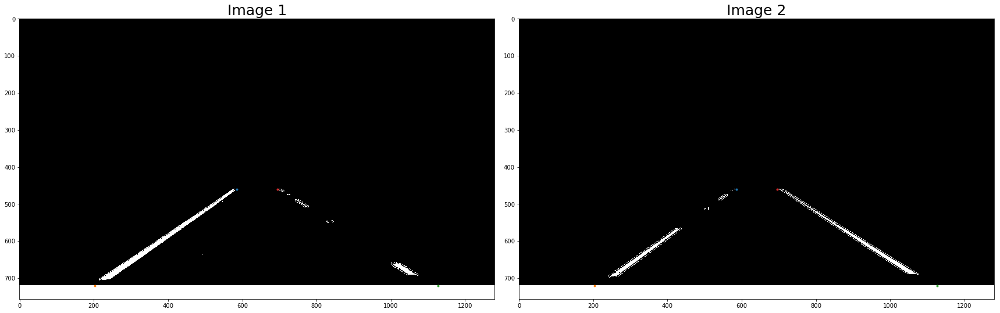

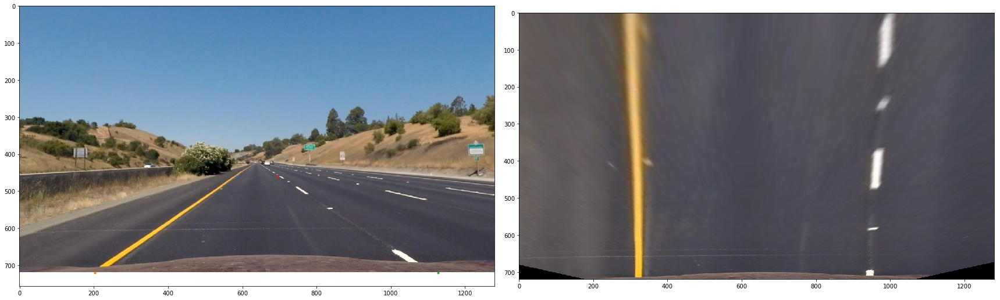

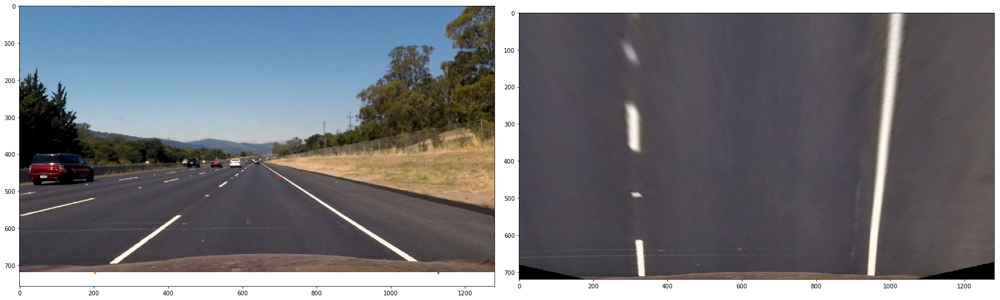

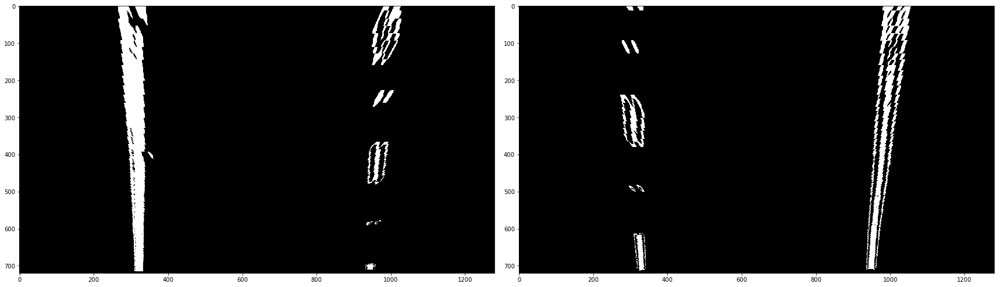

In [17]:
# Prespective Transform Test on Straight lines

testimage  = mpimg.imread('test_images/straight_lines1.jpg')
testimage2 = mpimg.imread('test_images/straight_lines2.jpg')
testimage  = cv2.undistort(testimage, mtx, dist, None, mtx)
testimage2 = cv2.undistort(testimage2, mtx, dist, None, mtx)

#testimage  = region_of_interest(testimage, vertices)
#testimage2 = region_of_interest(testimage2, vertices)

img_sobelx    = abs_sobel_thresh(testimage,'x',9,(50,100))
img_sobely    = abs_sobel_thresh(testimage,'y',9,(50,100))
img_mag       = mag_thresh(testimage,9,(40,100))
img_dir       = dir_threshold(testimage,9,(0.7,1.3))
S, img_clr    = clr_threshold(testimage,(150,255))

img_sobelx2    = abs_sobel_thresh(testimage2,'x',9,(50,100))
img_sobely2   = abs_sobel_thresh(testimage2,'y',9,(50,100))
img_mag2       = mag_thresh(testimage2,9,(40,100))
img_dir2       = dir_threshold(testimage2,9,(0.7,1.3))
S, img_clr2    = clr_threshold(testimage2,(150,255))

img_1 = np.zeros_like(img_sobelx)
#img_1[((img_sobelx == 1) & (img_sobely == 1)) | ((img_mag == 1) & (img_dir == 1))|(img_clr ==1)] = 1
img_1[((img_sobelx == 1)  | (img_clr == 1))] =1
img_2 = np.zeros_like(img_sobelx)
#img_2[((img_sobelx2 == 1) & (img_sobely2 == 1)) | ((img_mag2 == 1) & (img_dir2 == 1))|(img_clr2 ==1)] = 1
img_2[((img_sobelx2 == 1)  | (img_clr2 == 1))] =1

img_1  = region_of_interest(img_1, vertices)
img_2  = region_of_interest(img_2, vertices)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_1, cmap='gray')
ax1.set_title('Image 1', fontsize=25)
ax1.plot(w_points[0,0],w_points[0,1],'.')
ax1.plot(w_points[1,0],w_points[1,1],'.')
ax1.plot(w_points[2,0],w_points[2,1],'.')
ax1.plot(w_points[3,0],w_points[3,1],'.')

ax2.imshow(img_2, cmap='gray')
ax2.set_title('Image 2', fontsize=25)

ax2.plot(w_points[0,0],w_points[0,1],'.')
ax2.plot(w_points[1,0],w_points[1,1],'.')
ax2.plot(w_points[2,0],w_points[2,1],'.')
ax2.plot(w_points[3,0],w_points[3,1],'.')

w_img_1 = warp(img_1)
w_img_2 = warp(img_2)
w_testimage  = warp(testimage)
w_testimage2 = warp(testimage2)

f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(testimage)
ax5.plot(w_points[0,0],w_points[0,1],'.')
ax5.plot(w_points[1,0],w_points[1,1],'.')
ax5.plot(w_points[2,0],w_points[2,1],'.')
ax5.plot(w_points[3,0],w_points[3,1],'.')
ax6.imshow(w_testimage)

f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(testimage2)
ax7.plot(w_points[0,0],w_points[0,1],'.')
ax7.plot(w_points[1,0],w_points[1,1],'.')
ax7.plot(w_points[2,0],w_points[2,1],'.')
ax7.plot(w_points[3,0],w_points[3,1],'.')
ax8.imshow(w_testimage2)

f, (ax3,ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(w_img_1, cmap='gray')
ax4.imshow(w_img_2, cmap='gray')

[[[ 535  460]
  [ 153  720]
  [1177  720]
  [ 745  460]]]


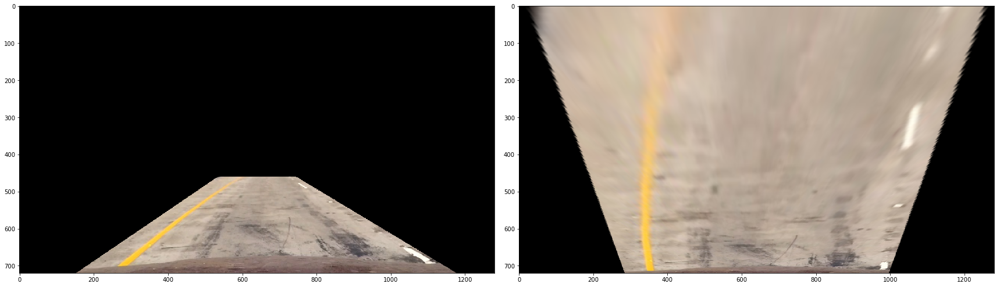

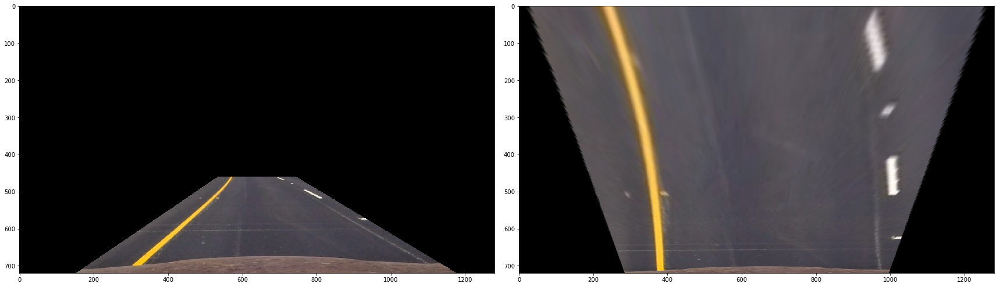

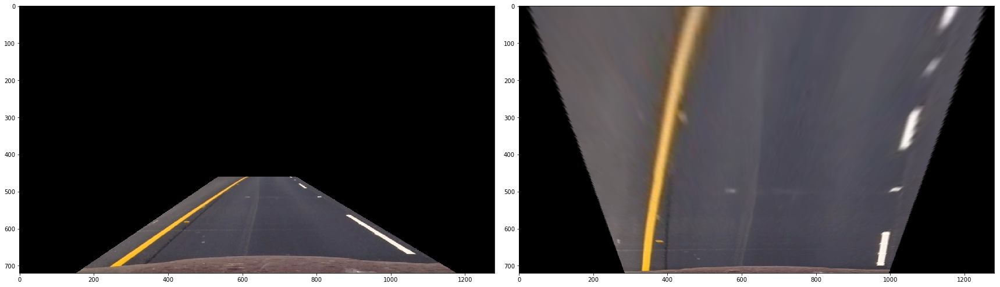

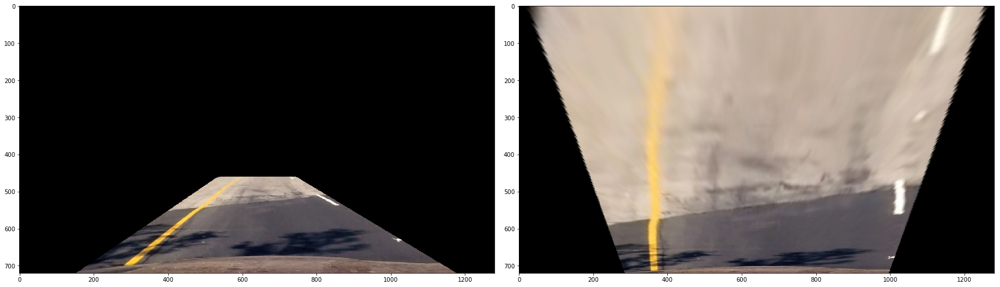

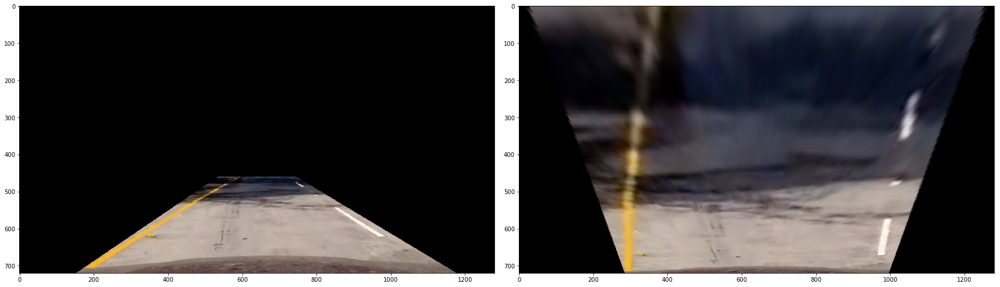

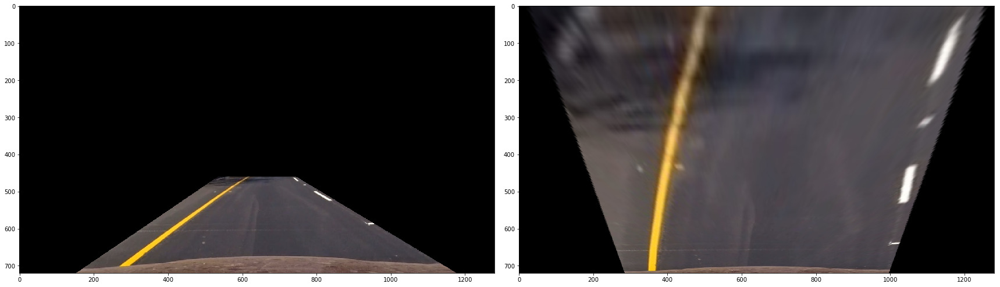

In [18]:
## warping curved lanes
print(vertices)

itest1  = region_of_interest(test1, vertices)
itest2  = region_of_interest(test2, vertices)
itest3  = region_of_interest(test3, vertices)
itest4  = region_of_interest(test4, vertices)
itest5  = region_of_interest(test5, vertices)
itest6  = region_of_interest(test6, vertices)

w_test1 = warp(itest1)
w_test2 = warp(itest2)
w_test3 = warp(itest3)
w_test4 = warp(itest4)
w_test5 = warp(itest5)
w_test6 = warp(itest6)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(itest1, cmap='gray')
ax2.imshow(w_test1, cmap='gray')
f, (ax3,ax4)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(itest2, cmap='gray')
ax4.imshow(w_test2, cmap='gray')
f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(itest3, cmap='gray')
ax6.imshow(w_test3, cmap='gray')
f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(itest4, cmap='gray')
ax8.imshow(w_test4, cmap='gray')
f, (ax9,ax10)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax9.imshow(itest5, cmap='gray')
ax10.imshow(w_test5, cmap='gray')
f, (ax11,ax12) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax11.imshow(itest6, cmap='gray')
ax12.imshow(w_test6, cmap='gray')


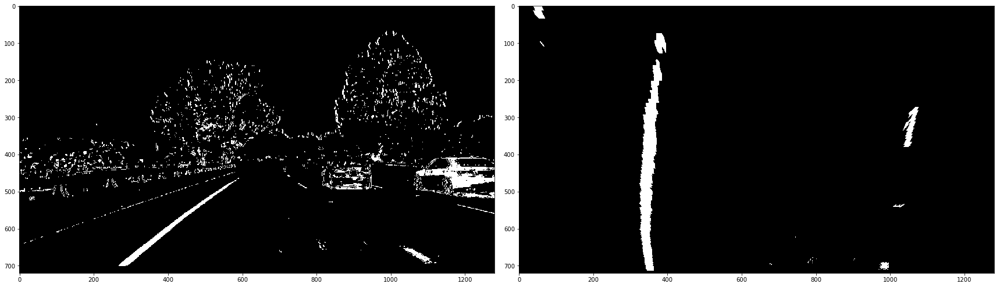

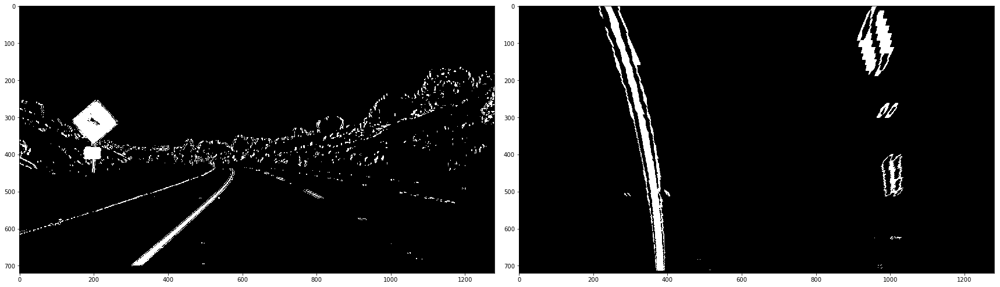

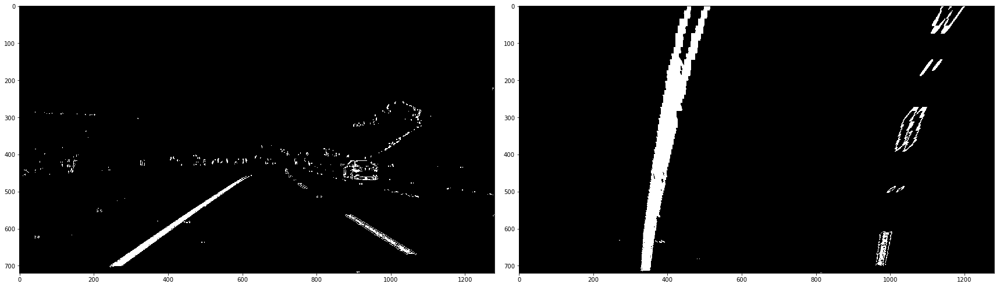

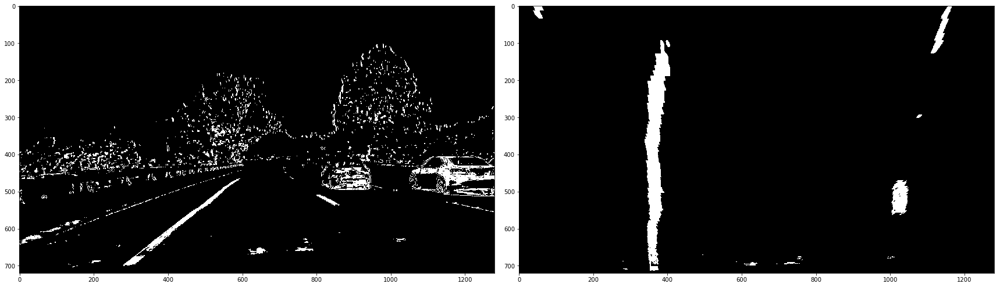

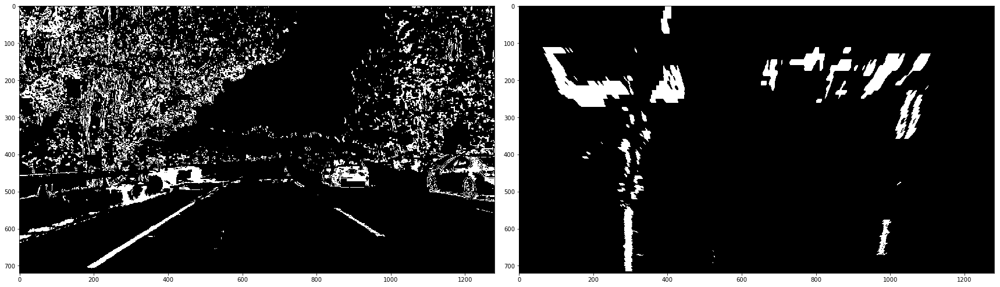

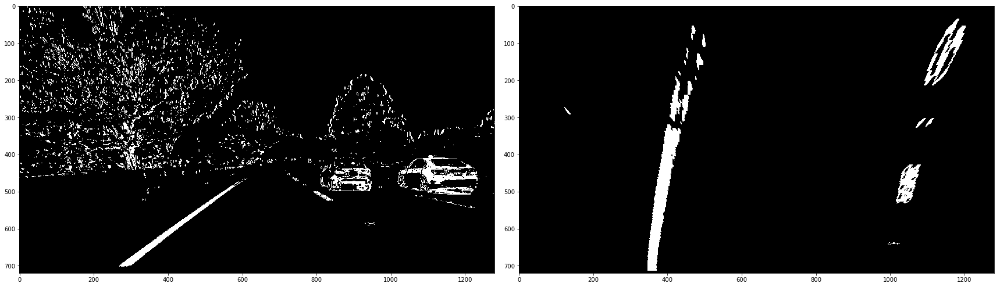

In [19]:
## warping curved lanes
itest1  = region_of_interest(img_test1, vertices)
itest2  = region_of_interest(img_test2, vertices)
itest3  = region_of_interest(img_test3, vertices)
itest4  = region_of_interest(img_test4, vertices)
itest5  = region_of_interest(img_test5, vertices)
itest6  = region_of_interest(img_test6, vertices)

w_test1 = warp(itest1)
w_test2 = warp(itest2)
w_test3 = warp(itest3)
w_test4 = warp(itest4)
w_test5 = warp(itest5)
w_test6 = warp(itest6)

f, (ax1,ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_test1, cmap='gray')
ax2.imshow(w_test1, cmap='gray')
f.savefig('output_images/perspective - 1.png')
f, (ax3,ax4)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(img_test2, cmap='gray')
ax4.imshow(w_test2, cmap='gray')
f.savefig('output_images/perspective - 2.png')
f, (ax5,ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax5.imshow(img_test3, cmap='gray')
ax6.imshow(w_test3, cmap='gray')
f.savefig('output_images/perspective - 3.png')
f, (ax7,ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax7.imshow(img_test4, cmap='gray')
ax8.imshow(w_test4, cmap='gray')
f.savefig('output_images/perspective - 4.png')
f, (ax9,ax10)= plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax9.imshow(img_test5, cmap='gray')
ax10.imshow(w_test5, cmap='gray')
f.savefig('output_images/perspective - 5.png')
f, (ax11,ax12) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax11.imshow(img_test6, cmap='gray')
ax12.imshow(w_test6, cmap='gray')
f.savefig('output_images/perspective - 6.png')


offset: 41.0


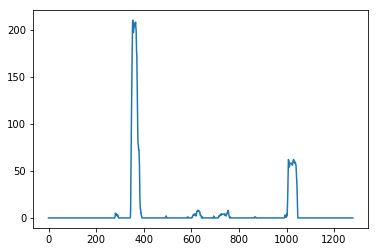

In [20]:
#import numpy as np

#binary_warped = w_img_2
#undist        = testimage2
binary_warped = w_test4
undist        = test4

# This is a parameter that could be adjusted to account for the noise in the warped image, and to easily identify the start of the lane
#histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
histogram = np.sum(binary_warped[500:,:], axis=0)

plt.plot(histogram)
plt.savefig('output_images/histogram.png')

out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#print(out_img.shape)

midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

mid_lane = (rightx_base - leftx_base) / 2 + leftx_base
#print(mid_lane, midpoint)
offset = mid_lane-midpoint
print('offset:',offset)

nwindows = 9

window_height = np.int(binary_warped.shape[0]/nwindows)

nonzero = binary_warped.nonzero()
#print('nonzero',nonzero, 'length',len(nonzero))

nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
#print('nonzerox',nonzerox, len(nonzerox))
#print('nonzeroy',nonzeroy, len(nonzeroy))

leftx_current = leftx_base
rightx_current = rightx_base

wmargin = 100

#could be adjusted to configure sensitivity of detecting the new center of the line
minpix = 50

left_lane_inds = []
right_lane_inds = []


for window in range(nwindows):
    
    win_y_low       = binary_warped.shape[0] - (window+1)*window_height
    win_y_high      = binary_warped.shape[0] - (window)*window_height
    
    win_xleft_low   = leftx_current - wmargin
    win_xleft_high  = leftx_current + wmargin
    
    win_xright_low  = rightx_current - wmargin
    win_xright_high = rightx_current + wmargin
    
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
    
    good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

    #print(len(left_lane_inds))
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
# Concatenate the arrays of indices
#print('left',left_lane_inds)
left_lane_inds  = np.concatenate((left_lane_inds))
right_lane_inds = np.concatenate((right_lane_inds))

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


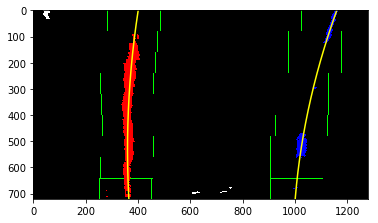

In [21]:
# Generate x and y values for plotting
ploty      = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#print(len(ploty))
left_fitx  = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#print(len(left_fitx),left_fit.shape,left_fit)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]]   = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.savefig('output_images/sliding_window.png')
# Realized that to cancel noise from unwanted objects/lines, we can filter out parts of image, and shorten the horizon for warping


In [22]:
leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

3485.98294202 2600.62660684


In [23]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
print((left_curverad+right_curverad)/2, 'm')
print('offset:',offset*xm_per_pix,' m')

1978.64596156 m 474.951776942 m
1226.79886925 m
offset: 0.216714285714  m


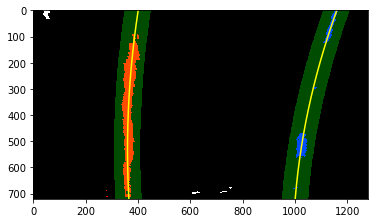

In [24]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.savefig('output_images/warped - 2.png')

left_fitx shape (720,)


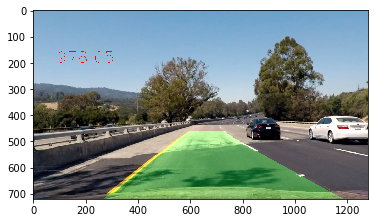

In [25]:

# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
print('left_fitx shape',left_fitx.shape)
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = inv_warp(color_warp)
# Combine the result with the original image
result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
text = '%.2f'%left_curverad
cv2.putText(result,text, (50,200), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)

plt.imshow(result)
plt.savefig('output_images/output - 1.png')

In [26]:
# Import everything needed to edit/save/watch video clips
#from moviepy.editor import VideoFileClip
#from IPython.display import HTML

In [27]:
def c_histogram(img):
    histogram     = np.sum(img[500:,:], axis=0)
    midpoint      = np.int(histogram.shape[0]/2)
    leftx_base    = np.argmax(histogram[:midpoint])
    rightx_base   = np.argmax(histogram[midpoint:]) + midpoint    
    
    mid_lane = (rightx_base - leftx_base) / 2 + leftx_base
    offset     = mid_lane-midpoint
    l_base_pos = midpoint - leftx_base
    r_base_pos = rightx_base - midpoint
    
    return leftx_base, rightx_base, l_base_pos, r_base_pos


def sliding_window(img, leftx_base , rightx_base, nwindows =9, wmargin =100, minpix =50):
    
    window_height  = np.int(img.shape[0]/nwindows)
    
    nonzero        = img.nonzero()
    nonzeroy       = np.array(nonzero[0])
    nonzerox       = np.array(nonzero[1])

    leftx_current  = leftx_base
    rightx_current = rightx_base
    
    left_lane_inds = []
    right_lane_inds = []


    for window in range(nwindows):
    
        win_y_low       = binary_warped.shape[0] - (window+1)*window_height
        win_y_high      = binary_warped.shape[0] - (window)*window_height
    
        win_xleft_low   = leftx_current - wmargin
        win_xleft_high  = leftx_current + wmargin
    
        win_xright_low  = rightx_current - wmargin
        win_xright_high = rightx_current + wmargin
    
        
        good_left_inds  = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

    
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
    
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of indices
    #print('left',left_lane_inds)
    left_lane_inds  = np.concatenate((left_lane_inds))
    right_lane_inds = np.concatenate((right_lane_inds))

    # Extract left and right line pixel positions
    leftx       = nonzerox[left_lane_inds]
    lefty       = nonzeroy[left_lane_inds] 
    rightx      = nonzerox[right_lane_inds]
    righty      = nonzeroy[right_lane_inds] 

    #print(leftx,lefty)
    # Fit a second order polynomial to each
    #left_fit    = np.polyfit(lefty, leftx, 2)
    #right_fit   = np.polyfit(righty, rightx, 2)
    
    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return leftx, lefty, rightx, righty

# note for me: will need to adjust left and right fit data types for the below function
def look_ahead_filter(img, left_fit , right_fit,  margin=100):
    #print('looking ahead, left_fit:',left_fit.shape)
    nonzero         = img.nonzero()
    nonzeroy        = np.array(nonzero[0])
    #print(nonzeroy.shape, nonzeroy)
    nonzerox        = np.array(nonzero[1])
    #print(nonzerox.shape, nonzerox)
    
    left_lane_inds  = [] 
    right_lane_inds = []
    
    left_lane_inds  = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx           = nonzerox[left_lane_inds]
    #print('leftx',leftx.shape,leftx)
    lefty           = nonzeroy[left_lane_inds] 
    #print('lefty',lefty.shape,lefty)
    rightx          = nonzerox[right_lane_inds]
    righty          = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    #n_left_fit        = np.polyfit(lefty, leftx, 2)
    #n_right_fit       = np.polyfit(righty, rightx, 2)
    
    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    #print('leftx: ',leftx, 'lefty: ',lefty)
    return leftx, lefty, rightx, righty
    

    
def radius(leftx, rightx, left_fit, right_fit):
    
    #print(leftx[:10],rightx[:10])
    #ploty      = np.linspace(0, img.shape[0]-1, img.shape[0] )
    
    
    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y
    y_eval = np.max(ploty)
    #left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    #right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    #left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    #right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    
    lx = left_fit_cr[0]*y_eval**2 + left_fit_cr[1]*y_eval + left_fit_cr[2]
    rx = right_fit_cr[0]*y_eval**2 + right_fit_cr[1]*y_eval + right_fit_cr[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    print('distance between 2 lanes:',rx-lx, 'm')
    left  = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    
    midlane = (right - left)/2+left
    car_center   = np.int(img.shape[1]/2)
    #print(midlane, car_center)
    
    offset = (midlane - car_center)*xm_per_pix # positive if closer to the right lane
    d_left = (car_center - left)*xm_per_pix
    d_right = (rx - car_center)*xm_per_pix
    
    return left_curverad, right_curverad, offset, d_left, d_right

    

def prep_img(img):
    
    u_img        = cv2.undistort(img, mtx, dist, None, mtx)
    
    img_sobelx = abs_sobel_thresh(u_img,'x',9,(50,100))

    S, img_clr = clr_threshold(u_img,(150,255))

    lanes_img  = np.zeros_like(img_sobelx)
    lanes_img [((img_sobelx == 1)  | (img_clr == 1))] =1
    
   
    masked_img = region_of_interest(lanes_img,vertices)
    ready_img  = warp(masked_img)
    
    
    
    return ready_img, u_img



        
def draw(u_img, p_img, left_fitx, right_fitx, ploty):
    
    # Create an image to draw the lines on
    #print('p_img shape',p_img.shape)
    warp_zero = np.zeros_like(p_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    #print('clr warp shape', color_warp.shape)

    #print('leftfitx: ',left_fitx.shape,'ploty: ',ploty.shape)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    #print(pts.shape)
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = inv_warp(color_warp) 
    # Combine the result with the original image
    return cv2.addWeighted(u_img, 1, newwarp, 0.3, 0)
def line_fit(leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each
    left_fit    = np.polyfit(lefty, leftx, 2)
    right_fit   = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return left_fit,right_fit,left_fitx, right_fitx
        

def sanity_check():
    # compare ploynomial coeficients for
    # 1. parralellness
    # 2. Sudden big changes or difference from average of last n
    # 3. Distance between lines
    return result

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #ok#polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #ok #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #ok#x values for detected line pixels
        self.allx = None  
        #ok#y values for detected line pixels
        self.ally = None
        self.dist = 640
l_Lane = Line()
r_Lane = Line()
alpha  = 0.8

l_Lane.best_fit = ( -2.36680991e-04,   3.58516845e-01,  2.39878897e+02)
l_Lane.bestx    = l_Lane.best_fit[0]*ploty**2 + l_Lane.best_fit[1]*ploty + l_Lane.best_fit[2]
r_Lane.best_fit = (-1.42300610e-04 ,  1.83509844e-01 ,  9.54616394e+02)
r_Lane.bestx    = r_Lane.best_fit[0]*ploty**2 + r_Lane.best_fit[1]*ploty + r_Lane.best_fit[2]
    
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
    
    
        
    # prepare the image for each frame for further processing
    # return a warped processed image, and an undistorted image
    p_img, u_img  = prep_img(image)
    lx, rx, l_Lane.base_pos,r_Lane.base_pos = c_histogram(p_img)
    
    #1- Find lines
    # Checkpoint, Shall we use sliding window or look_ahead_filter, based on whether we detected previous frame's lane lines
    if (l_Lane.detected == False) | (r_Lane.detected == False):
        #lx, rx, l_Lane.base_pos,r_Lane.base_pos = c_histogram(p_img)
        print('sliding window')
        l_Lane.allx,l_Lane.ally, r_Lane.allx,r_Lane.ally = sliding_window(p_img,lx, rx)
    else:
        print('looking ahead')
        l_Lane.allx,l_Lane.ally, r_Lane.allx,r_Lane.ally = look_ahead_filter(p_img,l_Lane.best_fit, r_Lane.best_fit)
    #2- Check lines found 
    #if lines not found use best fit 
    
    if (l_Lane.allx.size == 0) | (l_Lane.ally.size == 0)|(r_Lane.allx.size == 0) | (r_Lane.ally.size == 0):
        print('Line not detected')
        l_Lane.current_fit = l_Lane.best_fit
        r_Lane.current_fit = r_Lane.best_fit
        l_Lane.detected    = False
        r_Lane.detected    = False
    # 3- Fit a line
    else:
        #fit a new line for found points
        print('fitting new line, leftx: ',l_Lane.allx.shape,'lefty: ',l_Lane.ally.shape)
        print('fitting new line, righttx: ',r_Lane.allx.shape,'righty: ',r_Lane.ally.shape)
        l_Lane.current_fit, r_Lane.current_fit,l_x,r_x = line_fit(l_Lane.allx,l_Lane.ally,r_Lane.allx, r_Lane.ally) #create new function
        #print('Left xfit: ', l_Lane.current_fit)
        #print('Right xfit:' ,r_Lane.current_fit)
        
    # 4- Check if lines look good
    #  if detected lines seem not correct, then use best fit
        thresh = 700
        print('distance',rx-lx, (rx-lx)/l_Lane.dist-1)
        #if ((rx-lx)/l_Lane.dist-1 >thresh)| ((rx-lx)/l_Lane.dist-1 <-thresh):
        if (rx-lx >= 700):
        #disgard this image
            l_Lane.current_fit = l_Lane.best_fit
            r_Lane.current_fit = r_Lane.best_fit
            l_Lane.detected    = False
            r_Lane.detected    = False
        else:
            l_Lane.recent_xfitted.append(l_x)
            r_Lane.recent_xfitted.append(r_x)
            l_Lane.bestx = alpha*l_Lane.bestx + (1-alpha)*l_x
            r_Lane.bestx = alpha*r_Lane.bestx + (1-alpha)*r_x
            l_Lane.detected    = True
            r_Lane.detected    = True
        l_Lane.dist = rx-lx

    
    
    #l_Lane.radius_of_curvature, r_Lane.radius_of_curvature, offset, l_Lane.line_base_pos, r_Lane.line_base_pos  = radius(p_img,l_Lane.allx, l_Lane.ally, r_Lane.allx, r_Lane.ally,l_Lane.current_fit,r_Lane.current_fit)
    l_Lane.radius_of_curvature, r_Lane.radius_of_curvature, offset, l_Lane.line_base_pos, r_Lane.line_base_pos  = radius(l_Lane.bestx,r_Lane.bestx,l_Lane.best_fit,r_Lane.best_fit)

    avg_radius = round((l_Lane.radius_of_curvature+ r_Lane.radius_of_curvature)/2)
    print(avg_radius)
    #l_Lane.bestx = alpha*np.array(l_Lane.bestx)+(1-alpha)*np.array(l_Lane.recent_xfitted[len(l_Lane.recent_xfitted)-1])
    #r_Lane.bestx = alpha*r_Lane.bestx+(1-alpha)*l_Lane.recent_xfitted[len(l_Lane.recent_xfitted)-1]
    #l_Lane.bestx = alpha*l_Lane.bestx + (1-alpha)*l_x
    #r_Lane.bestx = alpha*r_Lane.bestx + (1-alpha)*r_x
    
    
    l_Lane.best_fit = np.polyfit(ploty,l_Lane.bestx,2)
    r_Lane.best_fit = np.polyfit(ploty,r_Lane.bestx,2)
    
    #result = np.zeros((image.shape[0],image.shape[1],3), 'uint8')
    #result[..., 0] = p_img
    #result[..., 1] = p_img
    #result[..., 2] = p_img
    #return result*255
    #cv2.putText(u_img,"Left lane curvature: "+l_Lane.radius_of_curvature +"m, Right Lane curvature" + r_Lane.radius_of_curvature+"m", (50,100), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)
    text1 = 'Curve radius' + '%2f' %avg_radius
    text2 = 'Offset: '+ '%2f' %offset
    cv2.putText(u_img,text1 , (30,100), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)
    cv2.putText(u_img,text2 , (50,150), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)

    return draw(u_img, p_img, l_Lane.bestx, r_Lane.bestx, ploty)





In [32]:
clip1 =[]
output = 'output_videos/output_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
test_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time test_clip.write_videofile(output, audio=False)

looking ahead
fitting new line, leftx:  (21128,) lefty:  (21128,)
fitting new line, righttx:  (9805,) righty:  (9805,)
distance 640 0.247563352827
distance between 2 lanes: 330.066968222 m
1647.0
[MoviePy] >>>> Building video output_videos/project_video_Lanes.mp4
[MoviePy] Writing video output_videos/project_video_Lanes.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

looking ahead
fitting new line, leftx:  (21156,) lefty:  (21156,)
fitting new line, righttx:  (9973,) righty:  (9973,)
distance 640 0.0
distance between 2 lanes: 294.597859247 m
2152.0


  0%|          | 2/1261 [00:02<31:47,  1.51s/it]

looking ahead
fitting new line, leftx:  (21005,) lefty:  (21005,)
fitting new line, righttx:  (9734,) righty:  (9734,)
distance 640 0.0
distance between 2 lanes: 268.47705154 m
6319.0


  0%|          | 3/1261 [00:04<28:56,  1.38s/it]

looking ahead
fitting new line, leftx:  (20337,) lefty:  (20337,)
fitting new line, righttx:  (9101,) righty:  (9101,)
distance 636 -0.00625
distance between 2 lanes: 231.026335293 m
2951.0


  0%|          | 4/1261 [00:04<25:54,  1.24s/it]

looking ahead
fitting new line, leftx:  (20037,) lefty:  (20037,)
fitting new line, righttx:  (9681,) righty:  (9681,)
distance 636 0.0
distance between 2 lanes: 176.753079889 m
1345.0


  0%|          | 5/1261 [00:05<22:51,  1.09s/it]

looking ahead
fitting new line, leftx:  (19638,) lefty:  (19638,)
fitting new line, righttx:  (10486,) righty:  (10486,)
distance 638 0.00314465408805
distance between 2 lanes: 145.660660879 m
1059.0


  0%|          | 6/1261 [00:06<20:47,  1.01it/s]

looking ahead
fitting new line, leftx:  (19187,) lefty:  (19187,)
fitting new line, righttx:  (10923,) righty:  (10923,)
distance 633 -0.00783699059561
distance between 2 lanes: 136.365950699 m
964.0


  1%|          | 7/1261 [00:07<19:20,  1.08it/s]

looking ahead
fitting new line, leftx:  (19197,) lefty:  (19197,)
fitting new line, righttx:  (11013,) righty:  (11013,)
distance 625 -0.0126382306477
distance between 2 lanes: 168.620882744 m
1015.0


  1%|          | 8/1261 [00:07<18:18,  1.14it/s]

looking ahead
fitting new line, leftx:  (19169,) lefty:  (19169,)
fitting new line, righttx:  (10814,) righty:  (10814,)
distance 637 0.0192
distance between 2 lanes: 259.186461911 m
1586.0


  1%|          | 9/1261 [00:08<18:29,  1.13it/s]

looking ahead
fitting new line, leftx:  (19998,) lefty:  (19998,)
fitting new line, righttx:  (10208,) righty:  (10208,)
distance 633 -0.00627943485086
distance between 2 lanes: 333.568777507 m
4528.0


  1%|          | 10/1261 [00:09<18:03,  1.15it/s]

looking ahead
fitting new line, leftx:  (20124,) lefty:  (20124,)
fitting new line, righttx:  (9789,) righty:  (9789,)
distance 632 -0.00157977883096
distance between 2 lanes: 405.632449229 m
3121.0


  1%|          | 11/1261 [00:10<17:23,  1.20it/s]

looking ahead
fitting new line, leftx:  (20221,) lefty:  (20221,)
fitting new line, righttx:  (9622,) righty:  (9622,)
distance 619 -0.0205696202532
distance between 2 lanes: 425.376566751 m
2124.0


  1%|          | 12/1261 [00:11<17:15,  1.21it/s]

looking ahead
fitting new line, leftx:  (20829,) lefty:  (20829,)
fitting new line, righttx:  (9665,) righty:  (9665,)
distance 634 0.0242326332795
distance between 2 lanes: 470.40900523 m
1361.0


  1%|          | 13/1261 [00:12<17:14,  1.21it/s]

looking ahead
fitting new line, leftx:  (20355,) lefty:  (20355,)
fitting new line, righttx:  (9177,) righty:  (9177,)
distance 633 -0.00157728706625
distance between 2 lanes: 412.566920257 m
2085.0


  1%|          | 14/1261 [00:13<18:15,  1.14it/s]

looking ahead
fitting new line, leftx:  (20307,) lefty:  (20307,)
fitting new line, righttx:  (8704,) righty:  (8704,)
distance 634 0.00157977883096
distance between 2 lanes: 369.474565762 m
3610.0


  1%|          | 15/1261 [00:13<18:12,  1.14it/s]

looking ahead
fitting new line, leftx:  (19428,) lefty:  (19428,)
fitting new line, righttx:  (7869,) righty:  (7869,)
distance 628 -0.00946372239748
distance between 2 lanes: 288.779514895 m
4301.0


  1%|▏         | 16/1261 [00:14<18:03,  1.15it/s]

looking ahead
fitting new line, leftx:  (19828,) lefty:  (19828,)
fitting new line, righttx:  (9318,) righty:  (9318,)
distance 627 -0.0015923566879
distance between 2 lanes: 204.696665562 m
1580.0


  1%|▏         | 17/1261 [00:15<17:13,  1.20it/s]

looking ahead
fitting new line, leftx:  (19340,) lefty:  (19340,)
fitting new line, righttx:  (10586,) righty:  (10586,)
distance 624 -0.00478468899522
distance between 2 lanes: 158.512458152 m
1269.0


  1%|▏         | 18/1261 [00:16<16:48,  1.23it/s]

looking ahead
fitting new line, leftx:  (19829,) lefty:  (19829,)
fitting new line, righttx:  (10595,) righty:  (10595,)
distance 625 0.00160256410256
distance between 2 lanes: 134.283497064 m
1198.0


  2%|▏         | 19/1261 [00:17<17:26,  1.19it/s]

looking ahead
fitting new line, leftx:  (19767,) lefty:  (19767,)
fitting new line, righttx:  (10689,) righty:  (10689,)
distance 626 0.0016
distance between 2 lanes: 122.880544643 m
1194.0


  2%|▏         | 20/1261 [00:18<17:08,  1.21it/s]

looking ahead
fitting new line, leftx:  (19330,) lefty:  (19330,)
fitting new line, righttx:  (10935,) righty:  (10935,)
distance 623 -0.00479233226837
distance between 2 lanes: 129.237006275 m
1288.0


  2%|▏         | 21/1261 [00:18<17:20,  1.19it/s]

looking ahead
fitting new line, leftx:  (19634,) lefty:  (19634,)
fitting new line, righttx:  (10708,) righty:  (10708,)
distance 616 -0.0112359550562
distance between 2 lanes: 176.475240791 m
1862.0


  2%|▏         | 22/1261 [00:19<17:25,  1.19it/s]

looking ahead
fitting new line, leftx:  (20771,) lefty:  (20771,)
fitting new line, righttx:  (10919,) righty:  (10919,)
distance 627 0.0178571428571
distance between 2 lanes: 204.88689151 m
3039.0


  2%|▏         | 23/1261 [00:20<16:45,  1.23it/s]

looking ahead
fitting new line, leftx:  (20442,) lefty:  (20442,)
fitting new line, righttx:  (10744,) righty:  (10744,)
distance 632 0.00797448165869
distance between 2 lanes: 220.289563834 m
6237.0


  2%|▏         | 24/1261 [00:21<16:31,  1.25it/s]

looking ahead
fitting new line, leftx:  (21024,) lefty:  (21024,)
fitting new line, righttx:  (9726,) righty:  (9726,)
distance 637 0.00791139240506
distance between 2 lanes: 231.184845464 m
9888.0


  2%|▏         | 25/1261 [00:22<16:25,  1.25it/s]

looking ahead
fitting new line, leftx:  (21937,) lefty:  (21937,)
fitting new line, righttx:  (9368,) righty:  (9368,)
distance 631 -0.0094191522763
distance between 2 lanes: 198.911034018 m
3138.0


  2%|▏         | 26/1261 [00:22<16:54,  1.22it/s]

looking ahead
fitting new line, leftx:  (21288,) lefty:  (21288,)
fitting new line, righttx:  (9479,) righty:  (9479,)
distance 641 0.0158478605388
distance between 2 lanes: 176.755508276 m
2167.0


  2%|▏         | 27/1261 [00:23<16:24,  1.25it/s]

looking ahead
fitting new line, leftx:  (20385,) lefty:  (20385,)
fitting new line, righttx:  (8488,) righty:  (8488,)
distance 640 -0.0015600624025
distance between 2 lanes: 146.339180891 m
1673.0


  2%|▏         | 28/1261 [00:24<16:00,  1.28it/s]

looking ahead
fitting new line, leftx:  (21262,) lefty:  (21262,)
fitting new line, righttx:  (8732,) righty:  (8732,)
distance 651 0.0171875
distance between 2 lanes: 128.543502646 m
1480.0


  2%|▏         | 29/1261 [00:25<16:18,  1.26it/s]

looking ahead
fitting new line, leftx:  (21300,) lefty:  (21300,)
fitting new line, righttx:  (7941,) righty:  (7941,)
distance 644 -0.010752688172
distance between 2 lanes: 109.524755211 m
1302.0


  2%|▏         | 30/1261 [00:26<16:13,  1.26it/s]

looking ahead
fitting new line, leftx:  (20580,) lefty:  (20580,)
fitting new line, righttx:  (8008,) righty:  (8008,)
distance 638 -0.00931677018634
distance between 2 lanes: 67.1795107154 m
1069.0


  2%|▏         | 31/1261 [00:26<15:58,  1.28it/s]

looking ahead
fitting new line, leftx:  (21291,) lefty:  (21291,)
fitting new line, righttx:  (9912,) righty:  (9912,)
distance 643 0.00783699059561
distance between 2 lanes: 39.8378771488 m
959.0


  3%|▎         | 32/1261 [00:27<15:54,  1.29it/s]

looking ahead
fitting new line, leftx:  (20186,) lefty:  (20186,)
fitting new line, righttx:  (10168,) righty:  (10168,)
distance 641 -0.00311041990669
distance between 2 lanes: 48.7402216074 m
921.0


  3%|▎         | 33/1261 [00:28<15:53,  1.29it/s]

looking ahead
fitting new line, leftx:  (20709,) lefty:  (20709,)
fitting new line, righttx:  (10644,) righty:  (10644,)
distance 634 -0.0109204368175
distance between 2 lanes: 85.7308101903 m
962.0


  3%|▎         | 34/1261 [00:29<15:43,  1.30it/s]

looking ahead
fitting new line, leftx:  (20901,) lefty:  (20901,)
fitting new line, righttx:  (9918,) righty:  (9918,)
distance 638 0.00630914826498
distance between 2 lanes: 151.679277903 m
1091.0


  3%|▎         | 35/1261 [00:29<15:30,  1.32it/s]

looking ahead
fitting new line, leftx:  (20707,) lefty:  (20707,)
fitting new line, righttx:  (9818,) righty:  (9818,)
distance 633 -0.00783699059561
distance between 2 lanes: 213.219129866 m
1329.0


  3%|▎         | 36/1261 [00:30<15:20,  1.33it/s]

looking ahead
fitting new line, leftx:  (19750,) lefty:  (19750,)
fitting new line, righttx:  (8417,) righty:  (8417,)
distance 631 -0.00315955766193
distance between 2 lanes: 254.614043355 m
1550.0


  3%|▎         | 37/1261 [00:31<15:54,  1.28it/s]

looking ahead
fitting new line, leftx:  (20507,) lefty:  (20507,)
fitting new line, righttx:  (7751,) righty:  (7751,)
distance 629 -0.00316957210777
distance between 2 lanes: 275.629275339 m
1621.0


  3%|▎         | 38/1261 [00:32<15:43,  1.30it/s]

looking ahead
fitting new line, leftx:  (20566,) lefty:  (20566,)
fitting new line, righttx:  (8362,) righty:  (8362,)
distance 628 -0.00158982511924
distance between 2 lanes: 277.599602119 m
1422.0


  3%|▎         | 39/1261 [00:33<16:17,  1.25it/s]

looking ahead
fitting new line, leftx:  (20398,) lefty:  (20398,)
fitting new line, righttx:  (8442,) righty:  (8442,)
distance 624 -0.00636942675159
distance between 2 lanes: 247.771313315 m
1076.0


  3%|▎         | 40/1261 [00:33<15:58,  1.27it/s]

looking ahead
fitting new line, leftx:  (20928,) lefty:  (20928,)
fitting new line, righttx:  (8079,) righty:  (8079,)
distance 627 0.00480769230769
distance between 2 lanes: 221.76693086 m
916.0


  3%|▎         | 41/1261 [00:34<16:56,  1.20it/s]

looking ahead
fitting new line, leftx:  (19764,) lefty:  (19764,)
fitting new line, righttx:  (8698,) righty:  (8698,)
distance 628 0.00159489633174
distance between 2 lanes: 193.524722879 m
806.0


  3%|▎         | 42/1261 [00:35<16:39,  1.22it/s]

looking ahead
fitting new line, leftx:  (19544,) lefty:  (19544,)
fitting new line, righttx:  (10324,) righty:  (10324,)
distance 629 0.0015923566879
distance between 2 lanes: 164.108499457 m
727.0


  3%|▎         | 43/1261 [00:36<16:41,  1.22it/s]

looking ahead
fitting new line, leftx:  (19354,) lefty:  (19354,)
fitting new line, righttx:  (10249,) righty:  (10249,)
distance 631 0.00317965023847
distance between 2 lanes: 143.468708886 m
685.0


  3%|▎         | 44/1261 [00:37<16:36,  1.22it/s]

looking ahead
fitting new line, leftx:  (19840,) lefty:  (19840,)
fitting new line, righttx:  (10590,) righty:  (10590,)
distance 631 0.0
distance between 2 lanes: 124.492403278 m
667.0
looking ahead
fitting new line, leftx:  (20490,) lefty:  (20490,)
fitting new line, righttx:  (10686,) righty:  (10686,)
distance 631 0.0
distance between 2 lanes: 120.167199756 m
664.0


  4%|▎         | 46/1261 [00:39<19:23,  1.04it/s]

looking ahead
fitting new line, leftx:  (19979,) lefty:  (19979,)
fitting new line, righttx:  (10947,) righty:  (10947,)
distance 621 -0.0158478605388
distance between 2 lanes: 172.74209461 m
747.0
looking ahead
fitting new line, leftx:  (20447,) lefty:  (20447,)
fitting new line, righttx:  (10387,) righty:  (10387,)
distance 635 0.0225442834138
distance between 2 lanes: 222.971715196 m
878.0


  4%|▍         | 48/1261 [00:41<21:31,  1.06s/it]

looking ahead
fitting new line, leftx:  (20322,) lefty:  (20322,)
fitting new line, righttx:  (9652,) righty:  (9652,)
distance 631 -0.00629921259843
distance between 2 lanes: 260.538463326 m
1041.0
looking ahead
fitting new line, leftx:  (20817,) lefty:  (20817,)
fitting new line, righttx:  (9124,) righty:  (9124,)
distance 631 0.0
distance between 2 lanes: 299.180544664 m
1289.0


  4%|▍         | 49/1261 [00:43<23:24,  1.16s/it]

looking ahead
fitting new line, leftx:  (21315,) lefty:  (21315,)
fitting new line, righttx:  (8777,) righty:  (8777,)
distance 630 -0.00158478605388
distance between 2 lanes: 270.252562528 m
1177.0


  4%|▍         | 51/1261 [00:45<23:28,  1.16s/it]

looking ahead
fitting new line, leftx:  (20484,) lefty:  (20484,)
fitting new line, righttx:  (9371,) righty:  (9371,)
distance 630 0.0
distance between 2 lanes: 239.673718351 m
1115.0


  4%|▍         | 52/1261 [00:46<22:29,  1.12s/it]

looking ahead
fitting new line, leftx:  (20433,) lefty:  (20433,)
fitting new line, righttx:  (8403,) righty:  (8403,)
distance 628 -0.0031746031746
distance between 2 lanes: 221.329331552 m
1096.0
looking ahead
fitting new line, leftx:  (20356,) lefty:  (20356,)
fitting new line, righttx:  (8967,) righty:  (8967,)
distance 625 -0.00477707006369
distance between 2 lanes: 152.945346633 m
925.0


  4%|▍         | 54/1261 [00:48<23:13,  1.15s/it]

looking ahead
fitting new line, leftx:  (19996,) lefty:  (19996,)
fitting new line, righttx:  (10058,) righty:  (10058,)
distance 627 0.0032
distance between 2 lanes: 70.5301900565 m
821.0
looking ahead
fitting new line, leftx:  (20701,) lefty:  (20701,)
fitting new line, righttx:  (10606,) righty:  (10606,)
distance 628 0.00159489633174
distance between 2 lanes: 19.0599955441 m
797.0


  4%|▍         | 55/1261 [00:50<26:27,  1.32s/it]

looking ahead
fitting new line, leftx:  (20510,) lefty:  (20510,)
fitting new line, righttx:  (10471,) righty:  (10471,)
distance 637 0.0143312101911
distance between 2 lanes: -19.8061439748 m
809.0


  4%|▍         | 56/1261 [00:51<24:47,  1.23s/it]

looking ahead
fitting new line, leftx:  (20747,) lefty:  (20747,)
fitting new line, righttx:  (10506,) righty:  (10506,)
distance 635 -0.00313971742543
distance between 2 lanes: -28.2335827106 m
840.0


  5%|▍         | 58/1261 [00:53<21:07,  1.05s/it]

looking ahead
fitting new line, leftx:  (21025,) lefty:  (21025,)
fitting new line, righttx:  (10868,) righty:  (10868,)
distance 622 -0.0204724409449
distance between 2 lanes: 23.9280292149 m
977.0


  5%|▍         | 59/1261 [00:54<20:14,  1.01s/it]

looking ahead
fitting new line, leftx:  (20139,) lefty:  (20139,)
fitting new line, righttx:  (9989,) righty:  (9989,)
distance 622 0.0
distance between 2 lanes: 96.7411226794 m
1236.0
looking ahead
fitting new line, leftx:  (19679,) lefty:  (19679,)
fitting new line, righttx:  (9345,) righty:  (9345,)
distance 619 -0.0048231511254
distance between 2 lanes: 101.087460959 m
1249.0


  5%|▍         | 61/1261 [00:56<20:04,  1.00s/it]

looking ahead
fitting new line, leftx:  (20038,) lefty:  (20038,)
fitting new line, righttx:  (8998,) righty:  (8998,)
distance 617 -0.0032310177706
distance between 2 lanes: 122.471937326 m
1290.0
looking ahead
fitting new line, leftx:  (19917,) lefty:  (19917,)
fitting new line, righttx:  (8245,) righty:  (8245,)
distance 614 -0.00486223662885
distance between 2 lanes: 115.594084193 m
1170.0


  5%|▍         | 62/1261 [00:57<21:29,  1.08s/it]

looking ahead
fitting new line, leftx:  (19733,) lefty:  (19733,)
fitting new line, righttx:  (8603,) righty:  (8603,)
distance 619 0.00814332247557
distance between 2 lanes: 101.852437442 m
1082.0


  5%|▍         | 63/1261 [00:58<21:36,  1.08s/it]

looking ahead
fitting new line, leftx:  (19399,) lefty:  (19399,)
fitting new line, righttx:  (9061,) righty:  (9061,)
distance 619 0.0
distance between 2 lanes: 59.1271429309 m
942.0


  5%|▌         | 64/1261 [01:00<25:15,  1.27s/it]

looking ahead
fitting new line, leftx:  (19580,) lefty:  (19580,)
fitting new line, righttx:  (9242,) righty:  (9242,)
distance 623 0.0064620355412
distance between 2 lanes: 36.6647299824 m
866.0


  5%|▌         | 65/1261 [01:02<30:10,  1.51s/it]

looking ahead
fitting new line, leftx:  (20033,) lefty:  (20033,)
fitting new line, righttx:  (10270,) righty:  (10270,)
distance 625 0.00321027287319
distance between 2 lanes: 22.6061732697 m
826.0


  5%|▌         | 66/1261 [01:04<33:00,  1.66s/it]

looking ahead
fitting new line, leftx:  (20710,) lefty:  (20710,)
fitting new line, righttx:  (10056,) righty:  (10056,)
distance 621 -0.0064
distance between 2 lanes: 24.3995522139 m
816.0


  5%|▌         | 67/1261 [01:06<32:42,  1.64s/it]

looking ahead
fitting new line, leftx:  (22154,) lefty:  (22154,)
fitting new line, righttx:  (9728,) righty:  (9728,)
distance 624 0.0048309178744
distance between 2 lanes: 33.839723144 m
827.0


  5%|▌         | 68/1261 [01:07<29:17,  1.47s/it]

looking ahead
fitting new line, leftx:  (22075,) lefty:  (22075,)
fitting new line, righttx:  (10047,) righty:  (10047,)
distance 628 0.00641025641026
distance between 2 lanes: 44.4714235965 m
851.0


  6%|▌         | 70/1261 [01:08<22:47,  1.15s/it]

looking ahead
fitting new line, leftx:  (23528,) lefty:  (23528,)
fitting new line, righttx:  (9732,) righty:  (9732,)
distance 632 0.00636942675159
distance between 2 lanes: 67.6807574507 m
911.0


  6%|▌         | 71/1261 [01:09<21:02,  1.06s/it]

looking ahead
fitting new line, leftx:  (23716,) lefty:  (23716,)
fitting new line, righttx:  (9170,) righty:  (9170,)
distance 613 -0.0300632911392
distance between 2 lanes: 129.951747813 m
1116.0


  6%|▌         | 72/1261 [01:10<19:56,  1.01s/it]

looking ahead
fitting new line, leftx:  (23008,) lefty:  (23008,)
fitting new line, righttx:  (8907,) righty:  (8907,)
distance 618 0.00815660685155
distance between 2 lanes: 163.637617078 m
1381.0


  6%|▌         | 73/1261 [01:11<19:44,  1.00it/s]

looking ahead
fitting new line, leftx:  (24688,) lefty:  (24688,)
fitting new line, righttx:  (8477,) righty:  (8477,)
distance 622 0.00647249190939
distance between 2 lanes: 173.417034904 m
1678.0


  6%|▌         | 74/1261 [01:12<18:40,  1.06it/s]

looking ahead
fitting new line, leftx:  (25659,) lefty:  (25659,)
fitting new line, righttx:  (8642,) righty:  (8642,)
distance 621 -0.0016077170418
distance between 2 lanes: 156.509267287 m
1694.0
looking ahead
fitting new line, leftx:  (26525,) lefty:  (26525,)
fitting new line, righttx:  (8304,) righty:  (8304,)
distance 621 0.0
distance between 2 lanes: 155.379128167 m
1918.0


  6%|▌         | 76/1261 [01:14<18:18,  1.08it/s]

looking ahead
fitting new line, leftx:  (27246,) lefty:  (27246,)
fitting new line, righttx:  (7769,) righty:  (7769,)
distance 618 -0.0048309178744
distance between 2 lanes: 142.549628341 m
2019.0


  6%|▌         | 77/1261 [01:15<17:50,  1.11it/s]

looking ahead
fitting new line, leftx:  (27687,) lefty:  (27687,)
fitting new line, righttx:  (7986,) righty:  (7986,)
distance 625 0.0113268608414
distance between 2 lanes: 127.751133811 m
2159.0


  6%|▌         | 78/1261 [01:15<17:29,  1.13it/s]

looking ahead
fitting new line, leftx:  (29950,) lefty:  (29950,)
fitting new line, righttx:  (8192,) righty:  (8192,)
distance 632 0.0112
distance between 2 lanes: 64.9440111441 m
1695.0


  6%|▋         | 79/1261 [01:16<17:20,  1.14it/s]

looking ahead
fitting new line, leftx:  (30145,) lefty:  (30145,)
fitting new line, righttx:  (8803,) righty:  (8803,)
distance 634 0.00316455696203
distance between 2 lanes: -9.31667946619 m
1436.0


  6%|▋         | 80/1261 [01:17<17:07,  1.15it/s]

looking ahead
fitting new line, leftx:  (30007,) lefty:  (30007,)
fitting new line, righttx:  (9461,) righty:  (9461,)
distance 635 0.00157728706625
distance between 2 lanes: -70.2456959474 m
1361.0


  6%|▋         | 81/1261 [01:18<16:54,  1.16it/s]

looking ahead
fitting new line, leftx:  (30790,) lefty:  (30790,)
fitting new line, righttx:  (10282,) righty:  (10282,)
distance 633 -0.00314960629921
distance between 2 lanes: -101.429718483 m
1344.0


  7%|▋         | 82/1261 [01:19<16:52,  1.16it/s]

looking ahead
fitting new line, leftx:  (30431,) lefty:  (30431,)
fitting new line, righttx:  (10690,) righty:  (10690,)
distance 634 0.00157977883096
distance between 2 lanes: -115.266437521 m
1351.0


  7%|▋         | 83/1261 [01:20<16:45,  1.17it/s]

looking ahead
fitting new line, leftx:  (29247,) lefty:  (29247,)
fitting new line, righttx:  (10422,) righty:  (10422,)
distance 632 -0.00315457413249
distance between 2 lanes: -96.6153753686 m
1390.0


  7%|▋         | 84/1261 [01:20<16:24,  1.20it/s]

looking ahead
fitting new line, leftx:  (28104,) lefty:  (28104,)
fitting new line, righttx:  (10932,) righty:  (10932,)
distance 641 0.0142405063291
distance between 2 lanes: -34.0530824081 m
1569.0


  7%|▋         | 85/1261 [01:21<16:23,  1.20it/s]

looking ahead
fitting new line, leftx:  (27237,) lefty:  (27237,)
fitting new line, righttx:  (11139,) righty:  (11139,)
distance 653 0.01872074883
distance between 2 lanes: 32.8359206794 m
1878.0


  7%|▋         | 86/1261 [01:22<16:21,  1.20it/s]

looking ahead
fitting new line, leftx:  (26988,) lefty:  (26988,)
fitting new line, righttx:  (10343,) righty:  (10343,)
distance 652 -0.00153139356815
distance between 2 lanes: 93.1387904596 m
2490.0


  7%|▋         | 87/1261 [01:23<16:51,  1.16it/s]

looking ahead
fitting new line, leftx:  (24963,) lefty:  (24963,)
fitting new line, righttx:  (9203,) righty:  (9203,)
distance 645 -0.010736196319
distance between 2 lanes: 90.8781345978 m
2079.0


  7%|▋         | 88/1261 [01:24<16:52,  1.16it/s]

looking ahead
fitting new line, leftx:  (25577,) lefty:  (25577,)
fitting new line, righttx:  (8388,) righty:  (8388,)
distance 631 -0.0217054263566
distance between 2 lanes: 126.149405321 m
2198.0


  7%|▋         | 89/1261 [01:25<17:11,  1.14it/s]

looking ahead
fitting new line, leftx:  (23769,) lefty:  (23769,)
fitting new line, righttx:  (8104,) righty:  (8104,)
distance 634 0.00475435816165
distance between 2 lanes: 122.808930601 m
1658.0


  7%|▋         | 90/1261 [01:26<16:42,  1.17it/s]

looking ahead
fitting new line, leftx:  (24094,) lefty:  (24094,)
fitting new line, righttx:  (8826,) righty:  (8826,)
distance 629 -0.00788643533123
distance between 2 lanes: 82.1883286535 m
1225.0


  7%|▋         | 91/1261 [01:27<16:50,  1.16it/s]

looking ahead
fitting new line, leftx:  (25273,) lefty:  (25273,)
fitting new line, righttx:  (9887,) righty:  (9887,)
distance 633 0.00635930047695
distance between 2 lanes: 60.4962149442 m
1054.0


  7%|▋         | 92/1261 [01:27<16:33,  1.18it/s]

looking ahead
fitting new line, leftx:  (24748,) lefty:  (24748,)
fitting new line, righttx:  (10205,) righty:  (10205,)
distance 636 0.00473933649289
distance between 2 lanes: 49.5995823093 m
971.0
looking ahead
fitting new line, leftx:  (22333,) lefty:  (22333,)
fitting new line, righttx:  (10587,) righty:  (10587,)
distance 635 -0.00157232704403
distance between 2 lanes: 60.0468662343 m
928.0


  7%|▋         | 93/1261 [01:28<17:44,  1.10it/s]

looking ahead
fitting new line, leftx:  (24257,) lefty:  (24257,)
fitting new line, righttx:  (10636,) righty:  (10636,)
distance 630 -0.00787401574803
distance between 2 lanes: 71.5147555864 m
904.0


  8%|▊         | 95/1261 [01:31<19:08,  1.02it/s]

looking ahead
fitting new line, leftx:  (23969,) lefty:  (23969,)
fitting new line, righttx:  (10092,) righty:  (10092,)
distance 632 0.0031746031746
distance between 2 lanes: 89.8113780702 m
912.0
looking ahead
fitting new line, leftx:  (24626,) lefty:  (24626,)
fitting new line, righttx:  (9935,) righty:  (9935,)
distance 612 -0.0316455696203
distance between 2 lanes: 147.883355365 m
1041.0


  8%|▊         | 96/1261 [01:32<19:47,  1.02s/it]

looking ahead
fitting new line, leftx:  (23833,) lefty:  (23833,)
fitting new line, righttx:  (9466,) righty:  (9466,)
distance 627 0.0245098039216
distance between 2 lanes: 187.146465799 m
1186.0


  8%|▊         | 97/1261 [01:33<20:49,  1.07s/it]

looking ahead
fitting new line, leftx:  (22949,) lefty:  (22949,)
fitting new line, righttx:  (9448,) righty:  (9448,)
distance 622 -0.00797448165869
distance between 2 lanes: 227.378947518 m
1470.0


  8%|▊         | 99/1261 [01:35<22:52,  1.18s/it]

looking ahead
fitting new line, leftx:  (23619,) lefty:  (23619,)
fitting new line, righttx:  (8337,) righty:  (8337,)
distance 621 -0.0016077170418
distance between 2 lanes: 267.536838456 m
2022.0


  8%|▊         | 100/1261 [01:37<22:24,  1.16s/it]

looking ahead
fitting new line, leftx:  (22787,) lefty:  (22787,)
fitting new line, righttx:  (9036,) righty:  (9036,)
distance 623 0.00322061191626
distance between 2 lanes: 233.591405164 m
1548.0


  8%|▊         | 101/1261 [01:37<20:51,  1.08s/it]

looking ahead
fitting new line, leftx:  (21413,) lefty:  (21413,)
fitting new line, righttx:  (8101,) righty:  (8101,)
distance 630 0.0112359550562
distance between 2 lanes: 204.833367664 m
1304.0


  8%|▊         | 102/1261 [01:38<19:44,  1.02s/it]

looking ahead
fitting new line, leftx:  (23754,) lefty:  (23754,)
fitting new line, righttx:  (7852,) righty:  (7852,)
distance 625 -0.00793650793651
distance between 2 lanes: 161.98975765 m
1087.0


  8%|▊         | 103/1261 [01:39<18:30,  1.04it/s]

looking ahead
fitting new line, leftx:  (22494,) lefty:  (22494,)
fitting new line, righttx:  (8782,) righty:  (8782,)
distance 632 0.0112
distance between 2 lanes: 98.9490392609 m
911.0


  8%|▊         | 104/1261 [01:40<17:30,  1.10it/s]

looking ahead
fitting new line, leftx:  (21417,) lefty:  (21417,)
fitting new line, righttx:  (8937,) righty:  (8937,)
distance 630 -0.00316455696203
distance between 2 lanes: 47.5142181809 m
828.0


  8%|▊         | 105/1261 [01:41<17:02,  1.13it/s]

looking ahead
fitting new line, leftx:  (21374,) lefty:  (21374,)
fitting new line, righttx:  (9362,) righty:  (9362,)
distance 627 -0.0047619047619
distance between 2 lanes: 10.421075775 m
800.0


  8%|▊         | 106/1261 [01:42<16:28,  1.17it/s]

looking ahead
fitting new line, leftx:  (23577,) lefty:  (23577,)
fitting new line, righttx:  (9563,) righty:  (9563,)
distance 622 -0.00797448165869
distance between 2 lanes: -8.4919959892 m
797.0


  8%|▊         | 107/1261 [01:42<16:14,  1.18it/s]

looking ahead
fitting new line, leftx:  (23339,) lefty:  (23339,)
fitting new line, righttx:  (10142,) righty:  (10142,)
distance 629 0.0112540192926
distance between 2 lanes: -22.2897764827 m
798.0


  9%|▊         | 108/1261 [01:43<16:09,  1.19it/s]

looking ahead
fitting new line, leftx:  (22318,) lefty:  (22318,)
fitting new line, righttx:  (10404,) righty:  (10404,)
distance 624 -0.00794912559618
distance between 2 lanes: 0.803702876117 m
818.0


  9%|▊         | 109/1261 [01:44<15:56,  1.20it/s]

looking ahead
fitting new line, leftx:  (20740,) lefty:  (20740,)
fitting new line, righttx:  (11091,) righty:  (11091,)
distance 622 -0.00320512820513
distance between 2 lanes: 75.3380005237 m
933.0


  9%|▊         | 110/1261 [01:45<16:07,  1.19it/s]

looking ahead
fitting new line, leftx:  (21424,) lefty:  (21424,)
fitting new line, righttx:  (10515,) righty:  (10515,)
distance 637 0.024115755627
distance between 2 lanes: 157.194540064 m
1168.0


  9%|▉         | 111/1261 [01:46<16:08,  1.19it/s]

looking ahead
fitting new line, leftx:  (22290,) lefty:  (22290,)
fitting new line, righttx:  (9387,) righty:  (9387,)
distance 637 0.0
distance between 2 lanes: 202.550343467 m
1367.0


  9%|▉         | 112/1261 [01:47<15:59,  1.20it/s]

looking ahead
fitting new line, leftx:  (22239,) lefty:  (22239,)
fitting new line, righttx:  (10171,) righty:  (10171,)
distance 644 0.010989010989
distance between 2 lanes: 251.550032063 m
1852.0


  9%|▉         | 113/1261 [01:48<18:26,  1.04it/s]

looking ahead
fitting new line, leftx:  (24418,) lefty:  (24418,)
fitting new line, righttx:  (8958,) righty:  (8958,)
distance 632 -0.0186335403727
distance between 2 lanes: 230.859673735 m
1498.0


  9%|▉         | 114/1261 [01:49<19:13,  1.01s/it]

looking ahead
fitting new line, leftx:  (22421,) lefty:  (22421,)
fitting new line, righttx:  (8869,) righty:  (8869,)
distance 631 -0.00158227848101
distance between 2 lanes: 191.976450056 m
1150.0


  9%|▉         | 115/1261 [01:50<18:21,  1.04it/s]

looking ahead
fitting new line, leftx:  (22125,) lefty:  (22125,)
fitting new line, righttx:  (8059,) righty:  (8059,)
distance 631 0.0
distance between 2 lanes: 157.282418183 m
978.0


  9%|▉         | 116/1261 [01:51<17:33,  1.09it/s]

looking ahead
fitting new line, leftx:  (22215,) lefty:  (22215,)
fitting new line, righttx:  (8913,) righty:  (8913,)
distance 627 -0.00633914421553
distance between 2 lanes: 112.145786264 m
839.0


  9%|▉         | 117/1261 [01:51<16:52,  1.13it/s]

looking ahead
fitting new line, leftx:  (21978,) lefty:  (21978,)
fitting new line, righttx:  (9068,) righty:  (9068,)
distance 629 0.00318979266348
distance between 2 lanes: 80.1064519166 m
770.0
looking ahead
fitting new line, leftx:  (23548,) lefty:  (23548,)
fitting new line, righttx:  (10542,) righty:  (10542,)
distance 626 -0.00476947535771
distance between 2 lanes: 51.3060635624 m
737.0


  9%|▉         | 119/1261 [01:53<17:00,  1.12it/s]

looking ahead
fitting new line, leftx:  (22003,) lefty:  (22003,)
fitting new line, righttx:  (10648,) righty:  (10648,)
distance 626 0.0
distance between 2 lanes: 24.3278416404 m
709.0


 10%|▉         | 120/1261 [01:54<17:10,  1.11it/s]

looking ahead
fitting new line, leftx:  (22047,) lefty:  (22047,)
fitting new line, righttx:  (9904,) righty:  (9904,)
distance 622 -0.00638977635783
distance between 2 lanes: 10.2219897929 m
687.0


 10%|▉         | 121/1261 [01:55<17:33,  1.08it/s]

looking ahead
fitting new line, leftx:  (23034,) lefty:  (23034,)
fitting new line, righttx:  (9488,) righty:  (9488,)
distance 622 0.0
distance between 2 lanes: 24.817228598 m
695.0


 10%|▉         | 122/1261 [01:56<17:19,  1.10it/s]

looking ahead
fitting new line, leftx:  (23533,) lefty:  (23533,)
fitting new line, righttx:  (8815,) righty:  (8815,)
distance 627 0.008038585209
distance between 2 lanes: 54.6487792008 m
713.0


 10%|▉         | 123/1261 [01:57<17:04,  1.11it/s]

looking ahead
fitting new line, leftx:  (22836,) lefty:  (22836,)
fitting new line, righttx:  (8183,) righty:  (8183,)
distance 617 -0.0159489633174
distance between 2 lanes: 65.1981037643 m
707.0


 10%|▉         | 124/1261 [01:58<16:33,  1.14it/s]

looking ahead
fitting new line, leftx:  (21967,) lefty:  (21967,)
fitting new line, righttx:  (7650,) righty:  (7650,)
distance 618 0.00162074554295
distance between 2 lanes: 88.8192790717 m
723.0


 10%|▉         | 125/1261 [01:59<16:23,  1.15it/s]

looking ahead
fitting new line, leftx:  (22424,) lefty:  (22424,)
fitting new line, righttx:  (7410,) righty:  (7410,)
distance 617 -0.00161812297735
distance between 2 lanes: 90.2476513639 m
719.0


 10%|▉         | 126/1261 [01:59<16:09,  1.17it/s]

looking ahead
fitting new line, leftx:  (23341,) lefty:  (23341,)
fitting new line, righttx:  (7636,) righty:  (7636,)
distance 623 0.0097244732577
distance between 2 lanes: 95.9077296453 m
729.0


 10%|█         | 127/1261 [02:00<15:55,  1.19it/s]

looking ahead
fitting new line, leftx:  (23327,) lefty:  (23327,)
fitting new line, righttx:  (7792,) righty:  (7792,)
distance 623 0.0
distance between 2 lanes: 72.7447757041 m
696.0


 10%|█         | 128/1261 [02:01<16:00,  1.18it/s]

looking ahead
fitting new line, leftx:  (24589,) lefty:  (24589,)
fitting new line, righttx:  (7926,) righty:  (7926,)
distance 624 0.0016051364366
distance between 2 lanes: 64.1742879337 m
685.0


 10%|█         | 129/1261 [02:02<16:01,  1.18it/s]

looking ahead
fitting new line, leftx:  (24100,) lefty:  (24100,)
fitting new line, righttx:  (9100,) righty:  (9100,)
distance 622 -0.00320512820513
distance between 2 lanes: 43.0645501736 m
662.0


 10%|█         | 130/1261 [02:03<15:55,  1.18it/s]

looking ahead
fitting new line, leftx:  (25092,) lefty:  (25092,)
fitting new line, righttx:  (9851,) righty:  (9851,)
distance 623 0.0016077170418
distance between 2 lanes: 25.8715924044 m
644.0


 10%|█         | 131/1261 [02:04<15:44,  1.20it/s]

looking ahead
fitting new line, leftx:  (23565,) lefty:  (23565,)
fitting new line, righttx:  (11015,) righty:  (11015,)
distance 618 -0.00802568218299
distance between 2 lanes: 22.755343419 m
639.0


 10%|█         | 132/1261 [02:04<15:53,  1.18it/s]

looking ahead
fitting new line, leftx:  (23816,) lefty:  (23816,)
fitting new line, righttx:  (10337,) righty:  (10337,)
distance 612 -0.00970873786408
distance between 2 lanes: 25.7731831509 m
639.0


 11%|█         | 133/1261 [02:05<15:38,  1.20it/s]

looking ahead
fitting new line, leftx:  (24727,) lefty:  (24727,)
fitting new line, righttx:  (9275,) righty:  (9275,)
distance 622 0.016339869281
distance between 2 lanes: 13.895746376 m
635.0


 11%|█         | 134/1261 [02:06<15:31,  1.21it/s]

looking ahead
fitting new line, leftx:  (24325,) lefty:  (24325,)
fitting new line, righttx:  (8964,) righty:  (8964,)
distance 614 -0.0128617363344
distance between 2 lanes: 26.2102920429 m
650.0


 11%|█         | 135/1261 [02:07<15:35,  1.20it/s]

looking ahead
fitting new line, leftx:  (23733,) lefty:  (23733,)
fitting new line, righttx:  (9225,) righty:  (9225,)
distance 618 0.00651465798046
distance between 2 lanes: 58.6977320846 m
687.0


 11%|█         | 136/1261 [02:08<15:27,  1.21it/s]

looking ahead
fitting new line, leftx:  (23038,) lefty:  (23038,)
fitting new line, righttx:  (8806,) righty:  (8806,)
distance 622 0.00647249190939
distance between 2 lanes: 112.208692053 m
771.0


 11%|█         | 137/1261 [02:09<15:35,  1.20it/s]

looking ahead
fitting new line, leftx:  (24923,) lefty:  (24923,)
fitting new line, righttx:  (8699,) righty:  (8699,)
distance 621 -0.0016077170418
distance between 2 lanes: 123.513142595 m
815.0


 11%|█         | 138/1261 [02:09<15:26,  1.21it/s]

looking ahead
fitting new line, leftx:  (24329,) lefty:  (24329,)
fitting new line, righttx:  (8610,) righty:  (8610,)
distance 623 0.00322061191626
distance between 2 lanes: 120.79755219 m
844.0


 11%|█         | 139/1261 [02:10<16:24,  1.14it/s]

looking ahead
fitting new line, leftx:  (23572,) lefty:  (23572,)
fitting new line, righttx:  (8601,) righty:  (8601,)
distance 625 0.00321027287319
distance between 2 lanes: 128.794035094 m
903.0


 11%|█         | 140/1261 [02:11<16:21,  1.14it/s]

looking ahead
fitting new line, leftx:  (24540,) lefty:  (24540,)
fitting new line, righttx:  (7972,) righty:  (7972,)
distance 630 0.008
distance between 2 lanes: 143.889150658 m
991.0


 11%|█         | 141/1261 [02:12<16:09,  1.15it/s]

looking ahead
fitting new line, leftx:  (25784,) lefty:  (25784,)
fitting new line, righttx:  (8323,) righty:  (8323,)
distance 630 0.0
distance between 2 lanes: 103.608978978 m
934.0


 11%|█▏        | 142/1261 [02:13<16:21,  1.14it/s]

looking ahead
fitting new line, leftx:  (26516,) lefty:  (26516,)
fitting new line, righttx:  (7976,) righty:  (7976,)
distance 630 0.0
distance between 2 lanes: 88.090424287 m
930.0


 11%|█▏        | 143/1261 [02:14<16:03,  1.16it/s]

looking ahead
fitting new line, leftx:  (25279,) lefty:  (25279,)
fitting new line, righttx:  (9441,) righty:  (9441,)
distance 626 -0.00634920634921
distance between 2 lanes: 66.4200377412 m
905.0


 11%|█▏        | 144/1261 [02:15<15:55,  1.17it/s]

looking ahead
fitting new line, leftx:  (26341,) lefty:  (26341,)
fitting new line, righttx:  (9656,) righty:  (9656,)
distance 626 0.0
distance between 2 lanes: 53.4735744593 m
900.0


 11%|█▏        | 145/1261 [02:15<15:40,  1.19it/s]

looking ahead
fitting new line, leftx:  (25194,) lefty:  (25194,)
fitting new line, righttx:  (9683,) righty:  (9683,)
distance 622 -0.00638977635783
distance between 2 lanes: 43.9760447459 m
901.0
looking ahead
fitting new line, leftx:  (25797,) lefty:  (25797,)
fitting new line, righttx:  (9282,) righty:  (9282,)
distance 629 0.0112540192926
distance between 2 lanes: 41.4933230543 m
921.0


 12%|█▏        | 147/1261 [02:17<15:47,  1.18it/s]

looking ahead
fitting new line, leftx:  (24747,) lefty:  (24747,)
fitting new line, righttx:  (9220,) righty:  (9220,)
distance 625 -0.00635930047695
distance between 2 lanes: 36.0360186814 m
933.0


 12%|█▏        | 148/1261 [02:18<15:29,  1.20it/s]

looking ahead
fitting new line, leftx:  (24018,) lefty:  (24018,)
fitting new line, righttx:  (8470,) righty:  (8470,)
distance 601 -0.0384
distance between 2 lanes: 71.1383728732 m
1019.0


 12%|█▏        | 149/1261 [02:19<15:46,  1.18it/s]

looking ahead
fitting new line, leftx:  (23791,) lefty:  (23791,)
fitting new line, righttx:  (7991,) righty:  (7991,)
distance 619 0.0299500831947
distance between 2 lanes: 83.3348704378 m
1060.0


 12%|█▏        | 150/1261 [02:20<15:59,  1.16it/s]

looking ahead
fitting new line, leftx:  (24005,) lefty:  (24005,)
fitting new line, righttx:  (8401,) righty:  (8401,)
distance 618 -0.0016155088853
distance between 2 lanes: 50.8586023621 m
990.0


 12%|█▏        | 151/1261 [02:21<16:22,  1.13it/s]

looking ahead
fitting new line, leftx:  (24071,) lefty:  (24071,)
fitting new line, righttx:  (8379,) righty:  (8379,)
distance 619 0.00161812297735
distance between 2 lanes: 25.403347126 m
952.0


 12%|█▏        | 152/1261 [02:22<16:24,  1.13it/s]

looking ahead
fitting new line, leftx:  (24817,) lefty:  (24817,)
fitting new line, righttx:  (8167,) righty:  (8167,)
distance 620 0.0016155088853
distance between 2 lanes: -3.90173433195 m
933.0


 12%|█▏        | 153/1261 [02:23<16:27,  1.12it/s]

looking ahead
fitting new line, leftx:  (24385,) lefty:  (24385,)
fitting new line, righttx:  (8421,) righty:  (8421,)
distance 625 0.00806451612903
distance between 2 lanes: -33.8010284184 m
907.0
looking ahead
fitting new line, leftx:  (24641,) lefty:  (24641,)
fitting new line, righttx:  (9342,) righty:  (9342,)
distance 626 0.0016
distance between 2 lanes: -66.6420791359 m
893.0


 12%|█▏        | 154/1261 [02:24<17:06,  1.08it/s]

looking ahead
fitting new line, leftx:  (24221,) lefty:  (24221,)
fitting new line, righttx:  (9761,) righty:  (9761,)
distance 636 0.0159744408946
distance between 2 lanes: -78.5920669026 m
881.0


 12%|█▏        | 155/1261 [02:25<19:13,  1.04s/it]

looking ahead
fitting new line, leftx:  (24368,) lefty:  (24368,)
fitting new line, righttx:  (10747,) righty:  (10747,)
distance 629 -0.0110062893082
distance between 2 lanes: -88.6346524522 m
880.0


 12%|█▏        | 156/1261 [02:27<24:29,  1.33s/it]

looking ahead
fitting new line, leftx:  (25233,) lefty:  (25233,)
fitting new line, righttx:  (10372,) righty:  (10372,)
distance 627 -0.00317965023847
distance between 2 lanes: -91.171030772 m
878.0


 12%|█▏        | 157/1261 [02:29<27:34,  1.50s/it]

looking ahead
fitting new line, leftx:  (23661,) lefty:  (23661,)
fitting new line, righttx:  (10317,) righty:  (10317,)
distance 625 -0.00318979266348
distance between 2 lanes: -65.9892005272 m
886.0


 13%|█▎        | 158/1261 [02:30<28:07,  1.53s/it]

looking ahead
fitting new line, leftx:  (23102,) lefty:  (23102,)
fitting new line, righttx:  (9605,) righty:  (9605,)
distance 619 -0.0096
distance between 2 lanes: 21.8395172446 m
994.0


 13%|█▎        | 160/1261 [02:33<27:42,  1.51s/it]

looking ahead
fitting new line, leftx:  (23462,) lefty:  (23462,)
fitting new line, righttx:  (9182,) righty:  (9182,)
distance 630 0.0177705977383
distance between 2 lanes: 114.908149022 m
1235.0


 13%|█▎        | 161/1261 [02:35<27:27,  1.50s/it]

looking ahead
fitting new line, leftx:  (25284,) lefty:  (25284,)
fitting new line, righttx:  (9374,) righty:  (9374,)
distance 636 0.00952380952381
distance between 2 lanes: 187.344473137 m
1793.0


 13%|█▎        | 162/1261 [02:36<24:48,  1.35s/it]

looking ahead
fitting new line, leftx:  (24868,) lefty:  (24868,)
fitting new line, righttx:  (8830,) righty:  (8830,)
distance 628 -0.0125786163522
distance between 2 lanes: 241.192741825 m
3165.0


 13%|█▎        | 163/1261 [02:37<21:52,  1.20s/it]

looking ahead
fitting new line, leftx:  (22525,) lefty:  (22525,)
fitting new line, righttx:  (8668,) righty:  (8668,)
distance 634 0.00955414012739
distance between 2 lanes: 266.142492722 m
5328.0


 13%|█▎        | 164/1261 [02:38<21:18,  1.17s/it]

looking ahead
fitting new line, leftx:  (22927,) lefty:  (22927,)
fitting new line, righttx:  (8135,) righty:  (8135,)
distance 635 0.00157728706625
distance between 2 lanes: 254.72635888 m
3170.0
looking ahead
fitting new line, leftx:  (23852,) lefty:  (23852,)
fitting new line, righttx:  (7840,) righty:  (7840,)
distance 636 0.00157480314961
distance between 2 lanes: 228.904296726 m
2045.0


 13%|█▎        | 166/1261 [02:41<23:12,  1.27s/it]

looking ahead
fitting new line, leftx:  (23882,) lefty:  (23882,)
fitting new line, righttx:  (8013,) righty:  (8013,)
distance 637 0.00157232704403
distance between 2 lanes: 197.435099557 m
1548.0
looking ahead
fitting new line, leftx:  (22884,) lefty:  (22884,)
fitting new line, righttx:  (10051,) righty:  (10051,)
distance 635 -0.00313971742543
distance between 2 lanes: 154.457429717 m
1204.0


 13%|█▎        | 167/1261 [02:42<22:16,  1.22s/it]

looking ahead
fitting new line, leftx:  (23812,) lefty:  (23812,)
fitting new line, righttx:  (9515,) righty:  (9515,)
distance 632 -0.00472440944882
distance between 2 lanes: 117.796514899 m
1074.0


 13%|█▎        | 168/1261 [02:43<24:47,  1.36s/it]

looking ahead
fitting new line, leftx:  (26382,) lefty:  (26382,)
fitting new line, righttx:  (9367,) righty:  (9367,)
distance 637 0.00791139240506
distance between 2 lanes: 84.8420595376 m
983.0


 13%|█▎        | 169/1261 [02:45<24:39,  1.35s/it]

looking ahead
fitting new line, leftx:  (29236,) lefty:  (29236,)
fitting new line, righttx:  (8458,) righty:  (8458,)
distance 647 0.0156985871272
distance between 2 lanes: 51.6948236337 m
924.0


 13%|█▎        | 170/1261 [02:46<26:44,  1.47s/it]

looking ahead
fitting new line, leftx:  (25984,) lefty:  (25984,)
fitting new line, righttx:  (9460,) righty:  (9460,)
distance 630 -0.0262751159196
distance between 2 lanes: 16.251684223 m
879.0


 14%|█▎        | 171/1261 [02:48<26:57,  1.48s/it]

looking ahead
fitting new line, leftx:  (26312,) lefty:  (26312,)
fitting new line, righttx:  (8785,) righty:  (8785,)
distance 636 0.00952380952381
distance between 2 lanes: -20.8472332271 m
837.0


 14%|█▎        | 172/1261 [02:50<27:20,  1.51s/it]

looking ahead
fitting new line, leftx:  (26332,) lefty:  (26332,)
fitting new line, righttx:  (8433,) righty:  (8433,)
distance 636 0.0
distance between 2 lanes: -24.6179380712 m
836.0


 14%|█▎        | 173/1261 [02:51<25:26,  1.40s/it]

looking ahead
fitting new line, leftx:  (26434,) lefty:  (26434,)
fitting new line, righttx:  (7331,) righty:  (7331,)
distance 633 -0.00471698113208
distance between 2 lanes: -51.8456570661 m
812.0


 14%|█▍        | 174/1261 [02:52<24:04,  1.33s/it]

looking ahead
fitting new line, leftx:  (24945,) lefty:  (24945,)
fitting new line, righttx:  (7216,) righty:  (7216,)
distance 624 -0.0142180094787
distance between 2 lanes: -110.737196897 m
762.0


 14%|█▍        | 176/1261 [02:55<25:02,  1.39s/it]

looking ahead
fitting new line, leftx:  (24875,) lefty:  (24875,)
fitting new line, righttx:  (7356,) righty:  (7356,)
distance 624 0.0
distance between 2 lanes: -144.808711152 m
733.0


 14%|█▍        | 177/1261 [02:56<22:37,  1.25s/it]

looking ahead
fitting new line, leftx:  (25956,) lefty:  (25956,)
fitting new line, righttx:  (7682,) righty:  (7682,)
distance 633 0.0144230769231
distance between 2 lanes: -177.640254229 m
715.0


 14%|█▍        | 178/1261 [02:57<21:25,  1.19s/it]

looking ahead
fitting new line, leftx:  (27481,) lefty:  (27481,)
fitting new line, righttx:  (7349,) righty:  (7349,)
distance 637 0.00631911532385
distance between 2 lanes: -186.38030399 m
714.0
looking ahead
fitting new line, leftx:  (26774,) lefty:  (26774,)
fitting new line, righttx:  (7564,) righty:  (7564,)
distance 640 0.00470957613815
distance between 2 lanes: -203.641601208 m
696.0


 14%|█▍        | 180/1261 [02:59<19:05,  1.06s/it]

looking ahead
fitting new line, leftx:  (25178,) lefty:  (25178,)
fitting new line, righttx:  (8719,) righty:  (8719,)
distance 655 0.0234375
distance between 2 lanes: -212.079036178 m
685.0


 14%|█▍        | 181/1261 [02:59<18:03,  1.00s/it]

looking ahead
fitting new line, leftx:  (25587,) lefty:  (25587,)
fitting new line, righttx:  (8692,) righty:  (8692,)
distance 643 -0.018320610687
distance between 2 lanes: -228.599346399 m
661.0
looking ahead
fitting new line, leftx:  (25839,) lefty:  (25839,)
fitting new line, righttx:  (8709,) righty:  (8709,)
distance 646 0.00466562986003
distance between 2 lanes: -234.558606812 m
642.0


 14%|█▍        | 182/1261 [03:01<19:04,  1.06s/it]

looking ahead
fitting new line, leftx:  (26094,) lefty:  (26094,)
fitting new line, righttx:  (7149,) righty:  (7149,)
distance 644 -0.0030959752322
distance between 2 lanes: -237.822549203 m
616.0


 15%|█▍        | 184/1261 [03:03<17:42,  1.01it/s]

looking ahead
fitting new line, leftx:  (23121,) lefty:  (23121,)
fitting new line, righttx:  (7736,) righty:  (7736,)
distance 644 0.0
distance between 2 lanes: -199.884679882 m
598.0


 15%|█▍        | 185/1261 [03:03<16:46,  1.07it/s]

looking ahead
fitting new line, leftx:  (23853,) lefty:  (23853,)
fitting new line, righttx:  (7206,) righty:  (7206,)
distance 625 -0.0295031055901
distance between 2 lanes: -164.129398366 m
586.0
looking ahead
fitting new line, leftx:  (23851,) lefty:  (23851,)
fitting new line, righttx:  (6864,) righty:  (6864,)
distance 630 0.008
distance between 2 lanes: -133.433284812 m
568.0


 15%|█▍        | 187/1261 [03:06<18:56,  1.06s/it]

looking ahead
fitting new line, leftx:  (23018,) lefty:  (23018,)
fitting new line, righttx:  (7271,) righty:  (7271,)
distance 633 0.0047619047619
distance between 2 lanes: -83.5666877231 m
564.0


 15%|█▍        | 188/1261 [03:07<18:44,  1.05s/it]

looking ahead
fitting new line, leftx:  (23834,) lefty:  (23834,)
fitting new line, righttx:  (7742,) righty:  (7742,)
distance 632 -0.00157977883096
distance between 2 lanes: -64.5600964683 m
549.0


 15%|█▍        | 189/1261 [03:08<19:15,  1.08s/it]

looking ahead
fitting new line, leftx:  (22772,) lefty:  (22772,)
fitting new line, righttx:  (8116,) righty:  (8116,)
distance 641 0.0142405063291
distance between 2 lanes: -41.6274106599 m
543.0
looking ahead
fitting new line, leftx:  (22681,) lefty:  (22681,)
fitting new line, righttx:  (8799,) righty:  (8799,)
distance 634 -0.0109204368175
distance between 2 lanes: -40.5482105757 m
534.0


 15%|█▌        | 191/1261 [03:10<17:41,  1.01it/s]

looking ahead
fitting new line, leftx:  (22874,) lefty:  (22874,)
fitting new line, righttx:  (8308,) righty:  (8308,)
distance 633 -0.00157728706625
distance between 2 lanes: -38.1209336061 m
527.0
looking ahead
fitting new line, leftx:  (22792,) lefty:  (22792,)
fitting new line, righttx:  (8275,) righty:  (8275,)
distance 631 -0.00315955766193
distance between 2 lanes: -29.167456315 m
527.0


 15%|█▌        | 192/1261 [03:11<18:33,  1.04s/it]

looking ahead
fitting new line, leftx:  (24017,) lefty:  (24017,)
fitting new line, righttx:  (7211,) righty:  (7211,)
distance 633 0.00316957210777
distance between 2 lanes: -28.3063555166 m
526.0


 15%|█▌        | 194/1261 [03:13<19:06,  1.07s/it]

looking ahead
fitting new line, leftx:  (22180,) lefty:  (22180,)
fitting new line, righttx:  (7736,) righty:  (7736,)
distance 627 -0.00947867298578
distance between 2 lanes: -25.6291132385 m
535.0


 15%|█▌        | 195/1261 [03:14<18:35,  1.05s/it]

looking ahead
fitting new line, leftx:  (22272,) lefty:  (22272,)
fitting new line, righttx:  (8004,) righty:  (8004,)
distance 629 0.00318979266348
distance between 2 lanes: -23.9335013201 m
542.0


 16%|█▌        | 196/1261 [03:15<17:16,  1.03it/s]

looking ahead
fitting new line, leftx:  (23322,) lefty:  (23322,)
fitting new line, righttx:  (8984,) righty:  (8984,)
distance 618 -0.0174880763116
distance between 2 lanes: -13.3545214737 m
560.0


 16%|█▌        | 197/1261 [03:16<16:19,  1.09it/s]

looking ahead
fitting new line, leftx:  (25912,) lefty:  (25912,)
fitting new line, righttx:  (9351,) righty:  (9351,)
distance 635 0.0275080906149
distance between 2 lanes: 20.3876871019 m
598.0


 16%|█▌        | 198/1261 [03:17<15:26,  1.15it/s]

looking ahead
fitting new line, leftx:  (26307,) lefty:  (26307,)
fitting new line, righttx:  (9901,) righty:  (9901,)
distance 650 0.0236220472441
distance between 2 lanes: 45.5122818508 m
645.0


 16%|█▌        | 199/1261 [03:17<14:52,  1.19it/s]

looking ahead
fitting new line, leftx:  (27209,) lefty:  (27209,)
fitting new line, righttx:  (10221,) righty:  (10221,)
distance 648 -0.00307692307692
distance between 2 lanes: 48.261992592 m
678.0


 16%|█▌        | 200/1261 [03:18<14:13,  1.24it/s]

looking ahead
fitting new line, leftx:  (28056,) lefty:  (28056,)
fitting new line, righttx:  (9788,) righty:  (9788,)
distance 650 0.00308641975309
distance between 2 lanes: 75.4549099926 m
746.0
looking ahead
fitting new line, leftx:  (28515,) lefty:  (28515,)
fitting new line, righttx:  (9176,) righty:  (9176,)
distance 654 0.00615384615385
distance between 2 lanes: 101.605785954 m
824.0


 16%|█▌        | 202/1261 [03:20<14:35,  1.21it/s]

looking ahead
fitting new line, leftx:  (28486,) lefty:  (28486,)
fitting new line, righttx:  (8408,) righty:  (8408,)
distance 653 -0.00152905198777
distance between 2 lanes: 119.931350153 m
919.0


 16%|█▌        | 203/1261 [03:21<14:34,  1.21it/s]

looking ahead
fitting new line, leftx:  (27706,) lefty:  (27706,)
fitting new line, righttx:  (7744,) righty:  (7744,)
distance 648 -0.00765696784074
distance between 2 lanes: 98.240375481 m
903.0


 16%|█▌        | 204/1261 [03:21<14:04,  1.25it/s]

looking ahead
fitting new line, leftx:  (27426,) lefty:  (27426,)
fitting new line, righttx:  (7692,) righty:  (7692,)
distance 648 0.0
distance between 2 lanes: 63.9334161607 m
869.0


 16%|█▋        | 205/1261 [03:22<13:58,  1.26it/s]

looking ahead
fitting new line, leftx:  (27328,) lefty:  (27328,)
fitting new line, righttx:  (8404,) righty:  (8404,)
distance 652 0.00617283950617
distance between 2 lanes: 43.0329713446 m
850.0


 16%|█▋        | 206/1261 [03:23<15:08,  1.16it/s]

looking ahead
fitting new line, leftx:  (27169,) lefty:  (27169,)
fitting new line, righttx:  (9211,) righty:  (9211,)
distance 642 -0.0153374233129
distance between 2 lanes: 15.925194041 m
806.0


 16%|█▋        | 207/1261 [03:24<15:31,  1.13it/s]

looking ahead
fitting new line, leftx:  (25879,) lefty:  (25879,)
fitting new line, righttx:  (7925,) righty:  (7925,)
distance 635 -0.0109034267913
distance between 2 lanes: -6.32724264953 m
759.0


 16%|█▋        | 208/1261 [03:25<15:58,  1.10it/s]

looking ahead
fitting new line, leftx:  (25444,) lefty:  (25444,)
fitting new line, righttx:  (7829,) righty:  (7829,)
distance 624 -0.0173228346457
distance between 2 lanes: -31.3302098703 m
716.0


 17%|█▋        | 209/1261 [03:26<15:40,  1.12it/s]

looking ahead
fitting new line, leftx:  (25487,) lefty:  (25487,)
fitting new line, righttx:  (8523,) righty:  (8523,)
distance 632 0.0128205128205
distance between 2 lanes: -17.4881220741 m
718.0


 17%|█▋        | 210/1261 [03:27<15:36,  1.12it/s]

looking ahead
fitting new line, leftx:  (25771,) lefty:  (25771,)
fitting new line, righttx:  (8761,) righty:  (8761,)
distance 638 0.00949367088608
distance between 2 lanes: -8.12243301596 m
721.0
looking ahead
fitting new line, leftx:  (26439,) lefty:  (26439,)
fitting new line, righttx:  (9042,) righty:  (9042,)
distance 638 0.0
distance between 2 lanes: 9.50830416001 m
737.0


 17%|█▋        | 211/1261 [03:28<17:07,  1.02it/s]

looking ahead
fitting new line, leftx:  (25542,) lefty:  (25542,)
fitting new line, righttx:  (8884,) righty:  (8884,)
distance 638 0.0
distance between 2 lanes: 9.24293210722 m
732.0


 17%|█▋        | 213/1261 [03:30<17:18,  1.01it/s]

looking ahead
fitting new line, leftx:  (26046,) lefty:  (26046,)
fitting new line, righttx:  (8354,) righty:  (8354,)
distance 645 0.0109717868339
distance between 2 lanes: 38.0838462444 m
761.0
looking ahead
fitting new line, leftx:  (26818,) lefty:  (26818,)
fitting new line, righttx:  (8151,) righty:  (8151,)
distance 645 0.0
distance between 2 lanes: 84.1694155654 m
816.0


 17%|█▋        | 214/1261 [03:31<17:49,  1.02s/it]

looking ahead
fitting new line, leftx:  (26066,) lefty:  (26066,)
fitting new line, righttx:  (7589,) righty:  (7589,)
distance 638 -0.0108527131783
distance between 2 lanes: 64.6055934394 m
772.0


 17%|█▋        | 216/1261 [03:33<18:51,  1.08s/it]

looking ahead
fitting new line, leftx:  (27443,) lefty:  (27443,)
fitting new line, righttx:  (8755,) righty:  (8755,)
distance 639 0.00156739811912
distance between 2 lanes: 54.5254846921 m
751.0


 17%|█▋        | 217/1261 [03:35<20:25,  1.17s/it]

looking ahead
fitting new line, leftx:  (28338,) lefty:  (28338,)
fitting new line, righttx:  (9411,) righty:  (9411,)
distance 640 0.00156494522692
distance between 2 lanes: 51.679487414 m
737.0


 17%|█▋        | 218/1261 [03:36<18:45,  1.08s/it]

looking ahead
fitting new line, leftx:  (27966,) lefty:  (27966,)
fitting new line, righttx:  (10068,) righty:  (10068,)
distance 644 0.00625
distance between 2 lanes: 47.4999715014 m
735.0


 17%|█▋        | 219/1261 [03:37<18:38,  1.07s/it]

looking ahead
fitting new line, leftx:  (27138,) lefty:  (27138,)
fitting new line, righttx:  (11356,) righty:  (11356,)
distance 639 -0.00776397515528
distance between 2 lanes: 53.9678028212 m
742.0


 17%|█▋        | 220/1261 [03:37<16:57,  1.02it/s]

looking ahead
fitting new line, leftx:  (28089,) lefty:  (28089,)
fitting new line, righttx:  (11405,) righty:  (11405,)
distance 646 0.0109546165884
distance between 2 lanes: 80.2525217855 m
787.0
looking ahead
fitting new line, leftx:  (27948,) lefty:  (27948,)
fitting new line, righttx:  (10900,) righty:  (10900,)
distance 637 -0.0139318885449
distance between 2 lanes: 153.278914467 m
962.0


 18%|█▊        | 222/1261 [03:40<19:07,  1.10s/it]

looking ahead
fitting new line, leftx:  (28222,) lefty:  (28222,)
fitting new line, righttx:  (10253,) righty:  (10253,)
distance 638 0.00156985871272
distance between 2 lanes: 200.643354669 m
1178.0


 18%|█▊        | 223/1261 [03:41<17:52,  1.03s/it]

looking ahead
fitting new line, leftx:  (29208,) lefty:  (29208,)
fitting new line, righttx:  (9763,) righty:  (9763,)
distance 640 0.00313479623824
distance between 2 lanes: 223.272368055 m
1409.0


 18%|█▊        | 224/1261 [03:42<16:40,  1.04it/s]

looking ahead
fitting new line, leftx:  (28374,) lefty:  (28374,)
fitting new line, righttx:  (8836,) righty:  (8836,)
distance 627 -0.0203125
distance between 2 lanes: 228.850934252 m
1489.0
looking ahead
fitting new line, leftx:  (28368,) lefty:  (28368,)
fitting new line, righttx:  (8511,) righty:  (8511,)
distance 627 0.0
distance between 2 lanes: 239.852231729 m
1713.0


 18%|█▊        | 226/1261 [03:43<15:27,  1.12it/s]

looking ahead
fitting new line, leftx:  (27967,) lefty:  (27967,)
fitting new line, righttx:  (7898,) righty:  (7898,)
distance 629 0.00318979266348
distance between 2 lanes: 209.956135312 m
1428.0


 18%|█▊        | 227/1261 [03:44<14:40,  1.17it/s]

looking ahead
fitting new line, leftx:  (28811,) lefty:  (28811,)
fitting new line, righttx:  (8055,) righty:  (8055,)
distance 630 0.00158982511924
distance between 2 lanes: 170.495211998 m
1217.0


 18%|█▊        | 228/1261 [03:45<14:25,  1.19it/s]

looking ahead
fitting new line, leftx:  (29630,) lefty:  (29630,)
fitting new line, righttx:  (8545,) righty:  (8545,)
distance 635 0.00793650793651
distance between 2 lanes: 133.493339309 m
1099.0


 18%|█▊        | 229/1261 [03:46<14:46,  1.16it/s]

looking ahead
fitting new line, leftx:  (29477,) lefty:  (29477,)
fitting new line, righttx:  (9928,) righty:  (9928,)
distance 634 -0.00157480314961
distance between 2 lanes: 102.489241375 m
1029.0


 18%|█▊        | 230/1261 [03:47<14:36,  1.18it/s]

looking ahead
fitting new line, leftx:  (29857,) lefty:  (29857,)
fitting new line, righttx:  (9997,) righty:  (9997,)
distance 638 0.00630914826498
distance between 2 lanes: 76.2297476745 m
995.0


 18%|█▊        | 231/1261 [03:47<14:08,  1.21it/s]

looking ahead
fitting new line, leftx:  (30066,) lefty:  (30066,)
fitting new line, righttx:  (10112,) righty:  (10112,)
distance 637 -0.00156739811912
distance between 2 lanes: 48.0178508784 m
966.0


 18%|█▊        | 232/1261 [03:48<14:15,  1.20it/s]

looking ahead
fitting new line, leftx:  (29975,) lefty:  (29975,)
fitting new line, righttx:  (10128,) righty:  (10128,)
distance 632 -0.00784929356358
distance between 2 lanes: 29.8352858325 m
959.0


 18%|█▊        | 233/1261 [03:49<14:45,  1.16it/s]

looking ahead
fitting new line, leftx:  (29852,) lefty:  (29852,)
fitting new line, righttx:  (8777,) righty:  (8777,)
distance 624 -0.0126582278481
distance between 2 lanes: -3.31043125204 m
929.0


 19%|█▊        | 234/1261 [03:50<14:32,  1.18it/s]

looking ahead
fitting new line, leftx:  (29615,) lefty:  (29615,)
fitting new line, righttx:  (8683,) righty:  (8683,)
distance 633 0.0144230769231
distance between 2 lanes: -20.5677432476 m
938.0


 19%|█▊        | 235/1261 [03:51<14:14,  1.20it/s]

looking ahead
fitting new line, leftx:  (29979,) lefty:  (29979,)
fitting new line, righttx:  (8813,) righty:  (8813,)
distance 636 0.00473933649289
distance between 2 lanes: -10.2187873367 m
991.0


 19%|█▊        | 236/1261 [03:51<13:50,  1.23it/s]

looking ahead
fitting new line, leftx:  (29576,) lefty:  (29576,)
fitting new line, righttx:  (7836,) righty:  (7836,)
distance 633 -0.00471698113208
distance between 2 lanes: -24.8614803791 m
967.0


 19%|█▉        | 237/1261 [03:52<13:22,  1.28it/s]

looking ahead
fitting new line, leftx:  (29520,) lefty:  (29520,)
fitting new line, righttx:  (7634,) righty:  (7634,)
distance 625 -0.0126382306477
distance between 2 lanes: -9.37230525179 m
983.0


 19%|█▉        | 238/1261 [03:53<13:46,  1.24it/s]

looking ahead
fitting new line, leftx:  (29703,) lefty:  (29703,)
fitting new line, righttx:  (7378,) righty:  (7378,)
distance 628 0.0048
distance between 2 lanes: -35.5391948272 m
935.0


 19%|█▉        | 239/1261 [03:54<13:20,  1.28it/s]

looking ahead
fitting new line, leftx:  (28935,) lefty:  (28935,)
fitting new line, righttx:  (7362,) righty:  (7362,)
distance 632 0.00636942675159
distance between 2 lanes: -41.9384677271 m
911.0


 19%|█▉        | 240/1261 [03:55<13:33,  1.25it/s]

looking ahead
fitting new line, leftx:  (29388,) lefty:  (29388,)
fitting new line, righttx:  (8700,) righty:  (8700,)
distance 631 -0.00158227848101
distance between 2 lanes: -78.4673896931 m
859.0


 19%|█▉        | 241/1261 [03:55<13:27,  1.26it/s]

looking ahead
fitting new line, leftx:  (28618,) lefty:  (28618,)
fitting new line, righttx:  (8810,) righty:  (8810,)
distance 635 0.00633914421553
distance between 2 lanes: -111.999881357 m
808.0


 19%|█▉        | 242/1261 [03:56<13:11,  1.29it/s]

looking ahead
fitting new line, leftx:  (29141,) lefty:  (29141,)
fitting new line, righttx:  (8259,) righty:  (8259,)
distance 637 0.00314960629921
distance between 2 lanes: -130.681172024 m
787.0


 19%|█▉        | 243/1261 [03:57<13:16,  1.28it/s]

looking ahead
fitting new line, leftx:  (29016,) lefty:  (29016,)
fitting new line, righttx:  (8931,) righty:  (8931,)
distance 643 0.0094191522763
distance between 2 lanes: -141.54932639 m
756.0


 19%|█▉        | 244/1261 [03:58<13:33,  1.25it/s]

looking ahead
fitting new line, leftx:  (29191,) lefty:  (29191,)
fitting new line, righttx:  (8490,) righty:  (8490,)
distance 634 -0.0139968895801
distance between 2 lanes: -141.596156259 m
741.0


 19%|█▉        | 245/1261 [03:59<14:23,  1.18it/s]

looking ahead
fitting new line, leftx:  (29405,) lefty:  (29405,)
fitting new line, righttx:  (7783,) righty:  (7783,)
distance 637 0.00473186119874
distance between 2 lanes: -151.938857854 m
717.0


 20%|█▉        | 246/1261 [04:00<14:27,  1.17it/s]

looking ahead
fitting new line, leftx:  (29062,) lefty:  (29062,)
fitting new line, righttx:  (7458,) righty:  (7458,)
distance 632 -0.00784929356358
distance between 2 lanes: -141.335592347 m
705.0
looking ahead
fitting new line, leftx:  (29159,) lefty:  (29159,)
fitting new line, righttx:  (7328,) righty:  (7328,)
distance 626 -0.00949367088608
distance between 2 lanes: -134.952841263 m
696.0


 20%|█▉        | 248/1261 [04:01<14:03,  1.20it/s]

looking ahead
fitting new line, leftx:  (28829,) lefty:  (28829,)
fitting new line, righttx:  (6618,) righty:  (6618,)
distance 627 0.00159744408946
distance between 2 lanes: -129.634297984 m
681.0


 20%|█▉        | 249/1261 [04:02<13:35,  1.24it/s]

looking ahead
fitting new line, leftx:  (28570,) lefty:  (28570,)
fitting new line, righttx:  (6881,) righty:  (6881,)
distance 633 0.00956937799043
distance between 2 lanes: -122.085067824 m
681.0


 20%|█▉        | 250/1261 [04:03<13:22,  1.26it/s]

looking ahead
fitting new line, leftx:  (29442,) lefty:  (29442,)
fitting new line, righttx:  (7431,) righty:  (7431,)
distance 636 0.00473933649289
distance between 2 lanes: -106.795975688 m
690.0


 20%|█▉        | 251/1261 [04:04<13:40,  1.23it/s]

looking ahead
fitting new line, leftx:  (29370,) lefty:  (29370,)
fitting new line, righttx:  (7797,) righty:  (7797,)
distance 635 -0.00157232704403
distance between 2 lanes: -96.857812114 m
702.0


 20%|█▉        | 252/1261 [04:04<13:46,  1.22it/s]

looking ahead
fitting new line, leftx:  (29539,) lefty:  (29539,)
fitting new line, righttx:  (9032,) righty:  (9032,)
distance 636 0.00157480314961
distance between 2 lanes: -94.9990942796 m
709.0


 20%|██        | 253/1261 [04:05<13:16,  1.27it/s]

looking ahead
fitting new line, leftx:  (29284,) lefty:  (29284,)
fitting new line, righttx:  (9475,) righty:  (9475,)
distance 641 0.00786163522013
distance between 2 lanes: -100.072102753 m
711.0


 20%|██        | 254/1261 [04:06<14:03,  1.19it/s]

looking ahead
fitting new line, leftx:  (29505,) lefty:  (29505,)
fitting new line, righttx:  (9780,) righty:  (9780,)
distance 647 0.00936037441498
distance between 2 lanes: -102.683725685 m
720.0


 20%|██        | 255/1261 [04:07<14:31,  1.15it/s]

looking ahead
fitting new line, leftx:  (29441,) lefty:  (29441,)
fitting new line, righttx:  (9702,) righty:  (9702,)
distance 645 -0.00309119010819
distance between 2 lanes: -101.699074792 m
725.0
looking ahead
fitting new line, leftx:  (29629,) lefty:  (29629,)
fitting new line, righttx:  (9176,) righty:  (9176,)
distance 637 -0.0124031007752
distance between 2 lanes: -94.9279827108 m
738.0


 20%|██        | 257/1261 [04:09<15:35,  1.07it/s]

looking ahead
fitting new line, leftx:  (29136,) lefty:  (29136,)
fitting new line, righttx:  (8027,) righty:  (8027,)
distance 627 -0.0156985871272
distance between 2 lanes: -68.7563644763 m
763.0


 20%|██        | 258/1261 [04:10<14:54,  1.12it/s]

looking ahead
fitting new line, leftx:  (29378,) lefty:  (29378,)
fitting new line, righttx:  (8360,) righty:  (8360,)
distance 633 0.00956937799043
distance between 2 lanes: -43.5809795997 m
793.0


 21%|██        | 259/1261 [04:11<14:23,  1.16it/s]

looking ahead
fitting new line, leftx:  (28738,) lefty:  (28738,)
fitting new line, righttx:  (7682,) righty:  (7682,)
distance 635 0.00315955766193
distance between 2 lanes: -38.9708221544 m
804.0
looking ahead
fitting new line, leftx:  (29263,) lefty:  (29263,)
fitting new line, righttx:  (7426,) righty:  (7426,)
distance 637 0.00314960629921
distance between 2 lanes: -34.6064259028 m
813.0


 21%|██        | 260/1261 [04:12<16:07,  1.03it/s]

looking ahead
fitting new line, leftx:  (29111,) lefty:  (29111,)
fitting new line, righttx:  (7555,) righty:  (7555,)
distance 643 0.0094191522763
distance between 2 lanes: -16.7177454568 m
849.0


 21%|██        | 262/1261 [04:17<29:57,  1.80s/it]

looking ahead
fitting new line, leftx:  (28893,) lefty:  (28893,)
fitting new line, righttx:  (7478,) righty:  (7478,)
distance 633 -0.0155520995334
distance between 2 lanes: -23.2140482766 m
850.0
looking ahead
fitting new line, leftx:  (29505,) lefty:  (29505,)
fitting new line, righttx:  (8009,) righty:  (8009,)
distance 634 0.00157977883096
distance between 2 lanes: -61.6663035258 m
819.0


 21%|██        | 264/1261 [04:20<26:01,  1.57s/it]

looking ahead
fitting new line, leftx:  (29183,) lefty:  (29183,)
fitting new line, righttx:  (9003,) righty:  (9003,)
distance 636 0.00315457413249
distance between 2 lanes: -71.4546079705 m
813.0
looking ahead
fitting new line, leftx:  (29409,) lefty:  (29409,)
fitting new line, righttx:  (10593,) righty:  (10593,)
distance 637 0.00157232704403
distance between 2 lanes: -84.0818635755 m
804.0


 21%|██        | 265/1261 [04:22<28:52,  1.74s/it]

looking ahead
fitting new line, leftx:  (28609,) lefty:  (28609,)
fitting new line, righttx:  (9749,) righty:  (9749,)
distance 639 0.00313971742543
distance between 2 lanes: -90.3604716142 m
810.0


 21%|██        | 266/1261 [04:25<33:08,  2.00s/it]

looking ahead
fitting new line, leftx:  (29414,) lefty:  (29414,)
fitting new line, righttx:  (10753,) righty:  (10753,)
distance 640 0.00156494522692
distance between 2 lanes: -89.8252914094 m
807.0


 21%|██        | 267/1261 [04:26<32:53,  1.99s/it]

looking ahead
fitting new line, leftx:  (30173,) lefty:  (30173,)
fitting new line, righttx:  (10744,) righty:  (10744,)
distance 634 -0.009375
distance between 2 lanes: -79.0646165086 m
812.0


 21%|██▏       | 268/1261 [04:28<31:57,  1.93s/it]

looking ahead
fitting new line, leftx:  (29924,) lefty:  (29924,)
fitting new line, righttx:  (10323,) righty:  (10323,)
distance 645 0.0173501577287
distance between 2 lanes: -67.4110154051 m
828.0


 21%|██▏       | 270/1261 [04:31<25:09,  1.52s/it]

looking ahead
fitting new line, leftx:  (29901,) lefty:  (29901,)
fitting new line, righttx:  (9420,) righty:  (9420,)
distance 636 -0.0139534883721
distance between 2 lanes: -14.423875055 m
903.0


 21%|██▏       | 271/1261 [04:31<21:14,  1.29s/it]

looking ahead
fitting new line, leftx:  (30086,) lefty:  (30086,)
fitting new line, righttx:  (9275,) righty:  (9275,)
distance 648 0.0188679245283
distance between 2 lanes: 22.3457057045 m
956.0


 22%|██▏       | 272/1261 [04:32<18:49,  1.14s/it]

looking ahead
fitting new line, leftx:  (29447,) lefty:  (29447,)
fitting new line, righttx:  (8178,) righty:  (8178,)
distance 642 -0.00925925925926
distance between 2 lanes: 57.6312791376 m
1017.0


 22%|██▏       | 273/1261 [04:33<17:17,  1.05s/it]

looking ahead
fitting new line, leftx:  (29155,) lefty:  (29155,)
fitting new line, righttx:  (8443,) righty:  (8443,)
distance 641 -0.00155763239875
distance between 2 lanes: 65.2005278565 m
1016.0


 22%|██▏       | 274/1261 [04:34<15:54,  1.03it/s]

looking ahead
fitting new line, leftx:  (29034,) lefty:  (29034,)
fitting new line, righttx:  (8561,) righty:  (8561,)
distance 640 -0.0015600624025
distance between 2 lanes: 34.6010092868 m
927.0


 22%|██▏       | 275/1261 [04:34<14:54,  1.10it/s]

looking ahead
fitting new line, leftx:  (28831,) lefty:  (28831,)
fitting new line, righttx:  (8833,) righty:  (8833,)
distance 649 0.0140625
distance between 2 lanes: 24.9324842607 m
908.0


 22%|██▏       | 276/1261 [04:35<15:07,  1.09it/s]

looking ahead
fitting new line, leftx:  (28863,) lefty:  (28863,)
fitting new line, righttx:  (9672,) righty:  (9672,)
distance 642 -0.0107858243451
distance between 2 lanes: 10.0024737103 m
898.0
looking ahead
fitting new line, leftx:  (28379,) lefty:  (28379,)
fitting new line, righttx:  (10584,) righty:  (10584,)
distance 642 0.0
distance between 2 lanes: 1.44074971089 m
888.0


 22%|██▏       | 278/1261 [04:37<14:54,  1.10it/s]

looking ahead
fitting new line, leftx:  (28572,) lefty:  (28572,)
fitting new line, righttx:  (10902,) righty:  (10902,)
distance 643 0.00155763239875
distance between 2 lanes: -2.04968310057 m
898.0
looking ahead
fitting new line, leftx:  (28971,) lefty:  (28971,)
fitting new line, righttx:  (10988,) righty:  (10988,)
distance 640 -0.00466562986003
distance between 2 lanes: -4.2237928528 m
912.0


 22%|██▏       | 279/1261 [04:39<19:24,  1.19s/it]

looking ahead
fitting new line, leftx:  (28935,) lefty:  (28935,)
fitting new line, righttx:  (10017,) righty:  (10017,)
distance 638 -0.003125
distance between 2 lanes: -5.00511724586 m
921.0


 22%|██▏       | 280/1261 [04:41<22:21,  1.37s/it]

looking ahead
fitting new line, leftx:  (28197,) lefty:  (28197,)
fitting new line, righttx:  (9102,) righty:  (9102,)
distance 631 -0.0109717868339
distance between 2 lanes: 25.7509577496 m
1005.0


 22%|██▏       | 281/1261 [04:42<20:04,  1.23s/it]

looking ahead
fitting new line, leftx:  (27333,) lefty:  (27333,)
fitting new line, righttx:  (8651,) righty:  (8651,)
distance 644 0.0206022187005
distance between 2 lanes: 66.3674111131 m
1148.0


 22%|██▏       | 283/1261 [04:44<17:53,  1.10s/it]

looking ahead
fitting new line, leftx:  (27976,) lefty:  (27976,)
fitting new line, righttx:  (8269,) righty:  (8269,)
distance 641 -0.00465838509317
distance between 2 lanes: 85.6421462353 m
1276.0


 23%|██▎       | 284/1261 [04:45<16:59,  1.04s/it]

looking ahead
fitting new line, leftx:  (28614,) lefty:  (28614,)
fitting new line, righttx:  (8181,) righty:  (8181,)
distance 649 0.01248049922
distance between 2 lanes: 109.628921275 m
1506.0


 23%|██▎       | 285/1261 [04:45<15:25,  1.05it/s]

looking ahead
fitting new line, leftx:  (29219,) lefty:  (29219,)
fitting new line, righttx:  (8223,) righty:  (8223,)
distance 639 -0.0154083204931
distance between 2 lanes: 123.004327822 m
1735.0


 23%|██▎       | 286/1261 [04:46<14:29,  1.12it/s]

looking ahead
fitting new line, leftx:  (28766,) lefty:  (28766,)
fitting new line, righttx:  (8060,) righty:  (8060,)
distance 645 0.0093896713615
distance between 2 lanes: 121.763825887 m
1887.0


 23%|██▎       | 287/1261 [04:47<13:50,  1.17it/s]

looking ahead
fitting new line, leftx:  (29654,) lefty:  (29654,)
fitting new line, righttx:  (8185,) righty:  (8185,)
distance 645 0.0
distance between 2 lanes: 94.5745116499 m
1717.0


 23%|██▎       | 288/1261 [04:48<13:24,  1.21it/s]

looking ahead
fitting new line, leftx:  (30124,) lefty:  (30124,)
fitting new line, righttx:  (8434,) righty:  (8434,)
distance 647 0.0031007751938
distance between 2 lanes: 55.7610753929 m
1516.0
looking ahead
fitting new line, leftx:  (29747,) lefty:  (29747,)
fitting new line, righttx:  (9784,) righty:  (9784,)
distance 635 -0.0185471406491
distance between 2 lanes: 29.0391737074 m
1442.0


 23%|██▎       | 290/1261 [04:50<14:29,  1.12it/s]

looking ahead
fitting new line, leftx:  (29253,) lefty:  (29253,)
fitting new line, righttx:  (10303,) righty:  (10303,)
distance 642 0.0110236220472
distance between 2 lanes: 2.10758257172 m
1398.0


 23%|██▎       | 291/1261 [04:51<14:21,  1.13it/s]

looking ahead
fitting new line, leftx:  (29453,) lefty:  (29453,)
fitting new line, righttx:  (10508,) righty:  (10508,)
distance 642 0.0
distance between 2 lanes: -8.08158336578 m
1404.0


 23%|██▎       | 292/1261 [04:51<14:00,  1.15it/s]

looking ahead
fitting new line, leftx:  (29434,) lefty:  (29434,)
fitting new line, righttx:  (9631,) righty:  (9631,)
distance 637 -0.00778816199377
distance between 2 lanes: -17.8243768062 m
1416.0


 23%|██▎       | 293/1261 [04:52<13:38,  1.18it/s]

looking ahead
fitting new line, leftx:  (29532,) lefty:  (29532,)
fitting new line, righttx:  (9023,) righty:  (9023,)
distance 634 -0.00470957613815
distance between 2 lanes: 2.35021887591 m
1542.0


 23%|██▎       | 294/1261 [04:53<13:14,  1.22it/s]

looking ahead
fitting new line, leftx:  (29868,) lefty:  (29868,)
fitting new line, righttx:  (8309,) righty:  (8309,)
distance 644 0.0157728706625
distance between 2 lanes: 14.8942560488 m
1638.0


 23%|██▎       | 295/1261 [04:54<12:56,  1.24it/s]

looking ahead
fitting new line, leftx:  (29350,) lefty:  (29350,)
fitting new line, righttx:  (8394,) righty:  (8394,)
distance 650 0.00931677018634
distance between 2 lanes: 45.119084283 m
1890.0


 23%|██▎       | 296/1261 [04:55<13:12,  1.22it/s]

looking ahead
fitting new line, leftx:  (29968,) lefty:  (29968,)
fitting new line, righttx:  (7838,) righty:  (7838,)
distance 636 -0.0215384615385
distance between 2 lanes: 56.2411859316 m
2020.0


 24%|██▎       | 297/1261 [04:55<12:54,  1.24it/s]

looking ahead
fitting new line, leftx:  (29192,) lefty:  (29192,)
fitting new line, righttx:  (7877,) righty:  (7877,)
distance 636 0.0
distance between 2 lanes: 76.8390451859 m
2355.0
looking ahead
fitting new line, leftx:  (29889,) lefty:  (29889,)
fitting new line, righttx:  (7830,) righty:  (7830,)
distance 638 0.00314465408805
distance between 2 lanes: 17.1146806594 m
1708.0


 24%|██▎       | 298/1261 [04:57<15:49,  1.01it/s]

looking ahead
fitting new line, leftx:  (30339,) lefty:  (30339,)
fitting new line, righttx:  (8281,) righty:  (8281,)
distance 637 -0.00156739811912
distance between 2 lanes: -26.6575797757 m
1531.0


 24%|██▎       | 299/1261 [04:59<20:35,  1.28s/it]

looking ahead
fitting new line, leftx:  (30284,) lefty:  (30284,)
fitting new line, righttx:  (9045,) righty:  (9045,)
distance 642 0.00784929356358
distance between 2 lanes: -56.5917409734 m
1460.0


 24%|██▍       | 300/1261 [05:01<24:27,  1.53s/it]

looking ahead
fitting new line, leftx:  (30008,) lefty:  (30008,)
fitting new line, righttx:  (10381,) righty:  (10381,)
distance 641 -0.00155763239875
distance between 2 lanes: -71.9116264888 m
1463.0


 24%|██▍       | 302/1261 [05:06<31:14,  1.95s/it]

looking ahead
fitting new line, leftx:  (30278,) lefty:  (30278,)
fitting new line, righttx:  (11028,) righty:  (11028,)
distance 643 0.00312012480499
distance between 2 lanes: -81.5974610017 m
1506.0
looking ahead
fitting new line, leftx:  (30075,) lefty:  (30075,)
fitting new line, righttx:  (10322,) righty:  (10322,)
distance 641 -0.00311041990669
distance between 2 lanes: -73.9837472925 m
1565.0


 24%|██▍       | 304/1261 [05:07<21:31,  1.35s/it]

looking ahead
fitting new line, leftx:  (30450,) lefty:  (30450,)
fitting new line, righttx:  (10841,) righty:  (10841,)
distance 641 0.0
distance between 2 lanes: -61.5257621173 m
1668.0


 24%|██▍       | 305/1261 [05:08<18:36,  1.17s/it]

looking ahead
fitting new line, leftx:  (30192,) lefty:  (30192,)
fitting new line, righttx:  (10172,) righty:  (10172,)
distance 642 0.0015600624025
distance between 2 lanes: 27.7114193256 m
2340.0


 24%|██▍       | 306/1261 [05:09<16:59,  1.07s/it]

looking ahead
fitting new line, leftx:  (29660,) lefty:  (29660,)
fitting new line, righttx:  (9161,) righty:  (9161,)
distance 630 -0.018691588785
distance between 2 lanes: 79.0520800456 m
4092.0


 24%|██▍       | 307/1261 [05:09<15:31,  1.02it/s]

looking ahead
fitting new line, leftx:  (30494,) lefty:  (30494,)
fitting new line, righttx:  (9129,) righty:  (9129,)
distance 646 0.0253968253968
distance between 2 lanes: 148.502084838 m
5100.0


 24%|██▍       | 308/1261 [05:10<14:48,  1.07it/s]

looking ahead
fitting new line, leftx:  (29942,) lefty:  (29942,)
fitting new line, righttx:  (7937,) righty:  (7937,)
distance 644 -0.0030959752322
distance between 2 lanes: 189.522198786 m
2812.0


 25%|██▍       | 309/1261 [05:11<13:51,  1.14it/s]

looking ahead
fitting new line, leftx:  (29788,) lefty:  (29788,)
fitting new line, righttx:  (7723,) righty:  (7723,)
distance 641 -0.00465838509317
distance between 2 lanes: 226.827881998 m
2260.0


 25%|██▍       | 310/1261 [05:12<13:30,  1.17it/s]

looking ahead
fitting new line, leftx:  (29809,) lefty:  (29809,)
fitting new line, righttx:  (7510,) righty:  (7510,)
distance 640 -0.0015600624025
distance between 2 lanes: 210.064628918 m
2435.0


 25%|██▍       | 311/1261 [05:13<13:12,  1.20it/s]

looking ahead
fitting new line, leftx:  (29149,) lefty:  (29149,)
fitting new line, righttx:  (8661,) righty:  (8661,)
distance 636 -0.00625
distance between 2 lanes: 177.454221125 m
3032.0
looking ahead
fitting new line, leftx:  (29943,) lefty:  (29943,)
fitting new line, righttx:  (9507,) righty:  (9507,)
distance 634 -0.00314465408805
distance between 2 lanes: 144.754637363 m
4051.0


 25%|██▍       | 312/1261 [05:14<13:26,  1.18it/s]

looking ahead
fitting new line, leftx:  (29076,) lefty:  (29076,)
fitting new line, righttx:  (10706,) righty:  (10706,)
distance 636 0.00315457413249
distance between 2 lanes: 126.485659387 m
4838.0


 25%|██▍       | 314/1261 [05:15<14:08,  1.12it/s]

looking ahead
fitting new line, leftx:  (29469,) lefty:  (29469,)
fitting new line, righttx:  (10529,) righty:  (10529,)
distance 628 -0.0125786163522
distance between 2 lanes: 109.117248483 m
5665.0


 25%|██▍       | 315/1261 [05:16<13:58,  1.13it/s]

looking ahead
fitting new line, leftx:  (29730,) lefty:  (29730,)
fitting new line, righttx:  (9774,) righty:  (9774,)
distance 628 0.0
distance between 2 lanes: 97.8540775045 m
6151.0


 25%|██▌       | 316/1261 [05:17<14:14,  1.11it/s]

looking ahead
fitting new line, leftx:  (29185,) lefty:  (29185,)
fitting new line, righttx:  (9528,) righty:  (9528,)
distance 623 -0.00796178343949
distance between 2 lanes: 83.8887977417 m
6956.0


 25%|██▌       | 317/1261 [05:18<14:29,  1.09it/s]

looking ahead
fitting new line, leftx:  (29052,) lefty:  (29052,)
fitting new line, righttx:  (8638,) righty:  (8638,)
distance 621 -0.00321027287319
distance between 2 lanes: 99.606174341 m
5304.0


 25%|██▌       | 318/1261 [05:20<16:31,  1.05s/it]

looking ahead
fitting new line, leftx:  (29448,) lefty:  (29448,)
fitting new line, righttx:  (7796,) righty:  (7796,)
distance 632 0.0177133655395
distance between 2 lanes: 99.8363825063 m
5758.0


 25%|██▌       | 319/1261 [05:20<15:13,  1.03it/s]

looking ahead
fitting new line, leftx:  (29717,) lefty:  (29717,)
fitting new line, righttx:  (7741,) righty:  (7741,)
distance 636 0.00632911392405
distance between 2 lanes: 128.648016985 m
6507.0


 25%|██▌       | 320/1261 [05:21<14:17,  1.10it/s]

looking ahead
fitting new line, leftx:  (28145,) lefty:  (28145,)
fitting new line, righttx:  (7158,) righty:  (7158,)
distance 634 -0.00314465408805
distance between 2 lanes: 70.5466567844 m
8746.0


 25%|██▌       | 321/1261 [05:22<13:58,  1.12it/s]

looking ahead
fitting new line, leftx:  (29131,) lefty:  (29131,)
fitting new line, righttx:  (7425,) righty:  (7425,)
distance 627 -0.0110410094637
distance between 2 lanes: 4.45662551776 m
15519.0


 26%|██▌       | 322/1261 [05:23<13:27,  1.16it/s]

looking ahead
fitting new line, leftx:  (28627,) lefty:  (28627,)
fitting new line, righttx:  (8190,) righty:  (8190,)
distance 624 -0.00478468899522
distance between 2 lanes: -42.2689307005 m
11713.0


 26%|██▌       | 323/1261 [05:24<12:56,  1.21it/s]

looking ahead
fitting new line, leftx:  (28925,) lefty:  (28925,)
fitting new line, righttx:  (8836,) righty:  (8836,)
distance 626 0.00320512820513
distance between 2 lanes: -80.984952624 m
45480.0
looking ahead
fitting new line, leftx:  (30273,) lefty:  (30273,)
fitting new line, righttx:  (9172,) righty:  (9172,)
distance 626 0.0
distance between 2 lanes: -108.007002887 m
25487.0


 26%|██▌       | 325/1261 [05:25<13:20,  1.17it/s]

looking ahead
fitting new line, leftx:  (29798,) lefty:  (29798,)
fitting new line, righttx:  (10105,) righty:  (10105,)
distance 628 0.00319488817891
distance between 2 lanes: -118.350515186 m
12013.0


 26%|██▌       | 326/1261 [05:26<13:01,  1.20it/s]

looking ahead
fitting new line, leftx:  (29719,) lefty:  (29719,)
fitting new line, righttx:  (10438,) righty:  (10438,)
distance 626 -0.0031847133758
distance between 2 lanes: -123.559658648 m
8307.0


 26%|██▌       | 327/1261 [05:27<12:58,  1.20it/s]

looking ahead
fitting new line, leftx:  (29500,) lefty:  (29500,)
fitting new line, righttx:  (10189,) righty:  (10189,)
distance 623 -0.00479233226837
distance between 2 lanes: -124.25203757 m
7701.0


 26%|██▌       | 328/1261 [05:28<12:34,  1.24it/s]

looking ahead
fitting new line, leftx:  (30367,) lefty:  (30367,)
fitting new line, righttx:  (10104,) righty:  (10104,)
distance 628 0.00802568218299
distance between 2 lanes: -118.913709085 m
7385.0


 26%|██▌       | 329/1261 [05:29<12:51,  1.21it/s]

looking ahead
fitting new line, leftx:  (30792,) lefty:  (30792,)
fitting new line, righttx:  (9621,) righty:  (9621,)
distance 636 0.0127388535032
distance between 2 lanes: -86.566122229 m
7942.0


 26%|██▌       | 330/1261 [05:29<12:48,  1.21it/s]

looking ahead
fitting new line, leftx:  (31005,) lefty:  (31005,)
fitting new line, righttx:  (8663,) righty:  (8663,)
distance 654 0.0283018867925
distance between 2 lanes: -42.2743236267 m
10686.0


 26%|██▌       | 331/1261 [05:30<12:33,  1.23it/s]

looking ahead
fitting new line, leftx:  (29231,) lefty:  (29231,)
fitting new line, righttx:  (8229,) righty:  (8229,)
distance 652 -0.00305810397554
distance between 2 lanes: -13.3128865479 m
36742.0


 26%|██▋       | 332/1261 [05:31<12:50,  1.21it/s]

looking ahead
fitting new line, leftx:  (28409,) lefty:  (28409,)
fitting new line, righttx:  (7176,) righty:  (7176,)
distance 624 -0.0429447852761
distance between 2 lanes: -33.0607494472 m
22422.0


 26%|██▋       | 333/1261 [05:32<12:46,  1.21it/s]

looking ahead
fitting new line, leftx:  (28075,) lefty:  (28075,)
fitting new line, righttx:  (7867,) righty:  (7867,)
distance 633 0.0144230769231
distance between 2 lanes: -49.2109891872 m
17299.0


 26%|██▋       | 334/1261 [05:33<12:56,  1.19it/s]

looking ahead
fitting new line, leftx:  (27509,) lefty:  (27509,)
fitting new line, righttx:  (8475,) righty:  (8475,)
distance 629 -0.00631911532385
distance between 2 lanes: -56.2602308386 m
6708.0


 27%|██▋       | 335/1261 [05:34<13:10,  1.17it/s]

looking ahead
fitting new line, leftx:  (27136,) lefty:  (27136,)
fitting new line, righttx:  (9459,) righty:  (9459,)
distance 635 0.00953895071542
distance between 2 lanes: -37.0527559387 m
4591.0


 27%|██▋       | 336/1261 [05:34<12:41,  1.21it/s]

looking ahead
fitting new line, leftx:  (28821,) lefty:  (28821,)
fitting new line, righttx:  (9154,) righty:  (9154,)
distance 642 0.0110236220472
distance between 2 lanes: -40.9313140015 m
4167.0


 27%|██▋       | 337/1261 [05:35<12:42,  1.21it/s]

looking ahead
fitting new line, leftx:  (28949,) lefty:  (28949,)
fitting new line, righttx:  (10075,) righty:  (10075,)
distance 642 0.0
distance between 2 lanes: -31.5585570289 m
4136.0


 27%|██▋       | 338/1261 [05:36<12:20,  1.25it/s]

looking ahead
fitting new line, leftx:  (28043,) lefty:  (28043,)
fitting new line, righttx:  (10740,) righty:  (10740,)
distance 637 -0.00778816199377
distance between 2 lanes: -22.4962239957 m
4445.0


 27%|██▋       | 339/1261 [05:37<12:57,  1.19it/s]

looking ahead
fitting new line, leftx:  (28411,) lefty:  (28411,)
fitting new line, righttx:  (10642,) righty:  (10642,)
distance 637 0.0
distance between 2 lanes: -9.4556357569 m
5706.0


 27%|██▋       | 340/1261 [05:38<12:40,  1.21it/s]

looking ahead
fitting new line, leftx:  (27386,) lefty:  (27386,)
fitting new line, righttx:  (9683,) righty:  (9683,)
distance 632 -0.00784929356358
distance between 2 lanes: 13.2649543559 m
8726.0


 27%|██▋       | 341/1261 [05:38<12:43,  1.20it/s]

looking ahead
fitting new line, leftx:  (28198,) lefty:  (28198,)
fitting new line, righttx:  (9484,) righty:  (9484,)
distance 631 -0.00158227848101
distance between 2 lanes: 60.9474820018 m
9343.0
looking ahead
fitting new line, leftx:  (28171,) lefty:  (28171,)
fitting new line, righttx:  (8186,) righty:  (8186,)
distance 620 -0.0174326465927
distance between 2 lanes: 128.180792666 m
20015.0


 27%|██▋       | 343/1261 [05:40<13:01,  1.17it/s]

looking ahead
fitting new line, leftx:  (28361,) lefty:  (28361,)
fitting new line, righttx:  (8414,) righty:  (8414,)
distance 625 0.00806451612903
distance between 2 lanes: 160.370355668 m
13797.0


 27%|██▋       | 344/1261 [05:41<13:53,  1.10it/s]

looking ahead
fitting new line, leftx:  (27727,) lefty:  (27727,)
fitting new line, righttx:  (8081,) righty:  (8081,)
distance 621 -0.0064
distance between 2 lanes: 193.051909811 m
5317.0


 27%|██▋       | 345/1261 [05:42<13:50,  1.10it/s]

looking ahead
fitting new line, leftx:  (28194,) lefty:  (28194,)
fitting new line, righttx:  (8297,) righty:  (8297,)
distance 637 0.0257648953301
distance between 2 lanes: 194.242703475 m
3786.0


 27%|██▋       | 346/1261 [05:43<13:13,  1.15it/s]

looking ahead
fitting new line, leftx:  (29263,) lefty:  (29263,)
fitting new line, righttx:  (8043,) righty:  (8043,)
distance 638 0.00156985871272
distance between 2 lanes: 187.377804967 m
3112.0


 28%|██▊       | 347/1261 [05:44<12:46,  1.19it/s]

looking ahead
fitting new line, leftx:  (28834,) lefty:  (28834,)
fitting new line, righttx:  (8885,) righty:  (8885,)
distance 638 0.0
distance between 2 lanes: 113.887370075 m
3315.0


 28%|██▊       | 348/1261 [05:44<12:33,  1.21it/s]

looking ahead
fitting new line, leftx:  (29916,) lefty:  (29916,)
fitting new line, righttx:  (8815,) righty:  (8815,)
distance 638 0.0
distance between 2 lanes: 47.4161704272 m
3966.0


 28%|██▊       | 349/1261 [05:45<12:44,  1.19it/s]

looking ahead
fitting new line, leftx:  (29953,) lefty:  (29953,)
fitting new line, righttx:  (9880,) righty:  (9880,)
distance 636 -0.00313479623824
distance between 2 lanes: 10.5007242565 m
5903.0
looking ahead
fitting new line, leftx:  (29934,) lefty:  (29934,)
fitting new line, righttx:  (10515,) righty:  (10515,)
distance 636 0.0
distance between 2 lanes: -6.60822132812 m
10061.0


 28%|██▊       | 351/1261 [05:47<13:40,  1.11it/s]

looking ahead
fitting new line, leftx:  (28639,) lefty:  (28639,)
fitting new line, righttx:  (11087,) righty:  (11087,)
distance 634 -0.00314465408805
distance between 2 lanes: -9.24647899969 m
20141.0


 28%|██▊       | 352/1261 [05:48<13:15,  1.14it/s]

looking ahead
fitting new line, leftx:  (29857,) lefty:  (29857,)
fitting new line, righttx:  (10551,) righty:  (10551,)
distance 632 -0.00315457413249
distance between 2 lanes: 1.04367988051 m
32113.0


 28%|██▊       | 353/1261 [05:49<14:14,  1.06it/s]

looking ahead
fitting new line, leftx:  (29297,) lefty:  (29297,)
fitting new line, righttx:  (10274,) righty:  (10274,)
distance 634 0.00316455696203
distance between 2 lanes: 44.7693369847 m
27064.0


 28%|██▊       | 354/1261 [05:50<13:56,  1.08it/s]

looking ahead
fitting new line, leftx:  (29467,) lefty:  (29467,)
fitting new line, righttx:  (9446,) righty:  (9446,)
distance 634 0.0
distance between 2 lanes: 103.201049424 m
6759.0


 28%|██▊       | 355/1261 [05:51<14:24,  1.05it/s]

looking ahead
fitting new line, leftx:  (29547,) lefty:  (29547,)
fitting new line, righttx:  (9570,) righty:  (9570,)
distance 633 -0.00157728706625
distance between 2 lanes: 160.685274639 m
4165.0


 28%|██▊       | 356/1261 [05:52<13:33,  1.11it/s]

looking ahead
fitting new line, leftx:  (29420,) lefty:  (29420,)
fitting new line, righttx:  (9090,) righty:  (9090,)
distance 634 0.00157977883096
distance between 2 lanes: 222.92269675 m
2976.0


 28%|██▊       | 357/1261 [05:53<13:06,  1.15it/s]

looking ahead
fitting new line, leftx:  (27788,) lefty:  (27788,)
fitting new line, righttx:  (8378,) righty:  (8378,)
distance 651 0.0268138801262
distance between 2 lanes: 260.597852559 m
2422.0


 28%|██▊       | 358/1261 [05:53<12:34,  1.20it/s]

looking ahead
fitting new line, leftx:  (28615,) lefty:  (28615,)
fitting new line, righttx:  (7882,) righty:  (7882,)
distance 643 -0.0122887864823
distance between 2 lanes: 259.395006842 m
2313.0


 28%|██▊       | 359/1261 [05:54<12:11,  1.23it/s]

looking ahead
fitting new line, leftx:  (27610,) lefty:  (27610,)
fitting new line, righttx:  (8709,) righty:  (8709,)
distance 641 -0.00311041990669
distance between 2 lanes: 197.572633608 m
2645.0
looking ahead
fitting new line, leftx:  (27329,) lefty:  (27329,)
fitting new line, righttx:  (9467,) righty:  (9467,)
distance 639 -0.00312012480499
distance between 2 lanes: 144.09833468 m
4565.0


 29%|██▊       | 361/1261 [05:56<12:20,  1.21it/s]

looking ahead
fitting new line, leftx:  (27008,) lefty:  (27008,)
fitting new line, righttx:  (10381,) righty:  (10381,)
distance 637 -0.00312989045383
distance between 2 lanes: 108.149476637 m
82242.0


 29%|██▊       | 362/1261 [05:57<12:19,  1.22it/s]

looking ahead
fitting new line, leftx:  (25842,) lefty:  (25842,)
fitting new line, righttx:  (11070,) righty:  (11070,)
distance 625 -0.0188383045526
distance between 2 lanes: 76.7987272382 m
11984.0


 29%|██▉       | 363/1261 [05:57<12:01,  1.24it/s]

looking ahead
fitting new line, leftx:  (26765,) lefty:  (26765,)
fitting new line, righttx:  (10521,) righty:  (10521,)
distance 631 0.0096
distance between 2 lanes: 56.1843647821 m
11262.0


 29%|██▉       | 364/1261 [05:58<11:41,  1.28it/s]

looking ahead
fitting new line, leftx:  (23016,) lefty:  (23016,)
fitting new line, righttx:  (9658,) righty:  (9658,)
distance 622 -0.0142630744849
distance between 2 lanes: 42.5184508626 m
9289.0


 29%|██▉       | 365/1261 [05:59<11:56,  1.25it/s]

looking ahead
fitting new line, leftx:  (24048,) lefty:  (24048,)
fitting new line, righttx:  (8506,) righty:  (8506,)
distance 623 0.0016077170418
distance between 2 lanes: 73.0161814839 m
7868.0


 29%|██▉       | 366/1261 [06:00<11:35,  1.29it/s]

looking ahead
fitting new line, leftx:  (23800,) lefty:  (23800,)
fitting new line, righttx:  (8417,) righty:  (8417,)
distance 620 -0.00481540930979
distance between 2 lanes: 95.1194487058 m
8989.0


 29%|██▉       | 367/1261 [06:01<11:47,  1.26it/s]

looking ahead
fitting new line, leftx:  (23723,) lefty:  (23723,)
fitting new line, righttx:  (7982,) righty:  (7982,)
distance 643 0.0370967741935
distance between 2 lanes: 115.846135125 m
58963.0


 29%|██▉       | 368/1261 [06:01<11:31,  1.29it/s]

looking ahead
fitting new line, leftx:  (23394,) lefty:  (23394,)
fitting new line, righttx:  (7862,) righty:  (7862,)
distance 645 0.00311041990669
distance between 2 lanes: 100.020068238 m
6360.0


 29%|██▉       | 369/1261 [06:02<11:34,  1.28it/s]

looking ahead
fitting new line, leftx:  (23330,) lefty:  (23330,)
fitting new line, righttx:  (7472,) righty:  (7472,)
distance 631 -0.0217054263566
distance between 2 lanes: 28.0030644908 m
5113.0


 29%|██▉       | 370/1261 [06:03<11:22,  1.30it/s]

looking ahead
fitting new line, leftx:  (24452,) lefty:  (24452,)
fitting new line, righttx:  (7920,) righty:  (7920,)
distance 633 0.00316957210777
distance between 2 lanes: -27.8550876935 m
7466.0


 29%|██▉       | 371/1261 [06:04<11:29,  1.29it/s]

looking ahead
fitting new line, leftx:  (22431,) lefty:  (22431,)
fitting new line, righttx:  (9383,) righty:  (9383,)
distance 630 -0.00473933649289
distance between 2 lanes: -69.3831235611 m
19673.0


 30%|██▉       | 372/1261 [06:04<11:36,  1.28it/s]

looking ahead
fitting new line, leftx:  (27027,) lefty:  (27027,)
fitting new line, righttx:  (9293,) righty:  (9293,)
distance 634 0.00634920634921
distance between 2 lanes: -117.084776173 m
4918.0


 30%|██▉       | 373/1261 [06:05<11:38,  1.27it/s]

looking ahead
fitting new line, leftx:  (25763,) lefty:  (25763,)
fitting new line, righttx:  (10215,) righty:  (10215,)
distance 630 -0.00630914826498
distance between 2 lanes: -134.916371097 m
4021.0


 30%|██▉       | 374/1261 [06:06<11:23,  1.30it/s]

looking ahead
fitting new line, leftx:  (27153,) lefty:  (27153,)
fitting new line, righttx:  (11173,) righty:  (11173,)
distance 632 0.0031746031746
distance between 2 lanes: -124.090619818 m
4803.0


 30%|██▉       | 375/1261 [06:07<11:32,  1.28it/s]

looking ahead
fitting new line, leftx:  (27862,) lefty:  (27862,)
fitting new line, righttx:  (9602,) righty:  (9602,)
distance 630 -0.00316455696203
distance between 2 lanes: -106.062013891 m
7225.0


 30%|██▉       | 376/1261 [06:08<11:41,  1.26it/s]

looking ahead
fitting new line, leftx:  (27879,) lefty:  (27879,)
fitting new line, righttx:  (8737,) righty:  (8737,)
distance 626 -0.00634920634921
distance between 2 lanes: -75.1126306634 m
103017.0
looking ahead
fitting new line, leftx:  (27124,) lefty:  (27124,)
fitting new line, righttx:  (8182,) righty:  (8182,)
distance 627 0.00159744408946
distance between 2 lanes: 20.2184854975 m
3403.0


 30%|██▉       | 377/1261 [06:08<12:09,  1.21it/s]

looking ahead
fitting new line, leftx:  (27321,) lefty:  (27321,)
fitting new line, righttx:  (7987,) righty:  (7987,)
distance 625 -0.00318979266348
distance between 2 lanes: 97.791734719 m
3406.0


 30%|███       | 379/1261 [06:10<12:16,  1.20it/s]

looking ahead
fitting new line, leftx:  (28901,) lefty:  (28901,)
fitting new line, righttx:  (7641,) righty:  (7641,)
distance 627 0.0032
distance between 2 lanes: 153.786968776 m
4598.0


 30%|███       | 380/1261 [06:11<12:03,  1.22it/s]

looking ahead
fitting new line, leftx:  (29188,) lefty:  (29188,)
fitting new line, righttx:  (7528,) righty:  (7528,)
distance 629 0.00318979266348
distance between 2 lanes: 197.279636113 m
8332.0


 30%|███       | 381/1261 [06:12<11:53,  1.23it/s]

looking ahead
fitting new line, leftx:  (29393,) lefty:  (29393,)
fitting new line, righttx:  (7868,) righty:  (7868,)
distance 631 0.00317965023847
distance between 2 lanes: 226.812017241 m
31053.0


 30%|███       | 382/1261 [06:13<11:45,  1.25it/s]

looking ahead
fitting new line, leftx:  (29516,) lefty:  (29516,)
fitting new line, righttx:  (6941,) righty:  (6941,)
distance 644 0.0206022187005
distance between 2 lanes: 211.682563296 m
18301.0


 30%|███       | 383/1261 [06:13<12:03,  1.21it/s]

looking ahead
fitting new line, leftx:  (29198,) lefty:  (29198,)
fitting new line, righttx:  (7759,) righty:  (7759,)
distance 638 -0.00931677018634
distance between 2 lanes: 150.575830622 m
8172.0


 30%|███       | 384/1261 [06:14<11:59,  1.22it/s]

looking ahead
fitting new line, leftx:  (28924,) lefty:  (28924,)
fitting new line, righttx:  (9000,) righty:  (9000,)
distance 645 0.0109717868339
distance between 2 lanes: 104.343368252 m
6499.0


 31%|███       | 385/1261 [06:15<12:33,  1.16it/s]

looking ahead
fitting new line, leftx:  (30475,) lefty:  (30475,)
fitting new line, righttx:  (9991,) righty:  (9991,)
distance 638 -0.0108527131783
distance between 2 lanes: 70.6791014621 m
7951.0


 31%|███       | 386/1261 [06:16<12:34,  1.16it/s]

looking ahead
fitting new line, leftx:  (29570,) lefty:  (29570,)
fitting new line, righttx:  (10497,) righty:  (10497,)
distance 637 -0.00156739811912
distance between 2 lanes: 58.4704607172 m
9534.0
looking ahead
fitting new line, leftx:  (29890,) lefty:  (29890,)
fitting new line, righttx:  (10329,) righty:  (10329,)
distance 638 0.00156985871272
distance between 2 lanes: 52.6493534783 m
11305.0


 31%|███       | 388/1261 [06:18<13:23,  1.09it/s]

looking ahead
fitting new line, leftx:  (28332,) lefty:  (28332,)
fitting new line, righttx:  (11543,) righty:  (11543,)
distance 640 0.00313479623824
distance between 2 lanes: 55.7214141043 m
10322.0


 31%|███       | 389/1261 [06:19<13:29,  1.08it/s]

looking ahead
fitting new line, leftx:  (30763,) lefty:  (30763,)
fitting new line, righttx:  (10292,) righty:  (10292,)
distance 634 -0.009375
distance between 2 lanes: 81.6501258198 m
7777.0
looking ahead
fitting new line, leftx:  (30696,) lefty:  (30696,)
fitting new line, righttx:  (9752,) righty:  (9752,)
distance 634 0.0
distance between 2 lanes: 151.101789856 m
6974.0


 31%|███       | 391/1261 [06:21<14:10,  1.02it/s]

looking ahead
fitting new line, leftx:  (30486,) lefty:  (30486,)
fitting new line, righttx:  (10341,) righty:  (10341,)
distance 634 0.0
distance between 2 lanes: 200.460726152 m
7075.0


 31%|███       | 392/1261 [06:22<14:14,  1.02it/s]

looking ahead
fitting new line, leftx:  (30710,) lefty:  (30710,)
fitting new line, righttx:  (9099,) righty:  (9099,)
distance 655 0.0331230283912
distance between 2 lanes: 244.303500588 m
6964.0
looking ahead
fitting new line, leftx:  (29620,) lefty:  (29620,)
fitting new line, righttx:  (8384,) righty:  (8384,)
distance 648 -0.0106870229008
distance between 2 lanes: 231.594885148 m
6094.0


 31%|███       | 394/1261 [06:24<13:05,  1.10it/s]

looking ahead
fitting new line, leftx:  (29766,) lefty:  (29766,)
fitting new line, righttx:  (8546,) righty:  (8546,)
distance 644 -0.00617283950617
distance between 2 lanes: 209.068259706 m
5699.0


 31%|███▏      | 395/1261 [06:25<14:00,  1.03it/s]

looking ahead
fitting new line, leftx:  (29484,) lefty:  (29484,)
fitting new line, righttx:  (8492,) righty:  (8492,)
distance 640 -0.00621118012422
distance between 2 lanes: 253.706289955 m
4999.0
looking ahead
fitting new line, leftx:  (29108,) lefty:  (29108,)
fitting new line, righttx:  (7260,) righty:  (7260,)
distance 637 -0.0046875
distance between 2 lanes: 217.761586405 m
4011.0


 31%|███▏      | 397/1261 [06:27<16:19,  1.13s/it]

looking ahead
fitting new line, leftx:  (29760,) lefty:  (29760,)
fitting new line, righttx:  (7709,) righty:  (7709,)
distance 638 0.00156985871272
distance between 2 lanes: 181.372034393 m
3760.0
looking ahead
fitting new line, leftx:  (29873,) lefty:  (29873,)
fitting new line, righttx:  (8827,) righty:  (8827,)
distance 637 -0.00156739811912
distance between 2 lanes: 147.354443845 m
3979.0


 32%|███▏      | 399/1261 [06:32<22:44,  1.58s/it]

looking ahead
fitting new line, leftx:  (29449,) lefty:  (29449,)
fitting new line, righttx:  (8549,) righty:  (8549,)
distance 637 0.0
distance between 2 lanes: 119.078197579 m
4642.0
looking ahead
fitting new line, leftx:  (28746,) lefty:  (28746,)
fitting new line, righttx:  (9464,) righty:  (9464,)
distance 635 -0.00313971742543
distance between 2 lanes: 118.964208118 m
4663.0


 32%|███▏      | 400/1261 [06:33<21:18,  1.48s/it]

looking ahead
fitting new line, leftx:  (28994,) lefty:  (28994,)
fitting new line, righttx:  (9622,) righty:  (9622,)
distance 635 0.0
distance between 2 lanes: 146.535107061 m
3808.0


 32%|███▏      | 401/1261 [06:34<20:44,  1.45s/it]

looking ahead
fitting new line, leftx:  (28894,) lefty:  (28894,)
fitting new line, righttx:  (10668,) righty:  (10668,)
distance 633 -0.00314960629921
distance between 2 lanes: 210.794529937 m
3089.0


 32%|███▏      | 402/1261 [06:35<19:37,  1.37s/it]

looking ahead
fitting new line, leftx:  (28040,) lefty:  (28040,)
fitting new line, righttx:  (9734,) righty:  (9734,)
distance 652 0.0300157977883
distance between 2 lanes: 266.720330079 m
2962.0


 32%|███▏      | 403/1261 [06:36<18:41,  1.31s/it]

looking ahead
fitting new line, leftx:  (28173,) lefty:  (28173,)
fitting new line, righttx:  (8828,) righty:  (8828,)
distance 632 -0.0306748466258
distance between 2 lanes: 300.190266632 m
3168.0


 32%|███▏      | 404/1261 [06:38<18:37,  1.30s/it]

looking ahead
fitting new line, leftx:  (28194,) lefty:  (28194,)
fitting new line, righttx:  (9592,) righty:  (9592,)
distance 643 0.0174050632911
distance between 2 lanes: 326.441185168 m
3586.0


 32%|███▏      | 405/1261 [06:40<22:32,  1.58s/it]

looking ahead
fitting new line, leftx:  (29353,) lefty:  (29353,)
fitting new line, righttx:  (8578,) righty:  (8578,)
distance 643 0.0
distance between 2 lanes: 260.628447047 m
4756.0


 32%|███▏      | 406/1261 [06:43<30:40,  2.15s/it]

looking ahead
fitting new line, leftx:  (29434,) lefty:  (29434,)
fitting new line, righttx:  (8648,) righty:  (8648,)
distance 642 -0.00155520995334
distance between 2 lanes: 223.459226284 m
6891.0


 32%|███▏      | 407/1261 [06:46<30:44,  2.16s/it]

looking ahead
fitting new line, leftx:  (30163,) lefty:  (30163,)
fitting new line, righttx:  (7505,) righty:  (7505,)
distance 640 -0.00311526479751
distance between 2 lanes: 188.388323728 m
10581.0


 32%|███▏      | 408/1261 [06:49<35:44,  2.51s/it]

looking ahead
fitting new line, leftx:  (29304,) lefty:  (29304,)
fitting new line, righttx:  (7899,) righty:  (7899,)
distance 637 -0.0046875
distance between 2 lanes: 124.439408403 m
27393.0


 32%|███▏      | 409/1261 [06:52<39:47,  2.80s/it]

looking ahead
fitting new line, leftx:  (29623,) lefty:  (29623,)
fitting new line, righttx:  (8080,) righty:  (8080,)
distance 633 -0.00627943485086
distance between 2 lanes: 70.9297809664 m
64906.0


 33%|███▎      | 410/1261 [06:55<37:51,  2.67s/it]

looking ahead
fitting new line, leftx:  (29919,) lefty:  (29919,)
fitting new line, righttx:  (8021,) righty:  (8021,)
distance 632 -0.00157977883096
distance between 2 lanes: 29.641563398 m
18192.0


 33%|███▎      | 411/1261 [06:57<34:46,  2.45s/it]

looking ahead
fitting new line, leftx:  (30170,) lefty:  (30170,)
fitting new line, righttx:  (8942,) righty:  (8942,)
distance 632 0.0
distance between 2 lanes: 24.2266933903 m
15907.0


 33%|███▎      | 412/1261 [06:59<32:35,  2.30s/it]

looking ahead
fitting new line, leftx:  (30479,) lefty:  (30479,)
fitting new line, righttx:  (8463,) righty:  (8463,)
distance 628 -0.00632911392405
distance between 2 lanes: 47.4973813351 m
13460.0


 33%|███▎      | 413/1261 [07:00<29:20,  2.08s/it]

looking ahead
fitting new line, leftx:  (30754,) lefty:  (30754,)
fitting new line, righttx:  (8959,) righty:  (8959,)
distance 628 0.0
distance between 2 lanes: 96.8364554878 m
11354.0


 33%|███▎      | 414/1261 [07:02<28:39,  2.03s/it]

looking ahead
fitting new line, leftx:  (30608,) lefty:  (30608,)
fitting new line, righttx:  (8215,) righty:  (8215,)
distance 645 0.0270700636943
distance between 2 lanes: 166.408800599 m
17032.0


 33%|███▎      | 415/1261 [07:04<28:49,  2.04s/it]

looking ahead
fitting new line, leftx:  (30277,) lefty:  (30277,)
fitting new line, righttx:  (9412,) righty:  (9412,)
distance 650 0.0077519379845
distance between 2 lanes: 217.344671694 m
137530.0


 33%|███▎      | 417/1261 [07:08<26:07,  1.86s/it]

looking ahead
fitting new line, leftx:  (30133,) lefty:  (30133,)
fitting new line, righttx:  (7878,) righty:  (7878,)
distance 648 -0.00307692307692
distance between 2 lanes: 223.815998446 m
17822.0
looking ahead
fitting new line, leftx:  (30797,) lefty:  (30797,)
fitting new line, righttx:  (7989,) righty:  (7989,)
distance 648 0.0
distance between 2 lanes: 212.988678883 m
8452.0


 33%|███▎      | 418/1261 [07:09<24:23,  1.74s/it]

looking ahead
fitting new line, leftx:  (30281,) lefty:  (30281,)
fitting new line, righttx:  (7603,) righty:  (7603,)
distance 645 -0.00462962962963
distance between 2 lanes: 226.801025435 m
6028.0


 33%|███▎      | 419/1261 [07:11<24:30,  1.75s/it]

looking ahead
fitting new line, leftx:  (29221,) lefty:  (29221,)
fitting new line, righttx:  (7297,) righty:  (7297,)
distance 640 -0.0077519379845
distance between 2 lanes: 209.146601617 m
4131.0


 33%|███▎      | 421/1261 [07:15<25:57,  1.85s/it]

looking ahead
fitting new line, leftx:  (30474,) lefty:  (30474,)
fitting new line, righttx:  (7524,) righty:  (7524,)
distance 637 -0.0046875
distance between 2 lanes: 162.239315629 m
4193.0


 33%|███▎      | 422/1261 [07:16<21:21,  1.53s/it]

looking ahead
fitting new line, leftx:  (30195,) lefty:  (30195,)
fitting new line, righttx:  (8317,) righty:  (8317,)
distance 633 -0.00627943485086
distance between 2 lanes: 130.543110317 m
4429.0


 34%|███▎      | 423/1261 [07:17<18:50,  1.35s/it]

looking ahead
fitting new line, leftx:  (28291,) lefty:  (28291,)
fitting new line, righttx:  (9409,) righty:  (9409,)
distance 635 0.00315955766193
distance between 2 lanes: 119.462648887 m
4632.0


 34%|███▎      | 424/1261 [07:18<16:30,  1.18s/it]

looking ahead
fitting new line, leftx:  (30711,) lefty:  (30711,)
fitting new line, righttx:  (8661,) righty:  (8661,)
distance 632 -0.00472440944882
distance between 2 lanes: 117.391980714 m
4723.0


 34%|███▎      | 425/1261 [07:18<14:52,  1.07s/it]

looking ahead
fitting new line, leftx:  (30779,) lefty:  (30779,)
fitting new line, righttx:  (8495,) righty:  (8495,)
distance 630 -0.00316455696203
distance between 2 lanes: 147.685130364 m
3884.0


 34%|███▍      | 426/1261 [07:19<13:56,  1.00s/it]

looking ahead
fitting new line, leftx:  (30946,) lefty:  (30946,)
fitting new line, righttx:  (9191,) righty:  (9191,)
distance 631 0.0015873015873
distance between 2 lanes: 184.223628815 m
3576.0


 34%|███▍      | 427/1261 [07:20<13:00,  1.07it/s]

looking ahead
fitting new line, leftx:  (28709,) lefty:  (28709,)
fitting new line, righttx:  (10101,) righty:  (10101,)
distance 632 0.00158478605388
distance between 2 lanes: 220.492385491 m
3360.0


 34%|███▍      | 428/1261 [07:21<13:23,  1.04it/s]

looking ahead
fitting new line, leftx:  (30980,) lefty:  (30980,)
fitting new line, righttx:  (8235,) righty:  (8235,)
distance 650 0.0284810126582
distance between 2 lanes: 242.279408263 m
3492.0


 34%|███▍      | 429/1261 [07:22<13:00,  1.07it/s]

looking ahead
fitting new line, leftx:  (30344,) lefty:  (30344,)
fitting new line, righttx:  (7488,) righty:  (7488,)
distance 649 -0.00153846153846
distance between 2 lanes: 224.524998533 m
3841.0


 34%|███▍      | 430/1261 [07:23<12:27,  1.11it/s]

looking ahead
fitting new line, leftx:  (29898,) lefty:  (29898,)
fitting new line, righttx:  (7840,) righty:  (7840,)
distance 645 -0.00616332819723
distance between 2 lanes: 207.015935425 m
4118.0


 34%|███▍      | 431/1261 [07:23<11:54,  1.16it/s]

looking ahead
fitting new line, leftx:  (31006,) lefty:  (31006,)
fitting new line, righttx:  (7332,) righty:  (7332,)
distance 645 0.0
distance between 2 lanes: 186.648722596 m
4768.0


 34%|███▍      | 432/1261 [07:24<11:26,  1.21it/s]

looking ahead
fitting new line, leftx:  (30674,) lefty:  (30674,)
fitting new line, righttx:  (7152,) righty:  (7152,)
distance 641 -0.0062015503876
distance between 2 lanes: 168.735163846 m
5220.0


 34%|███▍      | 433/1261 [07:25<12:07,  1.14it/s]

looking ahead
fitting new line, leftx:  (31213,) lefty:  (31213,)
fitting new line, righttx:  (6922,) righty:  (6922,)
distance 643 0.00312012480499
distance between 2 lanes: 157.927591526 m
5872.0


 34%|███▍      | 434/1261 [07:26<11:32,  1.19it/s]

looking ahead
fitting new line, leftx:  (28945,) lefty:  (28945,)
fitting new line, righttx:  (7897,) righty:  (7897,)
distance 643 0.0
distance between 2 lanes: 118.273807276 m
5584.0


 34%|███▍      | 435/1261 [07:27<11:24,  1.21it/s]

looking ahead
fitting new line, leftx:  (30559,) lefty:  (30559,)
fitting new line, righttx:  (7650,) righty:  (7650,)
distance 641 -0.00311041990669
distance between 2 lanes: 77.2796325332 m
8082.0


 35%|███▍      | 436/1261 [07:28<11:03,  1.24it/s]

looking ahead
fitting new line, leftx:  (29380,) lefty:  (29380,)
fitting new line, righttx:  (7981,) righty:  (7981,)
distance 638 -0.00468018720749
distance between 2 lanes: 58.8338754871 m
11681.0


 35%|███▍      | 437/1261 [07:28<10:51,  1.27it/s]

looking ahead
fitting new line, leftx:  (29483,) lefty:  (29483,)
fitting new line, righttx:  (8660,) righty:  (8660,)
distance 634 -0.00626959247649
distance between 2 lanes: 99.3938924355 m
21376.0
looking ahead
fitting new line, leftx:  (27501,) lefty:  (27501,)
fitting new line, righttx:  (9743,) righty:  (9743,)
distance 636 0.00315457413249
distance between 2 lanes: 128.572559439 m
110749.0


 35%|███▍      | 438/1261 [07:30<15:32,  1.13s/it]

looking ahead
fitting new line, leftx:  (29290,) lefty:  (29290,)
fitting new line, righttx:  (7850,) righty:  (7850,)
distance 628 -0.0125786163522
distance between 2 lanes: 133.608376292 m
9587.0


 35%|███▍      | 439/1261 [07:32<16:32,  1.21s/it]

looking ahead
fitting new line, leftx:  (28635,) lefty:  (28635,)
fitting new line, righttx:  (7269,) righty:  (7269,)
distance 644 0.0254777070064
distance between 2 lanes: 92.5076056679 m
5194.0


 35%|███▍      | 441/1261 [07:35<19:14,  1.41s/it]

looking ahead
fitting new line, leftx:  (25811,) lefty:  (25811,)
fitting new line, righttx:  (8049,) righty:  (8049,)
distance 650 0.00931677018634
distance between 2 lanes: 110.353632014 m
3813.0
looking ahead
fitting new line, leftx:  (29147,) lefty:  (29147,)
fitting new line, righttx:  (6995,) righty:  (6995,)
distance 640 -0.0153846153846
distance between 2 lanes: 97.6201757179 m
3369.0


 35%|███▌      | 442/1261 [07:36<17:04,  1.25s/it]

looking ahead
fitting new line, leftx:  (30005,) lefty:  (30005,)
fitting new line, righttx:  (7573,) righty:  (7573,)
distance 648 0.0125
distance between 2 lanes: 59.6232060694 m
3266.0


 35%|███▌      | 444/1261 [07:37<14:07,  1.04s/it]

looking ahead
fitting new line, leftx:  (29860,) lefty:  (29860,)
fitting new line, righttx:  (7040,) righty:  (7040,)
distance 644 -0.00617283950617
distance between 2 lanes: 6.46015541369 m
3972.0


 35%|███▌      | 445/1261 [07:38<13:02,  1.04it/s]

looking ahead
fitting new line, leftx:  (28214,) lefty:  (28214,)
fitting new line, righttx:  (8358,) righty:  (8358,)
distance 646 0.00310559006211
distance between 2 lanes: -29.3301509532 m
8553.0


 35%|███▌      | 446/1261 [07:39<13:03,  1.04it/s]

looking ahead
fitting new line, leftx:  (29572,) lefty:  (29572,)
fitting new line, righttx:  (8234,) righty:  (8234,)
distance 647 0.0015479876161
distance between 2 lanes: -65.4910360138 m
9259.0


 35%|███▌      | 447/1261 [07:40<12:22,  1.10it/s]

looking ahead
fitting new line, leftx:  (29331,) lefty:  (29331,)
fitting new line, righttx:  (9212,) righty:  (9212,)
distance 644 -0.00463678516229
distance between 2 lanes: -73.9864440645 m
7258.0


 36%|███▌      | 448/1261 [07:41<11:43,  1.15it/s]

looking ahead
fitting new line, leftx:  (29652,) lefty:  (29652,)
fitting new line, righttx:  (9418,) righty:  (9418,)
distance 646 0.00310559006211
distance between 2 lanes: -65.259046603 m
10869.0


 36%|███▌      | 449/1261 [07:41<11:12,  1.21it/s]

looking ahead
fitting new line, leftx:  (27689,) lefty:  (27689,)
fitting new line, righttx:  (9294,) righty:  (9294,)
distance 642 -0.0061919504644
distance between 2 lanes: 4.52385497637 m
4437.0


 36%|███▌      | 450/1261 [07:42<11:01,  1.23it/s]

looking ahead
fitting new line, leftx:  (28089,) lefty:  (28089,)
fitting new line, righttx:  (8485,) righty:  (8485,)
distance 658 0.0249221183801
distance between 2 lanes: 57.7574448878 m
3224.0


 36%|███▌      | 451/1261 [07:43<11:49,  1.14it/s]

looking ahead
fitting new line, leftx:  (30490,) lefty:  (30490,)
fitting new line, righttx:  (8431,) righty:  (8431,)
distance 658 0.0
distance between 2 lanes: 112.656191127 m
2924.0


 36%|███▌      | 452/1261 [07:44<11:35,  1.16it/s]

looking ahead
fitting new line, leftx:  (30112,) lefty:  (30112,)
fitting new line, righttx:  (8152,) righty:  (8152,)
distance 659 0.00151975683891
distance between 2 lanes: 147.621280171 m
2887.0


 36%|███▌      | 453/1261 [07:45<11:18,  1.19it/s]

looking ahead
fitting new line, leftx:  (27244,) lefty:  (27244,)
fitting new line, righttx:  (8457,) righty:  (8457,)
distance 662 0.00455235204856
distance between 2 lanes: 164.653695492 m
3000.0


 36%|███▌      | 454/1261 [07:45<10:51,  1.24it/s]

looking ahead
fitting new line, leftx:  (28903,) lefty:  (28903,)
fitting new line, righttx:  (7004,) righty:  (7004,)
distance 652 -0.0151057401813
distance between 2 lanes: 145.856293692 m
3219.0


 36%|███▌      | 455/1261 [07:46<10:29,  1.28it/s]

looking ahead
fitting new line, leftx:  (28009,) lefty:  (28009,)
fitting new line, righttx:  (7632,) righty:  (7632,)
distance 652 0.0
distance between 2 lanes: 89.8218643261 m
4095.0
looking ahead
fitting new line, leftx:  (26376,) lefty:  (26376,)
fitting new line, righttx:  (8537,) righty:  (8537,)
distance 650 -0.00306748466258
distance between 2 lanes: 41.3056063917 m
5879.0


 36%|███▌      | 457/1261 [07:48<10:30,  1.27it/s]

looking ahead
fitting new line, leftx:  (28514,) lefty:  (28514,)
fitting new line, righttx:  (8655,) righty:  (8655,)
distance 643 -0.0107692307692
distance between 2 lanes: 3.35905698416 m
8856.0


 36%|███▋      | 458/1261 [07:49<10:42,  1.25it/s]

looking ahead
fitting new line, leftx:  (29101,) lefty:  (29101,)
fitting new line, righttx:  (8691,) righty:  (8691,)
distance 649 0.00933125972006
distance between 2 lanes: -13.3515827512 m
20265.0


 36%|███▋      | 459/1261 [07:49<10:56,  1.22it/s]

looking ahead
fitting new line, leftx:  (29207,) lefty:  (29207,)
fitting new line, righttx:  (8877,) righty:  (8877,)
distance 638 -0.0169491525424
distance between 2 lanes: -0.994954817021 m
14941.0


 36%|███▋      | 460/1261 [07:50<10:34,  1.26it/s]

looking ahead
fitting new line, leftx:  (27392,) lefty:  (27392,)
fitting new line, righttx:  (10037,) righty:  (10037,)
distance 641 0.00470219435737
distance between 2 lanes: 17.9003796406 m
14787.0


 37%|███▋      | 461/1261 [07:51<10:36,  1.26it/s]

looking ahead
fitting new line, leftx:  (30883,) lefty:  (30883,)
fitting new line, righttx:  (7538,) righty:  (7538,)
distance 635 -0.00936037441498
distance between 2 lanes: 80.8487265249 m
34917.0


 37%|███▋      | 462/1261 [07:52<10:18,  1.29it/s]

looking ahead
fitting new line, leftx:  (30950,) lefty:  (30950,)
fitting new line, righttx:  (7979,) righty:  (7979,)
distance 645 0.0157480314961
distance between 2 lanes: 143.922980015 m
24670.0
looking ahead
fitting new line, leftx:  (31198,) lefty:  (31198,)
fitting new line, righttx:  (8407,) righty:  (8407,)
distance 666 0.0325581395349
distance between 2 lanes: 195.967621472 m
8885.0


 37%|███▋      | 464/1261 [07:54<12:23,  1.07it/s]

looking ahead
fitting new line, leftx:  (29470,) lefty:  (29470,)
fitting new line, righttx:  (7985,) righty:  (7985,)
distance 660 -0.00900900900901
distance between 2 lanes: 239.905504957 m
5206.0


 37%|███▋      | 465/1261 [07:55<11:44,  1.13it/s]

looking ahead
fitting new line, leftx:  (31622,) lefty:  (31622,)
fitting new line, righttx:  (7434,) righty:  (7434,)
distance 658 -0.0030303030303
distance between 2 lanes: 256.399184392 m
3694.0


 37%|███▋      | 466/1261 [07:56<11:07,  1.19it/s]

looking ahead
fitting new line, leftx:  (31299,) lefty:  (31299,)
fitting new line, righttx:  (6509,) righty:  (6509,)
distance 650 -0.0121580547112
distance between 2 lanes: 264.800398527 m
2986.0
looking ahead
fitting new line, leftx:  (32029,) lefty:  (32029,)
fitting new line, righttx:  (5867,) righty:  (5867,)
distance 648 -0.00307692307692
distance between 2 lanes: 235.946013048 m
2676.0


 37%|███▋      | 468/1261 [07:58<12:12,  1.08it/s]

looking ahead
fitting new line, leftx:  (30960,) lefty:  (30960,)
fitting new line, righttx:  (7080,) righty:  (7080,)
distance 648 0.0
distance between 2 lanes: 211.895716714 m
2621.0


 37%|███▋      | 469/1261 [07:59<12:36,  1.05it/s]

looking ahead
fitting new line, leftx:  (31597,) lefty:  (31597,)
fitting new line, righttx:  (7971,) righty:  (7971,)
distance 642 -0.00925925925926
distance between 2 lanes: 192.680896679 m
2749.0


 37%|███▋      | 470/1261 [07:59<11:59,  1.10it/s]

looking ahead
fitting new line, leftx:  (31512,) lefty:  (31512,)
fitting new line, righttx:  (7743,) righty:  (7743,)
distance 646 0.00623052959502
distance between 2 lanes: 170.822976622 m
3073.0


 37%|███▋      | 471/1261 [08:01<13:27,  1.02s/it]

looking ahead
fitting new line, leftx:  (30962,) lefty:  (30962,)
fitting new line, righttx:  (9070,) righty:  (9070,)
distance 640 -0.00928792569659
distance between 2 lanes: 164.694894553 m
3201.0
looking ahead
fitting new line, leftx:  (30330,) lefty:  (30330,)
fitting new line, righttx:  (9302,) righty:  (9302,)
distance 638 -0.003125
distance between 2 lanes: 169.061009194 m
3155.0


 38%|███▊      | 473/1261 [08:03<15:28,  1.18s/it]

looking ahead
fitting new line, leftx:  (31926,) lefty:  (31926,)
fitting new line, righttx:  (8255,) righty:  (8255,)
distance 632 -0.00940438871473
distance between 2 lanes: 214.863574195 m
2828.0


 38%|███▊      | 474/1261 [08:04<14:36,  1.11s/it]

looking ahead
fitting new line, leftx:  (31753,) lefty:  (31753,)
fitting new line, righttx:  (8620,) righty:  (8620,)
distance 632 0.0
distance between 2 lanes: 237.173738395 m
3106.0


 38%|███▊      | 475/1261 [08:05<13:34,  1.04s/it]

looking ahead
fitting new line, leftx:  (32337,) lefty:  (32337,)
fitting new line, righttx:  (8574,) righty:  (8574,)
distance 654 0.0348101265823
distance between 2 lanes: 239.065545824 m
3569.0


 38%|███▊      | 476/1261 [08:06<12:29,  1.05it/s]

looking ahead
fitting new line, leftx:  (31177,) lefty:  (31177,)
fitting new line, righttx:  (8726,) righty:  (8726,)
distance 655 0.00152905198777
distance between 2 lanes: 246.182075285 m
4513.0


 38%|███▊      | 477/1261 [08:07<12:02,  1.08it/s]

looking ahead
fitting new line, leftx:  (33110,) lefty:  (33110,)
fitting new line, righttx:  (7302,) righty:  (7302,)
distance 651 -0.00610687022901
distance between 2 lanes: 258.646169737 m
7128.0


 38%|███▊      | 478/1261 [08:08<11:30,  1.13it/s]

looking ahead
fitting new line, leftx:  (33076,) lefty:  (33076,)
fitting new line, righttx:  (7238,) righty:  (7238,)
distance 654 0.00460829493088
distance between 2 lanes: 253.667703579 m
16619.0


 38%|███▊      | 479/1261 [08:08<11:02,  1.18it/s]

looking ahead
fitting new line, leftx:  (33009,) lefty:  (33009,)
fitting new line, righttx:  (7276,) righty:  (7276,)
distance 651 -0.0045871559633
distance between 2 lanes: 222.172598619 m
138588.0


 38%|███▊      | 480/1261 [08:09<11:00,  1.18it/s]

looking ahead
fitting new line, leftx:  (33009,) lefty:  (33009,)
fitting new line, righttx:  (7847,) righty:  (7847,)
distance 651 0.0
distance between 2 lanes: 172.045661713 m
13851.0


 38%|███▊      | 481/1261 [08:10<10:49,  1.20it/s]

looking ahead
fitting new line, leftx:  (33440,) lefty:  (33440,)
fitting new line, righttx:  (7469,) righty:  (7469,)
distance 644 -0.010752688172
distance between 2 lanes: 121.354460588 m
9608.0


 38%|███▊      | 482/1261 [08:11<10:31,  1.23it/s]

looking ahead
fitting new line, leftx:  (33826,) lefty:  (33826,)
fitting new line, righttx:  (7271,) righty:  (7271,)
distance 646 0.00310559006211
distance between 2 lanes: 72.8479954606 m
8474.0


 38%|███▊      | 483/1261 [08:11<10:18,  1.26it/s]

looking ahead
fitting new line, leftx:  (33802,) lefty:  (33802,)
fitting new line, righttx:  (7376,) righty:  (7376,)
distance 649 0.0046439628483
distance between 2 lanes: 31.90917415 m
9013.0


 38%|███▊      | 484/1261 [08:12<10:05,  1.28it/s]

looking ahead
fitting new line, leftx:  (31852,) lefty:  (31852,)
fitting new line, righttx:  (9093,) righty:  (9093,)
distance 648 -0.00154083204931
distance between 2 lanes: 11.0420694041 m
12352.0


 38%|███▊      | 485/1261 [08:13<10:08,  1.27it/s]

looking ahead
fitting new line, leftx:  (33160,) lefty:  (33160,)
fitting new line, righttx:  (9475,) righty:  (9475,)
distance 644 -0.00617283950617
distance between 2 lanes: 39.707485848 m
7317.0
looking ahead
fitting new line, leftx:  (33630,) lefty:  (33630,)
fitting new line, righttx:  (9451,) righty:  (9451,)
distance 647 0.00465838509317
distance between 2 lanes: 88.1390084303 m
5861.0


 39%|███▊      | 486/1261 [08:14<11:00,  1.17it/s]

looking ahead
fitting new line, leftx:  (33097,) lefty:  (33097,)
fitting new line, righttx:  (9449,) righty:  (9449,)
distance 669 0.0340030911901
distance between 2 lanes: 136.770393183 m
5626.0


 39%|███▊      | 487/1261 [08:16<13:44,  1.06s/it]

looking ahead
fitting new line, leftx:  (32517,) lefty:  (32517,)
fitting new line, righttx:  (8757,) righty:  (8757,)
distance 663 -0.00896860986547
distance between 2 lanes: 167.896626512 m
5884.0


 39%|███▉      | 489/1261 [08:19<17:00,  1.32s/it]

looking ahead
fitting new line, leftx:  (30828,) lefty:  (30828,)
fitting new line, righttx:  (8338,) righty:  (8338,)
distance 654 -0.0135746606335
distance between 2 lanes: 198.703197113 m
6769.0


 39%|███▉      | 490/1261 [08:19<14:56,  1.16s/it]

looking ahead
fitting new line, leftx:  (32770,) lefty:  (32770,)
fitting new line, righttx:  (7587,) righty:  (7587,)
distance 658 0.00611620795107
distance between 2 lanes: 173.213179168 m
7317.0


 39%|███▉      | 491/1261 [08:20<13:21,  1.04s/it]

looking ahead
fitting new line, leftx:  (32035,) lefty:  (32035,)
fitting new line, righttx:  (7198,) righty:  (7198,)
distance 656 -0.00303951367781
distance between 2 lanes: 95.4787495765 m
7805.0


 39%|███▉      | 492/1261 [08:21<12:47,  1.00it/s]

looking ahead
fitting new line, leftx:  (33119,) lefty:  (33119,)
fitting new line, righttx:  (7111,) righty:  (7111,)
distance 648 -0.0121951219512
distance between 2 lanes: 54.8459931512 m
9553.0


 39%|███▉      | 493/1261 [08:22<11:55,  1.07it/s]

looking ahead
fitting new line, leftx:  (30662,) lefty:  (30662,)
fitting new line, righttx:  (9099,) righty:  (9099,)
distance 647 -0.00154320987654
distance between 2 lanes: 18.4493674048 m
17123.0


 39%|███▉      | 494/1261 [08:23<11:13,  1.14it/s]

looking ahead
fitting new line, leftx:  (32932,) lefty:  (32932,)
fitting new line, righttx:  (8329,) righty:  (8329,)
distance 650 0.00463678516229
distance between 2 lanes: -14.7186364862 m
17998.0


 39%|███▉      | 495/1261 [08:24<11:36,  1.10it/s]

looking ahead
fitting new line, leftx:  (33356,) lefty:  (33356,)
fitting new line, righttx:  (7974,) righty:  (7974,)
distance 649 -0.00153846153846
distance between 2 lanes: -38.5110384005 m
11694.0


 39%|███▉      | 496/1261 [08:24<11:04,  1.15it/s]

looking ahead
fitting new line, leftx:  (33038,) lefty:  (33038,)
fitting new line, righttx:  (8506,) righty:  (8506,)
distance 644 -0.00770416024653
distance between 2 lanes: -39.607378239 m
12084.0
looking ahead
fitting new line, leftx:  (31973,) lefty:  (31973,)
fitting new line, righttx:  (9983,) righty:  (9983,)
distance 650 0.00931677018634
distance between 2 lanes: 7.10543070004 m
26107.0


 39%|███▉      | 498/1261 [08:26<11:02,  1.15it/s]

looking ahead
fitting new line, leftx:  (31730,) lefty:  (31730,)
fitting new line, righttx:  (10075,) righty:  (10075,)
distance 649 -0.00153846153846
distance between 2 lanes: 57.4934956756 m
10861.0


 40%|███▉      | 499/1261 [08:27<12:12,  1.04it/s]

looking ahead
fitting new line, leftx:  (33459,) lefty:  (33459,)
fitting new line, righttx:  (8033,) righty:  (8033,)
distance 668 0.0292758089368
distance between 2 lanes: 94.5614643394 m
10494.0


 40%|███▉      | 500/1261 [08:28<11:52,  1.07it/s]

looking ahead
fitting new line, leftx:  (34263,) lefty:  (34263,)
fitting new line, righttx:  (8270,) righty:  (8270,)
distance 672 0.0059880239521
distance between 2 lanes: 128.457840089 m
10701.0


 40%|███▉      | 501/1261 [08:29<11:26,  1.11it/s]

looking ahead
fitting new line, leftx:  (33932,) lefty:  (33932,)
fitting new line, righttx:  (8609,) righty:  (8609,)
distance 673 0.0014880952381
distance between 2 lanes: 186.563670929 m
11510.0


 40%|███▉      | 502/1261 [08:30<11:15,  1.12it/s]

looking ahead
fitting new line, leftx:  (33198,) lefty:  (33198,)
fitting new line, righttx:  (10038,) righty:  (10038,)
distance 677 0.00594353640416
distance between 2 lanes: 209.982118548 m
11273.0


 40%|███▉      | 503/1261 [08:31<11:20,  1.11it/s]

looking ahead
fitting new line, leftx:  (33379,) lefty:  (33379,)
fitting new line, righttx:  (8694,) righty:  (8694,)
distance 670 -0.0103397341211
distance between 2 lanes: 153.864432144 m
10859.0


 40%|███▉      | 504/1261 [08:32<10:56,  1.15it/s]

looking ahead
fitting new line, leftx:  (34201,) lefty:  (34201,)
fitting new line, righttx:  (8116,) righty:  (8116,)
distance 667 -0.0044776119403
distance between 2 lanes: 122.962046032 m
14825.0


 40%|████      | 505/1261 [08:32<10:31,  1.20it/s]

looking ahead
fitting new line, leftx:  (34036,) lefty:  (34036,)
fitting new line, righttx:  (8372,) righty:  (8372,)
distance 661 -0.00899550224888
distance between 2 lanes: 121.185768772 m
203057.0


 40%|████      | 506/1261 [08:33<10:38,  1.18it/s]

looking ahead
fitting new line, leftx:  (34318,) lefty:  (34318,)
fitting new line, righttx:  (7046,) righty:  (7046,)
distance 657 -0.00605143721634
distance between 2 lanes: 89.7567830767 m
19659.0


 40%|████      | 507/1261 [08:34<10:27,  1.20it/s]

looking ahead
fitting new line, leftx:  (32889,) lefty:  (32889,)
fitting new line, righttx:  (7424,) righty:  (7424,)
distance 656 -0.00152207001522
distance between 2 lanes: 73.6382205672 m
10030.0
looking ahead
fitting new line, leftx:  (34336,) lefty:  (34336,)
fitting new line, righttx:  (8139,) righty:  (8139,)
distance 655 -0.0015243902439
distance between 2 lanes: 47.9079825809 m
17662.0


 40%|████      | 508/1261 [08:36<16:10,  1.29s/it]

looking ahead
fitting new line, leftx:  (33537,) lefty:  (33537,)
fitting new line, righttx:  (9360,) righty:  (9360,)
distance 664 0.0137404580153
distance between 2 lanes: 57.6463210135 m
12357.0


 40%|████      | 509/1261 [08:38<17:05,  1.36s/it]

looking ahead
fitting new line, leftx:  (33803,) lefty:  (33803,)
fitting new line, righttx:  (9385,) righty:  (9385,)
distance 677 0.019578313253
distance between 2 lanes: 122.633660387 m
6205.0


 41%|████      | 511/1261 [08:40<14:30,  1.16s/it]

looking ahead
fitting new line, leftx:  (33259,) lefty:  (33259,)
fitting new line, righttx:  (11500,) righty:  (11500,)
distance 677 0.0
distance between 2 lanes: 160.343132541 m
6621.0


 41%|████      | 512/1261 [08:41<13:08,  1.05s/it]

looking ahead
fitting new line, leftx:  (32725,) lefty:  (32725,)
fitting new line, righttx:  (11196,) righty:  (11196,)
distance 670 -0.0103397341211
distance between 2 lanes: 195.245634907 m
7554.0


 41%|████      | 513/1261 [08:41<12:07,  1.03it/s]

looking ahead
fitting new line, leftx:  (33128,) lefty:  (33128,)
fitting new line, righttx:  (9077,) righty:  (9077,)
distance 663 -0.010447761194
distance between 2 lanes: 203.320051808 m
7545.0


 41%|████      | 514/1261 [08:42<12:16,  1.01it/s]

looking ahead
fitting new line, leftx:  (32121,) lefty:  (32121,)
fitting new line, righttx:  (8113,) righty:  (8113,)
distance 660 -0.00452488687783
distance between 2 lanes: 177.89628969 m
7048.0


 41%|████      | 515/1261 [08:43<11:39,  1.07it/s]

looking ahead
fitting new line, leftx:  (29364,) lefty:  (29364,)
fitting new line, righttx:  (8293,) righty:  (8293,)
distance 655 -0.00757575757576
distance between 2 lanes: 148.549675262 m
6632.0


 41%|████      | 516/1261 [08:44<11:18,  1.10it/s]

looking ahead
fitting new line, leftx:  (28233,) lefty:  (28233,)
fitting new line, righttx:  (8147,) righty:  (8147,)
distance 655 0.0
distance between 2 lanes: 129.976827514 m
6021.0


 41%|████      | 517/1261 [08:45<11:28,  1.08it/s]

looking ahead
fitting new line, leftx:  (26894,) lefty:  (26894,)
fitting new line, righttx:  (8003,) righty:  (8003,)
distance 651 -0.00610687022901
distance between 2 lanes: 118.818442343 m
5904.0


 41%|████      | 518/1261 [08:46<10:42,  1.16it/s]

looking ahead
fitting new line, leftx:  (27822,) lefty:  (27822,)
fitting new line, righttx:  (7024,) righty:  (7024,)
distance 655 0.00614439324117
distance between 2 lanes: 80.4099032134 m
7827.0


 41%|████      | 519/1261 [08:47<10:24,  1.19it/s]

looking ahead
fitting new line, leftx:  (26981,) lefty:  (26981,)
fitting new line, righttx:  (7777,) righty:  (7777,)
distance 656 0.00152671755725
distance between 2 lanes: 42.0958337972 m
25051.0


 41%|████      | 520/1261 [08:47<10:18,  1.20it/s]

looking ahead
fitting new line, leftx:  (26835,) lefty:  (26835,)
fitting new line, righttx:  (7606,) righty:  (7606,)
distance 649 -0.0106707317073
distance between 2 lanes: -10.6716200325 m
12523.0


 41%|████▏     | 521/1261 [08:48<10:02,  1.23it/s]

looking ahead
fitting new line, leftx:  (22757,) lefty:  (22757,)
fitting new line, righttx:  (10250,) righty:  (10250,)
distance 649 0.0
distance between 2 lanes: -10.8463894672 m
63506.0


 41%|████▏     | 522/1261 [08:49<11:32,  1.07it/s]

looking ahead
fitting new line, leftx:  (24894,) lefty:  (24894,)
fitting new line, righttx:  (10660,) righty:  (10660,)
distance 654 0.00770416024653
distance between 2 lanes: 20.4973382972 m
17858.0
looking ahead
fitting new line, leftx:  (26584,) lefty:  (26584,)
fitting new line, righttx:  (9887,) righty:  (9887,)
distance 648 -0.00917431192661
distance between 2 lanes: 61.2664139523 m
12388.0


 42%|████▏     | 524/1261 [08:52<12:27,  1.01s/it]

looking ahead
fitting new line, leftx:  (26115,) lefty:  (26115,)
fitting new line, righttx:  (8737,) righty:  (8737,)
distance 663 0.0231481481481
distance between 2 lanes: 78.8872502326 m
21490.0


 42%|████▏     | 525/1261 [08:52<11:39,  1.05it/s]

looking ahead
fitting new line, leftx:  (25236,) lefty:  (25236,)
fitting new line, righttx:  (8845,) righty:  (8845,)
distance 657 -0.00904977375566
distance between 2 lanes: 97.7968218374 m
98124.0


 42%|████▏     | 526/1261 [08:53<11:53,  1.03it/s]

looking ahead
fitting new line, leftx:  (22786,) lefty:  (22786,)
fitting new line, righttx:  (9930,) righty:  (9930,)
distance 667 0.0152207001522
distance between 2 lanes: 123.366522585 m
132214.0


 42%|████▏     | 527/1261 [08:54<11:25,  1.07it/s]

looking ahead
fitting new line, leftx:  (22589,) lefty:  (22589,)
fitting new line, righttx:  (10080,) righty:  (10080,)
distance 667 0.0
distance between 2 lanes: 95.0562500875 m
28621.0


 42%|████▏     | 528/1261 [08:55<11:02,  1.11it/s]

looking ahead
fitting new line, leftx:  (24902,) lefty:  (24902,)
fitting new line, righttx:  (8992,) righty:  (8992,)
distance 666 -0.00149925037481
distance between 2 lanes: 80.1683025176 m
11213.0


 42%|████▏     | 529/1261 [08:56<10:25,  1.17it/s]

looking ahead
fitting new line, leftx:  (24898,) lefty:  (24898,)
fitting new line, righttx:  (9118,) righty:  (9118,)
distance 660 -0.00900900900901
distance between 2 lanes: 49.1597257823 m
158378.0


 42%|████▏     | 530/1261 [08:57<10:09,  1.20it/s]

looking ahead
fitting new line, leftx:  (25164,) lefty:  (25164,)
fitting new line, righttx:  (9710,) righty:  (9710,)
distance 642 -0.0272727272727
distance between 2 lanes: 31.3646170589 m
176494.0


 42%|████▏     | 531/1261 [08:58<10:18,  1.18it/s]

looking ahead
fitting new line, leftx:  (22920,) lefty:  (22920,)
fitting new line, righttx:  (8780,) righty:  (8780,)
distance 651 0.0140186915888
distance between 2 lanes: 22.0310413723 m
67344.0


 42%|████▏     | 532/1261 [08:58<10:20,  1.17it/s]

looking ahead
fitting new line, leftx:  (16995,) lefty:  (16995,)
fitting new line, righttx:  (6226,) righty:  (6226,)
distance 649 -0.00307219662058
distance between 2 lanes: 19.4698782059 m
11339.0


 42%|████▏     | 533/1261 [08:59<10:19,  1.18it/s]

looking ahead
fitting new line, leftx:  (18701,) lefty:  (18701,)
fitting new line, righttx:  (6548,) righty:  (6548,)
distance 620 -0.0446841294299
distance between 2 lanes: 48.520131336 m
199502.0


 42%|████▏     | 534/1261 [09:00<09:53,  1.22it/s]

looking ahead
fitting new line, leftx:  (17478,) lefty:  (17478,)
fitting new line, righttx:  (5937,) righty:  (5937,)
distance 636 0.0258064516129
distance between 2 lanes: 45.6612398 m
9781.0


 42%|████▏     | 535/1261 [09:01<09:37,  1.26it/s]

looking ahead
fitting new line, leftx:  (17181,) lefty:  (17181,)
fitting new line, righttx:  (6285,) righty:  (6285,)
distance 639 0.00471698113208
distance between 2 lanes: 84.8312524265 m
11061.0


 43%|████▎     | 536/1261 [09:01<09:28,  1.28it/s]

looking ahead
fitting new line, leftx:  (17158,) lefty:  (17158,)
fitting new line, righttx:  (6616,) righty:  (6616,)
distance 628 -0.0172143974961
distance between 2 lanes: 94.7333268354 m
11097.0


 43%|████▎     | 537/1261 [09:02<09:25,  1.28it/s]

looking ahead
fitting new line, leftx:  (16523,) lefty:  (16523,)
fitting new line, righttx:  (6544,) righty:  (6544,)
distance 664 0.0573248407643
distance between 2 lanes: 76.3221359695 m
8843.0


 43%|████▎     | 538/1261 [09:03<09:20,  1.29it/s]

looking ahead
fitting new line, leftx:  (16272,) lefty:  (16272,)
fitting new line, righttx:  (6930,) righty:  (6930,)
distance 648 -0.0240963855422
distance between 2 lanes: 60.2030368752 m
3960.0


 43%|████▎     | 539/1261 [09:04<09:16,  1.30it/s]

looking ahead
fitting new line, leftx:  (16488,) lefty:  (16488,)
fitting new line, righttx:  (7396,) righty:  (7396,)
distance 654 0.00925925925926
distance between 2 lanes: 76.5099723582 m
5076.0


 43%|████▎     | 540/1261 [09:05<09:11,  1.31it/s]

looking ahead
fitting new line, leftx:  (16482,) lefty:  (16482,)
fitting new line, righttx:  (9592,) righty:  (9592,)
distance 636 -0.0275229357798
distance between 2 lanes: 75.253030894 m
5868.0


 43%|████▎     | 541/1261 [09:05<09:18,  1.29it/s]

looking ahead
fitting new line, leftx:  (17204,) lefty:  (17204,)
fitting new line, righttx:  (9268,) righty:  (9268,)
distance 631 -0.00786163522013
distance between 2 lanes: 73.0552337722 m
10099.0


 43%|████▎     | 542/1261 [09:06<09:19,  1.28it/s]

looking ahead
fitting new line, leftx:  (15526,) lefty:  (15526,)
fitting new line, righttx:  (7912,) righty:  (7912,)
distance 625 -0.0095087163233
distance between 2 lanes: 73.6996998478 m
18439.0


 43%|████▎     | 543/1261 [09:07<09:18,  1.29it/s]

looking ahead
fitting new line, leftx:  (14778,) lefty:  (14778,)
fitting new line, righttx:  (7123,) righty:  (7123,)
distance 638 0.0208
distance between 2 lanes: 62.8353297967 m
141262.0


 43%|████▎     | 544/1261 [09:08<09:07,  1.31it/s]

looking ahead
fitting new line, leftx:  (13354,) lefty:  (13354,)
fitting new line, righttx:  (5873,) righty:  (5873,)
distance 627 -0.0172413793103
distance between 2 lanes: 68.0384838368 m
42766.0


 43%|████▎     | 545/1261 [09:08<09:08,  1.31it/s]

looking ahead
fitting new line, leftx:  (14401,) lefty:  (14401,)
fitting new line, righttx:  (5949,) righty:  (5949,)
distance 627 0.0
distance between 2 lanes: 97.9752977794 m
11530.0


 43%|████▎     | 546/1261 [09:10<11:56,  1.00s/it]

looking ahead
fitting new line, leftx:  (13233,) lefty:  (13233,)
fitting new line, righttx:  (5528,) righty:  (5528,)
distance 657 0.0478468899522
distance between 2 lanes: 143.043719845 m
4546.0


 43%|████▎     | 547/1261 [09:11<12:12,  1.03s/it]

looking ahead
fitting new line, leftx:  (14655,) lefty:  (14655,)
fitting new line, righttx:  (5201,) righty:  (5201,)
distance 641 -0.0243531202435
distance between 2 lanes: 254.689418372 m
2223.0


 43%|████▎     | 548/1261 [09:12<12:24,  1.04s/it]

looking ahead
fitting new line, leftx:  (14823,) lefty:  (14823,)
fitting new line, righttx:  (5094,) righty:  (5094,)
distance 640 -0.0015600624025
distance between 2 lanes: 383.074023503 m
1869.0


 44%|████▎     | 549/1261 [09:13<12:53,  1.09s/it]

looking ahead
fitting new line, leftx:  (16048,) lefty:  (16048,)
fitting new line, righttx:  (5176,) righty:  (5176,)
distance 637 -0.0046875
distance between 2 lanes: 452.645328818 m
2661.0


 44%|████▎     | 550/1261 [09:14<11:46,  1.01it/s]

looking ahead
fitting new line, leftx:  (17758,) lefty:  (17758,)
fitting new line, righttx:  (5332,) righty:  (5332,)
distance 658 0.032967032967
distance between 2 lanes: 601.304989493 m
2725.0


 44%|████▎     | 551/1261 [09:15<10:51,  1.09it/s]

looking ahead
fitting new line, leftx:  (17798,) lefty:  (17798,)
fitting new line, righttx:  (5017,) righty:  (5017,)
distance 656 -0.00303951367781
distance between 2 lanes: 517.226689905 m
2773.0
looking ahead
fitting new line, leftx:  (17104,) lefty:  (17104,)
fitting new line, righttx:  (4826,) righty:  (4826,)
distance 649 -0.0106707317073
distance between 2 lanes: 440.538396769 m
3458.0


 44%|████▍     | 552/1261 [09:16<10:29,  1.13it/s]

looking ahead
fitting new line, leftx:  (16241,) lefty:  (16241,)
fitting new line, righttx:  (4945,) righty:  (4945,)
distance 644 -0.00770416024653
distance between 2 lanes: 357.214889526 m
5410.0


 44%|████▍     | 554/1261 [09:18<11:46,  1.00it/s]

looking ahead
fitting new line, leftx:  (14431,) lefty:  (14431,)
fitting new line, righttx:  (5355,) righty:  (5355,)
distance 642 -0.00310559006211
distance between 2 lanes: 286.17794684 m
7322.0


 44%|████▍     | 555/1261 [09:19<11:10,  1.05it/s]

looking ahead
fitting new line, leftx:  (12994,) lefty:  (12994,)
fitting new line, righttx:  (5777,) righty:  (5777,)
distance 664 0.0342679127726
distance between 2 lanes: 187.396739945 m
24886.0
looking ahead
fitting new line, leftx:  (11452,) lefty:  (11452,)
fitting new line, righttx:  (5342,) righty:  (5342,)
distance 659 -0.00753012048193
distance between 2 lanes: 73.2224880106 m
12359.0


 44%|████▍     | 557/1261 [09:21<11:38,  1.01it/s]

looking ahead
fitting new line, leftx:  (10439,) lefty:  (10439,)
fitting new line, righttx:  (6032,) righty:  (6032,)
distance 656 -0.00455235204856
distance between 2 lanes: -12.6084916936 m
13869.0


 44%|████▍     | 558/1261 [09:22<10:55,  1.07it/s]

looking ahead
fitting new line, leftx:  (10481,) lefty:  (10481,)
fitting new line, righttx:  (5226,) righty:  (5226,)
distance 662 0.00914634146341
distance between 2 lanes: -12.8879112618 m
14063.0


 44%|████▍     | 559/1261 [09:22<10:43,  1.09it/s]

looking ahead
fitting new line, leftx:  (10999,) lefty:  (10999,)
fitting new line, righttx:  (5536,) righty:  (5536,)
distance 678 0.02416918429
distance between 2 lanes: 22.3062713609 m
16897.0


 44%|████▍     | 560/1261 [09:23<10:04,  1.16it/s]

looking ahead
fitting new line, leftx:  (12250,) lefty:  (12250,)
fitting new line, righttx:  (8251,) righty:  (8251,)
distance 703 0.0368731563422
distance between 2 lanes: 22.3062713609 m
16897.0


 44%|████▍     | 561/1261 [09:24<09:43,  1.20it/s]

sliding window
fitting new line, leftx:  (15512,) lefty:  (15512,)
fitting new line, righttx:  (7983,) righty:  (7983,)
distance 704 0.00142247510669
distance between 2 lanes: 22.3062713609 m
16897.0
sliding window
fitting new line, leftx:  (15545,) lefty:  (15545,)
fitting new line, righttx:  (7812,) righty:  (7812,)
distance 711 0.00994318181818
distance between 2 lanes: 22.3062713609 m
16897.0


 45%|████▍     | 562/1261 [09:25<10:10,  1.14it/s]

sliding window
fitting new line, leftx:  (10531,) lefty:  (10531,)
fitting new line, righttx:  (5043,) righty:  (5043,)
distance 688 -0.0323488045007
distance between 2 lanes: 66.8169385955 m
15269.0


 45%|████▍     | 564/1261 [09:27<11:33,  1.00it/s]

looking ahead
fitting new line, leftx:  (7780,) lefty:  (7780,)
fitting new line, righttx:  (3805,) righty:  (3805,)
distance 667 -0.030523255814
distance between 2 lanes: 100.272716416 m
8135.0


 45%|████▍     | 565/1261 [09:28<11:53,  1.03s/it]

looking ahead
fitting new line, leftx:  (6912,) lefty:  (6912,)
fitting new line, righttx:  (4874,) righty:  (4874,)
distance 673 0.00899550224888
distance between 2 lanes: 95.2066520165 m
7145.0


 45%|████▍     | 566/1261 [09:29<10:48,  1.07it/s]

looking ahead
fitting new line, leftx:  (6135,) lefty:  (6135,)
fitting new line, righttx:  (4186,) righty:  (4186,)
distance 672 -0.00148588410104
distance between 2 lanes: 116.094720464 m
7034.0


 45%|████▍     | 567/1261 [09:30<10:32,  1.10it/s]

looking ahead
fitting new line, leftx:  (6462,) lefty:  (6462,)
fitting new line, righttx:  (3532,) righty:  (3532,)
distance 670 -0.00297619047619
distance between 2 lanes: 103.803065867 m
7671.0
looking ahead
fitting new line, leftx:  (6052,) lefty:  (6052,)
fitting new line, righttx:  (3451,) righty:  (3451,)
distance 663 -0.010447761194
distance between 2 lanes: 72.4106427241 m
21617.0


 45%|████▌     | 569/1261 [09:32<11:45,  1.02s/it]

looking ahead
fitting new line, leftx:  (5739,) lefty:  (5739,)
fitting new line, righttx:  (3525,) righty:  (3525,)
distance 669 0.00904977375566
distance between 2 lanes: 43.1619633233 m
34142.0


 45%|████▌     | 570/1261 [09:33<10:55,  1.05it/s]

looking ahead
fitting new line, leftx:  (6018,) lefty:  (6018,)
fitting new line, righttx:  (3459,) righty:  (3459,)
distance 663 -0.00896860986547
distance between 2 lanes: -14.2072787819 m
14085.0


 45%|████▌     | 571/1261 [09:34<10:36,  1.08it/s]

looking ahead
fitting new line, leftx:  (7370,) lefty:  (7370,)
fitting new line, righttx:  (2688,) righty:  (2688,)
distance 668 0.00754147812971
distance between 2 lanes: -73.0463060643 m
14993.0
looking ahead
fitting new line, leftx:  (6238,) lefty:  (6238,)
fitting new line, righttx:  (2770,) righty:  (2770,)
distance 664 -0.0059880239521
distance between 2 lanes: -91.8926254289 m
5042.0


 45%|████▌     | 573/1261 [09:37<14:07,  1.23s/it]

looking ahead
fitting new line, leftx:  (5803,) lefty:  (5803,)
fitting new line, righttx:  (2293,) righty:  (2293,)
distance 664 0.0
distance between 2 lanes: -141.594625424 m
3686.0


 46%|████▌     | 574/1261 [09:38<12:39,  1.10s/it]

looking ahead
fitting new line, leftx:  (5391,) lefty:  (5391,)
fitting new line, righttx:  (2220,) righty:  (2220,)
distance 658 -0.00903614457831
distance between 2 lanes: -97.0185440124 m
2677.0


 46%|████▌     | 575/1261 [09:38<11:53,  1.04s/it]

looking ahead
fitting new line, leftx:  (5381,) lefty:  (5381,)
fitting new line, righttx:  (2216,) righty:  (2216,)
distance 655 -0.00455927051672
distance between 2 lanes: -65.1489948734 m
2405.0
looking ahead
fitting new line, leftx:  (4841,) lefty:  (4841,)
fitting new line, righttx:  (2662,) righty:  (2662,)
distance 671 0.024427480916
distance between 2 lanes: -66.1170500655 m
2399.0


 46%|████▌     | 576/1261 [09:40<12:00,  1.05s/it]

looking ahead
fitting new line, leftx:  (5078,) lefty:  (5078,)
fitting new line, righttx:  (1798,) righty:  (1798,)
distance 670 -0.00149031296572
distance between 2 lanes: -134.760727918 m
2614.0


 46%|████▌     | 578/1261 [09:43<16:09,  1.42s/it]

looking ahead
fitting new line, leftx:  (4421,) lefty:  (4421,)
fitting new line, righttx:  (1937,) righty:  (1937,)
distance 677 0.010447761194
distance between 2 lanes: -253.735268671 m
29277.0
looking ahead
fitting new line, leftx:  (4705,) lefty:  (4705,)
fitting new line, righttx:  (1833,) righty:  (1833,)
distance 674 -0.00443131462334
distance between 2 lanes: -308.651461715 m
5687.0


 46%|████▌     | 579/1261 [09:45<17:32,  1.54s/it]

looking ahead
fitting new line, leftx:  (4539,) lefty:  (4539,)
fitting new line, righttx:  (1703,) righty:  (1703,)
distance 674 0.0
distance between 2 lanes: -353.787340222 m
2698.0


 46%|████▌     | 581/1261 [09:47<14:11,  1.25s/it]

looking ahead
fitting new line, leftx:  (4282,) lefty:  (4282,)
fitting new line, righttx:  (2037,) righty:  (2037,)
distance 668 -0.00890207715134
distance between 2 lanes: -389.368972201 m
2070.0


 46%|████▌     | 582/1261 [09:47<12:19,  1.09s/it]

looking ahead
fitting new line, leftx:  (4116,) lefty:  (4116,)
fitting new line, righttx:  (2192,) righty:  (2192,)
distance 666 -0.00299401197605
distance between 2 lanes: -412.264661163 m
1848.0


 46%|████▌     | 583/1261 [09:48<11:04,  1.02it/s]

looking ahead
fitting new line, leftx:  (3780,) lefty:  (3780,)
fitting new line, righttx:  (1435,) righty:  (1435,)
distance 661 -0.00750750750751
distance between 2 lanes: -431.587053557 m
2229.0
looking ahead
fitting new line, leftx:  (3541,) lefty:  (3541,)
fitting new line, righttx:  (1381,) righty:  (1381,)
distance 653 -0.0121028744327
distance between 2 lanes: -486.229548799 m
4438.0


 46%|████▋     | 584/1261 [09:50<12:20,  1.09s/it]

looking ahead
fitting new line, leftx:  (3299,) lefty:  (3299,)
fitting new line, righttx:  (1577,) righty:  (1577,)
distance 657 0.00612557427259
distance between 2 lanes: -321.921558224 m
28476.0


 46%|████▋     | 586/1261 [09:52<11:46,  1.05s/it]

looking ahead
fitting new line, leftx:  (3275,) lefty:  (3275,)
fitting new line, righttx:  (1406,) righty:  (1406,)
distance 647 -0.0152207001522
distance between 2 lanes: -236.159631008 m
41510.0
looking ahead
fitting new line, leftx:  (3245,) lefty:  (3245,)
fitting new line, righttx:  (1793,) righty:  (1793,)
distance 651 0.00618238021638
distance between 2 lanes: -157.01858423 m
33327.0


 47%|████▋     | 588/1261 [09:54<12:09,  1.08s/it]

looking ahead
fitting new line, leftx:  (3162,) lefty:  (3162,)
fitting new line, righttx:  (1693,) righty:  (1693,)
distance 645 -0.00921658986175
distance between 2 lanes: -102.969173669 m
34292.0


 47%|████▋     | 589/1261 [09:55<11:03,  1.01it/s]

looking ahead
fitting new line, leftx:  (3459,) lefty:  (3459,)
fitting new line, righttx:  (1552,) righty:  (1552,)
distance 650 0.0077519379845
distance between 2 lanes: -60.1122838381 m
9184.0


 47%|████▋     | 590/1261 [09:56<11:32,  1.03s/it]

looking ahead
fitting new line, leftx:  (3675,) lefty:  (3675,)
fitting new line, righttx:  (1544,) righty:  (1544,)
distance 661 0.0169230769231
distance between 2 lanes: -75.6593926767 m
29811.0


 47%|████▋     | 591/1261 [09:57<10:41,  1.04it/s]

looking ahead
fitting new line, leftx:  (4269,) lefty:  (4269,)
fitting new line, righttx:  (1713,) righty:  (1713,)
distance 665 0.00605143721634
distance between 2 lanes: -7.17696714637 m
6669.0
looking ahead
fitting new line, leftx:  (4202,) lefty:  (4202,)
fitting new line, righttx:  (1923,) righty:  (1923,)
distance 663 -0.00300751879699
distance between 2 lanes: 48.8992539671 m
41620.0


 47%|████▋     | 592/1261 [09:58<12:11,  1.09s/it]

looking ahead
fitting new line, leftx:  (4104,) lefty:  (4104,)
fitting new line, righttx:  (1584,) righty:  (1584,)
distance 661 -0.00301659125189
distance between 2 lanes: 13.1393742919 m
4744.0


 47%|████▋     | 593/1261 [10:00<14:13,  1.28s/it]

looking ahead
fitting new line, leftx:  (4300,) lefty:  (4300,)
fitting new line, righttx:  (1232,) righty:  (1232,)
distance 662 0.00151285930408
distance between 2 lanes: -34.0714325976 m
2483.0


 47%|████▋     | 594/1261 [10:02<16:09,  1.45s/it]

looking ahead
fitting new line, leftx:  (4434,) lefty:  (4434,)
fitting new line, righttx:  (806,) righty:  (806,)
distance 656 -0.00906344410876
distance between 2 lanes: -89.964459776 m
1718.0


 47%|████▋     | 596/1261 [10:06<18:18,  1.65s/it]

looking ahead
fitting new line, leftx:  (4148,) lefty:  (4148,)
fitting new line, righttx:  (1123,) righty:  (1123,)
distance 659 0.00457317073171
distance between 2 lanes: -4.16996157832 m
2390.0


 47%|████▋     | 597/1261 [10:07<17:49,  1.61s/it]

looking ahead
fitting new line, leftx:  (4589,) lefty:  (4589,)
fitting new line, righttx:  (681,) righty:  (681,)
distance 659 0.0
distance between 2 lanes: 76.0036551983 m
5659.0


 47%|████▋     | 598/1261 [10:08<15:50,  1.43s/it]

looking ahead
fitting new line, leftx:  (4487,) lefty:  (4487,)
fitting new line, righttx:  (668,) righty:  (668,)
distance 658 -0.00151745068285
distance between 2 lanes: 122.80282788 m
5342.0


 48%|████▊     | 599/1261 [10:10<16:46,  1.52s/it]

looking ahead
fitting new line, leftx:  (4236,) lefty:  (4236,)
fitting new line, righttx:  (587,) righty:  (587,)
distance 657 -0.00151975683891
distance between 2 lanes: 125.642605096 m
5129.0
looking ahead
fitting new line, leftx:  (4789,) lefty:  (4789,)
fitting new line, righttx:  (940,) righty:  (940,)
distance 675 0.027397260274
distance between 2 lanes: 107.31397145 m
25499.0


 48%|████▊     | 601/1261 [10:12<13:23,  1.22s/it]

looking ahead
fitting new line, leftx:  (5585,) lefty:  (5585,)
fitting new line, righttx:  (943,) righty:  (943,)
distance 679 0.00592592592593
distance between 2 lanes: 64.110024472 m
4266.0
looking ahead
fitting new line, leftx:  (5220,) lefty:  (5220,)
fitting new line, righttx:  (1345,) righty:  (1345,)
distance 699 0.0294550810015
distance between 2 lanes: 71.5693905938 m
2895.0


 48%|████▊     | 603/1261 [10:14<12:37,  1.15s/it]

looking ahead
fitting new line, leftx:  (5598,) lefty:  (5598,)
fitting new line, righttx:  (1416,) righty:  (1416,)
distance 702 0.00429184549356
distance between 2 lanes: 71.5693905938 m
2895.0
sliding window
fitting new line, leftx:  (5320,) lefty:  (5320,)
fitting new line, righttx:  (1053,) righty:  (1053,)
distance 700 -0.002849002849
distance between 2 lanes: 71.5693905938 m
2895.0


 48%|████▊     | 604/1261 [10:15<13:21,  1.22s/it]

sliding window
fitting new line, leftx:  (5418,) lefty:  (5418,)
fitting new line, righttx:  (2706,) righty:  (2706,)
distance 688 -0.0171428571429
distance between 2 lanes: 109.652211045 m
3284.0


 48%|████▊     | 605/1261 [10:17<14:26,  1.32s/it]

looking ahead
fitting new line, leftx:  (5721,) lefty:  (5721,)
fitting new line, righttx:  (5049,) righty:  (5049,)
distance 674 -0.0203488372093
distance between 2 lanes: 102.484162976 m
1428.0


 48%|████▊     | 607/1261 [10:20<15:20,  1.41s/it]

looking ahead
fitting new line, leftx:  (6206,) lefty:  (6206,)
fitting new line, righttx:  (4065,) righty:  (4065,)
distance 665 -0.013353115727
distance between 2 lanes: 78.0810072676 m
957.0
looking ahead
fitting new line, leftx:  (6960,) lefty:  (6960,)
fitting new line, righttx:  (4077,) righty:  (4077,)
distance 668 0.00451127819549
distance between 2 lanes: 45.1545642289 m
758.0


 48%|████▊     | 608/1261 [10:22<16:45,  1.54s/it]

looking ahead
fitting new line, leftx:  (7897,) lefty:  (7897,)
fitting new line, righttx:  (3906,) righty:  (3906,)
distance 667 -0.00149700598802
distance between 2 lanes: 13.6939501534 m
695.0


 48%|████▊     | 610/1261 [10:26<19:38,  1.81s/it]

looking ahead
fitting new line, leftx:  (7855,) lefty:  (7855,)
fitting new line, righttx:  (3818,) righty:  (3818,)
distance 665 -0.00299850074963
distance between 2 lanes: -5.28975759093 m
647.0


 48%|████▊     | 611/1261 [10:27<18:44,  1.73s/it]

looking ahead
fitting new line, leftx:  (6109,) lefty:  (6109,)
fitting new line, righttx:  (3519,) righty:  (3519,)
distance 666 0.0015037593985
distance between 2 lanes: -13.3569413829 m
598.0


 49%|████▊     | 612/1261 [10:28<16:30,  1.53s/it]

looking ahead
fitting new line, leftx:  (5398,) lefty:  (5398,)
fitting new line, righttx:  (3577,) righty:  (3577,)
distance 662 -0.00600600600601
distance between 2 lanes: -104.496765653 m
596.0
looking ahead
fitting new line, leftx:  (7353,) lefty:  (7353,)
fitting new line, righttx:  (4151,) righty:  (4151,)
distance 369 -0.442598187311
distance between 2 lanes: -171.292074635 m
612.0


 49%|████▊     | 613/1261 [10:30<15:46,  1.46s/it]

looking ahead
fitting new line, leftx:  (7583,) lefty:  (7583,)
fitting new line, righttx:  (5255,) righty:  (5255,)
distance 367 -0.00542005420054
distance between 2 lanes: -200.914390606 m
615.0


 49%|████▉     | 615/1261 [10:32<13:59,  1.30s/it]

looking ahead
fitting new line, leftx:  (8315,) lefty:  (8315,)
fitting new line, righttx:  (5455,) righty:  (5455,)
distance 367 0.0
distance between 2 lanes: -243.08931002 m
635.0


 49%|████▉     | 616/1261 [10:33<13:23,  1.25s/it]

looking ahead
fitting new line, leftx:  (7586,) lefty:  (7586,)
fitting new line, righttx:  (5320,) righty:  (5320,)
distance 363 -0.0108991825613
distance between 2 lanes: -222.700925887 m
588.0


 49%|████▉     | 617/1261 [10:34<12:34,  1.17s/it]

looking ahead
fitting new line, leftx:  (7595,) lefty:  (7595,)
fitting new line, righttx:  (5209,) righty:  (5209,)
distance 357 -0.0165289256198
distance between 2 lanes: -207.45956059 m
541.0
looking ahead
fitting new line, leftx:  (7697,) lefty:  (7697,)
fitting new line, righttx:  (4989,) righty:  (4989,)
distance 649 0.817927170868
distance between 2 lanes: -212.737970241 m
519.0


 49%|████▉     | 618/1261 [10:35<12:25,  1.16s/it]

looking ahead
fitting new line, leftx:  (6922,) lefty:  (6922,)
fitting new line, righttx:  (4584,) righty:  (4584,)
distance 672 0.0354391371341
distance between 2 lanes: -230.551658779 m
514.0


 49%|████▉     | 620/1261 [10:38<12:26,  1.17s/it]

looking ahead
fitting new line, leftx:  (8089,) lefty:  (8089,)
fitting new line, righttx:  (4312,) righty:  (4312,)
distance 666 -0.00892857142857
distance between 2 lanes: -234.017153521 m
512.0
looking ahead
fitting new line, leftx:  (9336,) lefty:  (9336,)
fitting new line, righttx:  (4756,) righty:  (4756,)
distance 664 -0.003003003003
distance between 2 lanes: -305.870118635 m
585.0


 49%|████▉     | 621/1261 [10:39<12:46,  1.20s/it]

looking ahead
fitting new line, leftx:  (9724,) lefty:  (9724,)
fitting new line, righttx:  (4866,) righty:  (4866,)
distance 673 0.0135542168675
distance between 2 lanes: -341.342333375 m
653.0


 49%|████▉     | 622/1261 [10:40<12:52,  1.21s/it]

looking ahead
fitting new line, leftx:  (10037,) lefty:  (10037,)
fitting new line, righttx:  (4917,) righty:  (4917,)
distance 670 -0.00445765230312
distance between 2 lanes: -392.273429891 m
766.0


 49%|████▉     | 623/1261 [10:41<13:24,  1.26s/it]

looking ahead
fitting new line, leftx:  (11148,) lefty:  (11148,)
fitting new line, righttx:  (5006,) righty:  (5006,)
distance 669 -0.00149253731343
distance between 2 lanes: -418.851437471 m
862.0


 49%|████▉     | 624/1261 [10:44<16:53,  1.59s/it]

looking ahead
fitting new line, leftx:  (9979,) lefty:  (9979,)
fitting new line, righttx:  (5730,) righty:  (5730,)
distance 644 -0.0373692077728
distance between 2 lanes: -420.587317031 m
788.0


 50%|████▉     | 625/1261 [10:46<19:28,  1.84s/it]

looking ahead
fitting new line, leftx:  (10280,) lefty:  (10280,)
fitting new line, righttx:  (5969,) righty:  (5969,)
distance 620 -0.0372670807453
distance between 2 lanes: -425.159313864 m
746.0


 50%|████▉     | 626/1261 [10:50<25:05,  2.37s/it]

looking ahead
fitting new line, leftx:  (7935,) lefty:  (7935,)
fitting new line, righttx:  (5708,) righty:  (5708,)
distance 633 0.0209677419355
distance between 2 lanes: -458.637510645 m
719.0


 50%|████▉     | 627/1261 [10:53<28:16,  2.68s/it]

looking ahead
fitting new line, leftx:  (10889,) lefty:  (10889,)
fitting new line, righttx:  (4560,) righty:  (4560,)
distance 627 -0.00947867298578
distance between 2 lanes: -453.555773067 m
669.0


 50%|████▉     | 628/1261 [10:56<28:08,  2.67s/it]

looking ahead
fitting new line, leftx:  (13569,) lefty:  (13569,)
fitting new line, righttx:  (4723,) righty:  (4723,)
distance 629 0.00318979266348
distance between 2 lanes: -380.749507687 m
587.0


 50%|████▉     | 629/1261 [10:58<25:45,  2.45s/it]

looking ahead
fitting new line, leftx:  (14411,) lefty:  (14411,)
fitting new line, righttx:  (5879,) righty:  (5879,)
distance 665 0.0572337042925
distance between 2 lanes: -312.002089969 m
553.0


 50%|████▉     | 630/1261 [11:00<24:07,  2.29s/it]

looking ahead
fitting new line, leftx:  (18095,) lefty:  (18095,)
fitting new line, righttx:  (6008,) righty:  (6008,)
distance 699 0.0511278195489
distance between 2 lanes: -237.031985686 m
532.0


 50%|█████     | 631/1261 [11:01<22:12,  2.11s/it]

looking ahead
fitting new line, leftx:  (19015,) lefty:  (19015,)
fitting new line, righttx:  (6890,) righty:  (6890,)
distance 699 0.0
distance between 2 lanes: -182.034092047 m
540.0


 50%|█████     | 632/1261 [11:03<20:55,  2.00s/it]

looking ahead
fitting new line, leftx:  (20130,) lefty:  (20130,)
fitting new line, righttx:  (5951,) righty:  (5951,)
distance 711 0.0171673819742
distance between 2 lanes: -182.034092047 m
540.0


 50%|█████     | 633/1261 [11:06<22:10,  2.12s/it]

sliding window
fitting new line, leftx:  (20675,) lefty:  (20675,)
fitting new line, righttx:  (4990,) righty:  (4990,)
distance 693 -0.0253164556962
distance between 2 lanes: -153.053837055 m
577.0


 50%|█████     | 634/1261 [11:08<21:44,  2.08s/it]

looking ahead
fitting new line, leftx:  (15242,) lefty:  (15242,)
fitting new line, righttx:  (5110,) righty:  (5110,)
distance 669 -0.034632034632
distance between 2 lanes: -149.65248841 m
640.0


 50%|█████     | 635/1261 [11:09<20:42,  1.98s/it]

looking ahead
fitting new line, leftx:  (18177,) lefty:  (18177,)
fitting new line, righttx:  (5540,) righty:  (5540,)
distance 654 -0.0224215246637
distance between 2 lanes: -108.534304753 m
670.0


 50%|█████     | 636/1261 [11:11<19:52,  1.91s/it]

looking ahead
fitting new line, leftx:  (16733,) lefty:  (16733,)
fitting new line, righttx:  (5578,) righty:  (5578,)
distance 638 -0.0244648318043
distance between 2 lanes: -71.2321333655 m
666.0


 51%|█████     | 637/1261 [11:13<19:12,  1.85s/it]

looking ahead
fitting new line, leftx:  (17956,) lefty:  (17956,)
fitting new line, righttx:  (5643,) righty:  (5643,)
distance 632 -0.00940438871473
distance between 2 lanes: -13.5860976851 m
673.0


 51%|█████     | 638/1261 [11:14<17:51,  1.72s/it]

looking ahead
fitting new line, leftx:  (18769,) lefty:  (18769,)
fitting new line, righttx:  (5414,) righty:  (5414,)
distance 631 -0.00158227848101
distance between 2 lanes: 30.544247988 m
703.0


 51%|█████     | 639/1261 [11:16<18:33,  1.79s/it]

looking ahead
fitting new line, leftx:  (22904,) lefty:  (22904,)
fitting new line, righttx:  (5765,) righty:  (5765,)
distance 638 0.0110935023772
distance between 2 lanes: 65.7627981004 m
731.0


 51%|█████     | 640/1261 [11:18<19:25,  1.88s/it]

looking ahead
fitting new line, leftx:  (27731,) lefty:  (27731,)
fitting new line, righttx:  (5338,) righty:  (5338,)
distance 649 0.0172413793103
distance between 2 lanes: 97.9855462422 m
775.0


 51%|█████     | 641/1261 [11:20<19:30,  1.89s/it]

looking ahead
fitting new line, leftx:  (28886,) lefty:  (28886,)
fitting new line, righttx:  (5554,) righty:  (5554,)
distance 655 0.00924499229584
distance between 2 lanes: 125.726561878 m
828.0


 51%|█████     | 642/1261 [11:22<19:01,  1.84s/it]

looking ahead
fitting new line, leftx:  (28457,) lefty:  (28457,)
fitting new line, righttx:  (5666,) righty:  (5666,)
distance 659 0.00610687022901
distance between 2 lanes: 159.064070389 m
866.0


 51%|█████     | 643/1261 [11:24<19:52,  1.93s/it]

looking ahead
fitting new line, leftx:  (27315,) lefty:  (27315,)
fitting new line, righttx:  (5310,) righty:  (5310,)
distance 666 0.01062215478
distance between 2 lanes: 195.614021712 m
891.0


 51%|█████     | 644/1261 [11:26<19:50,  1.93s/it]

looking ahead
fitting new line, leftx:  (28665,) lefty:  (28665,)
fitting new line, righttx:  (5180,) righty:  (5180,)
distance 660 -0.00900900900901
distance between 2 lanes: 181.790644286 m
942.0


 51%|█████     | 645/1261 [11:28<19:47,  1.93s/it]

looking ahead
fitting new line, leftx:  (27603,) lefty:  (27603,)
fitting new line, righttx:  (4913,) righty:  (4913,)
distance 655 -0.00757575757576
distance between 2 lanes: 160.71056069 m
987.0


 51%|█████     | 646/1261 [11:30<19:37,  1.91s/it]

looking ahead
fitting new line, leftx:  (27808,) lefty:  (27808,)
fitting new line, righttx:  (4650,) righty:  (4650,)
distance 633 -0.0335877862595
distance between 2 lanes: 138.35460228 m
1034.0


 51%|█████▏    | 647/1261 [11:31<18:36,  1.82s/it]

looking ahead
fitting new line, leftx:  (28921,) lefty:  (28921,)
fitting new line, righttx:  (5456,) righty:  (5456,)
distance 639 0.00947867298578
distance between 2 lanes: 109.732011512 m
1086.0


 51%|█████▏    | 648/1261 [11:34<19:38,  1.92s/it]

looking ahead
fitting new line, leftx:  (29383,) lefty:  (29383,)
fitting new line, righttx:  (5562,) righty:  (5562,)
distance 631 -0.0125195618153
distance between 2 lanes: 95.9057567059 m
1092.0


 51%|█████▏    | 649/1261 [11:36<20:23,  2.00s/it]

looking ahead
fitting new line, leftx:  (30038,) lefty:  (30038,)
fitting new line, righttx:  (5783,) righty:  (5783,)
distance 630 -0.00158478605388
distance between 2 lanes: 85.4118953773 m
1140.0


 52%|█████▏    | 650/1261 [11:38<22:00,  2.16s/it]

looking ahead
fitting new line, leftx:  (29671,) lefty:  (29671,)
fitting new line, righttx:  (6047,) righty:  (6047,)
distance 624 -0.00952380952381
distance between 2 lanes: 83.6159566609 m
1139.0


 52%|█████▏    | 651/1261 [11:41<22:25,  2.21s/it]

looking ahead
fitting new line, leftx:  (29161,) lefty:  (29161,)
fitting new line, righttx:  (6342,) righty:  (6342,)
distance 617 -0.0112179487179
distance between 2 lanes: 96.4115899755 m
1099.0


 52%|█████▏    | 652/1261 [11:44<25:54,  2.55s/it]

looking ahead
fitting new line, leftx:  (26840,) lefty:  (26840,)
fitting new line, righttx:  (5850,) righty:  (5850,)
distance 627 0.0162074554295
distance between 2 lanes: 99.0438769958 m
1052.0


 52%|█████▏    | 653/1261 [11:47<27:39,  2.73s/it]

looking ahead
fitting new line, leftx:  (27541,) lefty:  (27541,)
fitting new line, righttx:  (5703,) righty:  (5703,)
distance 619 -0.0127591706539
distance between 2 lanes: 131.390902382 m
999.0


 52%|█████▏    | 654/1261 [11:51<30:41,  3.03s/it]

looking ahead
fitting new line, leftx:  (28844,) lefty:  (28844,)
fitting new line, righttx:  (4928,) righty:  (4928,)
distance 631 0.0193861066236
distance between 2 lanes: 144.748971749 m
919.0


 52%|█████▏    | 655/1261 [11:54<31:06,  3.08s/it]

looking ahead
fitting new line, leftx:  (28403,) lefty:  (28403,)
fitting new line, righttx:  (5213,) righty:  (5213,)
distance 647 0.0253565768621
distance between 2 lanes: 100.757810124 m
897.0


 52%|█████▏    | 656/1261 [11:56<27:58,  2.77s/it]

looking ahead
fitting new line, leftx:  (28931,) lefty:  (28931,)
fitting new line, righttx:  (4969,) righty:  (4969,)
distance 639 -0.0123647604328
distance between 2 lanes: 56.4745834742 m
892.0


 52%|█████▏    | 657/1261 [11:58<25:57,  2.58s/it]

looking ahead
fitting new line, leftx:  (27077,) lefty:  (27077,)
fitting new line, righttx:  (5461,) righty:  (5461,)
distance 639 0.0
distance between 2 lanes: 27.3857802387 m
902.0


 52%|█████▏    | 658/1261 [12:00<23:02,  2.29s/it]

looking ahead
fitting new line, leftx:  (26954,) lefty:  (26954,)
fitting new line, righttx:  (5469,) righty:  (5469,)
distance 640 0.00156494522692
distance between 2 lanes: 3.86116262528 m
894.0


 52%|█████▏    | 659/1261 [12:02<22:39,  2.26s/it]

looking ahead
fitting new line, leftx:  (27319,) lefty:  (27319,)
fitting new line, righttx:  (5545,) righty:  (5545,)
distance 626 -0.021875
distance between 2 lanes: -24.1632238803 m
951.0


 52%|█████▏    | 660/1261 [12:04<21:46,  2.17s/it]

looking ahead
fitting new line, leftx:  (29201,) lefty:  (29201,)
fitting new line, righttx:  (6362,) righty:  (6362,)
distance 624 -0.00319488817891
distance between 2 lanes: -56.7802662186 m
988.0


 52%|█████▏    | 661/1261 [12:06<21:09,  2.12s/it]

looking ahead
fitting new line, leftx:  (28461,) lefty:  (28461,)
fitting new line, righttx:  (6792,) righty:  (6792,)
distance 626 0.00320512820513
distance between 2 lanes: -83.0680650988 m
1023.0


 52%|█████▏    | 662/1261 [12:08<20:28,  2.05s/it]

looking ahead
fitting new line, leftx:  (28877,) lefty:  (28877,)
fitting new line, righttx:  (7344,) righty:  (7344,)
distance 623 -0.00479233226837
distance between 2 lanes: -94.762517156 m
1040.0


 53%|█████▎    | 663/1261 [12:10<19:45,  1.98s/it]

looking ahead
fitting new line, leftx:  (27663,) lefty:  (27663,)
fitting new line, righttx:  (7308,) righty:  (7308,)
distance 629 0.00963081861958
distance between 2 lanes: -90.4524674035 m
1041.0


 53%|█████▎    | 664/1261 [12:12<19:57,  2.01s/it]

looking ahead
fitting new line, leftx:  (25745,) lefty:  (25745,)
fitting new line, righttx:  (7505,) righty:  (7505,)
distance 627 -0.00317965023847
distance between 2 lanes: -78.3866184107 m
1030.0


 53%|█████▎    | 665/1261 [12:14<21:32,  2.17s/it]

looking ahead
fitting new line, leftx:  (24888,) lefty:  (24888,)
fitting new line, righttx:  (7090,) righty:  (7090,)
distance 631 0.00637958532695
distance between 2 lanes: -65.4793543502 m
985.0


 53%|█████▎    | 666/1261 [12:17<22:44,  2.29s/it]

looking ahead
fitting new line, leftx:  (26591,) lefty:  (26591,)
fitting new line, righttx:  (6107,) righty:  (6107,)
distance 628 -0.00475435816165
distance between 2 lanes: -23.7575645269 m
884.0


 53%|█████▎    | 667/1261 [12:21<27:27,  2.77s/it]

looking ahead
fitting new line, leftx:  (27403,) lefty:  (27403,)
fitting new line, righttx:  (6388,) righty:  (6388,)
distance 654 0.0414012738854
distance between 2 lanes: 2.86075358422 m
843.0


 53%|█████▎    | 669/1261 [12:25<23:47,  2.41s/it]

looking ahead
fitting new line, leftx:  (28045,) lefty:  (28045,)
fitting new line, righttx:  (6518,) righty:  (6518,)
distance 658 0.00611620795107
distance between 2 lanes: 0.186279250197 m
864.0
looking ahead
fitting new line, leftx:  (29150,) lefty:  (29150,)
fitting new line, righttx:  (5844,) righty:  (5844,)
distance 649 -0.0136778115502
distance between 2 lanes: -2.07256036618 m
894.0


 53%|█████▎    | 670/1261 [12:27<21:02,  2.14s/it]

looking ahead
fitting new line, leftx:  (29733,) lefty:  (29733,)
fitting new line, righttx:  (6034,) righty:  (6034,)
distance 647 -0.00308166409861
distance between 2 lanes: -5.6347060436 m
928.0


 53%|█████▎    | 671/1261 [12:28<18:50,  1.92s/it]

looking ahead
fitting new line, leftx:  (28641,) lefty:  (28641,)
fitting new line, righttx:  (5625,) righty:  (5625,)
distance 647 0.0
distance between 2 lanes: -24.4728301326 m
992.0


 53%|█████▎    | 672/1261 [12:30<18:19,  1.87s/it]

looking ahead
fitting new line, leftx:  (29062,) lefty:  (29062,)
fitting new line, righttx:  (6594,) righty:  (6594,)
distance 637 -0.015455950541
distance between 2 lanes: -39.4933781963 m
1086.0


 53%|█████▎    | 674/1261 [12:31<13:17,  1.36s/it]

looking ahead
fitting new line, leftx:  (28640,) lefty:  (28640,)
fitting new line, righttx:  (6541,) righty:  (6541,)
distance 636 -0.00156985871272
distance between 2 lanes: -53.0145305673 m
1167.0


 54%|█████▎    | 675/1261 [12:32<11:25,  1.17s/it]

looking ahead
fitting new line, leftx:  (29128,) lefty:  (29128,)
fitting new line, righttx:  (7089,) righty:  (7089,)
distance 631 -0.00786163522013
distance between 2 lanes: -47.9075057798 m
1193.0
looking ahead
fitting new line, leftx:  (27345,) lefty:  (27345,)
fitting new line, righttx:  (6992,) righty:  (6992,)
distance 628 -0.00475435816165
distance between 2 lanes: -21.0422563787 m
1146.0


 54%|█████▎    | 677/1261 [12:34<10:19,  1.06s/it]

looking ahead
fitting new line, leftx:  (27029,) lefty:  (27029,)
fitting new line, righttx:  (6689,) righty:  (6689,)
distance 620 -0.0127388535032
distance between 2 lanes: 11.3526528916 m
1108.0


 54%|█████▍    | 678/1261 [12:35<09:27,  1.03it/s]

looking ahead
fitting new line, leftx:  (28488,) lefty:  (28488,)
fitting new line, righttx:  (6537,) righty:  (6537,)
distance 622 0.00322580645161
distance between 2 lanes: 29.3306750437 m
1068.0


 54%|█████▍    | 679/1261 [12:36<08:50,  1.10it/s]

looking ahead
fitting new line, leftx:  (28463,) lefty:  (28463,)
fitting new line, righttx:  (6181,) righty:  (6181,)
distance 617 -0.008038585209
distance between 2 lanes: 76.4874122041 m
999.0


 54%|█████▍    | 680/1261 [12:36<08:19,  1.16it/s]

looking ahead
fitting new line, leftx:  (27447,) lefty:  (27447,)
fitting new line, righttx:  (6593,) righty:  (6593,)
distance 655 0.0615883306321
distance between 2 lanes: 134.055968505 m
936.0


 54%|█████▍    | 681/1261 [12:37<08:11,  1.18it/s]

looking ahead
fitting new line, leftx:  (27789,) lefty:  (27789,)
fitting new line, righttx:  (5703,) righty:  (5703,)
distance 642 -0.0198473282443
distance between 2 lanes: 147.381932344 m
923.0


 54%|█████▍    | 682/1261 [12:38<08:22,  1.15it/s]

looking ahead
fitting new line, leftx:  (28363,) lefty:  (28363,)
fitting new line, righttx:  (5941,) righty:  (5941,)
distance 644 0.00311526479751
distance between 2 lanes: 143.240278796 m
941.0
looking ahead
fitting new line, leftx:  (27108,) lefty:  (27108,)
fitting new line, righttx:  (5491,) righty:  (5491,)
distance 641 -0.00465838509317
distance between 2 lanes: 143.940816087 m
971.0


 54%|█████▍    | 684/1261 [12:40<08:23,  1.14it/s]

looking ahead
fitting new line, leftx:  (29490,) lefty:  (29490,)
fitting new line, righttx:  (5211,) righty:  (5211,)
distance 641 0.0
distance between 2 lanes: 135.642451828 m
987.0


 54%|█████▍    | 685/1261 [12:41<08:02,  1.19it/s]

looking ahead
fitting new line, leftx:  (25301,) lefty:  (25301,)
fitting new line, righttx:  (6086,) righty:  (6086,)
distance 638 -0.00468018720749
distance between 2 lanes: 99.8420372663 m
1031.0


 54%|█████▍    | 686/1261 [12:42<08:08,  1.18it/s]

looking ahead
fitting new line, leftx:  (28218,) lefty:  (28218,)
fitting new line, righttx:  (6180,) righty:  (6180,)
distance 631 -0.0109717868339
distance between 2 lanes: 72.682013818 m
1093.0


 54%|█████▍    | 687/1261 [12:42<08:18,  1.15it/s]

looking ahead
fitting new line, leftx:  (22650,) lefty:  (22650,)
fitting new line, righttx:  (7681,) righty:  (7681,)
distance 632 0.00158478605388
distance between 2 lanes: 56.4688099913 m
1136.0


 55%|█████▍    | 688/1261 [12:43<08:18,  1.15it/s]

looking ahead
fitting new line, leftx:  (27914,) lefty:  (27914,)
fitting new line, righttx:  (7136,) righty:  (7136,)
distance 628 -0.00632911392405
distance between 2 lanes: 47.9611986223 m
1172.0


 55%|█████▍    | 689/1261 [12:44<07:59,  1.19it/s]

looking ahead
fitting new line, leftx:  (23713,) lefty:  (23713,)
fitting new line, righttx:  (8658,) righty:  (8658,)
distance 635 0.0111464968153
distance between 2 lanes: 50.6719229506 m
1184.0


 55%|█████▍    | 690/1261 [12:45<07:46,  1.22it/s]

looking ahead
fitting new line, leftx:  (23277,) lefty:  (23277,)
fitting new line, righttx:  (8683,) righty:  (8683,)
distance 632 -0.00472440944882
distance between 2 lanes: 59.4682667825 m
1153.0


 55%|█████▍    | 691/1261 [12:46<07:40,  1.24it/s]

looking ahead
fitting new line, leftx:  (25233,) lefty:  (25233,)
fitting new line, righttx:  (7973,) righty:  (7973,)
distance 631 -0.00158227848101
distance between 2 lanes: 66.488587812 m
1055.0


 55%|█████▍    | 692/1261 [12:46<07:29,  1.27it/s]

looking ahead
fitting new line, leftx:  (19586,) lefty:  (19586,)
fitting new line, righttx:  (8332,) righty:  (8332,)
distance 632 0.00158478605388
distance between 2 lanes: 116.624557332 m
991.0


 55%|█████▍    | 693/1261 [12:47<07:32,  1.26it/s]

looking ahead
fitting new line, leftx:  (26345,) lefty:  (26345,)
fitting new line, righttx:  (6618,) righty:  (6618,)
distance 647 0.0237341772152
distance between 2 lanes: 101.436447438 m
965.0


 55%|█████▌    | 694/1261 [12:48<07:23,  1.28it/s]

looking ahead
fitting new line, leftx:  (23350,) lefty:  (23350,)
fitting new line, righttx:  (6484,) righty:  (6484,)
distance 646 -0.0015455950541
distance between 2 lanes: 127.354678887 m
926.0


 55%|█████▌    | 695/1261 [12:49<07:25,  1.27it/s]

looking ahead
fitting new line, leftx:  (25810,) lefty:  (25810,)
fitting new line, righttx:  (6118,) righty:  (6118,)
distance 645 -0.0015479876161
distance between 2 lanes: 81.8037886744 m
905.0


 55%|█████▌    | 696/1261 [12:49<07:14,  1.30it/s]

looking ahead
fitting new line, leftx:  (21857,) lefty:  (21857,)
fitting new line, righttx:  (6169,) righty:  (6169,)
distance 644 -0.0015503875969
distance between 2 lanes: 89.8388144432 m
882.0


 55%|█████▌    | 697/1261 [12:50<07:14,  1.30it/s]

looking ahead
fitting new line, leftx:  (21264,) lefty:  (21264,)
fitting new line, righttx:  (6902,) righty:  (6902,)
distance 637 -0.0108695652174
distance between 2 lanes: 34.5628037447 m
917.0


 55%|█████▌    | 698/1261 [12:51<07:09,  1.31it/s]

looking ahead
fitting new line, leftx:  (25239,) lefty:  (25239,)
fitting new line, righttx:  (6656,) righty:  (6656,)
distance 631 -0.0094191522763
distance between 2 lanes: 4.64733185576 m
933.0


 55%|█████▌    | 699/1261 [12:52<07:08,  1.31it/s]

looking ahead
fitting new line, leftx:  (20135,) lefty:  (20135,)
fitting new line, righttx:  (8536,) righty:  (8536,)
distance 625 -0.0095087163233
distance between 2 lanes: -17.739495686 m
934.0
looking ahead
fitting new line, leftx:  (24073,) lefty:  (24073,)
fitting new line, righttx:  (7566,) righty:  (7566,)
distance 621 -0.0064
distance between 2 lanes: -32.1014343485 m
889.0


 56%|█████▌    | 701/1261 [12:53<07:28,  1.25it/s]

looking ahead
fitting new line, leftx:  (19632,) lefty:  (19632,)
fitting new line, righttx:  (9226,) righty:  (9226,)
distance 625 0.00644122383253
distance between 2 lanes: -45.2338382897 m
841.0


 56%|█████▌    | 702/1261 [12:54<07:26,  1.25it/s]

looking ahead
fitting new line, leftx:  (22796,) lefty:  (22796,)
fitting new line, righttx:  (7505,) righty:  (7505,)
distance 621 -0.0064
distance between 2 lanes: -58.2912341523 m
799.0
looking ahead
fitting new line, leftx:  (21340,) lefty:  (21340,)
fitting new line, righttx:  (7586,) righty:  (7586,)
distance 623 0.00322061191626
distance between 2 lanes: -56.5895753295 m
769.0


 56%|█████▌    | 703/1261 [12:55<07:52,  1.18it/s]

looking ahead
fitting new line, leftx:  (21387,) lefty:  (21387,)
fitting new line, righttx:  (7236,) righty:  (7236,)
distance 629 0.00963081861958
distance between 2 lanes: -7.3680258104 m
698.0


 56%|█████▌    | 705/1261 [12:58<09:41,  1.05s/it]

looking ahead
fitting new line, leftx:  (24485,) lefty:  (24485,)
fitting new line, righttx:  (5836,) righty:  (5836,)
distance 644 0.0238473767886
distance between 2 lanes: 14.4379590049 m
704.0


 56%|█████▌    | 706/1261 [12:59<08:51,  1.04it/s]

looking ahead
fitting new line, leftx:  (21787,) lefty:  (21787,)
fitting new line, righttx:  (6288,) righty:  (6288,)
distance 644 0.0
distance between 2 lanes: 53.1274508004 m
704.0


 56%|█████▌    | 707/1261 [12:59<08:21,  1.10it/s]

looking ahead
fitting new line, leftx:  (22979,) lefty:  (22979,)
fitting new line, righttx:  (6005,) righty:  (6005,)
distance 640 -0.00621118012422
distance between 2 lanes: 44.6278532061 m
728.0


 56%|█████▌    | 708/1261 [13:00<07:52,  1.17it/s]

looking ahead
fitting new line, leftx:  (19653,) lefty:  (19653,)
fitting new line, righttx:  (6588,) righty:  (6588,)
distance 639 -0.0015625
distance between 2 lanes: 35.43843028 m
780.0


 56%|█████▌    | 709/1261 [13:01<08:10,  1.13it/s]

looking ahead
fitting new line, leftx:  (20382,) lefty:  (20382,)
fitting new line, righttx:  (6704,) righty:  (6704,)
distance 632 -0.0109546165884
distance between 2 lanes: 25.9598058321 m
823.0


 56%|█████▋    | 710/1261 [13:02<08:02,  1.14it/s]

looking ahead
fitting new line, leftx:  (20386,) lefty:  (20386,)
fitting new line, righttx:  (7389,) righty:  (7389,)
distance 626 -0.00949367088608
distance between 2 lanes: 31.8111131403 m
864.0


 56%|█████▋    | 711/1261 [13:03<07:52,  1.17it/s]

looking ahead
fitting new line, leftx:  (21235,) lefty:  (21235,)
fitting new line, righttx:  (7718,) righty:  (7718,)
distance 625 -0.00159744408946
distance between 2 lanes: 36.8232224676 m
895.0


 56%|█████▋    | 712/1261 [13:03<07:41,  1.19it/s]

looking ahead
fitting new line, leftx:  (20564,) lefty:  (20564,)
fitting new line, righttx:  (7974,) righty:  (7974,)
distance 627 0.0032
distance between 2 lanes: 46.7786005147 m
908.0


 57%|█████▋    | 713/1261 [13:04<07:25,  1.23it/s]

looking ahead
fitting new line, leftx:  (21660,) lefty:  (21660,)
fitting new line, righttx:  (7239,) righty:  (7239,)
distance 626 -0.00159489633174
distance between 2 lanes: 50.0350283525 m
934.0


 57%|█████▋    | 714/1261 [13:05<07:20,  1.24it/s]

looking ahead
fitting new line, leftx:  (20449,) lefty:  (20449,)
fitting new line, righttx:  (7530,) righty:  (7530,)
distance 618 -0.0127795527157
distance between 2 lanes: 71.1651113672 m
923.0


 57%|█████▋    | 715/1261 [13:06<07:34,  1.20it/s]

looking ahead
fitting new line, leftx:  (19701,) lefty:  (19701,)
fitting new line, righttx:  (6916,) righty:  (6916,)
distance 613 -0.00809061488673
distance between 2 lanes: 95.1993503792 m
927.0
looking ahead
fitting new line, leftx:  (21730,) lefty:  (21730,)
fitting new line, righttx:  (6410,) righty:  (6410,)
distance 622 0.0146818923328
distance between 2 lanes: 155.636770078 m
846.0


 57%|█████▋    | 717/1261 [13:08<07:42,  1.18it/s]

looking ahead
fitting new line, leftx:  (17649,) lefty:  (17649,)
fitting new line, righttx:  (6956,) righty:  (6956,)
distance 647 0.040192926045
distance between 2 lanes: 193.500223184 m
828.0


 57%|█████▋    | 718/1261 [13:08<07:28,  1.21it/s]

looking ahead
fitting new line, leftx:  (22916,) lefty:  (22916,)
fitting new line, righttx:  (6244,) righty:  (6244,)
distance 646 -0.0015455950541
distance between 2 lanes: 217.818969791 m
831.0


 57%|█████▋    | 719/1261 [13:09<07:20,  1.23it/s]

looking ahead
fitting new line, leftx:  (21626,) lefty:  (21626,)
fitting new line, righttx:  (6222,) righty:  (6222,)
distance 640 -0.00928792569659
distance between 2 lanes: 210.010144492 m
894.0


 57%|█████▋    | 720/1261 [13:10<07:13,  1.25it/s]

looking ahead
fitting new line, leftx:  (20777,) lefty:  (20777,)
fitting new line, righttx:  (6175,) righty:  (6175,)
distance 641 0.0015625
distance between 2 lanes: 209.471444721 m
972.0
looking ahead
fitting new line, leftx:  (23393,) lefty:  (23393,)
fitting new line, righttx:  (6899,) righty:  (6899,)
distance 635 -0.00936037441498
distance between 2 lanes: 191.352946811 m
1006.0


 57%|█████▋    | 722/1261 [13:12<07:38,  1.17it/s]

looking ahead
fitting new line, leftx:  (21243,) lefty:  (21243,)
fitting new line, righttx:  (6801,) righty:  (6801,)
distance 633 -0.00314960629921
distance between 2 lanes: 165.7173231 m
1088.0


 57%|█████▋    | 723/1261 [13:13<07:33,  1.19it/s]

looking ahead
fitting new line, leftx:  (23238,) lefty:  (23238,)
fitting new line, righttx:  (7318,) righty:  (7318,)
distance 631 -0.00315955766193
distance between 2 lanes: 117.831435887 m
1082.0


 57%|█████▋    | 724/1261 [13:13<07:20,  1.22it/s]

looking ahead
fitting new line, leftx:  (21230,) lefty:  (21230,)
fitting new line, righttx:  (7968,) righty:  (7968,)
distance 627 -0.00633914421553
distance between 2 lanes: 100.419056428 m
1122.0


 57%|█████▋    | 725/1261 [13:14<07:13,  1.24it/s]

looking ahead
fitting new line, leftx:  (23293,) lefty:  (23293,)
fitting new line, righttx:  (7860,) righty:  (7860,)
distance 627 0.0
distance between 2 lanes: 67.5237872555 m
1085.0


 58%|█████▊    | 726/1261 [13:15<07:20,  1.22it/s]

looking ahead
fitting new line, leftx:  (21675,) lefty:  (21675,)
fitting new line, righttx:  (8605,) righty:  (8605,)
distance 618 -0.0143540669856
distance between 2 lanes: 41.0221520509 m
1018.0


 58%|█████▊    | 727/1261 [13:16<07:10,  1.24it/s]

looking ahead
fitting new line, leftx:  (24674,) lefty:  (24674,)
fitting new line, righttx:  (7997,) righty:  (7997,)
distance 624 0.00970873786408
distance between 2 lanes: 30.7898913961 m
964.0


 58%|█████▊    | 728/1261 [13:17<06:57,  1.28it/s]

looking ahead
fitting new line, leftx:  (22162,) lefty:  (22162,)
fitting new line, righttx:  (8634,) righty:  (8634,)
distance 622 -0.00320512820513
distance between 2 lanes: 53.1347203775 m
863.0
looking ahead
fitting new line, leftx:  (22776,) lefty:  (22776,)
fitting new line, righttx:  (7158,) righty:  (7158,)
distance 653 0.0498392282958
distance between 2 lanes: 55.8891090904 m
804.0


 58%|█████▊    | 729/1261 [13:18<09:32,  1.08s/it]

looking ahead
fitting new line, leftx:  (21214,) lefty:  (21214,)
fitting new line, righttx:  (7816,) righty:  (7816,)
distance 649 -0.00612557427259
distance between 2 lanes: 73.6376734491 m
753.0


 58%|█████▊    | 731/1261 [13:21<11:07,  1.26s/it]

looking ahead
fitting new line, leftx:  (22013,) lefty:  (22013,)
fitting new line, righttx:  (7285,) righty:  (7285,)
distance 647 -0.00308166409861
distance between 2 lanes: 79.3901855475 m
711.0
looking ahead
fitting new line, leftx:  (21258,) lefty:  (21258,)
fitting new line, righttx:  (6620,) righty:  (6620,)
distance 637 -0.015455950541
distance between 2 lanes: 49.9137637529 m
726.0


 58%|█████▊    | 732/1261 [13:23<13:18,  1.51s/it]

looking ahead
fitting new line, leftx:  (20019,) lefty:  (20019,)
fitting new line, righttx:  (6530,) righty:  (6530,)
distance 629 -0.0125588697017
distance between 2 lanes: 6.35080046526 m
766.0


 58%|█████▊    | 734/1261 [13:27<13:06,  1.49s/it]

looking ahead
fitting new line, leftx:  (19823,) lefty:  (19823,)
fitting new line, righttx:  (7978,) righty:  (7978,)
distance 623 -0.00953895071542
distance between 2 lanes: -19.7995741959 m
807.0
looking ahead
fitting new line, leftx:  (19078,) lefty:  (19078,)
fitting new line, righttx:  (8381,) righty:  (8381,)
distance 619 -0.00642054574639
distance between 2 lanes: -32.790677539 m
842.0


 58%|█████▊    | 735/1261 [13:28<12:33,  1.43s/it]

looking ahead
fitting new line, leftx:  (21113,) lefty:  (21113,)
fitting new line, righttx:  (8581,) righty:  (8581,)
distance 616 -0.0048465266559
distance between 2 lanes: -52.6752387607 m
854.0


 58%|█████▊    | 736/1261 [13:30<14:43,  1.68s/it]

looking ahead
fitting new line, leftx:  (21248,) lefty:  (21248,)
fitting new line, righttx:  (8789,) righty:  (8789,)
distance 610 -0.00974025974026
distance between 2 lanes: -58.6457339166 m
818.0


 58%|█████▊    | 737/1261 [13:32<15:20,  1.76s/it]

looking ahead
fitting new line, leftx:  (21935,) lefty:  (21935,)
fitting new line, righttx:  (8584,) righty:  (8584,)
distance 602 -0.0131147540984
distance between 2 lanes: -43.5347847965 m
809.0


 59%|█████▊    | 738/1261 [13:36<21:47,  2.50s/it]

looking ahead
fitting new line, leftx:  (20548,) lefty:  (20548,)
fitting new line, righttx:  (8537,) righty:  (8537,)
distance 616 0.0232558139535
distance between 2 lanes: -42.993276039 m
782.0


 59%|█████▊    | 739/1261 [13:38<20:23,  2.34s/it]

looking ahead
fitting new line, leftx:  (22972,) lefty:  (22972,)
fitting new line, righttx:  (7374,) righty:  (7374,)
distance 612 -0.00649350649351
distance between 2 lanes: 8.89698287883 m
732.0


 59%|█████▉    | 741/1261 [13:41<16:31,  1.91s/it]

looking ahead
fitting new line, leftx:  (21530,) lefty:  (21530,)
fitting new line, righttx:  (7173,) righty:  (7173,)
distance 640 0.0457516339869
distance between 2 lanes: 55.7347146611 m
703.0
looking ahead
fitting new line, leftx:  (22752,) lefty:  (22752,)
fitting new line, righttx:  (6425,) righty:  (6425,)
distance 637 -0.0046875
distance between 2 lanes: 100.514343307 m
680.0


 59%|█████▉    | 743/1261 [13:44<13:10,  1.53s/it]

looking ahead
fitting new line, leftx:  (22849,) lefty:  (22849,)
fitting new line, righttx:  (6147,) righty:  (6147,)
distance 635 -0.00313971742543
distance between 2 lanes: 148.58109692 m
671.0


 59%|█████▉    | 744/1261 [13:45<11:43,  1.36s/it]

looking ahead
fitting new line, leftx:  (22688,) lefty:  (22688,)
fitting new line, righttx:  (6456,) righty:  (6456,)
distance 626 -0.0141732283465
distance between 2 lanes: 123.755474219 m
714.0


 59%|█████▉    | 745/1261 [13:46<10:57,  1.27s/it]

looking ahead
fitting new line, leftx:  (23262,) lefty:  (23262,)
fitting new line, righttx:  (7437,) righty:  (7437,)
distance 622 -0.00638977635783
distance between 2 lanes: 82.6609460237 m
741.0


 59%|█████▉    | 746/1261 [13:47<10:18,  1.20s/it]

looking ahead
fitting new line, leftx:  (23416,) lefty:  (23416,)
fitting new line, righttx:  (7341,) righty:  (7341,)
distance 619 -0.0048231511254
distance between 2 lanes: 72.395624304 m
775.0


 59%|█████▉    | 747/1261 [13:48<09:53,  1.16s/it]

looking ahead
fitting new line, leftx:  (25072,) lefty:  (25072,)
fitting new line, righttx:  (7786,) righty:  (7786,)
distance 616 -0.0048465266559
distance between 2 lanes: 70.5748926662 m
819.0
looking ahead
fitting new line, leftx:  (23864,) lefty:  (23864,)
fitting new line, righttx:  (8020,) righty:  (8020,)
distance 611 -0.00811688311688
distance between 2 lanes: 69.8788051654 m
849.0


 59%|█████▉    | 749/1261 [13:50<09:13,  1.08s/it]

looking ahead
fitting new line, leftx:  (25647,) lefty:  (25647,)
fitting new line, righttx:  (8208,) righty:  (8208,)
distance 608 -0.00490998363339
distance between 2 lanes: 66.3888552273 m
878.0


 59%|█████▉    | 750/1261 [13:51<08:50,  1.04s/it]

looking ahead
fitting new line, leftx:  (24046,) lefty:  (24046,)
fitting new line, righttx:  (8043,) righty:  (8043,)
distance 603 -0.00822368421053
distance between 2 lanes: 80.0361306318 m
902.0


 60%|█████▉    | 751/1261 [13:52<08:48,  1.04s/it]

looking ahead
fitting new line, leftx:  (24944,) lefty:  (24944,)
fitting new line, righttx:  (8667,) righty:  (8667,)
distance 600 -0.00497512437811
distance between 2 lanes: 107.666520945 m
923.0
looking ahead
fitting new line, leftx:  (25208,) lefty:  (25208,)
fitting new line, righttx:  (8464,) righty:  (8464,)
distance 620 0.0333333333333
distance between 2 lanes: 163.571131569 m
905.0


 60%|█████▉    | 753/1261 [13:54<09:12,  1.09s/it]

looking ahead
fitting new line, leftx:  (26938,) lefty:  (26938,)
fitting new line, righttx:  (7267,) righty:  (7267,)
distance 626 0.00967741935484
distance between 2 lanes: 213.929169786 m
894.0


 60%|█████▉    | 754/1261 [13:55<08:52,  1.05s/it]

looking ahead
fitting new line, leftx:  (26573,) lefty:  (26573,)
fitting new line, righttx:  (6683,) righty:  (6683,)
distance 635 0.0143769968051
distance between 2 lanes: 235.962697039 m
887.0


 60%|█████▉    | 755/1261 [13:56<08:48,  1.04s/it]

looking ahead
fitting new line, leftx:  (25706,) lefty:  (25706,)
fitting new line, righttx:  (7171,) righty:  (7171,)
distance 635 0.0
distance between 2 lanes: 195.449916209 m
925.0
looking ahead
fitting new line, leftx:  (26377,) lefty:  (26377,)
fitting new line, righttx:  (7361,) righty:  (7361,)
distance 635 0.0
distance between 2 lanes: 183.573474443 m
962.0


 60%|██████    | 757/1261 [13:58<09:10,  1.09s/it]

looking ahead
fitting new line, leftx:  (26147,) lefty:  (26147,)
fitting new line, righttx:  (6949,) righty:  (6949,)
distance 625 -0.0157480314961
distance between 2 lanes: 178.610139698 m
992.0
looking ahead
fitting new line, leftx:  (26532,) lefty:  (26532,)
fitting new line, righttx:  (6212,) righty:  (6212,)
distance 619 -0.0096
distance between 2 lanes: 160.542785759 m
1019.0


 60%|██████    | 759/1261 [14:00<08:53,  1.06s/it]

looking ahead
fitting new line, leftx:  (26259,) lefty:  (26259,)
fitting new line, righttx:  (6863,) righty:  (6863,)
distance 611 -0.0129240710824
distance between 2 lanes: 109.916771673 m
1074.0
looking ahead
fitting new line, leftx:  (26238,) lefty:  (26238,)
fitting new line, righttx:  (7473,) righty:  (7473,)
distance 608 -0.00490998363339
distance between 2 lanes: 72.1227281535 m
1129.0


 60%|██████    | 761/1261 [14:03<09:52,  1.18s/it]

looking ahead
fitting new line, leftx:  (25217,) lefty:  (25217,)
fitting new line, righttx:  (7213,) righty:  (7213,)
distance 597 -0.0180921052632
distance between 2 lanes: 48.8107284811 m
1172.0


 60%|██████    | 762/1261 [14:04<09:00,  1.08s/it]

looking ahead
fitting new line, leftx:  (25716,) lefty:  (25716,)
fitting new line, righttx:  (6613,) righty:  (6613,)
distance 601 0.00670016750419
distance between 2 lanes: 10.1954765685 m
1238.0
looking ahead
fitting new line, leftx:  (25299,) lefty:  (25299,)
fitting new line, righttx:  (6692,) righty:  (6692,)
distance 597 -0.00665557404326
distance between 2 lanes: -12.3562346411 m
1277.0


 61%|██████    | 764/1261 [14:06<08:13,  1.01it/s]

looking ahead
fitting new line, leftx:  (27789,) lefty:  (27789,)
fitting new line, righttx:  (6869,) righty:  (6869,)
distance 620 0.0385259631491
distance between 2 lanes: 1.4848996541 m
1194.0
looking ahead
fitting new line, leftx:  (26557,) lefty:  (26557,)
fitting new line, righttx:  (7252,) righty:  (7252,)
distance 656 0.058064516129
distance between 2 lanes: 35.0902071925 m
1120.0


 61%|██████    | 765/1261 [14:08<10:55,  1.32s/it]

looking ahead
fitting new line, leftx:  (26172,) lefty:  (26172,)
fitting new line, righttx:  (7892,) righty:  (7892,)
distance 647 -0.0137195121951
distance between 2 lanes: 58.9572465111 m
1029.0


 61%|██████    | 766/1261 [14:10<11:52,  1.44s/it]

looking ahead
fitting new line, leftx:  (25806,) lefty:  (25806,)
fitting new line, righttx:  (7644,) righty:  (7644,)
distance 649 0.00309119010819
distance between 2 lanes: 67.7036664195 m
988.0


 61%|██████    | 767/1261 [14:12<13:42,  1.67s/it]

looking ahead
fitting new line, leftx:  (23032,) lefty:  (23032,)
fitting new line, righttx:  (7424,) righty:  (7424,)
distance 637 -0.0184899845917
distance between 2 lanes: 82.0680135619 m
949.0


 61%|██████    | 768/1261 [14:13<13:16,  1.62s/it]

looking ahead
fitting new line, leftx:  (23823,) lefty:  (23823,)
fitting new line, righttx:  (7001,) righty:  (7001,)
distance 628 -0.0141287284144
distance between 2 lanes: 51.9811160794 m
903.0


 61%|██████    | 770/1261 [14:16<11:17,  1.38s/it]

looking ahead
fitting new line, leftx:  (22927,) lefty:  (22927,)
fitting new line, righttx:  (6891,) righty:  (6891,)
distance 623 -0.00796178343949
distance between 2 lanes: -12.4136278892 m
959.0


 61%|██████    | 771/1261 [14:17<10:25,  1.28s/it]

looking ahead
fitting new line, leftx:  (26238,) lefty:  (26238,)
fitting new line, righttx:  (7384,) righty:  (7384,)
distance 622 -0.0016051364366
distance between 2 lanes: -70.987287118 m
1040.0


 61%|██████    | 772/1261 [14:18<09:47,  1.20s/it]

looking ahead
fitting new line, leftx:  (27195,) lefty:  (27195,)
fitting new line, righttx:  (7159,) righty:  (7159,)
distance 620 -0.0032154340836
distance between 2 lanes: -120.080415324 m
1206.0


 61%|██████▏   | 773/1261 [14:19<09:11,  1.13s/it]

looking ahead
fitting new line, leftx:  (28672,) lefty:  (28672,)
fitting new line, righttx:  (7497,) righty:  (7497,)
distance 622 0.00322580645161
distance between 2 lanes: -145.396025163 m
1295.0


 61%|██████▏   | 774/1261 [14:20<08:54,  1.10s/it]

looking ahead
fitting new line, leftx:  (28199,) lefty:  (28199,)
fitting new line, righttx:  (8192,) righty:  (8192,)
distance 642 0.032154340836
distance between 2 lanes: -111.160201296 m
1124.0
looking ahead
fitting new line, leftx:  (27199,) lefty:  (27199,)
fitting new line, righttx:  (9018,) righty:  (9018,)
distance 638 -0.00623052959502
distance between 2 lanes: -46.9358797978 m
952.0


 62%|██████▏   | 776/1261 [14:22<09:20,  1.16s/it]

looking ahead
fitting new line, leftx:  (27517,) lefty:  (27517,)
fitting new line, righttx:  (8655,) righty:  (8655,)
distance 629 -0.0141065830721
distance between 2 lanes: 10.0597457885 m
881.0


 62%|██████▏   | 777/1261 [14:23<08:55,  1.11s/it]

looking ahead
fitting new line, leftx:  (25059,) lefty:  (25059,)
fitting new line, righttx:  (8273,) righty:  (8273,)
distance 641 0.0190779014308
distance between 2 lanes: 42.4573306607 m
856.0


 62%|██████▏   | 778/1261 [14:24<08:33,  1.06s/it]

looking ahead
fitting new line, leftx:  (25733,) lefty:  (25733,)
fitting new line, righttx:  (7718,) righty:  (7718,)
distance 651 0.015600624025
distance between 2 lanes: 97.8452053978 m
821.0
looking ahead
fitting new line, leftx:  (25915,) lefty:  (25915,)
fitting new line, righttx:  (7497,) righty:  (7497,)
distance 635 -0.0245775729647
distance between 2 lanes: 83.0006886042 m
854.0


 62%|██████▏   | 780/1261 [14:26<08:31,  1.06s/it]

looking ahead
fitting new line, leftx:  (26878,) lefty:  (26878,)
fitting new line, righttx:  (6833,) righty:  (6833,)
distance 633 -0.00314960629921
distance between 2 lanes: 89.592830195 m
867.0


 62%|██████▏   | 781/1261 [14:27<08:28,  1.06s/it]

looking ahead
fitting new line, leftx:  (26677,) lefty:  (26677,)
fitting new line, righttx:  (7297,) righty:  (7297,)
distance 632 -0.00157977883096
distance between 2 lanes: 63.2206714523 m
947.0


 62%|██████▏   | 782/1261 [14:28<08:12,  1.03s/it]

looking ahead
fitting new line, leftx:  (27063,) lefty:  (27063,)
fitting new line, righttx:  (6799,) righty:  (6799,)
distance 634 0.00316455696203
distance between 2 lanes: 32.6768033061 m
1078.0


 62%|██████▏   | 783/1261 [14:29<08:23,  1.05s/it]

looking ahead
fitting new line, leftx:  (27873,) lefty:  (27873,)
fitting new line, righttx:  (7123,) righty:  (7123,)
distance 626 -0.01261829653
distance between 2 lanes: -0.0859482638618 m
1201.0
looking ahead
fitting new line, leftx:  (25301,) lefty:  (25301,)
fitting new line, righttx:  (7506,) righty:  (7506,)
distance 626 0.0
distance between 2 lanes: -12.75750568 m
1368.0


 62%|██████▏   | 785/1261 [14:32<08:59,  1.13s/it]

looking ahead
fitting new line, leftx:  (27227,) lefty:  (27227,)
fitting new line, righttx:  (8029,) righty:  (8029,)
distance 646 0.0319488817891
distance between 2 lanes: -9.34160875818 m
1373.0
looking ahead
fitting new line, leftx:  (25242,) lefty:  (25242,)
fitting new line, righttx:  (9185,) righty:  (9185,)
distance 636 -0.015479876161
distance between 2 lanes: 38.0037162495 m
1255.0


 62%|██████▏   | 786/1261 [14:33<08:33,  1.08s/it]

looking ahead
fitting new line, leftx:  (27122,) lefty:  (27122,)
fitting new line, righttx:  (9520,) righty:  (9520,)
distance 634 -0.00314465408805
distance between 2 lanes: 100.622556342 m
1121.0


 62%|██████▏   | 788/1261 [14:35<08:57,  1.14s/it]

looking ahead
fitting new line, leftx:  (26932,) lefty:  (26932,)
fitting new line, righttx:  (9158,) righty:  (9158,)
distance 628 -0.00946372239748
distance between 2 lanes: 180.10804482 m
986.0
looking ahead
fitting new line, leftx:  (27115,) lefty:  (27115,)
fitting new line, righttx:  (9197,) righty:  (9197,)
distance 634 0.00955414012739
distance between 2 lanes: 216.543208256 m
917.0


 63%|██████▎   | 789/1261 [14:37<10:13,  1.30s/it]

looking ahead
fitting new line, leftx:  (28375,) lefty:  (28375,)
fitting new line, righttx:  (8435,) righty:  (8435,)
distance 645 0.0173501577287
distance between 2 lanes: 219.053577345 m
888.0


 63%|██████▎   | 791/1261 [14:39<09:52,  1.26s/it]

looking ahead
fitting new line, leftx:  (27162,) lefty:  (27162,)
fitting new line, righttx:  (8291,) righty:  (8291,)
distance 640 -0.0077519379845
distance between 2 lanes: 270.156031907 m
848.0


 63%|██████▎   | 792/1261 [14:40<09:07,  1.17s/it]

looking ahead
fitting new line, leftx:  (28725,) lefty:  (28725,)
fitting new line, righttx:  (7936,) righty:  (7936,)
distance 634 -0.009375
distance between 2 lanes: 295.337308736 m
828.0
looking ahead
fitting new line, leftx:  (27354,) lefty:  (27354,)
fitting new line, righttx:  (7714,) righty:  (7714,)
distance 621 -0.0205047318612
distance between 2 lanes: 209.461809243 m
887.0


 63%|██████▎   | 793/1261 [14:41<09:06,  1.17s/it]

looking ahead
fitting new line, leftx:  (27998,) lefty:  (27998,)
fitting new line, righttx:  (7295,) righty:  (7295,)
distance 618 -0.0048309178744
distance between 2 lanes: 145.505382708 m
973.0


 63%|██████▎   | 795/1261 [14:43<08:37,  1.11s/it]

looking ahead
fitting new line, leftx:  (28181,) lefty:  (28181,)
fitting new line, righttx:  (8693,) righty:  (8693,)
distance 610 -0.0129449838188
distance between 2 lanes: 97.0578867722 m
1072.0


 63%|██████▎   | 796/1261 [14:44<08:17,  1.07s/it]

looking ahead
fitting new line, leftx:  (27079,) lefty:  (27079,)
fitting new line, righttx:  (9714,) righty:  (9714,)
distance 604 -0.00983606557377
distance between 2 lanes: 80.3476252764 m
1138.0


 63%|██████▎   | 797/1261 [14:45<07:55,  1.03s/it]

looking ahead
fitting new line, leftx:  (27041,) lefty:  (27041,)
fitting new line, righttx:  (10053,) righty:  (10053,)
distance 606 0.00331125827815
distance between 2 lanes: 84.2992160358 m
1212.0


 63%|██████▎   | 798/1261 [14:46<07:41,  1.00it/s]

looking ahead
fitting new line, leftx:  (27609,) lefty:  (27609,)
fitting new line, righttx:  (10092,) righty:  (10092,)
distance 603 -0.0049504950495
distance between 2 lanes: 108.867776077 m
1239.0


 63%|██████▎   | 799/1261 [14:47<07:30,  1.03it/s]

looking ahead
fitting new line, leftx:  (27410,) lefty:  (27410,)
fitting new line, righttx:  (9714,) righty:  (9714,)
distance 622 0.0315091210614
distance between 2 lanes: 150.755343318 m
1237.0


 63%|██████▎   | 800/1261 [14:48<07:29,  1.02it/s]

looking ahead
fitting new line, leftx:  (27314,) lefty:  (27314,)
fitting new line, righttx:  (10072,) righty:  (10072,)
distance 620 -0.0032154340836
distance between 2 lanes: 172.832010264 m
1273.0
looking ahead
fitting new line, leftx:  (28614,) lefty:  (28614,)
fitting new line, righttx:  (9962,) righty:  (9962,)
distance 631 0.0177419354839
distance between 2 lanes: 191.672775867 m
1271.0


 64%|██████▎   | 802/1261 [14:51<08:08,  1.06s/it]

looking ahead
fitting new line, leftx:  (29428,) lefty:  (29428,)
fitting new line, righttx:  (9290,) righty:  (9290,)
distance 648 0.026941362916
distance between 2 lanes: 221.944436336 m
1255.0


 64%|██████▎   | 803/1261 [14:51<07:50,  1.03s/it]

looking ahead
fitting new line, leftx:  (28980,) lefty:  (28980,)
fitting new line, righttx:  (9123,) righty:  (9123,)
distance 644 -0.00617283950617
distance between 2 lanes: 188.954094253 m
1296.0


 64%|██████▍   | 804/1261 [14:52<07:43,  1.01s/it]

looking ahead
fitting new line, leftx:  (26980,) lefty:  (26980,)
fitting new line, righttx:  (8294,) righty:  (8294,)
distance 635 -0.0139751552795
distance between 2 lanes: 173.03248164 m
1296.0


 64%|██████▍   | 805/1261 [14:54<07:48,  1.03s/it]

looking ahead
fitting new line, leftx:  (26205,) lefty:  (26205,)
fitting new line, righttx:  (9195,) righty:  (9195,)
distance 623 -0.0188976377953
distance between 2 lanes: 96.3779153041 m
1410.0
looking ahead
fitting new line, leftx:  (25599,) lefty:  (25599,)
fitting new line, righttx:  (9073,) righty:  (9073,)
distance 612 -0.0176565008026
distance between 2 lanes: 44.9281714261 m
1532.0


 64%|██████▍   | 806/1261 [14:56<10:13,  1.35s/it]

looking ahead
fitting new line, leftx:  (25378,) lefty:  (25378,)
fitting new line, righttx:  (9852,) righty:  (9852,)
distance 609 -0.00490196078431
distance between 2 lanes: -1.159875228 m
1617.0


 64%|██████▍   | 807/1261 [14:58<12:37,  1.67s/it]

looking ahead
fitting new line, leftx:  (24879,) lefty:  (24879,)
fitting new line, righttx:  (9992,) righty:  (9992,)
distance 608 -0.00164203612479
distance between 2 lanes: -26.3665295224 m
1633.0


 64%|██████▍   | 808/1261 [15:00<13:59,  1.85s/it]

looking ahead
fitting new line, leftx:  (26033,) lefty:  (26033,)
fitting new line, righttx:  (10325,) righty:  (10325,)
distance 611 0.00493421052632
distance between 2 lanes: -43.3094088948 m
1617.0


 64%|██████▍   | 809/1261 [15:03<15:58,  2.12s/it]

looking ahead
fitting new line, leftx:  (27557,) lefty:  (27557,)
fitting new line, righttx:  (9743,) righty:  (9743,)
distance 611 0.0
distance between 2 lanes: -32.9332792261 m
1442.0


 64%|██████▍   | 810/1261 [15:07<19:56,  2.65s/it]

looking ahead
fitting new line, leftx:  (28125,) lefty:  (28125,)
fitting new line, righttx:  (10947,) righty:  (10947,)
distance 630 0.0310965630115
distance between 2 lanes: 25.2178077616 m
1135.0


 64%|██████▍   | 812/1261 [15:11<18:02,  2.41s/it]

looking ahead
fitting new line, leftx:  (26991,) lefty:  (26991,)
fitting new line, righttx:  (10751,) righty:  (10751,)
distance 630 0.0
distance between 2 lanes: 73.7336272946 m
992.0


 64%|██████▍   | 813/1261 [15:12<14:43,  1.97s/it]

looking ahead
fitting new line, leftx:  (27906,) lefty:  (27906,)
fitting new line, righttx:  (11110,) righty:  (11110,)
distance 641 0.0174603174603
distance between 2 lanes: 112.221436086 m
894.0


 65%|██████▍   | 814/1261 [15:13<12:37,  1.69s/it]

looking ahead
fitting new line, leftx:  (26590,) lefty:  (26590,)
fitting new line, righttx:  (11015,) righty:  (11015,)
distance 658 0.0265210608424
distance between 2 lanes: 154.538976682 m
838.0


 65%|██████▍   | 815/1261 [15:14<11:08,  1.50s/it]

looking ahead
fitting new line, leftx:  (27885,) lefty:  (27885,)
fitting new line, righttx:  (9620,) righty:  (9620,)
distance 655 -0.00455927051672
distance between 2 lanes: 193.194017883 m
776.0


 65%|██████▍   | 816/1261 [15:15<10:02,  1.35s/it]

looking ahead
fitting new line, leftx:  (25204,) lefty:  (25204,)
fitting new line, righttx:  (9291,) righty:  (9291,)
distance 649 -0.00916030534351
distance between 2 lanes: 209.164570287 m
718.0


 65%|██████▍   | 817/1261 [15:16<09:01,  1.22s/it]

looking ahead
fitting new line, leftx:  (25593,) lefty:  (25593,)
fitting new line, righttx:  (8831,) righty:  (8831,)
distance 636 -0.020030816641
distance between 2 lanes: 157.722064101 m
742.0
looking ahead
fitting new line, leftx:  (26565,) lefty:  (26565,)
fitting new line, righttx:  (9843,) righty:  (9843,)
distance 637 0.00157232704403
distance between 2 lanes: 113.244146107 m
758.0


 65%|██████▍   | 818/1261 [15:18<09:36,  1.30s/it]

looking ahead
fitting new line, leftx:  (25613,) lefty:  (25613,)
fitting new line, righttx:  (9202,) righty:  (9202,)
distance 629 -0.0125588697017
distance between 2 lanes: 79.5187002074 m
786.0


 65%|██████▌   | 820/1261 [15:20<08:48,  1.20s/it]

looking ahead
fitting new line, leftx:  (27767,) lefty:  (27767,)
fitting new line, righttx:  (8124,) righty:  (8124,)
distance 630 0.00158982511924
distance between 2 lanes: 72.1456238378 m
826.0
looking ahead
fitting new line, leftx:  (26712,) lefty:  (26712,)
fitting new line, righttx:  (8674,) righty:  (8674,)
distance 629 -0.0015873015873
distance between 2 lanes: 69.0606113826 m
860.0


 65%|██████▌   | 821/1261 [15:21<08:41,  1.19s/it]

looking ahead
fitting new line, leftx:  (27881,) lefty:  (27881,)
fitting new line, righttx:  (8455,) righty:  (8455,)
distance 626 -0.00476947535771
distance between 2 lanes: 70.752176418 m
901.0


 65%|██████▌   | 823/1261 [15:23<08:22,  1.15s/it]

looking ahead
fitting new line, leftx:  (27975,) lefty:  (27975,)
fitting new line, righttx:  (9726,) righty:  (9726,)
distance 633 0.0111821086262
distance between 2 lanes: 100.350526701 m
925.0


 65%|██████▌   | 824/1261 [15:25<08:12,  1.13s/it]

looking ahead
fitting new line, leftx:  (28398,) lefty:  (28398,)
fitting new line, righttx:  (9773,) righty:  (9773,)
distance 636 0.00473933649289
distance between 2 lanes: 152.555105452 m
910.0


 65%|██████▌   | 825/1261 [15:26<07:56,  1.09s/it]

looking ahead
fitting new line, leftx:  (27074,) lefty:  (27074,)
fitting new line, righttx:  (9565,) righty:  (9565,)
distance 636 0.0
distance between 2 lanes: 195.98222168 m
941.0
looking ahead
fitting new line, leftx:  (26098,) lefty:  (26098,)
fitting new line, righttx:  (8918,) righty:  (8918,)
distance 647 0.0172955974843
distance between 2 lanes: 236.951894856 m
956.0


 66%|██████▌   | 826/1261 [15:27<08:00,  1.10s/it]

looking ahead
fitting new line, leftx:  (24246,) lefty:  (24246,)
fitting new line, righttx:  (8858,) righty:  (8858,)
distance 644 -0.00463678516229
distance between 2 lanes: 254.381029599 m
984.0


 66%|██████▌   | 827/1261 [15:28<08:35,  1.19s/it]

looking ahead
fitting new line, leftx:  (26570,) lefty:  (26570,)
fitting new line, righttx:  (7987,) righty:  (7987,)
distance 639 -0.00776397515528
distance between 2 lanes: 262.975613172 m
982.0


 66%|██████▌   | 828/1261 [15:29<08:27,  1.17s/it]

looking ahead
fitting new line, leftx:  (25012,) lefty:  (25012,)
fitting new line, righttx:  (8106,) righty:  (8106,)
distance 632 -0.0109546165884
distance between 2 lanes: 257.215208679 m
1025.0


 66%|██████▌   | 830/1261 [15:31<08:01,  1.12s/it]

looking ahead
fitting new line, leftx:  (25127,) lefty:  (25127,)
fitting new line, righttx:  (7947,) righty:  (7947,)
distance 629 -0.00474683544304
distance between 2 lanes: 232.189984259 m
1075.0


 66%|██████▌   | 831/1261 [15:32<08:02,  1.12s/it]

looking ahead
fitting new line, leftx:  (25159,) lefty:  (25159,)
fitting new line, righttx:  (8977,) righty:  (8977,)
distance 627 -0.00317965023847
distance between 2 lanes: 204.421959366 m
1107.0


 66%|██████▌   | 832/1261 [15:34<08:01,  1.12s/it]

looking ahead
fitting new line, leftx:  (22977,) lefty:  (22977,)
fitting new line, righttx:  (8643,) righty:  (8643,)
distance 633 0.00956937799043
distance between 2 lanes: 189.655484047 m
1135.0


 66%|██████▌   | 833/1261 [15:35<07:40,  1.08s/it]

looking ahead
fitting new line, leftx:  (22805,) lefty:  (22805,)
fitting new line, righttx:  (8784,) righty:  (8784,)
distance 632 -0.00157977883096
distance between 2 lanes: 180.890653438 m
1129.0


 66%|██████▌   | 834/1261 [15:36<07:46,  1.09s/it]

looking ahead
fitting new line, leftx:  (23417,) lefty:  (23417,)
fitting new line, righttx:  (8224,) righty:  (8224,)
distance 636 0.00632911392405
distance between 2 lanes: 167.807003699 m
1104.0


 66%|██████▌   | 835/1261 [15:37<07:19,  1.03s/it]

looking ahead
fitting new line, leftx:  (23501,) lefty:  (23501,)
fitting new line, righttx:  (8523,) righty:  (8523,)
distance 634 -0.00314465408805
distance between 2 lanes: 184.674899232 m
1067.0


 66%|██████▋   | 836/1261 [15:38<07:27,  1.05s/it]

looking ahead
fitting new line, leftx:  (23370,) lefty:  (23370,)
fitting new line, righttx:  (9022,) righty:  (9022,)
distance 637 0.00473186119874
distance between 2 lanes: 186.732171437 m
1059.0


 66%|██████▋   | 837/1261 [15:39<07:22,  1.04s/it]

looking ahead
fitting new line, leftx:  (22574,) lefty:  (22574,)
fitting new line, righttx:  (9585,) righty:  (9585,)
distance 657 0.0313971742543
distance between 2 lanes: 201.844611737 m
991.0


 66%|██████▋   | 838/1261 [15:40<07:24,  1.05s/it]

looking ahead
fitting new line, leftx:  (22676,) lefty:  (22676,)
fitting new line, righttx:  (9038,) righty:  (9038,)
distance 652 -0.0076103500761
distance between 2 lanes: 200.130569655 m
932.0


 67%|██████▋   | 839/1261 [15:41<07:03,  1.00s/it]

looking ahead
fitting new line, leftx:  (22256,) lefty:  (22256,)
fitting new line, righttx:  (8488,) righty:  (8488,)
distance 650 -0.00306748466258
distance between 2 lanes: 201.250608927 m
853.0


 67%|██████▋   | 840/1261 [15:42<07:03,  1.00s/it]

looking ahead
fitting new line, leftx:  (20413,) lefty:  (20413,)
fitting new line, righttx:  (8398,) righty:  (8398,)
distance 646 -0.00615384615385
distance between 2 lanes: 150.622014073 m
818.0


 67%|██████▋   | 841/1261 [15:43<06:52,  1.02it/s]

looking ahead
fitting new line, leftx:  (24169,) lefty:  (24169,)
fitting new line, righttx:  (8195,) righty:  (8195,)
distance 650 0.0061919504644
distance between 2 lanes: 121.871767979 m
789.0


 67%|██████▋   | 842/1261 [15:44<06:54,  1.01it/s]

looking ahead
fitting new line, leftx:  (26108,) lefty:  (26108,)
fitting new line, righttx:  (8130,) righty:  (8130,)
distance 651 0.00153846153846
distance between 2 lanes: 90.5577430115 m
780.0


 67%|██████▋   | 843/1261 [15:44<06:43,  1.04it/s]

looking ahead
fitting new line, leftx:  (20423,) lefty:  (20423,)
fitting new line, righttx:  (8054,) righty:  (8054,)
distance 646 -0.00768049155146
distance between 2 lanes: 55.3042430238 m
779.0
looking ahead
fitting new line, leftx:  (24262,) lefty:  (24262,)
fitting new line, righttx:  (7501,) righty:  (7501,)
distance 644 -0.0030959752322
distance between 2 lanes: 8.25373840172 m
795.0


 67%|██████▋   | 845/1261 [15:47<06:57,  1.00s/it]

looking ahead
fitting new line, leftx:  (22715,) lefty:  (22715,)
fitting new line, righttx:  (7481,) righty:  (7481,)
distance 641 -0.00465838509317
distance between 2 lanes: -21.6205437668 m
814.0


 67%|██████▋   | 846/1261 [15:48<06:45,  1.02it/s]

looking ahead
fitting new line, leftx:  (23044,) lefty:  (23044,)
fitting new line, righttx:  (7722,) righty:  (7722,)
distance 648 0.0109204368175
distance between 2 lanes: -53.1913282569 m
834.0


 67%|██████▋   | 847/1261 [15:48<06:28,  1.07it/s]

looking ahead
fitting new line, leftx:  (24888,) lefty:  (24888,)
fitting new line, righttx:  (7774,) righty:  (7774,)
distance 646 -0.00308641975309
distance between 2 lanes: -42.4762040326 m
825.0


 67%|██████▋   | 848/1261 [15:50<07:12,  1.05s/it]

looking ahead
fitting new line, leftx:  (24659,) lefty:  (24659,)
fitting new line, righttx:  (8575,) righty:  (8575,)
distance 665 0.0294117647059
distance between 2 lanes: -25.5609589127 m
838.0


 67%|██████▋   | 849/1261 [15:51<06:54,  1.01s/it]

looking ahead
fitting new line, leftx:  (25655,) lefty:  (25655,)
fitting new line, righttx:  (9520,) righty:  (9520,)
distance 683 0.0270676691729
distance between 2 lanes: -0.00180675177717 m
809.0


 67%|██████▋   | 850/1261 [15:52<06:58,  1.02s/it]

looking ahead
fitting new line, leftx:  (23548,) lefty:  (23548,)
fitting new line, righttx:  (9738,) righty:  (9738,)
distance 679 -0.00585651537335
distance between 2 lanes: 21.175787841 m
802.0
looking ahead
fitting new line, leftx:  (27243,) lefty:  (27243,)
fitting new line, righttx:  (8509,) righty:  (8509,)
distance 675 -0.00589101620029
distance between 2 lanes: 56.7641597417 m
806.0


 68%|██████▊   | 852/1261 [15:55<09:05,  1.33s/it]

looking ahead
fitting new line, leftx:  (27311,) lefty:  (27311,)
fitting new line, righttx:  (8107,) righty:  (8107,)
distance 683 0.0118518518519
distance between 2 lanes: 90.2939189977 m
830.0
looking ahead
fitting new line, leftx:  (22829,) lefty:  (22829,)
fitting new line, righttx:  (8737,) righty:  (8737,)
distance 668 -0.0219619326501
distance between 2 lanes: 68.347740868 m
937.0


 68%|██████▊   | 854/1261 [15:57<07:50,  1.16s/it]

looking ahead
fitting new line, leftx:  (24628,) lefty:  (24628,)
fitting new line, righttx:  (8296,) righty:  (8296,)
distance 667 -0.00149700598802
distance between 2 lanes: 93.5367981859 m
1003.0
looking ahead
fitting new line, leftx:  (24861,) lefty:  (24861,)
fitting new line, righttx:  (8180,) righty:  (8180,)
distance 661 -0.00899550224888
distance between 2 lanes: 92.6206494706 m
1083.0


 68%|██████▊   | 856/1261 [15:59<06:43,  1.00it/s]

looking ahead
fitting new line, leftx:  (23481,) lefty:  (23481,)
fitting new line, righttx:  (7606,) righty:  (7606,)
distance 662 0.00151285930408
distance between 2 lanes: 75.6571623578 m
1175.0


 68%|██████▊   | 857/1261 [16:00<06:32,  1.03it/s]

looking ahead
fitting new line, leftx:  (22359,) lefty:  (22359,)
fitting new line, righttx:  (8307,) righty:  (8307,)
distance 655 -0.0105740181269
distance between 2 lanes: 65.6997557712 m
1269.0


 68%|██████▊   | 858/1261 [16:00<06:06,  1.10it/s]

looking ahead
fitting new line, leftx:  (22237,) lefty:  (22237,)
fitting new line, righttx:  (8512,) righty:  (8512,)
distance 663 0.012213740458
distance between 2 lanes: 76.2739424905 m
1333.0


 68%|██████▊   | 859/1261 [16:01<05:47,  1.16it/s]

looking ahead
fitting new line, leftx:  (23810,) lefty:  (23810,)
fitting new line, righttx:  (8314,) righty:  (8314,)
distance 654 -0.0135746606335
distance between 2 lanes: 120.019250855 m
1316.0


 68%|██████▊   | 860/1261 [16:02<06:10,  1.08it/s]

looking ahead
fitting new line, leftx:  (21966,) lefty:  (21966,)
fitting new line, righttx:  (9209,) righty:  (9209,)
distance 670 0.0244648318043
distance between 2 lanes: 164.296073927 m
1216.0


 68%|██████▊   | 861/1261 [16:03<06:07,  1.09it/s]

looking ahead
fitting new line, leftx:  (21795,) lefty:  (21795,)
fitting new line, righttx:  (9007,) righty:  (9007,)
distance 679 0.0134328358209
distance between 2 lanes: 193.638019213 m
1165.0


 68%|██████▊   | 862/1261 [16:04<05:49,  1.14it/s]

looking ahead
fitting new line, leftx:  (21546,) lefty:  (21546,)
fitting new line, righttx:  (9472,) righty:  (9472,)
distance 676 -0.00441826215022
distance between 2 lanes: 211.86055708 m
1139.0


 68%|██████▊   | 863/1261 [16:05<05:32,  1.20it/s]

looking ahead
fitting new line, leftx:  (26896,) lefty:  (26896,)
fitting new line, righttx:  (7856,) righty:  (7856,)
distance 674 -0.00295857988166
distance between 2 lanes: 237.953236905 m
1096.0


 69%|██████▊   | 864/1261 [16:05<05:27,  1.21it/s]

looking ahead
fitting new line, leftx:  (28869,) lefty:  (28869,)
fitting new line, righttx:  (7560,) righty:  (7560,)
distance 674 0.0
distance between 2 lanes: 230.213627632 m
1055.0


 69%|██████▊   | 865/1261 [16:06<05:19,  1.24it/s]

looking ahead
fitting new line, leftx:  (27116,) lefty:  (27116,)
fitting new line, righttx:  (7765,) righty:  (7765,)
distance 665 -0.013353115727
distance between 2 lanes: 235.583113717 m
1002.0


 69%|██████▊   | 866/1261 [16:07<05:13,  1.26it/s]

looking ahead
fitting new line, leftx:  (25560,) lefty:  (25560,)
fitting new line, righttx:  (8153,) righty:  (8153,)
distance 663 -0.00300751879699
distance between 2 lanes: 242.132647443 m
972.0


 69%|██████▉   | 867/1261 [16:08<05:05,  1.29it/s]

looking ahead
fitting new line, leftx:  (26205,) lefty:  (26205,)
fitting new line, righttx:  (7726,) righty:  (7726,)
distance 666 0.00452488687783
distance between 2 lanes: 228.090618836 m
956.0


 69%|██████▉   | 868/1261 [16:08<04:59,  1.31it/s]

looking ahead
fitting new line, leftx:  (27369,) lefty:  (27369,)
fitting new line, righttx:  (6893,) righty:  (6893,)
distance 658 -0.012012012012
distance between 2 lanes: 201.629711961 m
960.0


 69%|██████▉   | 869/1261 [16:09<04:52,  1.34it/s]

looking ahead
fitting new line, leftx:  (28734,) lefty:  (28734,)
fitting new line, righttx:  (7110,) righty:  (7110,)
distance 652 -0.00911854103343
distance between 2 lanes: 166.229190877 m
987.0


 69%|██████▉   | 870/1261 [16:10<04:53,  1.33it/s]

looking ahead
fitting new line, leftx:  (28007,) lefty:  (28007,)
fitting new line, righttx:  (7766,) righty:  (7766,)
distance 661 0.0138036809816
distance between 2 lanes: 133.966451231 m
1013.0


 69%|██████▉   | 871/1261 [16:11<04:50,  1.34it/s]

looking ahead
fitting new line, leftx:  (29699,) lefty:  (29699,)
fitting new line, righttx:  (8398,) righty:  (8398,)
distance 653 -0.0121028744327
distance between 2 lanes: 125.319664971 m
1043.0


 69%|██████▉   | 872/1261 [16:11<04:55,  1.32it/s]

looking ahead
fitting new line, leftx:  (25331,) lefty:  (25331,)
fitting new line, righttx:  (9557,) righty:  (9557,)
distance 699 0.0704441041348
distance between 2 lanes: 126.7278602 m
1039.0


 69%|██████▉   | 873/1261 [16:12<04:50,  1.34it/s]

looking ahead
fitting new line, leftx:  (29479,) lefty:  (29479,)
fitting new line, righttx:  (9515,) righty:  (9515,)
distance 691 -0.0114449213162
distance between 2 lanes: 133.003104441 m
1079.0


 69%|██████▉   | 874/1261 [16:13<05:10,  1.24it/s]

looking ahead
fitting new line, leftx:  (30664,) lefty:  (30664,)
fitting new line, righttx:  (9330,) righty:  (9330,)
distance 690 -0.00144717800289
distance between 2 lanes: 156.841574843 m
1063.0


 69%|██████▉   | 875/1261 [16:14<05:15,  1.22it/s]

looking ahead
fitting new line, leftx:  (29312,) lefty:  (29312,)
fitting new line, righttx:  (9214,) righty:  (9214,)
distance 684 -0.00869565217391
distance between 2 lanes: 180.680366836 m
1030.0


 69%|██████▉   | 876/1261 [16:15<05:07,  1.25it/s]

looking ahead
fitting new line, leftx:  (28228,) lefty:  (28228,)
fitting new line, righttx:  (8607,) righty:  (8607,)
distance 674 -0.0146198830409
distance between 2 lanes: 190.04512172 m
1026.0


 70%|██████▉   | 877/1261 [16:16<05:52,  1.09it/s]

looking ahead
fitting new line, leftx:  (27151,) lefty:  (27151,)
fitting new line, righttx:  (9358,) righty:  (9358,)
distance 670 -0.00593471810089
distance between 2 lanes: 179.71248112 m
1036.0
looking ahead
fitting new line, leftx:  (31538,) lefty:  (31538,)
fitting new line, righttx:  (7584,) righty:  (7584,)
distance 665 -0.00746268656716
distance between 2 lanes: 149.173800611 m
1020.0


 70%|██████▉   | 879/1261 [16:18<06:03,  1.05it/s]

looking ahead
fitting new line, leftx:  (30375,) lefty:  (30375,)
fitting new line, righttx:  (6831,) righty:  (6831,)
distance 661 -0.00601503759398
distance between 2 lanes: 124.984458413 m
1013.0


 70%|██████▉   | 880/1261 [16:19<05:44,  1.11it/s]

looking ahead
fitting new line, leftx:  (25377,) lefty:  (25377,)
fitting new line, righttx:  (6316,) righty:  (6316,)
distance 657 -0.00605143721634
distance between 2 lanes: 91.8810017961 m
985.0


 70%|██████▉   | 881/1261 [16:19<05:24,  1.17it/s]

looking ahead
fitting new line, leftx:  (28714,) lefty:  (28714,)
fitting new line, righttx:  (6853,) righty:  (6853,)
distance 654 -0.00456621004566
distance between 2 lanes: 33.2287333225 m
1023.0


 70%|██████▉   | 882/1261 [16:20<05:12,  1.21it/s]

looking ahead
fitting new line, leftx:  (29504,) lefty:  (29504,)
fitting new line, righttx:  (6968,) righty:  (6968,)
distance 672 0.0275229357798
distance between 2 lanes: -20.4734535926 m
1166.0
looking ahead
fitting new line, leftx:  (32251,) lefty:  (32251,)
fitting new line, righttx:  (8124,) righty:  (8124,)
distance 661 -0.016369047619
distance between 2 lanes: -32.3616889671 m
1204.0


 70%|███████   | 884/1261 [16:22<05:13,  1.20it/s]

looking ahead
fitting new line, leftx:  (29594,) lefty:  (29594,)
fitting new line, righttx:  (8865,) righty:  (8865,)
distance 703 0.0635400907716
distance between 2 lanes: -32.3616889671 m
1204.0
sliding window
fitting new line, leftx:  (26638,) lefty:  (26638,)
fitting new line, righttx:  (9515,) righty:  (9515,)
distance 696 -0.0099573257468
distance between 2 lanes: 23.7608433014 m
1155.0


 70%|███████   | 886/1261 [16:24<05:23,  1.16it/s]

looking ahead
fitting new line, leftx:  (26476,) lefty:  (26476,)
fitting new line, righttx:  (8399,) righty:  (8399,)
distance 686 -0.014367816092
distance between 2 lanes: 80.8466694813 m
1116.0


 70%|███████   | 887/1261 [16:24<05:08,  1.21it/s]

looking ahead
fitting new line, leftx:  (30479,) lefty:  (30479,)
fitting new line, righttx:  (7621,) righty:  (7621,)
distance 680 -0.00874635568513
distance between 2 lanes: 103.316643253 m
1100.0


 70%|███████   | 888/1261 [16:25<05:03,  1.23it/s]

looking ahead
fitting new line, leftx:  (26527,) lefty:  (26527,)
fitting new line, righttx:  (8336,) righty:  (8336,)
distance 671 -0.0132352941176
distance between 2 lanes: 102.039199026 m
1148.0
looking ahead
fitting new line, leftx:  (26081,) lefty:  (26081,)
fitting new line, righttx:  (7789,) righty:  (7789,)
distance 665 -0.00894187779434
distance between 2 lanes: 119.350281627 m
1171.0


 71%|███████   | 890/1261 [16:27<05:01,  1.23it/s]

looking ahead
fitting new line, leftx:  (29139,) lefty:  (29139,)
fitting new line, righttx:  (7611,) righty:  (7611,)
distance 664 -0.0015037593985
distance between 2 lanes: 125.971627992 m
1183.0


 71%|███████   | 891/1261 [16:28<05:03,  1.22it/s]

looking ahead
fitting new line, leftx:  (30325,) lefty:  (30325,)
fitting new line, righttx:  (6815,) righty:  (6815,)
distance 660 -0.00602409638554
distance between 2 lanes: 138.762255324 m
1208.0


 71%|███████   | 892/1261 [16:28<04:54,  1.25it/s]

looking ahead
fitting new line, leftx:  (29957,) lefty:  (29957,)
fitting new line, righttx:  (6212,) righty:  (6212,)
distance 657 -0.00454545454545
distance between 2 lanes: 115.911880972 m
1300.0
looking ahead
fitting new line, leftx:  (29097,) lefty:  (29097,)
fitting new line, righttx:  (7435,) righty:  (7435,)
distance 647 -0.0152207001522
distance between 2 lanes: 96.9090712354 m
1435.0


 71%|███████   | 894/1261 [16:30<04:53,  1.25it/s]

looking ahead
fitting new line, leftx:  (28041,) lefty:  (28041,)
fitting new line, righttx:  (7144,) righty:  (7144,)
distance 656 0.0139103554869
distance between 2 lanes: 71.4882509347 m
1656.0
looking ahead
fitting new line, leftx:  (28859,) lefty:  (28859,)
fitting new line, righttx:  (8780,) righty:  (8780,)
distance 665 0.0137195121951
distance between 2 lanes: 97.5916890154 m
1693.0


 71%|███████   | 896/1261 [16:32<05:02,  1.21it/s]

looking ahead
fitting new line, leftx:  (28379,) lefty:  (28379,)
fitting new line, righttx:  (9392,) righty:  (9392,)
distance 675 0.015037593985
distance between 2 lanes: 131.688827022 m
1767.0


 71%|███████   | 897/1261 [16:33<05:02,  1.21it/s]

looking ahead
fitting new line, leftx:  (26646,) lefty:  (26646,)
fitting new line, righttx:  (9703,) righty:  (9703,)
distance 680 0.00740740740741
distance between 2 lanes: 159.639251402 m
1888.0


 71%|███████   | 898/1261 [16:33<05:04,  1.19it/s]

looking ahead
fitting new line, leftx:  (30187,) lefty:  (30187,)
fitting new line, righttx:  (8929,) righty:  (8929,)
distance 672 -0.0117647058824
distance between 2 lanes: 182.372303932 m
1797.0


 71%|███████▏  | 899/1261 [16:34<05:12,  1.16it/s]

looking ahead
fitting new line, leftx:  (31159,) lefty:  (31159,)
fitting new line, righttx:  (8100,) righty:  (8100,)
distance 664 -0.0119047619048
distance between 2 lanes: 195.414596734 m
1715.0


 71%|███████▏  | 900/1261 [16:35<05:34,  1.08it/s]

looking ahead
fitting new line, leftx:  (27943,) lefty:  (27943,)
fitting new line, righttx:  (9171,) righty:  (9171,)
distance 656 -0.0120481927711
distance between 2 lanes: 196.526708238 m
1787.0


 71%|███████▏  | 901/1261 [16:36<05:28,  1.09it/s]

looking ahead
fitting new line, leftx:  (26749,) lefty:  (26749,)
fitting new line, righttx:  (8513,) righty:  (8513,)
distance 652 -0.00609756097561
distance between 2 lanes: 189.247112056 m
1952.0


 72%|███████▏  | 902/1261 [16:37<05:13,  1.14it/s]

looking ahead
fitting new line, leftx:  (30740,) lefty:  (30740,)
fitting new line, righttx:  (7140,) righty:  (7140,)
distance 645 -0.010736196319
distance between 2 lanes: 167.915674793 m
1793.0


 72%|███████▏  | 903/1261 [16:38<04:57,  1.20it/s]

looking ahead
fitting new line, leftx:  (31068,) lefty:  (31068,)
fitting new line, righttx:  (7269,) righty:  (7269,)
distance 645 0.0
distance between 2 lanes: 140.035356662 m
1683.0


 72%|███████▏  | 904/1261 [16:39<04:47,  1.24it/s]

looking ahead
fitting new line, leftx:  (28978,) lefty:  (28978,)
fitting new line, righttx:  (7441,) righty:  (7441,)
distance 650 0.0077519379845
distance between 2 lanes: 122.329154375 m
1655.0


 72%|███████▏  | 905/1261 [16:39<04:48,  1.24it/s]

looking ahead
fitting new line, leftx:  (30853,) lefty:  (30853,)
fitting new line, righttx:  (7699,) righty:  (7699,)
distance 648 -0.00307692307692
distance between 2 lanes: 114.602469307 m
1592.0
looking ahead
fitting new line, leftx:  (31514,) lefty:  (31514,)
fitting new line, righttx:  (7692,) righty:  (7692,)
distance 658 0.0154320987654
distance between 2 lanes: 140.366679269 m
1501.0


 72%|███████▏  | 906/1261 [16:40<05:02,  1.17it/s]

looking ahead
fitting new line, leftx:  (28726,) lefty:  (28726,)
fitting new line, righttx:  (8597,) righty:  (8597,)
distance 671 0.0197568389058
distance between 2 lanes: 161.115690987 m
1517.0


 72%|███████▏  | 908/1261 [16:42<04:58,  1.18it/s]

looking ahead
fitting new line, leftx:  (27017,) lefty:  (27017,)
fitting new line, righttx:  (9248,) righty:  (9248,)
distance 682 0.016393442623
distance between 2 lanes: 201.165982306 m
1424.0


 72%|███████▏  | 909/1261 [16:43<04:47,  1.23it/s]

looking ahead
fitting new line, leftx:  (27764,) lefty:  (27764,)
fitting new line, righttx:  (8870,) righty:  (8870,)
distance 676 -0.00879765395894
distance between 2 lanes: 221.265558238 m
1267.0


 72%|███████▏  | 910/1261 [16:44<04:47,  1.22it/s]

looking ahead
fitting new line, leftx:  (27549,) lefty:  (27549,)
fitting new line, righttx:  (8084,) righty:  (8084,)
distance 669 -0.0103550295858
distance between 2 lanes: 235.738915246 m
1101.0


 72%|███████▏  | 911/1261 [16:44<04:42,  1.24it/s]

looking ahead
fitting new line, leftx:  (29013,) lefty:  (29013,)
fitting new line, righttx:  (7925,) righty:  (7925,)
distance 662 -0.0104633781764
distance between 2 lanes: 203.585307964 m
1031.0


 72%|███████▏  | 912/1261 [16:45<04:48,  1.21it/s]

looking ahead
fitting new line, leftx:  (29599,) lefty:  (29599,)
fitting new line, righttx:  (8170,) righty:  (8170,)
distance 662 0.0
distance between 2 lanes: 189.185397302 m
977.0


 72%|███████▏  | 913/1261 [16:46<04:49,  1.20it/s]

looking ahead
fitting new line, leftx:  (32073,) lefty:  (32073,)
fitting new line, righttx:  (7224,) righty:  (7224,)
distance 652 -0.0151057401813
distance between 2 lanes: 178.771991317 m
934.0
looking ahead
fitting new line, leftx:  (31223,) lefty:  (31223,)
fitting new line, righttx:  (6848,) righty:  (6848,)
distance 649 -0.00460122699387
distance between 2 lanes: 149.2061218 m
906.0


 73%|███████▎  | 915/1261 [16:48<05:21,  1.08it/s]

looking ahead
fitting new line, leftx:  (30746,) lefty:  (30746,)
fitting new line, righttx:  (7083,) righty:  (7083,)
distance 649 0.0
distance between 2 lanes: 116.499612784 m
905.0


 73%|███████▎  | 916/1261 [16:49<05:25,  1.06it/s]

looking ahead
fitting new line, leftx:  (29129,) lefty:  (29129,)
fitting new line, righttx:  (6720,) righty:  (6720,)
distance 651 0.00308166409861
distance between 2 lanes: 79.3086901825 m
888.0
looking ahead
fitting new line, leftx:  (31013,) lefty:  (31013,)
fitting new line, righttx:  (7386,) righty:  (7386,)
distance 649 -0.00307219662058
distance between 2 lanes: 60.7632994792 m
882.0


 73%|███████▎  | 918/1261 [16:51<05:17,  1.08it/s]

looking ahead
fitting new line, leftx:  (27323,) lefty:  (27323,)
fitting new line, righttx:  (7078,) righty:  (7078,)
distance 649 0.0
distance between 2 lanes: 51.6892846327 m
879.0
looking ahead
fitting new line, leftx:  (23945,) lefty:  (23945,)
fitting new line, righttx:  (9205,) righty:  (9205,)
distance 684 0.0539291217257
distance between 2 lanes: 50.5450595337 m
859.0


 73%|███████▎  | 919/1261 [16:52<05:14,  1.09it/s]

looking ahead
fitting new line, leftx:  (30985,) lefty:  (30985,)
fitting new line, righttx:  (8081,) righty:  (8081,)
distance 677 -0.0102339181287
distance between 2 lanes: 74.7652617046 m
819.0


 73%|███████▎  | 921/1261 [16:54<06:15,  1.11s/it]

looking ahead
fitting new line, leftx:  (29341,) lefty:  (29341,)
fitting new line, righttx:  (7708,) righty:  (7708,)
distance 675 -0.00295420974889
distance between 2 lanes: 96.1752937526 m
801.0


 73%|███████▎  | 922/1261 [16:55<06:05,  1.08s/it]

looking ahead
fitting new line, leftx:  (26376,) lefty:  (26376,)
fitting new line, righttx:  (8299,) righty:  (8299,)
distance 671 -0.00592592592593
distance between 2 lanes: 137.138427466 m
790.0


 73%|███████▎  | 923/1261 [16:56<05:36,  1.00it/s]

looking ahead
fitting new line, leftx:  (29034,) lefty:  (29034,)
fitting new line, righttx:  (7511,) righty:  (7511,)
distance 667 -0.00596125186289
distance between 2 lanes: 108.640716628 m
840.0
looking ahead
fitting new line, leftx:  (27894,) lefty:  (27894,)
fitting new line, righttx:  (7315,) righty:  (7315,)
distance 660 -0.0104947526237
distance between 2 lanes: 108.883095024 m
886.0


 73%|███████▎  | 925/1261 [16:58<05:19,  1.05it/s]

looking ahead
fitting new line, leftx:  (26228,) lefty:  (26228,)
fitting new line, righttx:  (7384,) righty:  (7384,)
distance 655 -0.00757575757576
distance between 2 lanes: 76.2601842335 m
949.0
looking ahead
fitting new line, leftx:  (25000,) lefty:  (25000,)
fitting new line, righttx:  (8304,) righty:  (8304,)
distance 650 -0.00763358778626
distance between 2 lanes: 36.9896065548 m
981.0


 74%|███████▎  | 927/1261 [17:00<04:55,  1.13it/s]

looking ahead
fitting new line, leftx:  (24771,) lefty:  (24771,)
fitting new line, righttx:  (8490,) righty:  (8490,)
distance 651 0.00153846153846
distance between 2 lanes: 8.07217496846 m
1031.0


 74%|███████▎  | 928/1261 [17:00<04:39,  1.19it/s]

looking ahead
fitting new line, leftx:  (29372,) lefty:  (29372,)
fitting new line, righttx:  (7451,) righty:  (7451,)
distance 648 -0.00460829493088
distance between 2 lanes: -7.54326953672 m
1074.0
looking ahead
fitting new line, leftx:  (27425,) lefty:  (27425,)
fitting new line, righttx:  (7569,) righty:  (7569,)
distance 656 0.0123456790123
distance between 2 lanes: -6.12773106755 m
1130.0


 74%|███████▍  | 930/1261 [17:02<04:41,  1.18it/s]

looking ahead
fitting new line, leftx:  (25117,) lefty:  (25117,)
fitting new line, righttx:  (9444,) righty:  (9444,)
distance 671 0.0228658536585
distance between 2 lanes: 27.8182898079 m
1060.0


 74%|███████▍  | 931/1261 [17:03<05:14,  1.05it/s]

looking ahead
fitting new line, leftx:  (27134,) lefty:  (27134,)
fitting new line, righttx:  (9513,) righty:  (9513,)
distance 682 0.016393442623
distance between 2 lanes: 88.8930102678 m
1031.0


 74%|███████▍  | 932/1261 [17:04<05:00,  1.09it/s]

looking ahead
fitting new line, leftx:  (26437,) lefty:  (26437,)
fitting new line, righttx:  (9119,) righty:  (9119,)
distance 677 -0.00733137829912
distance between 2 lanes: 142.374548032 m
1054.0


 74%|███████▍  | 933/1261 [17:05<05:16,  1.04it/s]

looking ahead
fitting new line, leftx:  (24150,) lefty:  (24150,)
fitting new line, righttx:  (8574,) righty:  (8574,)
distance 669 -0.0118168389956
distance between 2 lanes: 191.445248622 m
1123.0


 74%|███████▍  | 934/1261 [17:06<05:01,  1.09it/s]

looking ahead
fitting new line, leftx:  (29231,) lefty:  (29231,)
fitting new line, righttx:  (7557,) righty:  (7557,)
distance 669 0.0
distance between 2 lanes: 199.525333722 m
1192.0


 74%|███████▍  | 935/1261 [17:08<05:52,  1.08s/it]

looking ahead
fitting new line, leftx:  (28327,) lefty:  (28327,)
fitting new line, righttx:  (7524,) righty:  (7524,)
distance 660 -0.0134529147982
distance between 2 lanes: 204.085773798 m
1318.0
looking ahead
fitting new line, leftx:  (23621,) lefty:  (23621,)
fitting new line, righttx:  (7924,) righty:  (7924,)
distance 652 -0.0121212121212
distance between 2 lanes: 203.402250215 m
1410.0


 74%|███████▍  | 937/1261 [17:10<05:56,  1.10s/it]

looking ahead
fitting new line, leftx:  (24430,) lefty:  (24430,)
fitting new line, righttx:  (7926,) righty:  (7926,)
distance 649 -0.00460122699387
distance between 2 lanes: 212.234582586 m
1510.0


 74%|███████▍  | 938/1261 [17:11<05:36,  1.04s/it]

looking ahead
fitting new line, leftx:  (26676,) lefty:  (26676,)
fitting new line, righttx:  (7751,) righty:  (7751,)
distance 644 -0.00770416024653
distance between 2 lanes: 186.413422284 m
1426.0


 74%|███████▍  | 939/1261 [17:12<05:37,  1.05s/it]

looking ahead
fitting new line, leftx:  (25995,) lefty:  (25995,)
fitting new line, righttx:  (7783,) righty:  (7783,)
distance 639 -0.00776397515528
distance between 2 lanes: 178.68035189 m
1402.0


 75%|███████▍  | 940/1261 [17:13<05:05,  1.05it/s]

looking ahead
fitting new line, leftx:  (24176,) lefty:  (24176,)
fitting new line, righttx:  (7464,) righty:  (7464,)
distance 644 0.00782472613459
distance between 2 lanes: 164.121684663 m
1295.0


 75%|███████▍  | 941/1261 [17:13<05:00,  1.07it/s]

looking ahead
fitting new line, leftx:  (23173,) lefty:  (23173,)
fitting new line, righttx:  (8018,) righty:  (8018,)
distance 651 0.0108695652174
distance between 2 lanes: 178.701213094 m
1201.0


 75%|███████▍  | 942/1261 [17:14<04:46,  1.11it/s]

looking ahead
fitting new line, leftx:  (25718,) lefty:  (25718,)
fitting new line, righttx:  (7345,) righty:  (7345,)
distance 656 0.00768049155146
distance between 2 lanes: 187.600226105 m
1099.0


 75%|███████▍  | 943/1261 [17:15<04:32,  1.17it/s]

looking ahead
fitting new line, leftx:  (25927,) lefty:  (25927,)
fitting new line, righttx:  (7570,) righty:  (7570,)
distance 667 0.0167682926829
distance between 2 lanes: 188.248156892 m
950.0


 75%|███████▍  | 944/1261 [17:16<04:21,  1.21it/s]

looking ahead
fitting new line, leftx:  (23952,) lefty:  (23952,)
fitting new line, righttx:  (8807,) righty:  (8807,)
distance 674 0.0104947526237
distance between 2 lanes: 190.555974598 m
862.0


 75%|███████▍  | 945/1261 [17:17<04:19,  1.22it/s]

looking ahead
fitting new line, leftx:  (28600,) lefty:  (28600,)
fitting new line, righttx:  (6946,) righty:  (6946,)
distance 668 -0.00890207715134
distance between 2 lanes: 188.836176257 m
837.0


 75%|███████▌  | 946/1261 [17:18<04:31,  1.16it/s]

looking ahead
fitting new line, leftx:  (29132,) lefty:  (29132,)
fitting new line, righttx:  (6465,) righty:  (6465,)
distance 663 -0.00748502994012
distance between 2 lanes: 153.629206677 m
831.0


 75%|███████▌  | 947/1261 [17:18<04:33,  1.15it/s]

looking ahead
fitting new line, leftx:  (25628,) lefty:  (25628,)
fitting new line, righttx:  (7255,) righty:  (7255,)
distance 662 -0.00150829562594
distance between 2 lanes: 123.948453241 m
868.0


 75%|███████▌  | 948/1261 [17:20<05:00,  1.04it/s]

looking ahead
fitting new line, leftx:  (29112,) lefty:  (29112,)
fitting new line, righttx:  (6832,) righty:  (6832,)
distance 654 -0.012084592145
distance between 2 lanes: 105.951427895 m
865.0
looking ahead
fitting new line, leftx:  (29240,) lefty:  (29240,)
fitting new line, righttx:  (6915,) righty:  (6915,)
distance 653 -0.00152905198777
distance between 2 lanes: 71.0377790909 m
886.0


 75%|███████▌  | 949/1261 [17:21<05:10,  1.00it/s]

looking ahead
fitting new line, leftx:  (29144,) lefty:  (29144,)
fitting new line, righttx:  (7108,) righty:  (7108,)
distance 648 -0.00765696784074
distance between 2 lanes: 38.823715017 m
936.0


 75%|███████▌  | 950/1261 [17:22<06:08,  1.19s/it]

looking ahead
fitting new line, leftx:  (30150,) lefty:  (30150,)
fitting new line, righttx:  (7071,) righty:  (7071,)
distance 644 -0.00617283950617
distance between 2 lanes: 32.9478294315 m
982.0


 75%|███████▌  | 951/1261 [17:25<07:56,  1.54s/it]

looking ahead
fitting new line, leftx:  (28049,) lefty:  (28049,)
fitting new line, righttx:  (7113,) righty:  (7113,)
distance 644 0.0
distance between 2 lanes: 22.0469782627 m
1043.0


 75%|███████▌  | 952/1261 [17:28<10:02,  1.95s/it]

looking ahead
fitting new line, leftx:  (27713,) lefty:  (27713,)
fitting new line, righttx:  (8233,) righty:  (8233,)
distance 644 0.0
distance between 2 lanes: 35.1220391186 m
1077.0


 76%|███████▌  | 953/1261 [17:30<10:32,  2.05s/it]

looking ahead
fitting new line, leftx:  (28940,) lefty:  (28940,)
fitting new line, righttx:  (7888,) righty:  (7888,)
distance 676 0.0496894409938
distance between 2 lanes: 71.3985984576 m
1089.0


 76%|███████▌  | 955/1261 [17:32<08:10,  1.60s/it]

looking ahead
fitting new line, leftx:  (25295,) lefty:  (25295,)
fitting new line, righttx:  (9753,) righty:  (9753,)
distance 686 0.0147928994083
distance between 2 lanes: 117.598026759 m
1113.0


 76%|███████▌  | 956/1261 [17:33<07:18,  1.44s/it]

looking ahead
fitting new line, leftx:  (25270,) lefty:  (25270,)
fitting new line, righttx:  (8080,) righty:  (8080,)
distance 675 -0.0160349854227
distance between 2 lanes: 149.763566818 m
1129.0


 76%|███████▌  | 957/1261 [17:34<06:41,  1.32s/it]

looking ahead
fitting new line, leftx:  (24748,) lefty:  (24748,)
fitting new line, righttx:  (8738,) righty:  (8738,)
distance 671 -0.00592592592593
distance between 2 lanes: 198.736398701 m
1170.0


 76%|███████▌  | 958/1261 [17:35<06:15,  1.24s/it]

looking ahead
fitting new line, leftx:  (25469,) lefty:  (25469,)
fitting new line, righttx:  (7870,) righty:  (7870,)
distance 667 -0.00596125186289
distance between 2 lanes: 192.185878707 m
1212.0
looking ahead
fitting new line, leftx:  (24642,) lefty:  (24642,)
fitting new line, righttx:  (8731,) righty:  (8731,)
distance 666 -0.00149925037481
distance between 2 lanes: 164.837236724 m
1252.0


 76%|███████▌  | 960/1261 [17:38<06:19,  1.26s/it]

looking ahead
fitting new line, leftx:  (24698,) lefty:  (24698,)
fitting new line, righttx:  (8052,) righty:  (8052,)
distance 652 -0.021021021021
distance between 2 lanes: 114.334130143 m
1275.0
looking ahead
fitting new line, leftx:  (25926,) lefty:  (25926,)
fitting new line, righttx:  (8604,) righty:  (8604,)
distance 649 -0.00460122699387
distance between 2 lanes: 75.5911826438 m
1353.0


 76%|███████▋  | 962/1261 [17:40<05:40,  1.14s/it]

looking ahead
fitting new line, leftx:  (23809,) lefty:  (23809,)
fitting new line, righttx:  (8321,) righty:  (8321,)
distance 643 -0.00924499229584
distance between 2 lanes: 46.9821585446 m
1443.0
looking ahead
fitting new line, leftx:  (18257,) lefty:  (18257,)
fitting new line, righttx:  (9231,) righty:  (9231,)
distance 630 -0.0202177293935
distance between 2 lanes: 27.2069528624 m
1538.0


 76%|███████▋  | 964/1261 [17:43<06:00,  1.21s/it]

looking ahead
fitting new line, leftx:  (19754,) lefty:  (19754,)
fitting new line, righttx:  (9217,) righty:  (9217,)
distance 639 0.0142857142857
distance between 2 lanes: 32.6046053199 m
1573.0


 77%|███████▋  | 965/1261 [17:43<05:38,  1.14s/it]

looking ahead
fitting new line, leftx:  (20371,) lefty:  (20371,)
fitting new line, righttx:  (8671,) righty:  (8671,)
distance 665 0.0406885758998
distance between 2 lanes: 45.7219172325 m
1300.0


 77%|███████▋  | 966/1261 [17:45<05:28,  1.11s/it]

looking ahead
fitting new line, leftx:  (15935,) lefty:  (15935,)
fitting new line, righttx:  (10161,) righty:  (10161,)
distance 677 0.018045112782
distance between 2 lanes: 68.9591295089 m
1100.0
looking ahead
fitting new line, leftx:  (18195,) lefty:  (18195,)
fitting new line, righttx:  (9065,) righty:  (9065,)
distance 674 -0.00443131462334
distance between 2 lanes: 75.1002571756 m
1061.0


 77%|███████▋  | 967/1261 [17:46<06:12,  1.27s/it]

looking ahead
fitting new line, leftx:  (20032,) lefty:  (20032,)
fitting new line, righttx:  (8879,) righty:  (8879,)
distance 667 -0.0103857566766
distance between 2 lanes: 95.4001792596 m
1088.0


 77%|███████▋  | 969/1261 [17:49<06:08,  1.26s/it]

looking ahead
fitting new line, leftx:  (20877,) lefty:  (20877,)
fitting new line, righttx:  (8425,) righty:  (8425,)
distance 666 -0.00149925037481
distance between 2 lanes: 119.897909585 m
1143.0


 77%|███████▋  | 970/1261 [17:50<06:02,  1.25s/it]

looking ahead
fitting new line, leftx:  (20985,) lefty:  (20985,)
fitting new line, righttx:  (8556,) righty:  (8556,)
distance 663 -0.0045045045045
distance between 2 lanes: 120.731554124 m
1307.0


 77%|███████▋  | 971/1261 [17:51<05:59,  1.24s/it]

looking ahead
fitting new line, leftx:  (18077,) lefty:  (18077,)
fitting new line, righttx:  (8373,) righty:  (8373,)
distance 649 -0.0211161387632
distance between 2 lanes: 132.965554638 m
1553.0
looking ahead
fitting new line, leftx:  (18793,) lefty:  (18793,)
fitting new line, righttx:  (7940,) righty:  (7940,)
distance 643 -0.00924499229584
distance between 2 lanes: 155.744309237 m
1986.0


 77%|███████▋  | 972/1261 [17:53<06:09,  1.28s/it]

looking ahead
fitting new line, leftx:  (18611,) lefty:  (18611,)
fitting new line, righttx:  (7572,) righty:  (7572,)
distance 631 -0.0186625194401
distance between 2 lanes: 145.741390874 m
2485.0


 77%|███████▋  | 974/1261 [17:55<05:45,  1.20s/it]

looking ahead
fitting new line, leftx:  (20515,) lefty:  (20515,)
fitting new line, righttx:  (7652,) righty:  (7652,)
distance 633 0.00316957210777
distance between 2 lanes: 125.732525207 m
3228.0


 77%|███████▋  | 975/1261 [17:56<05:43,  1.20s/it]

looking ahead
fitting new line, leftx:  (19230,) lefty:  (19230,)
fitting new line, righttx:  (9029,) righty:  (9029,)
distance 629 -0.00631911532385
distance between 2 lanes: 116.682359316 m
4105.0


 77%|███████▋  | 976/1261 [17:57<05:22,  1.13s/it]

looking ahead
fitting new line, leftx:  (18709,) lefty:  (18709,)
fitting new line, righttx:  (9813,) righty:  (9813,)
distance 656 0.0429252782194
distance between 2 lanes: 150.605441513 m
7801.0


 77%|███████▋  | 977/1261 [17:58<05:22,  1.14s/it]

looking ahead
fitting new line, leftx:  (17328,) lefty:  (17328,)
fitting new line, righttx:  (10018,) righty:  (10018,)
distance 672 0.0243902439024
distance between 2 lanes: 187.832753996 m
19640.0


 78%|███████▊  | 978/1261 [17:59<05:25,  1.15s/it]

looking ahead
fitting new line, leftx:  (16709,) lefty:  (16709,)
fitting new line, righttx:  (8607,) righty:  (8607,)
distance 656 -0.0238095238095
distance between 2 lanes: 177.849647164 m
16137.0


 78%|███████▊  | 979/1261 [18:00<05:15,  1.12s/it]

looking ahead
fitting new line, leftx:  (15756,) lefty:  (15756,)
fitting new line, righttx:  (8180,) righty:  (8180,)
distance 658 0.0030487804878
distance between 2 lanes: 142.125905578 m
5412.0


 78%|███████▊  | 980/1261 [18:01<05:03,  1.08s/it]

looking ahead
fitting new line, leftx:  (15764,) lefty:  (15764,)
fitting new line, righttx:  (7736,) righty:  (7736,)
distance 662 0.00607902735562
distance between 2 lanes: 90.9840474669 m
2949.0


 78%|███████▊  | 981/1261 [18:02<04:51,  1.04s/it]

looking ahead
fitting new line, leftx:  (16782,) lefty:  (16782,)
fitting new line, righttx:  (7359,) righty:  (7359,)
distance 647 -0.0226586102719
distance between 2 lanes: 62.9368601613 m
2431.0


 78%|███████▊  | 982/1261 [18:03<04:52,  1.05s/it]

looking ahead
fitting new line, leftx:  (17864,) lefty:  (17864,)
fitting new line, righttx:  (7322,) righty:  (7322,)
distance 647 0.0
distance between 2 lanes: 15.037212775 m
2540.0


 78%|███████▊  | 983/1261 [18:04<04:49,  1.04s/it]

looking ahead
fitting new line, leftx:  (18318,) lefty:  (18318,)
fitting new line, righttx:  (7137,) righty:  (7137,)
distance 643 -0.00618238021638
distance between 2 lanes: -3.1065712942 m
2227.0
looking ahead
fitting new line, leftx:  (18423,) lefty:  (18423,)
fitting new line, righttx:  (6772,) righty:  (6772,)
distance 638 -0.00777604976672
distance between 2 lanes: -26.0187318965 m
2486.0


 78%|███████▊  | 985/1261 [18:07<05:04,  1.10s/it]

looking ahead
fitting new line, leftx:  (17743,) lefty:  (17743,)
fitting new line, righttx:  (5843,) righty:  (5843,)
distance 622 -0.025078369906
distance between 2 lanes: -52.653377496 m
2903.0


 78%|███████▊  | 986/1261 [18:08<04:59,  1.09s/it]

looking ahead
fitting new line, leftx:  (17620,) lefty:  (17620,)
fitting new line, righttx:  (5001,) righty:  (5001,)
distance 618 -0.0064308681672
distance between 2 lanes: -47.600203414 m
3893.0
looking ahead
fitting new line, leftx:  (17942,) lefty:  (17942,)
fitting new line, righttx:  (4087,) righty:  (4087,)
distance 616 -0.00323624595469
distance between 2 lanes: -102.611846199 m
5926.0


 78%|███████▊  | 988/1261 [18:10<05:20,  1.17s/it]

looking ahead
fitting new line, leftx:  (17290,) lefty:  (17290,)
fitting new line, righttx:  (3955,) righty:  (3955,)
distance 625 0.0146103896104
distance between 2 lanes: -40.3793292065 m
5438.0


 78%|███████▊  | 989/1261 [18:11<05:14,  1.16s/it]

looking ahead
fitting new line, leftx:  (17203,) lefty:  (17203,)
fitting new line, righttx:  (4137,) righty:  (4137,)
distance 271 -0.5664
distance between 2 lanes: 23.4209631381 m
3456.0
looking ahead
fitting new line, leftx:  (17611,) lefty:  (17611,)
fitting new line, righttx:  (4975,) righty:  (4975,)
distance 652 1.40590405904
distance between 2 lanes: 17.5087455597 m
9829.0


 79%|███████▊  | 990/1261 [18:15<09:01,  2.00s/it]

looking ahead
fitting new line, leftx:  (18927,) lefty:  (18927,)
fitting new line, righttx:  (5847,) righty:  (5847,)
distance 647 -0.00766871165644
distance between 2 lanes: 7.24932548004 m
10665.0


 79%|███████▊  | 992/1261 [18:19<08:50,  1.97s/it]

looking ahead
fitting new line, leftx:  (19012,) lefty:  (19012,)
fitting new line, righttx:  (6140,) righty:  (6140,)
distance 669 0.0340030911901
distance between 2 lanes: 30.0378607038 m
4270.0
looking ahead
fitting new line, leftx:  (17082,) lefty:  (17082,)
fitting new line, righttx:  (6332,) righty:  (6332,)
distance 663 -0.00896860986547
distance between 2 lanes: 67.6956772312 m
3022.0


 79%|███████▉  | 994/1261 [18:22<07:00,  1.57s/it]

looking ahead
fitting new line, leftx:  (18035,) lefty:  (18035,)
fitting new line, righttx:  (5784,) righty:  (5784,)
distance 657 -0.00904977375566
distance between 2 lanes: 91.5514318191 m
1948.0
looking ahead
fitting new line, leftx:  (17575,) lefty:  (17575,)
fitting new line, righttx:  (5193,) righty:  (5193,)
distance 644 -0.0197869101979
distance between 2 lanes: 100.216665768 m
1492.0


 79%|███████▉  | 995/1261 [18:24<07:27,  1.68s/it]

looking ahead
fitting new line, leftx:  (16419,) lefty:  (16419,)
fitting new line, righttx:  (4873,) righty:  (4873,)
distance 639 -0.00776397515528
distance between 2 lanes: 107.080499945 m
1162.0


 79%|███████▉  | 996/1261 [18:26<08:08,  1.84s/it]

looking ahead
fitting new line, leftx:  (15009,) lefty:  (15009,)
fitting new line, righttx:  (4694,) righty:  (4694,)
distance 638 -0.00156494522692
distance between 2 lanes: 71.9286858073 m
961.0


 79%|███████▉  | 997/1261 [18:28<08:12,  1.86s/it]

looking ahead
fitting new line, leftx:  (14874,) lefty:  (14874,)
fitting new line, righttx:  (4366,) righty:  (4366,)
distance 635 -0.00470219435737
distance between 2 lanes: 17.2261741488 m
902.0


 79%|███████▉  | 999/1261 [18:30<06:39,  1.52s/it]

looking ahead
fitting new line, leftx:  (13603,) lefty:  (13603,)
fitting new line, righttx:  (3733,) righty:  (3733,)
distance 639 0.00629921259843
distance between 2 lanes: -58.2062966469 m
951.0


 79%|███████▉  | 1000/1261 [18:31<06:04,  1.40s/it]

looking ahead
fitting new line, leftx:  (13473,) lefty:  (13473,)
fitting new line, righttx:  (2840,) righty:  (2840,)
distance 636 -0.00469483568075
distance between 2 lanes: -120.639714282 m
1065.0
looking ahead
fitting new line, leftx:  (12923,) lefty:  (12923,)
fitting new line, righttx:  (2398,) righty:  (2398,)
distance 686 0.0786163522013
distance between 2 lanes: -178.917062978 m
1416.0


 79%|███████▉  | 1002/1261 [18:34<06:09,  1.43s/it]

looking ahead
fitting new line, leftx:  (15022,) lefty:  (15022,)
fitting new line, righttx:  (2550,) righty:  (2550,)
distance 413 -0.397959183673
distance between 2 lanes: -173.626503251 m
1552.0
looking ahead
fitting new line, leftx:  (16371,) lefty:  (16371,)
fitting new line, righttx:  (2546,) righty:  (2546,)
distance 423 0.0242130750605
distance between 2 lanes: -134.723721424 m
1491.0


 80%|███████▉  | 1003/1261 [18:36<06:30,  1.51s/it]

looking ahead
fitting new line, leftx:  (19505,) lefty:  (19505,)
fitting new line, righttx:  (2661,) righty:  (2661,)
distance 702 0.659574468085
distance between 2 lanes: -134.723721424 m
1491.0


 80%|███████▉  | 1004/1261 [18:37<06:15,  1.46s/it]

sliding window
fitting new line, leftx:  (15780,) lefty:  (15780,)
fitting new line, righttx:  (2343,) righty:  (2343,)
distance 698 -0.00569800569801
distance between 2 lanes: -83.2651151826 m
1480.0


 80%|███████▉  | 1005/1261 [18:39<06:29,  1.52s/it]

looking ahead
fitting new line, leftx:  (12314,) lefty:  (12314,)
fitting new line, righttx:  (6753,) righty:  (6753,)
distance 701 0.00429799426934
distance between 2 lanes: -83.2651151826 m
1480.0


 80%|███████▉  | 1006/1261 [18:41<06:34,  1.55s/it]

sliding window
fitting new line, leftx:  (11639,) lefty:  (11639,)
fitting new line, righttx:  (6434,) righty:  (6434,)
distance 700 -0.00142653352354
distance between 2 lanes: -83.2651151826 m
1480.0


 80%|███████▉  | 1008/1261 [18:43<05:38,  1.34s/it]

sliding window
fitting new line, leftx:  (9825,) lefty:  (9825,)
fitting new line, righttx:  (4871,) righty:  (4871,)
distance 682 -0.0257142857143
distance between 2 lanes: 21.6466936171 m
1092.0


 80%|████████  | 1009/1261 [18:44<05:12,  1.24s/it]

looking ahead
fitting new line, leftx:  (10209,) lefty:  (10209,)
fitting new line, righttx:  (4625,) righty:  (4625,)
distance 680 -0.00293255131965
distance between 2 lanes: 77.4419996874 m
1021.0
looking ahead
fitting new line, leftx:  (10397,) lefty:  (10397,)
fitting new line, righttx:  (4412,) righty:  (4412,)
distance 682 0.00294117647059
distance between 2 lanes: 113.919729391 m
989.0


 80%|████████  | 1011/1261 [18:46<04:18,  1.03s/it]

looking ahead
fitting new line, leftx:  (9096,) lefty:  (9096,)
fitting new line, righttx:  (4007,) righty:  (4007,)
distance 669 -0.0190615835777
distance between 2 lanes: 150.125418617 m
954.0


 80%|████████  | 1012/1261 [18:47<04:00,  1.04it/s]

looking ahead
fitting new line, leftx:  (9883,) lefty:  (9883,)
fitting new line, righttx:  (4627,) righty:  (4627,)
distance 678 0.0134529147982
distance between 2 lanes: 229.422351389 m
1073.0


 80%|████████  | 1013/1261 [18:47<03:48,  1.09it/s]

looking ahead
fitting new line, leftx:  (10090,) lefty:  (10090,)
fitting new line, righttx:  (3396,) righty:  (3396,)
distance 677 -0.00147492625369
distance between 2 lanes: 280.649666349 m
1124.0


 80%|████████  | 1014/1261 [18:48<03:44,  1.10it/s]

looking ahead
fitting new line, leftx:  (9720,) lefty:  (9720,)
fitting new line, righttx:  (3051,) righty:  (3051,)
distance 668 -0.01329394387
distance between 2 lanes: 326.492422518 m
1181.0


 80%|████████  | 1015/1261 [18:49<03:40,  1.12it/s]

looking ahead
fitting new line, leftx:  (9634,) lefty:  (9634,)
fitting new line, righttx:  (2534,) righty:  (2534,)
distance 681 0.0194610778443
distance between 2 lanes: 294.870201129 m
1244.0


 81%|████████  | 1016/1261 [18:50<03:42,  1.10it/s]

looking ahead
fitting new line, leftx:  (9251,) lefty:  (9251,)
fitting new line, righttx:  (3855,) righty:  (3855,)
distance 675 -0.00881057268722
distance between 2 lanes: 253.987767674 m
1296.0


 81%|████████  | 1017/1261 [18:51<03:49,  1.06it/s]

looking ahead
fitting new line, leftx:  (8483,) lefty:  (8483,)
fitting new line, righttx:  (6317,) righty:  (6317,)
distance 694 0.0281481481481
distance between 2 lanes: 244.507862808 m
1321.0


 81%|████████  | 1018/1261 [18:52<03:40,  1.10it/s]

looking ahead
fitting new line, leftx:  (8927,) lefty:  (8927,)
fitting new line, righttx:  (5042,) righty:  (5042,)
distance 697 0.00432276657061
distance between 2 lanes: 180.743187672 m
1180.0


 81%|████████  | 1019/1261 [18:53<03:35,  1.13it/s]

looking ahead
fitting new line, leftx:  (7903,) lefty:  (7903,)
fitting new line, righttx:  (5162,) righty:  (5162,)
distance 693 -0.00573888091822
distance between 2 lanes: 126.230392585 m
1236.0


 81%|████████  | 1020/1261 [18:54<03:35,  1.12it/s]

looking ahead
fitting new line, leftx:  (7594,) lefty:  (7594,)
fitting new line, righttx:  (4865,) righty:  (4865,)
distance 690 -0.004329004329
distance between 2 lanes: 94.0666000986 m
1322.0


 81%|████████  | 1021/1261 [18:55<03:35,  1.11it/s]

looking ahead
fitting new line, leftx:  (9485,) lefty:  (9485,)
fitting new line, righttx:  (4893,) righty:  (4893,)
distance 688 -0.00289855072464
distance between 2 lanes: 25.1191435967 m
1167.0


 81%|████████  | 1022/1261 [18:55<03:32,  1.12it/s]

looking ahead
fitting new line, leftx:  (8578,) lefty:  (8578,)
fitting new line, righttx:  (4967,) righty:  (4967,)
distance 681 -0.0101744186047
distance between 2 lanes: 35.0583593178 m
1086.0


 81%|████████  | 1023/1261 [18:56<03:25,  1.16it/s]

looking ahead
fitting new line, leftx:  (8619,) lefty:  (8619,)
fitting new line, righttx:  (4022,) righty:  (4022,)
distance 687 0.00881057268722
distance between 2 lanes: -42.2811667619 m
1104.0


 81%|████████  | 1024/1261 [18:57<03:22,  1.17it/s]

looking ahead
fitting new line, leftx:  (9235,) lefty:  (9235,)
fitting new line, righttx:  (3765,) righty:  (3765,)
distance 689 0.00291120815138
distance between 2 lanes: -49.6983266545 m
1245.0


 81%|████████▏ | 1025/1261 [18:58<03:16,  1.20it/s]

looking ahead
fitting new line, leftx:  (10459,) lefty:  (10459,)
fitting new line, righttx:  (3639,) righty:  (3639,)
distance 686 -0.00435413642961
distance between 2 lanes: -47.9324200163 m
1547.0


 81%|████████▏ | 1026/1261 [18:59<03:14,  1.21it/s]

looking ahead
fitting new line, leftx:  (9256,) lefty:  (9256,)
fitting new line, righttx:  (6310,) righty:  (6310,)
distance 677 -0.0131195335277
distance between 2 lanes: -21.0467556948 m
1547.0


 81%|████████▏ | 1027/1261 [19:00<03:13,  1.21it/s]

looking ahead
fitting new line, leftx:  (9825,) lefty:  (9825,)
fitting new line, righttx:  (6653,) righty:  (6653,)
distance 689 0.0177252584934
distance between 2 lanes: -36.396333804 m
1522.0
looking ahead
fitting new line, leftx:  (12302,) lefty:  (12302,)
fitting new line, righttx:  (6844,) righty:  (6844,)
distance 705 0.0232220609579
distance between 2 lanes: -36.396333804 m
1522.0


 82%|████████▏ | 1029/1261 [19:02<03:41,  1.05it/s]

sliding window
fitting new line, leftx:  (13398,) lefty:  (13398,)
fitting new line, righttx:  (6180,) righty:  (6180,)
distance 695 -0.0141843971631
distance between 2 lanes: -25.3666033671 m
1207.0


 82%|████████▏ | 1030/1261 [19:03<03:38,  1.06it/s]

looking ahead
fitting new line, leftx:  (14486,) lefty:  (14486,)
fitting new line, righttx:  (6402,) righty:  (6402,)
distance 697 0.00287769784173
distance between 2 lanes: -154.305417979 m
1090.0


 82%|████████▏ | 1031/1261 [19:04<03:37,  1.06it/s]

looking ahead
fitting new line, leftx:  (12266,) lefty:  (12266,)
fitting new line, righttx:  (5949,) righty:  (5949,)
distance 690 -0.0100430416069
distance between 2 lanes: -224.068599423 m
1205.0


 82%|████████▏ | 1032/1261 [19:04<03:29,  1.09it/s]

looking ahead
fitting new line, leftx:  (15137,) lefty:  (15137,)
fitting new line, righttx:  (5593,) righty:  (5593,)
distance 683 -0.0101449275362
distance between 2 lanes: -489.551927522 m
1890.0


 82%|████████▏ | 1033/1261 [19:05<03:23,  1.12it/s]

looking ahead
fitting new line, leftx:  (18567,) lefty:  (18567,)
fitting new line, righttx:  (8014,) righty:  (8014,)
distance 690 0.0102489019034
distance between 2 lanes: -646.453261388 m
964.0


 82%|████████▏ | 1034/1261 [19:06<03:21,  1.13it/s]

looking ahead
fitting new line, leftx:  (23012,) lefty:  (23012,)
fitting new line, righttx:  (8296,) righty:  (8296,)
distance 671 -0.0275362318841
distance between 2 lanes: -629.713828519 m
2628.0


 82%|████████▏ | 1035/1261 [19:07<03:25,  1.10it/s]

looking ahead
fitting new line, leftx:  (21571,) lefty:  (21571,)
fitting new line, righttx:  (8428,) righty:  (8428,)
distance 674 0.00447093889717
distance between 2 lanes: -639.706225201 m
1344.0


 82%|████████▏ | 1036/1261 [19:08<03:21,  1.12it/s]

looking ahead
fitting new line, leftx:  (21705,) lefty:  (21705,)
fitting new line, righttx:  (9467,) righty:  (9467,)
distance 664 -0.0148367952522
distance between 2 lanes: -550.325142608 m
581.0


 82%|████████▏ | 1037/1261 [19:09<03:15,  1.15it/s]

looking ahead
fitting new line, leftx:  (22531,) lefty:  (22531,)
fitting new line, righttx:  (15390,) righty:  (15390,)
distance 666 0.00301204819277
distance between 2 lanes: -455.779537739 m
372.0


 82%|████████▏ | 1038/1261 [19:10<03:57,  1.07s/it]

looking ahead
fitting new line, leftx:  (24062,) lefty:  (24062,)
fitting new line, righttx:  (17568,) righty:  (17568,)
distance 678 0.018018018018
distance between 2 lanes: -260.767350274 m
258.0


 82%|████████▏ | 1039/1261 [19:12<04:11,  1.13s/it]

looking ahead
fitting new line, leftx:  (23390,) lefty:  (23390,)
fitting new line, righttx:  (17247,) righty:  (17247,)
distance 659 -0.0280235988201
distance between 2 lanes: -117.889845887 m
197.0
looking ahead
fitting new line, leftx:  (24369,) lefty:  (24369,)
fitting new line, righttx:  (23901,) righty:  (23901,)
distance 673 0.0212443095599
distance between 2 lanes: -5.59371621117 m
172.0


 83%|████████▎ | 1041/1261 [19:15<04:42,  1.28s/it]

looking ahead
fitting new line, leftx:  (26024,) lefty:  (26024,)
fitting new line, righttx:  (25258,) righty:  (25258,)
distance 675 0.00297176820208
distance between 2 lanes: 190.693761088 m
163.0
looking ahead
fitting new line, leftx:  (24862,) lefty:  (24862,)
fitting new line, righttx:  (26010,) righty:  (26010,)
distance 667 -0.0118518518519
distance between 2 lanes: 166.881461674 m
170.0


 83%|████████▎ | 1043/1261 [19:17<04:31,  1.24s/it]

looking ahead
fitting new line, leftx:  (23888,) lefty:  (23888,)
fitting new line, righttx:  (23168,) righty:  (23168,)
distance 667 0.0
distance between 2 lanes: 300.649909342 m
180.0


 83%|████████▎ | 1044/1261 [19:18<04:29,  1.24s/it]

looking ahead
fitting new line, leftx:  (22580,) lefty:  (22580,)
fitting new line, righttx:  (23406,) righty:  (23406,)
distance 614 -0.0794602698651
distance between 2 lanes: 349.072609877 m
193.0


 83%|████████▎ | 1045/1261 [19:19<04:12,  1.17s/it]

looking ahead
fitting new line, leftx:  (21846,) lefty:  (21846,)
fitting new line, righttx:  (26653,) righty:  (26653,)
distance 641 0.0439739413681
distance between 2 lanes: 325.203146258 m
209.0


 83%|████████▎ | 1046/1261 [19:20<03:51,  1.08s/it]

looking ahead
fitting new line, leftx:  (18575,) lefty:  (18575,)
fitting new line, righttx:  (23919,) righty:  (23919,)
distance 175 -0.726989079563
distance between 2 lanes: 136.61114806 m
220.0


 83%|████████▎ | 1047/1261 [19:21<03:41,  1.03s/it]

looking ahead
fitting new line, leftx:  (20083,) lefty:  (20083,)
fitting new line, righttx:  (21922,) righty:  (21922,)
distance 347 0.982857142857
distance between 2 lanes: -93.6095952548 m
229.0
looking ahead
fitting new line, leftx:  (20115,) lefty:  (20115,)
fitting new line, righttx:  (19291,) righty:  (19291,)
distance 358 0.0317002881844
distance between 2 lanes: -298.452859861 m
251.0


 83%|████████▎ | 1048/1261 [19:22<03:51,  1.09s/it]

looking ahead
fitting new line, leftx:  (20607,) lefty:  (20607,)
fitting new line, righttx:  (17565,) righty:  (17565,)
distance 359 0.00279329608939
distance between 2 lanes: -488.969607289 m
284.0


 83%|████████▎ | 1049/1261 [19:23<03:44,  1.06s/it]

looking ahead
fitting new line, leftx:  (16890,) lefty:  (16890,)
fitting new line, righttx:  (17590,) righty:  (17590,)
distance 374 0.041782729805
distance between 2 lanes: -644.060511973 m
333.0


 83%|████████▎ | 1050/1261 [19:24<03:52,  1.10s/it]

looking ahead
fitting new line, leftx:  (21968,) lefty:  (21968,)
fitting new line, righttx:  (13698,) righty:  (13698,)
distance 699 0.868983957219
distance between 2 lanes: -693.031765731 m
408.0


 83%|████████▎ | 1051/1261 [19:25<03:47,  1.08s/it]

looking ahead
fitting new line, leftx:  (19926,) lefty:  (19926,)
fitting new line, righttx:  (10951,) righty:  (10951,)
distance 700 0.00143061516452
distance between 2 lanes: -693.031765731 m
408.0


 83%|████████▎ | 1052/1261 [19:28<04:50,  1.39s/it]

sliding window
fitting new line, leftx:  (24151,) lefty:  (24151,)
fitting new line, righttx:  (7512,) righty:  (7512,)
distance 700 0.0
distance between 2 lanes: -693.031765731 m
408.0


 84%|████████▎ | 1053/1261 [19:29<05:14,  1.51s/it]

sliding window
fitting new line, leftx:  (22436,) lefty:  (22436,)
fitting new line, righttx:  (6434,) righty:  (6434,)
distance 689 -0.0157142857143
distance between 2 lanes: -579.097543688 m
478.0


 84%|████████▎ | 1054/1261 [19:31<05:41,  1.65s/it]

looking ahead
fitting new line, leftx:  (20918,) lefty:  (20918,)
fitting new line, righttx:  (6010,) righty:  (6010,)
distance 670 -0.0275761973875
distance between 2 lanes: -459.453294495 m
573.0


 84%|████████▎ | 1055/1261 [19:33<05:23,  1.57s/it]

looking ahead
fitting new line, leftx:  (19686,) lefty:  (19686,)
fitting new line, righttx:  (6661,) righty:  (6661,)
distance 665 -0.00746268656716
distance between 2 lanes: -371.743520023 m
660.0


 84%|████████▎ | 1056/1261 [19:35<05:54,  1.73s/it]

looking ahead
fitting new line, leftx:  (17335,) lefty:  (17335,)
fitting new line, righttx:  (7783,) righty:  (7783,)
distance 654 -0.0165413533835
distance between 2 lanes: -270.67981705 m
743.0


 84%|████████▍ | 1057/1261 [19:38<07:24,  2.18s/it]

looking ahead
fitting new line, leftx:  (19242,) lefty:  (19242,)
fitting new line, righttx:  (7605,) righty:  (7605,)
distance 646 -0.0122324159021
distance between 2 lanes: -201.400864625 m
785.0


 84%|████████▍ | 1058/1261 [19:40<07:27,  2.20s/it]

looking ahead
fitting new line, leftx:  (19243,) lefty:  (19243,)
fitting new line, righttx:  (6937,) righty:  (6937,)
distance 630 -0.0247678018576
distance between 2 lanes: -121.31411069 m
797.0


 84%|████████▍ | 1059/1261 [19:43<07:54,  2.35s/it]

looking ahead
fitting new line, leftx:  (19043,) lefty:  (19043,)
fitting new line, righttx:  (5687,) righty:  (5687,)
distance 634 0.00634920634921
distance between 2 lanes: -9.0213933194 m
731.0


 84%|████████▍ | 1060/1261 [19:45<07:07,  2.13s/it]

looking ahead
fitting new line, leftx:  (17761,) lefty:  (17761,)
fitting new line, righttx:  (5459,) righty:  (5459,)
distance 635 0.00157728706625
distance between 2 lanes: 43.4615871373 m
763.0


 84%|████████▍ | 1061/1261 [19:47<07:03,  2.12s/it]

looking ahead
fitting new line, leftx:  (15691,) lefty:  (15691,)
fitting new line, righttx:  (5891,) righty:  (5891,)
distance 628 -0.0110236220472
distance between 2 lanes: 92.4781856301 m
771.0


 84%|████████▍ | 1062/1261 [19:50<07:53,  2.38s/it]

looking ahead
fitting new line, leftx:  (21864,) lefty:  (21864,)
fitting new line, righttx:  (6367,) righty:  (6367,)
distance 652 0.0382165605096
distance between 2 lanes: 119.751542177 m
770.0


 84%|████████▍ | 1063/1261 [19:52<07:46,  2.36s/it]

looking ahead
fitting new line, leftx:  (19411,) lefty:  (19411,)
fitting new line, righttx:  (6945,) righty:  (6945,)
distance 656 0.00613496932515
distance between 2 lanes: 166.198557169 m
796.0


 84%|████████▍ | 1064/1261 [19:54<07:10,  2.18s/it]

looking ahead
fitting new line, leftx:  (26539,) lefty:  (26539,)
fitting new line, righttx:  (7100,) righty:  (7100,)
distance 663 0.0106707317073
distance between 2 lanes: 199.70421425 m
806.0


 84%|████████▍ | 1065/1261 [19:56<06:50,  2.09s/it]

looking ahead
fitting new line, leftx:  (27452,) lefty:  (27452,)
fitting new line, righttx:  (7387,) righty:  (7387,)
distance 662 -0.00150829562594
distance between 2 lanes: 201.079013209 m
846.0


 85%|████████▍ | 1066/1261 [19:57<06:27,  1.99s/it]

looking ahead
fitting new line, leftx:  (27393,) lefty:  (27393,)
fitting new line, righttx:  (6475,) righty:  (6475,)
distance 661 -0.00151057401813
distance between 2 lanes: 205.581257761 m
892.0


 85%|████████▍ | 1067/1261 [20:00<07:15,  2.25s/it]

looking ahead
fitting new line, leftx:  (27096,) lefty:  (27096,)
fitting new line, righttx:  (7401,) righty:  (7401,)
distance 654 -0.0105900151286
distance between 2 lanes: 215.16814954 m
936.0


 85%|████████▍ | 1068/1261 [20:04<08:46,  2.73s/it]

looking ahead
fitting new line, leftx:  (27176,) lefty:  (27176,)
fitting new line, righttx:  (6240,) righty:  (6240,)
distance 647 -0.0107033639144
distance between 2 lanes: 200.469194785 m
1042.0


 85%|████████▍ | 1069/1261 [20:09<10:50,  3.39s/it]

looking ahead
fitting new line, leftx:  (28593,) lefty:  (28593,)
fitting new line, righttx:  (6636,) righty:  (6636,)
distance 647 0.0
distance between 2 lanes: 192.572247948 m
1193.0


 85%|████████▍ | 1070/1261 [20:13<11:20,  3.56s/it]

looking ahead
fitting new line, leftx:  (25629,) lefty:  (25629,)
fitting new line, righttx:  (7037,) righty:  (7037,)
distance 644 -0.00463678516229
distance between 2 lanes: 193.522087372 m
1340.0


 85%|████████▍ | 1071/1261 [20:15<10:09,  3.21s/it]

looking ahead
fitting new line, leftx:  (28964,) lefty:  (28964,)
fitting new line, righttx:  (6828,) righty:  (6828,)
distance 647 0.00465838509317
distance between 2 lanes: 171.276698604 m
1493.0


 85%|████████▌ | 1072/1261 [20:18<09:58,  3.17s/it]

looking ahead
fitting new line, leftx:  (25955,) lefty:  (25955,)
fitting new line, righttx:  (8009,) righty:  (8009,)
distance 665 0.0278207109737
distance between 2 lanes: 196.351302609 m
1711.0


 85%|████████▌ | 1073/1261 [20:21<09:09,  2.92s/it]

looking ahead
fitting new line, leftx:  (23718,) lefty:  (23718,)
fitting new line, righttx:  (9685,) righty:  (9685,)
distance 676 0.0165413533835
distance between 2 lanes: 248.358722799 m
2259.0


 85%|████████▌ | 1075/1261 [20:23<06:15,  2.02s/it]

looking ahead
fitting new line, leftx:  (22719,) lefty:  (22719,)
fitting new line, righttx:  (8819,) righty:  (8819,)
distance 674 -0.00295857988166
distance between 2 lanes: 271.377034451 m
3042.0


 85%|████████▌ | 1076/1261 [20:24<05:06,  1.66s/it]

looking ahead
fitting new line, leftx:  (25279,) lefty:  (25279,)
fitting new line, righttx:  (7938,) righty:  (7938,)
distance 668 -0.00890207715134
distance between 2 lanes: 283.288903641 m
3107.0


 85%|████████▌ | 1077/1261 [20:25<04:19,  1.41s/it]

looking ahead
fitting new line, leftx:  (25020,) lefty:  (25020,)
fitting new line, righttx:  (7094,) righty:  (7094,)
distance 646 -0.0329341317365
distance between 2 lanes: 251.606179148 m
2769.0


 85%|████████▌ | 1078/1261 [20:26<03:52,  1.27s/it]

looking ahead
fitting new line, leftx:  (20625,) lefty:  (20625,)
fitting new line, righttx:  (7593,) righty:  (7593,)
distance 640 -0.00928792569659
distance between 2 lanes: 279.151001198 m
2775.0


 86%|████████▌ | 1079/1261 [20:27<03:28,  1.15s/it]

looking ahead
fitting new line, leftx:  (26792,) lefty:  (26792,)
fitting new line, righttx:  (6186,) righty:  (6186,)
distance 639 -0.0015625
distance between 2 lanes: 247.976441612 m
2014.0


 86%|████████▌ | 1080/1261 [20:28<03:33,  1.18s/it]

looking ahead
fitting new line, leftx:  (22150,) lefty:  (22150,)
fitting new line, righttx:  (7391,) righty:  (7391,)
distance 637 -0.00312989045383
distance between 2 lanes: 191.639395114 m
1730.0
looking ahead
fitting new line, leftx:  (28715,) lefty:  (28715,)
fitting new line, righttx:  (6876,) righty:  (6876,)
distance 636 -0.00156985871272
distance between 2 lanes: 146.703059164 m
1573.0


 86%|████████▌ | 1082/1261 [20:30<03:04,  1.03s/it]

looking ahead
fitting new line, leftx:  (27379,) lefty:  (27379,)
fitting new line, righttx:  (7743,) righty:  (7743,)
distance 628 -0.0125786163522
distance between 2 lanes: 107.783997447 m
1497.0


 86%|████████▌ | 1083/1261 [20:30<02:48,  1.06it/s]

looking ahead
fitting new line, leftx:  (27467,) lefty:  (27467,)
fitting new line, righttx:  (7653,) righty:  (7653,)
distance 642 0.0222929936306
distance between 2 lanes: 86.4183541233 m
1514.0
looking ahead
fitting new line, leftx:  (29398,) lefty:  (29398,)
fitting new line, righttx:  (7045,) righty:  (7045,)
distance 653 0.0171339563863
distance between 2 lanes: 87.3024453657 m
1546.0


 86%|████████▌ | 1084/1261 [20:32<02:56,  1.00it/s]

looking ahead
fitting new line, leftx:  (28371,) lefty:  (28371,)
fitting new line, righttx:  (8442,) righty:  (8442,)
distance 690 0.0566615620214
distance between 2 lanes: 118.824543017 m
1447.0


 86%|████████▌ | 1085/1261 [20:32<02:52,  1.02it/s]

looking ahead
fitting new line, leftx:  (31492,) lefty:  (31492,)
fitting new line, righttx:  (7588,) righty:  (7588,)
distance 692 0.00289855072464
distance between 2 lanes: 114.751498526 m
1398.0


 86%|████████▌ | 1087/1261 [20:35<02:55,  1.01s/it]

looking ahead
fitting new line, leftx:  (26660,) lefty:  (26660,)
fitting new line, righttx:  (9561,) righty:  (9561,)
distance 685 -0.0101156069364
distance between 2 lanes: 132.145570946 m
1375.0


 86%|████████▋ | 1088/1261 [20:36<03:00,  1.04s/it]

looking ahead
fitting new line, leftx:  (27137,) lefty:  (27137,)
fitting new line, righttx:  (9031,) righty:  (9031,)
distance 663 -0.0321167883212
distance between 2 lanes: 147.838247319 m
1267.0


 86%|████████▋ | 1089/1261 [20:36<02:44,  1.05it/s]

looking ahead
fitting new line, leftx:  (27701,) lefty:  (27701,)
fitting new line, righttx:  (8892,) righty:  (8892,)
distance 666 0.00452488687783
distance between 2 lanes: 135.931521233 m
1203.0


 86%|████████▋ | 1090/1261 [20:37<02:37,  1.09it/s]

looking ahead
fitting new line, leftx:  (30540,) lefty:  (30540,)
fitting new line, righttx:  (7301,) righty:  (7301,)
distance 650 -0.024024024024
distance between 2 lanes: 134.42624145 m
1130.0


 87%|████████▋ | 1091/1261 [20:39<03:07,  1.10s/it]

looking ahead
fitting new line, leftx:  (32054,) lefty:  (32054,)
fitting new line, righttx:  (7487,) righty:  (7487,)
distance 650 0.0
distance between 2 lanes: 133.723281218 m
1087.0
looking ahead
fitting new line, leftx:  (32935,) lefty:  (32935,)
fitting new line, righttx:  (6183,) righty:  (6183,)
distance 647 -0.00461538461538
distance between 2 lanes: 131.437021985 m
1072.0


 87%|████████▋ | 1093/1261 [20:42<03:41,  1.32s/it]

looking ahead
fitting new line, leftx:  (33753,) lefty:  (33753,)
fitting new line, righttx:  (6081,) righty:  (6081,)
distance 640 -0.0108191653787
distance between 2 lanes: 110.893919529 m
1119.0


 87%|████████▋ | 1094/1261 [20:43<03:40,  1.32s/it]

looking ahead
fitting new line, leftx:  (32298,) lefty:  (32298,)
fitting new line, righttx:  (6704,) righty:  (6704,)
distance 644 0.00625
distance between 2 lanes: 94.4690196951 m
1198.0


 87%|████████▋ | 1095/1261 [20:44<03:12,  1.16s/it]

looking ahead
fitting new line, leftx:  (29477,) lefty:  (29477,)
fitting new line, righttx:  (8228,) righty:  (8228,)
distance 654 0.0155279503106
distance between 2 lanes: 114.90532562 m
1280.0
looking ahead
fitting new line, leftx:  (30263,) lefty:  (30263,)
fitting new line, righttx:  (9238,) righty:  (9238,)
distance 677 0.0351681957187
distance between 2 lanes: 136.403681719 m
1323.0


 87%|████████▋ | 1097/1261 [20:46<02:59,  1.09s/it]

looking ahead
fitting new line, leftx:  (30396,) lefty:  (30396,)
fitting new line, righttx:  (9478,) righty:  (9478,)
distance 665 -0.0177252584934
distance between 2 lanes: 172.581864694 m
1398.0


 87%|████████▋ | 1098/1261 [20:47<02:48,  1.03s/it]

looking ahead
fitting new line, leftx:  (27574,) lefty:  (27574,)
fitting new line, righttx:  (10217,) righty:  (10217,)
distance 661 -0.00601503759398
distance between 2 lanes: 192.914599802 m
1462.0


 87%|████████▋ | 1099/1261 [20:48<02:40,  1.01it/s]

looking ahead
fitting new line, leftx:  (31237,) lefty:  (31237,)
fitting new line, righttx:  (8543,) righty:  (8543,)
distance 661 0.0
distance between 2 lanes: 230.636469817 m
1514.0


 87%|████████▋ | 1100/1261 [20:49<02:28,  1.08it/s]

looking ahead
fitting new line, leftx:  (30411,) lefty:  (30411,)
fitting new line, righttx:  (8755,) righty:  (8755,)
distance 651 -0.0151285930408
distance between 2 lanes: 180.920531868 m
1684.0


 87%|████████▋ | 1101/1261 [20:50<02:40,  1.00s/it]

looking ahead
fitting new line, leftx:  (29241,) lefty:  (29241,)
fitting new line, righttx:  (9038,) righty:  (9038,)
distance 645 -0.00921658986175
distance between 2 lanes: 157.016669848 m
1897.0


 87%|████████▋ | 1102/1261 [20:51<02:35,  1.02it/s]

looking ahead
fitting new line, leftx:  (31903,) lefty:  (31903,)
fitting new line, righttx:  (8629,) righty:  (8629,)
distance 651 0.0093023255814
distance between 2 lanes: 132.674553629 m
2149.0
looking ahead
fitting new line, leftx:  (30953,) lefty:  (30953,)
fitting new line, righttx:  (7835,) righty:  (7835,)
distance 634 -0.026113671275
distance between 2 lanes: 118.946089829 m
2252.0


 88%|████████▊ | 1104/1261 [20:54<03:22,  1.29s/it]

looking ahead
fitting new line, leftx:  (32603,) lefty:  (32603,)
fitting new line, righttx:  (7019,) righty:  (7019,)
distance 637 0.00473186119874
distance between 2 lanes: 105.331722427 m
2278.0


 88%|████████▊ | 1105/1261 [20:55<03:11,  1.23s/it]

looking ahead
fitting new line, leftx:  (30579,) lefty:  (30579,)
fitting new line, righttx:  (7254,) righty:  (7254,)
distance 635 -0.00313971742543
distance between 2 lanes: 67.7570739332 m
2485.0


 88%|████████▊ | 1106/1261 [20:56<03:00,  1.17s/it]

looking ahead
fitting new line, leftx:  (30037,) lefty:  (30037,)
fitting new line, righttx:  (8104,) righty:  (8104,)
distance 666 0.0488188976378
distance between 2 lanes: 52.75528933 m
2265.0


 88%|████████▊ | 1107/1261 [20:57<02:49,  1.10s/it]

looking ahead
fitting new line, leftx:  (29925,) lefty:  (29925,)
fitting new line, righttx:  (8598,) righty:  (8598,)
distance 650 -0.024024024024
distance between 2 lanes: 67.3227903021 m
2059.0


 88%|████████▊ | 1108/1261 [20:58<02:33,  1.01s/it]

looking ahead
fitting new line, leftx:  (32564,) lefty:  (32564,)
fitting new line, righttx:  (8837,) righty:  (8837,)
distance 676 0.04
distance between 2 lanes: 106.400130984 m
1580.0


 88%|████████▊ | 1109/1261 [20:59<02:20,  1.08it/s]

looking ahead
fitting new line, leftx:  (30109,) lefty:  (30109,)
fitting new line, righttx:  (11549,) righty:  (11549,)
distance 687 0.0162721893491
distance between 2 lanes: 137.197977713 m
1346.0


 88%|████████▊ | 1110/1261 [21:00<02:22,  1.06it/s]

looking ahead
fitting new line, leftx:  (32779,) lefty:  (32779,)
fitting new line, righttx:  (9404,) righty:  (9404,)
distance 674 -0.018922852984
distance between 2 lanes: 168.860293457 m
1173.0


 88%|████████▊ | 1111/1261 [21:01<02:19,  1.08it/s]

looking ahead
fitting new line, leftx:  (30888,) lefty:  (30888,)
fitting new line, righttx:  (9670,) righty:  (9670,)
distance 666 -0.0118694362018
distance between 2 lanes: 209.6476462 m
1068.0
looking ahead
fitting new line, leftx:  (32913,) lefty:  (32913,)
fitting new line, righttx:  (8684,) righty:  (8684,)
distance 659 -0.0105105105105
distance between 2 lanes: 209.926114297 m
1034.0


 88%|████████▊ | 1113/1261 [21:04<02:57,  1.20s/it]

looking ahead
fitting new line, leftx:  (33022,) lefty:  (33022,)
fitting new line, righttx:  (7560,) righty:  (7560,)
distance 644 -0.0227617602428
distance between 2 lanes: 208.701615972 m
1030.0


 88%|████████▊ | 1114/1261 [21:05<02:42,  1.11s/it]

looking ahead
fitting new line, leftx:  (33260,) lefty:  (33260,)
fitting new line, righttx:  (6893,) righty:  (6893,)
distance 640 -0.00621118012422
distance between 2 lanes: 219.028280298 m
1030.0


 88%|████████▊ | 1115/1261 [21:06<02:40,  1.10s/it]

looking ahead
fitting new line, leftx:  (34066,) lefty:  (34066,)
fitting new line, righttx:  (7052,) righty:  (7052,)
distance 643 0.0046875
distance between 2 lanes: 212.781307131 m
1068.0
looking ahead
fitting new line, leftx:  (31570,) lefty:  (31570,)
fitting new line, righttx:  (7494,) righty:  (7494,)


 89%|████████▊ | 1116/1261 [21:07<02:34,  1.07s/it]

distance 635 -0.0124416796267
distance between 2 lanes: 210.814354183 m
1137.0
looking ahead
fitting new line, leftx:  (31359,) lefty:  (31359,)
fitting new line, righttx:  (7946,) righty:  (7946,)
distance 627 -0.0125984251969
distance between 2 lanes: 230.987319098 m
1206.0


 89%|████████▊ | 1118/1261 [21:09<02:40,  1.12s/it]

looking ahead
fitting new line, leftx:  (31391,) lefty:  (31391,)
fitting new line, righttx:  (8132,) righty:  (8132,)
distance 626 -0.00159489633174
distance between 2 lanes: 252.901083279 m
1274.0
looking ahead
fitting new line, leftx:  (32289,) lefty:  (32289,)
fitting new line, righttx:  (8005,) righty:  (8005,)
distance 641 0.0239616613419
distance between 2 lanes: 290.076139055 m
1339.0


 89%|████████▊ | 1119/1261 [21:10<02:48,  1.19s/it]

looking ahead
fitting new line, leftx:  (32280,) lefty:  (32280,)
fitting new line, righttx:  (8664,) righty:  (8664,)
distance 658 0.0265210608424
distance between 2 lanes: 323.370258697 m
1408.0


 89%|████████▉ | 1120/1261 [21:12<02:51,  1.21s/it]

looking ahead
fitting new line, leftx:  (31654,) lefty:  (31654,)
fitting new line, righttx:  (8914,) righty:  (8914,)
distance 660 0.00303951367781
distance between 2 lanes: 349.813123911 m
1492.0


 89%|████████▉ | 1121/1261 [21:14<03:20,  1.43s/it]

looking ahead
fitting new line, leftx:  (33021,) lefty:  (33021,)
fitting new line, righttx:  (8858,) righty:  (8858,)
distance 662 0.0030303030303
distance between 2 lanes: 369.022908172 m
1538.0


 89%|████████▉ | 1122/1261 [21:15<03:14,  1.40s/it]

looking ahead
fitting new line, leftx:  (33270,) lefty:  (33270,)
fitting new line, righttx:  (8609,) righty:  (8609,)
distance 664 0.00302114803625
distance between 2 lanes: 382.081450333 m
1544.0


 89%|████████▉ | 1123/1261 [21:16<03:15,  1.42s/it]

looking ahead
fitting new line, leftx:  (32399,) lefty:  (32399,)
fitting new line, righttx:  (8403,) righty:  (8403,)
distance 654 -0.0150602409639
distance between 2 lanes: 345.078866669 m
1499.0


 89%|████████▉ | 1125/1261 [21:20<03:34,  1.58s/it]

looking ahead
fitting new line, leftx:  (33595,) lefty:  (33595,)
fitting new line, righttx:  (8204,) righty:  (8204,)
distance 648 -0.00917431192661
distance between 2 lanes: 298.030829117 m
1449.0
looking ahead
fitting new line, leftx:  (31903,) lefty:  (31903,)
fitting new line, righttx:  (9047,) righty:  (9047,)
distance 642 -0.00925925925926
distance between 2 lanes: 265.01002242 m
1351.0


 89%|████████▉ | 1126/1261 [21:21<03:06,  1.38s/it]

looking ahead
fitting new line, leftx:  (33185,) lefty:  (33185,)
fitting new line, righttx:  (6966,) righty:  (6966,)
distance 641 -0.00155763239875
distance between 2 lanes: 225.019008221 m
1262.0


 89%|████████▉ | 1128/1261 [21:23<02:55,  1.32s/it]

looking ahead
fitting new line, leftx:  (33055,) lefty:  (33055,)
fitting new line, righttx:  (6740,) righty:  (6740,)
distance 639 -0.00312012480499
distance between 2 lanes: 169.091646359 m
1229.0


 90%|████████▉ | 1129/1261 [21:24<02:48,  1.28s/it]

looking ahead
fitting new line, leftx:  (32888,) lefty:  (32888,)
fitting new line, righttx:  (7617,) righty:  (7617,)
distance 645 0.0093896713615
distance between 2 lanes: 106.674500428 m
1230.0


 90%|████████▉ | 1130/1261 [21:25<02:29,  1.14s/it]

looking ahead
fitting new line, leftx:  (31988,) lefty:  (31988,)
fitting new line, righttx:  (8302,) righty:  (8302,)
distance 659 0.0217054263566
distance between 2 lanes: 98.731884291 m
1219.0


 90%|████████▉ | 1131/1261 [21:26<02:16,  1.05s/it]

looking ahead
fitting new line, leftx:  (30547,) lefty:  (30547,)
fitting new line, righttx:  (9610,) righty:  (9610,)
distance 676 0.0257966616085
distance between 2 lanes: 128.601755254 m
1119.0


 90%|████████▉ | 1132/1261 [21:27<02:05,  1.03it/s]

looking ahead
fitting new line, leftx:  (32416,) lefty:  (32416,)
fitting new line, righttx:  (8087,) righty:  (8087,)
distance 663 -0.0192307692308
distance between 2 lanes: 140.121204224 m
1026.0


 90%|████████▉ | 1133/1261 [21:28<01:58,  1.08it/s]

looking ahead
fitting new line, leftx:  (32131,) lefty:  (32131,)
fitting new line, righttx:  (8715,) righty:  (8715,)
distance 668 0.00754147812971
distance between 2 lanes: 161.845787955 m
957.0


 90%|████████▉ | 1134/1261 [21:29<01:50,  1.15it/s]

looking ahead
fitting new line, leftx:  (32126,) lefty:  (32126,)
fitting new line, righttx:  (7474,) righty:  (7474,)
distance 654 -0.0209580838323
distance between 2 lanes: 137.94888111 m
958.0


 90%|█████████ | 1135/1261 [21:29<01:48,  1.17it/s]

looking ahead
fitting new line, leftx:  (32145,) lefty:  (32145,)
fitting new line, righttx:  (8023,) righty:  (8023,)
distance 654 0.0
distance between 2 lanes: 112.503537784 m
986.0


 90%|█████████ | 1136/1261 [21:30<01:44,  1.19it/s]

looking ahead
fitting new line, leftx:  (32801,) lefty:  (32801,)
fitting new line, righttx:  (7781,) righty:  (7781,)
distance 643 -0.0168195718654
distance between 2 lanes: 100.538778287 m
1020.0
looking ahead
fitting new line, leftx:  (32793,) lefty:  (32793,)
fitting new line, righttx:  (7468,) righty:  (7468,)
distance 642 -0.00155520995334
distance between 2 lanes: 82.151935507 m
1091.0


 90%|█████████ | 1138/1261 [21:32<01:47,  1.14it/s]

looking ahead
fitting new line, leftx:  (32837,) lefty:  (32837,)
fitting new line, righttx:  (7435,) righty:  (7435,)
distance 638 -0.00623052959502
distance between 2 lanes: 71.3801033495 m
1184.0


 90%|█████████ | 1139/1261 [21:33<02:04,  1.02s/it]

looking ahead
fitting new line, leftx:  (31938,) lefty:  (31938,)
fitting new line, righttx:  (7267,) righty:  (7267,)
distance 629 -0.0141065830721
distance between 2 lanes: 72.7381766411 m
1296.0


 90%|█████████ | 1140/1261 [21:34<01:54,  1.06it/s]

looking ahead
fitting new line, leftx:  (30520,) lefty:  (30520,)
fitting new line, righttx:  (7419,) righty:  (7419,)
distance 639 0.0158982511924
distance between 2 lanes: 97.3833030439 m
1429.0
looking ahead
fitting new line, leftx:  (31456,) lefty:  (31456,)
fitting new line, righttx:  (8691,) righty:  (8691,)
distance 654 0.0234741784038
distance between 2 lanes: 116.027970102 m
1503.0


 90%|█████████ | 1141/1261 [21:35<01:52,  1.06it/s]

looking ahead
fitting new line, leftx:  (31267,) lefty:  (31267,)
fitting new line, righttx:  (8956,) righty:  (8956,)
distance 652 -0.00305810397554
distance between 2 lanes: 150.498361969 m
1530.0


 91%|█████████ | 1143/1261 [21:37<02:00,  1.02s/it]

looking ahead
fitting new line, leftx:  (31936,) lefty:  (31936,)
fitting new line, righttx:  (8905,) righty:  (8905,)
distance 660 0.0122699386503
distance between 2 lanes: 180.134787451 m
1505.0
looking ahead
fitting new line, leftx:  (30665,) lefty:  (30665,)
fitting new line, righttx:  (8760,) righty:  (8760,)
distance 662 0.0030303030303
distance between 2 lanes: 206.791924868 m
1493.0


 91%|█████████ | 1145/1261 [21:40<02:11,  1.13s/it]

looking ahead
fitting new line, leftx:  (30003,) lefty:  (30003,)
fitting new line, righttx:  (8007,) righty:  (8007,)
distance 653 -0.0135951661631
distance between 2 lanes: 204.485818878 m
1453.0


 91%|█████████ | 1146/1261 [21:41<02:07,  1.11s/it]

looking ahead
fitting new line, leftx:  (31911,) lefty:  (31911,)
fitting new line, righttx:  (7724,) righty:  (7724,)
distance 651 -0.00306278713629
distance between 2 lanes: 207.335361902 m
1394.0
looking ahead
fitting new line, leftx:  (31921,) lefty:  (31921,)
fitting new line, righttx:  (7630,) righty:  (7630,)
distance 644 -0.010752688172
distance between 2 lanes: 212.948507721 m
1345.0


 91%|█████████ | 1148/1261 [21:43<02:12,  1.17s/it]

looking ahead
fitting new line, leftx:  (30862,) lefty:  (30862,)
fitting new line, righttx:  (7129,) righty:  (7129,)
distance 641 -0.00465838509317
distance between 2 lanes: 184.897020334 m
1324.0


 91%|█████████ | 1149/1261 [21:44<02:04,  1.11s/it]

looking ahead
fitting new line, leftx:  (31657,) lefty:  (31657,)
fitting new line, righttx:  (6782,) righty:  (6782,)
distance 647 0.00936037441498
distance between 2 lanes: 168.759061449 m
1308.0


 91%|█████████ | 1150/1261 [21:45<02:00,  1.08s/it]

looking ahead
fitting new line, leftx:  (29468,) lefty:  (29468,)
fitting new line, righttx:  (7181,) righty:  (7181,)
distance 648 0.0015455950541
distance between 2 lanes: 150.823046177 m
1338.0


 91%|█████████▏| 1151/1261 [21:46<01:50,  1.01s/it]

looking ahead
fitting new line, leftx:  (29678,) lefty:  (29678,)
fitting new line, righttx:  (6455,) righty:  (6455,)
distance 638 -0.0154320987654
distance between 2 lanes: 142.382114235 m
1399.0


 91%|█████████▏| 1152/1261 [21:47<01:45,  1.04it/s]

looking ahead
fitting new line, leftx:  (29730,) lefty:  (29730,)
fitting new line, righttx:  (7222,) righty:  (7222,)
distance 630 -0.012539184953
distance between 2 lanes: 145.955278856 m
1412.0


 91%|█████████▏| 1153/1261 [21:48<01:41,  1.07it/s]

looking ahead
fitting new line, leftx:  (28817,) lefty:  (28817,)
fitting new line, righttx:  (7589,) righty:  (7589,)
distance 649 0.0301587301587
distance between 2 lanes: 177.379681395 m
1363.0


 92%|█████████▏| 1154/1261 [21:49<01:38,  1.09it/s]

looking ahead
fitting new line, leftx:  (29483,) lefty:  (29483,)
fitting new line, righttx:  (8321,) righty:  (8321,)
distance 672 0.0354391371341
distance between 2 lanes: 196.249381262 m
1381.0


 92%|█████████▏| 1155/1261 [21:50<01:38,  1.08it/s]

looking ahead
fitting new line, leftx:  (29585,) lefty:  (29585,)
fitting new line, righttx:  (7984,) righty:  (7984,)
distance 668 -0.00595238095238
distance between 2 lanes: 217.382176641 m
1381.0


 92%|█████████▏| 1156/1261 [21:51<01:35,  1.10it/s]

looking ahead
fitting new line, leftx:  (28556,) lefty:  (28556,)
fitting new line, righttx:  (8005,) righty:  (8005,)
distance 667 -0.00149700598802
distance between 2 lanes: 257.218607244 m
1370.0


 92%|█████████▏| 1157/1261 [21:51<01:34,  1.10it/s]

looking ahead
fitting new line, leftx:  (28386,) lefty:  (28386,)
fitting new line, righttx:  (8842,) righty:  (8842,)
distance 667 0.0
distance between 2 lanes: 285.672001176 m
1394.0


 92%|█████████▏| 1158/1261 [21:52<01:34,  1.09it/s]

looking ahead
fitting new line, leftx:  (27045,) lefty:  (27045,)
fitting new line, righttx:  (7818,) righty:  (7818,)
distance 661 -0.00899550224888
distance between 2 lanes: 252.245663297 m
1405.0


 92%|█████████▏| 1159/1261 [21:53<01:32,  1.11it/s]

looking ahead
fitting new line, leftx:  (27691,) lefty:  (27691,)
fitting new line, righttx:  (8237,) righty:  (8237,)
distance 656 -0.00756429652042
distance between 2 lanes: 225.332518957 m
1311.0


 92%|█████████▏| 1160/1261 [21:54<01:28,  1.14it/s]

looking ahead
fitting new line, leftx:  (26845,) lefty:  (26845,)
fitting new line, righttx:  (7605,) righty:  (7605,)
distance 650 -0.00914634146341
distance between 2 lanes: 204.842968511 m
1170.0


 92%|█████████▏| 1161/1261 [21:55<01:26,  1.16it/s]

looking ahead
fitting new line, leftx:  (26418,) lefty:  (26418,)
fitting new line, righttx:  (6890,) righty:  (6890,)
distance 644 -0.00923076923077
distance between 2 lanes: 163.330745154 m
1104.0


 92%|█████████▏| 1162/1261 [21:56<01:29,  1.11it/s]

looking ahead
fitting new line, leftx:  (24174,) lefty:  (24174,)
fitting new line, righttx:  (7268,) righty:  (7268,)
distance 650 0.00931677018634
distance between 2 lanes: 137.683161896 m
1090.0


 92%|█████████▏| 1163/1261 [21:57<01:27,  1.12it/s]

looking ahead
fitting new line, leftx:  (23815,) lefty:  (23815,)
fitting new line, righttx:  (7604,) righty:  (7604,)
distance 646 -0.00615384615385
distance between 2 lanes: 87.6269779351 m
986.0


 92%|█████████▏| 1164/1261 [21:58<01:27,  1.10it/s]

looking ahead
fitting new line, leftx:  (26107,) lefty:  (26107,)
fitting new line, righttx:  (7745,) righty:  (7745,)
distance 658 0.0185758513932
distance between 2 lanes: 79.6117214271 m
890.0


 92%|█████████▏| 1165/1261 [21:59<01:28,  1.08it/s]

looking ahead
fitting new line, leftx:  (28354,) lefty:  (28354,)
fitting new line, righttx:  (7434,) righty:  (7434,)
distance 682 0.0364741641337
distance between 2 lanes: 83.1581384913 m
861.0


 92%|█████████▏| 1166/1261 [22:00<01:29,  1.06it/s]

looking ahead
fitting new line, leftx:  (24774,) lefty:  (24774,)
fitting new line, righttx:  (8657,) righty:  (8657,)
distance 677 -0.00733137829912
distance between 2 lanes: 105.550855455 m
821.0


 93%|█████████▎| 1167/1261 [22:01<01:26,  1.09it/s]

looking ahead
fitting new line, leftx:  (26983,) lefty:  (26983,)
fitting new line, righttx:  (8254,) righty:  (8254,)
distance 670 -0.0103397341211
distance between 2 lanes: 129.561455582 m
786.0


 93%|█████████▎| 1168/1261 [22:01<01:25,  1.09it/s]

looking ahead
fitting new line, leftx:  (28393,) lefty:  (28393,)
fitting new line, righttx:  (8193,) righty:  (8193,)
distance 670 0.0
distance between 2 lanes: 166.693793635 m
758.0


 93%|█████████▎| 1169/1261 [22:02<01:21,  1.13it/s]

looking ahead
fitting new line, leftx:  (29797,) lefty:  (29797,)
fitting new line, righttx:  (7965,) righty:  (7965,)
distance 658 -0.0179104477612
distance between 2 lanes: 160.572926842 m
787.0


 93%|█████████▎| 1170/1261 [22:03<01:21,  1.12it/s]

looking ahead
fitting new line, leftx:  (29396,) lefty:  (29396,)
fitting new line, righttx:  (7812,) righty:  (7812,)
distance 654 -0.00607902735562
distance between 2 lanes: 170.107867539 m
815.0


 93%|█████████▎| 1171/1261 [22:04<01:21,  1.10it/s]

looking ahead
fitting new line, leftx:  (30785,) lefty:  (30785,)
fitting new line, righttx:  (7201,) righty:  (7201,)
distance 642 -0.0183486238532
distance between 2 lanes: 165.396311033 m
865.0


 93%|█████████▎| 1172/1261 [22:05<01:20,  1.10it/s]

looking ahead
fitting new line, leftx:  (30684,) lefty:  (30684,)
fitting new line, righttx:  (7012,) righty:  (7012,)
distance 636 -0.00934579439252
distance between 2 lanes: 151.805678722 m
941.0


 93%|█████████▎| 1173/1261 [22:06<01:18,  1.13it/s]

looking ahead
fitting new line, leftx:  (30226,) lefty:  (30226,)
fitting new line, righttx:  (6921,) righty:  (6921,)
distance 631 -0.00786163522013
distance between 2 lanes: 147.173285063 m
1029.0


 93%|█████████▎| 1174/1261 [22:07<01:17,  1.13it/s]

looking ahead
fitting new line, leftx:  (28640,) lefty:  (28640,)
fitting new line, righttx:  (7665,) righty:  (7665,)
distance 634 0.00475435816165
distance between 2 lanes: 154.963613969 m
1136.0


 93%|█████████▎| 1175/1261 [22:08<01:17,  1.11it/s]

looking ahead
fitting new line, leftx:  (28035,) lefty:  (28035,)
fitting new line, righttx:  (7720,) righty:  (7720,)
distance 653 0.0299684542587
distance between 2 lanes: 203.95568778 m
1193.0


 93%|█████████▎| 1176/1261 [22:09<01:16,  1.12it/s]

looking ahead
fitting new line, leftx:  (28764,) lefty:  (28764,)
fitting new line, righttx:  (9846,) righty:  (9846,)
distance 669 0.0245022970904
distance between 2 lanes: 215.509521609 m
1286.0


 93%|█████████▎| 1177/1261 [22:09<01:16,  1.10it/s]

looking ahead
fitting new line, leftx:  (29438,) lefty:  (29438,)
fitting new line, righttx:  (8701,) righty:  (8701,)
distance 662 -0.0104633781764
distance between 2 lanes: 226.498997934 m
1354.0


 93%|█████████▎| 1178/1261 [22:10<01:14,  1.12it/s]

looking ahead
fitting new line, leftx:  (30401,) lefty:  (30401,)
fitting new line, righttx:  (8297,) righty:  (8297,)
distance 671 0.0135951661631
distance between 2 lanes: 244.753760586 m
1399.0


 93%|█████████▎| 1179/1261 [22:11<01:12,  1.14it/s]

looking ahead
fitting new line, leftx:  (30770,) lefty:  (30770,)
fitting new line, righttx:  (7854,) righty:  (7854,)
distance 656 -0.0223546944858
distance between 2 lanes: 220.242425611 m
1479.0


 94%|█████████▎| 1180/1261 [22:12<01:10,  1.15it/s]

looking ahead
fitting new line, leftx:  (31480,) lefty:  (31480,)
fitting new line, righttx:  (7935,) righty:  (7935,)
distance 654 -0.0030487804878
distance between 2 lanes: 213.138723995 m
1516.0


 94%|█████████▎| 1181/1261 [22:13<01:09,  1.16it/s]

looking ahead
fitting new line, leftx:  (31521,) lefty:  (31521,)
fitting new line, righttx:  (8438,) righty:  (8438,)
distance 645 -0.0137614678899
distance between 2 lanes: 195.03751094 m
1578.0


 94%|█████████▎| 1182/1261 [22:14<01:08,  1.16it/s]

looking ahead
fitting new line, leftx:  (31923,) lefty:  (31923,)
fitting new line, righttx:  (7938,) righty:  (7938,)
distance 636 -0.0139534883721
distance between 2 lanes: 181.516747407 m
1650.0


 94%|█████████▍| 1183/1261 [22:15<01:06,  1.18it/s]

looking ahead
fitting new line, leftx:  (32105,) lefty:  (32105,)
fitting new line, righttx:  (7018,) righty:  (7018,)
distance 635 -0.00157232704403
distance between 2 lanes: 165.451223355 m
1684.0


 94%|█████████▍| 1184/1261 [22:15<01:04,  1.19it/s]

looking ahead
fitting new line, leftx:  (31890,) lefty:  (31890,)
fitting new line, righttx:  (7151,) righty:  (7151,)
distance 630 -0.00787401574803
distance between 2 lanes: 144.190674232 m
1729.0


 94%|█████████▍| 1185/1261 [22:16<01:03,  1.20it/s]

looking ahead
fitting new line, leftx:  (30613,) lefty:  (30613,)
fitting new line, righttx:  (7733,) righty:  (7733,)
distance 621 -0.0142857142857
distance between 2 lanes: 151.81836897 m
1752.0
looking ahead
fitting new line, leftx:  (31348,) lefty:  (31348,)
fitting new line, righttx:  (7611,) righty:  (7611,)
distance 643 0.0354267310789
distance between 2 lanes: 167.830290848 m
1777.0


 94%|█████████▍| 1187/1261 [22:19<01:16,  1.03s/it]

looking ahead
fitting new line, leftx:  (30895,) lefty:  (30895,)
fitting new line, righttx:  (8325,) righty:  (8325,)
distance 656 0.0202177293935
distance between 2 lanes: 208.880229891 m
1635.0


 94%|█████████▍| 1188/1261 [22:20<01:16,  1.05s/it]

looking ahead
fitting new line, leftx:  (30771,) lefty:  (30771,)
fitting new line, righttx:  (8598,) righty:  (8598,)
distance 667 0.0167682926829
distance between 2 lanes: 240.233016389 m
1481.0


 94%|█████████▍| 1189/1261 [22:21<01:12,  1.00s/it]

looking ahead
fitting new line, leftx:  (32130,) lefty:  (32130,)
fitting new line, righttx:  (8363,) righty:  (8363,)
distance 672 0.00749625187406
distance between 2 lanes: 242.208079353 m
1356.0


 94%|█████████▍| 1190/1261 [22:22<01:15,  1.06s/it]

looking ahead
fitting new line, leftx:  (31205,) lefty:  (31205,)
fitting new line, righttx:  (8187,) righty:  (8187,)
distance 660 -0.0178571428571
distance between 2 lanes: 238.05029528 m
1234.0
looking ahead
fitting new line, leftx:  (30291,) lefty:  (30291,)
fitting new line, righttx:  (8422,) righty:  (8422,)
distance 652 -0.0121212121212
distance between 2 lanes: 202.534974667 m
1147.0


 95%|█████████▍| 1192/1261 [22:24<01:11,  1.03s/it]

looking ahead
fitting new line, leftx:  (30298,) lefty:  (30298,)
fitting new line, righttx:  (7563,) righty:  (7563,)
distance 643 -0.0138036809816
distance between 2 lanes: 167.979606565 m
1089.0


 95%|█████████▍| 1193/1261 [22:25<01:07,  1.01it/s]

looking ahead
fitting new line, leftx:  (28472,) lefty:  (28472,)
fitting new line, righttx:  (7246,) righty:  (7246,)
distance 633 -0.0155520995334
distance between 2 lanes: 127.337032021 m
1086.0
looking ahead
fitting new line, leftx:  (29574,) lefty:  (29574,)
fitting new line, righttx:  (7387,) righty:  (7387,)
distance 632 -0.00157977883096
distance between 2 lanes: 90.6060146501 m
1085.0


 95%|█████████▍| 1194/1261 [22:26<01:08,  1.02s/it]

looking ahead
fitting new line, leftx:  (30971,) lefty:  (30971,)
fitting new line, righttx:  (7426,) righty:  (7426,)
distance 626 -0.00949367088608
distance between 2 lanes: 62.5669913476 m
1094.0


 95%|█████████▍| 1195/1261 [22:27<01:13,  1.12s/it]

looking ahead
fitting new line, leftx:  (29723,) lefty:  (29723,)
fitting new line, righttx:  (7646,) righty:  (7646,)
distance 626 0.0
distance between 2 lanes: 60.6362816711 m
1082.0


 95%|█████████▍| 1196/1261 [22:29<01:18,  1.20s/it]

looking ahead
fitting new line, leftx:  (29930,) lefty:  (29930,)
fitting new line, righttx:  (7829,) righty:  (7829,)
distance 628 0.00319488817891
distance between 2 lanes: 88.7769061858 m
1034.0


 95%|█████████▍| 1197/1261 [22:30<01:20,  1.26s/it]

looking ahead
fitting new line, leftx:  (29772,) lefty:  (29772,)
fitting new line, righttx:  (8547,) righty:  (8547,)
distance 676 0.0764331210191
distance between 2 lanes: 121.995131999 m
1006.0


 95%|█████████▌| 1199/1261 [22:32<01:07,  1.09s/it]

looking ahead
fitting new line, leftx:  (30529,) lefty:  (30529,)
fitting new line, righttx:  (9089,) righty:  (9089,)
distance 685 0.0133136094675
distance between 2 lanes: 142.48582859 m
1025.0


 95%|█████████▌| 1200/1261 [22:33<01:03,  1.04s/it]

looking ahead
fitting new line, leftx:  (30562,) lefty:  (30562,)
fitting new line, righttx:  (7888,) righty:  (7888,)
distance 690 0.00729927007299
distance between 2 lanes: 116.270403987 m
1107.0


 95%|█████████▌| 1201/1261 [22:34<00:59,  1.00it/s]

looking ahead
fitting new line, leftx:  (30275,) lefty:  (30275,)
fitting new line, righttx:  (9506,) righty:  (9506,)
distance 676 -0.0202898550725
distance between 2 lanes: 143.561487347 m
1132.0


 95%|█████████▌| 1202/1261 [22:35<00:56,  1.05it/s]

looking ahead
fitting new line, leftx:  (29733,) lefty:  (29733,)
fitting new line, righttx:  (8378,) righty:  (8378,)
distance 673 -0.00443786982249
distance between 2 lanes: 153.454547727 m
1193.0


 95%|█████████▌| 1203/1261 [22:35<00:54,  1.07it/s]

looking ahead
fitting new line, leftx:  (28452,) lefty:  (28452,)
fitting new line, righttx:  (8293,) righty:  (8293,)
distance 661 -0.0178306092125
distance between 2 lanes: 173.650602145 m
1217.0


 95%|█████████▌| 1204/1261 [22:36<00:52,  1.09it/s]

looking ahead
fitting new line, leftx:  (28632,) lefty:  (28632,)
fitting new line, righttx:  (8081,) righty:  (8081,)
distance 649 -0.018154311649
distance between 2 lanes: 155.908846783 m
1176.0


 96%|█████████▌| 1205/1261 [22:37<00:49,  1.12it/s]

looking ahead
fitting new line, leftx:  (28691,) lefty:  (28691,)
fitting new line, righttx:  (6319,) righty:  (6319,)
distance 641 -0.0123266563945
distance between 2 lanes: 147.657119442 m
1100.0


 96%|█████████▌| 1206/1261 [22:38<00:48,  1.13it/s]

looking ahead
fitting new line, leftx:  (28757,) lefty:  (28757,)
fitting new line, righttx:  (6849,) righty:  (6849,)
distance 626 -0.0234009360374
distance between 2 lanes: 117.60374408 m
1081.0


 96%|█████████▌| 1207/1261 [22:39<00:48,  1.12it/s]

looking ahead
fitting new line, leftx:  (28106,) lefty:  (28106,)
fitting new line, righttx:  (7687,) righty:  (7687,)
distance 614 -0.0191693290735
distance between 2 lanes: 109.892466357 m
1063.0


 96%|█████████▌| 1208/1261 [22:40<00:46,  1.13it/s]

looking ahead
fitting new line, leftx:  (28533,) lefty:  (28533,)
fitting new line, righttx:  (7563,) righty:  (7563,)
distance 629 0.0244299674267
distance between 2 lanes: 95.2189580184 m
1034.0


 96%|█████████▌| 1209/1261 [22:41<00:45,  1.15it/s]

looking ahead
fitting new line, leftx:  (27661,) lefty:  (27661,)
fitting new line, righttx:  (8380,) righty:  (8380,)
distance 634 0.00794912559618
distance between 2 lanes: 137.877044471 m
925.0


 96%|█████████▌| 1210/1261 [22:41<00:43,  1.18it/s]

looking ahead
fitting new line, leftx:  (28125,) lefty:  (28125,)
fitting new line, righttx:  (8533,) righty:  (8533,)
distance 654 0.0315457413249
distance between 2 lanes: 146.315206241 m
877.0


 96%|█████████▌| 1211/1261 [22:42<00:42,  1.18it/s]

looking ahead
fitting new line, leftx:  (27742,) lefty:  (27742,)
fitting new line, righttx:  (7778,) righty:  (7778,)
distance 651 -0.0045871559633
distance between 2 lanes: 183.034917721 m
822.0
looking ahead
fitting new line, leftx:  (28183,) lefty:  (28183,)
fitting new line, righttx:  (7959,) righty:  (7959,)
distance 649 -0.00307219662058
distance between 2 lanes: 203.378395339 m
790.0


 96%|█████████▌| 1213/1261 [22:44<00:42,  1.12it/s]

looking ahead
fitting new line, leftx:  (30248,) lefty:  (30248,)
fitting new line, righttx:  (6906,) righty:  (6906,)
distance 647 -0.00308166409861
distance between 2 lanes: 196.103984394 m
802.0


 96%|█████████▋| 1214/1261 [22:45<00:42,  1.11it/s]

looking ahead
fitting new line, leftx:  (29134,) lefty:  (29134,)
fitting new line, righttx:  (7114,) righty:  (7114,)
distance 637 -0.015455950541
distance between 2 lanes: 164.751491388 m
834.0


 96%|█████████▋| 1215/1261 [22:46<00:42,  1.07it/s]

looking ahead
fitting new line, leftx:  (29344,) lefty:  (29344,)
fitting new line, righttx:  (7187,) righty:  (7187,)
distance 625 -0.0188383045526
distance between 2 lanes: 136.703530505 m
862.0


 96%|█████████▋| 1216/1261 [22:47<00:40,  1.11it/s]

looking ahead
fitting new line, leftx:  (29895,) lefty:  (29895,)
fitting new line, righttx:  (5372,) righty:  (5372,)
distance 627 0.0032
distance between 2 lanes: 117.559037813 m
905.0


 97%|█████████▋| 1217/1261 [22:48<00:39,  1.13it/s]

looking ahead
fitting new line, leftx:  (29572,) lefty:  (29572,)
fitting new line, righttx:  (5919,) righty:  (5919,)
distance 618 -0.0143540669856
distance between 2 lanes: 81.9870705848 m
979.0


 97%|█████████▋| 1218/1261 [22:49<00:37,  1.14it/s]

looking ahead
fitting new line, leftx:  (29513,) lefty:  (29513,)
fitting new line, righttx:  (5792,) righty:  (5792,)
distance 614 -0.00647249190939
distance between 2 lanes: 53.8554694189 m
1068.0


 97%|█████████▋| 1219/1261 [22:49<00:36,  1.15it/s]

looking ahead
fitting new line, leftx:  (29940,) lefty:  (29940,)
fitting new line, righttx:  (6167,) righty:  (6167,)
distance 613 -0.00162866449511
distance between 2 lanes: 39.5343703013 m
1168.0


 97%|█████████▋| 1220/1261 [22:50<00:35,  1.15it/s]

looking ahead
fitting new line, leftx:  (30559,) lefty:  (30559,)
fitting new line, righttx:  (6884,) righty:  (6884,)
distance 653 0.0652528548124
distance between 2 lanes: 31.196223586 m
1248.0


 97%|█████████▋| 1221/1261 [22:51<00:35,  1.13it/s]

looking ahead
fitting new line, leftx:  (30453,) lefty:  (30453,)
fitting new line, righttx:  (6618,) righty:  (6618,)
distance 670 0.0260336906585
distance between 2 lanes: 20.2567217408 m
1338.0


 97%|█████████▋| 1222/1261 [22:52<00:34,  1.14it/s]

looking ahead
fitting new line, leftx:  (30935,) lefty:  (30935,)
fitting new line, righttx:  (7468,) righty:  (7468,)
distance 662 -0.0119402985075
distance between 2 lanes: 43.0752383458 m
1290.0


 97%|█████████▋| 1223/1261 [22:53<00:33,  1.14it/s]

looking ahead
fitting new line, leftx:  (30610,) lefty:  (30610,)
fitting new line, righttx:  (7746,) righty:  (7746,)
distance 643 -0.0287009063444
distance between 2 lanes: 56.5986635394 m
1300.0


 97%|█████████▋| 1224/1261 [22:54<00:33,  1.11it/s]

looking ahead
fitting new line, leftx:  (30901,) lefty:  (30901,)
fitting new line, righttx:  (6887,) righty:  (6887,)
distance 637 -0.00933125972006
distance between 2 lanes: 76.3537259578 m
1301.0


 97%|█████████▋| 1225/1261 [22:55<00:32,  1.10it/s]

looking ahead
fitting new line, leftx:  (30024,) lefty:  (30024,)
fitting new line, righttx:  (7343,) righty:  (7343,)
distance 625 -0.0188383045526
distance between 2 lanes: 126.737604387 m
1211.0


 97%|█████████▋| 1226/1261 [22:56<00:33,  1.06it/s]

looking ahead
fitting new line, leftx:  (31075,) lefty:  (31075,)
fitting new line, righttx:  (5664,) righty:  (5664,)
distance 627 0.0032
distance between 2 lanes: 136.672386635 m
1200.0


 97%|█████████▋| 1227/1261 [22:57<00:31,  1.09it/s]

looking ahead
fitting new line, leftx:  (31241,) lefty:  (31241,)
fitting new line, righttx:  (4620,) righty:  (4620,)
distance 631 0.00637958532695
distance between 2 lanes: 150.835905457 m
1223.0


 97%|█████████▋| 1228/1261 [22:58<00:30,  1.09it/s]

looking ahead
fitting new line, leftx:  (31493,) lefty:  (31493,)
fitting new line, righttx:  (3809,) righty:  (3809,)
distance 626 -0.00792393026941
distance between 2 lanes: 153.774397893 m
1247.0


 97%|█████████▋| 1229/1261 [22:59<00:28,  1.11it/s]

looking ahead
fitting new line, leftx:  (31996,) lefty:  (31996,)
fitting new line, righttx:  (3542,) righty:  (3542,)
distance 663 0.0591054313099
distance between 2 lanes: 173.041313089 m
1268.0


 98%|█████████▊| 1230/1261 [22:59<00:28,  1.10it/s]

looking ahead
fitting new line, leftx:  (32609,) lefty:  (32609,)
fitting new line, righttx:  (4554,) righty:  (4554,)
distance 652 -0.0165912518854
distance between 2 lanes: 98.367792985 m
1427.0


 98%|█████████▊| 1231/1261 [23:00<00:27,  1.11it/s]

looking ahead
fitting new line, leftx:  (31527,) lefty:  (31527,)
fitting new line, righttx:  (7339,) righty:  (7339,)
distance 641 -0.0168711656442
distance between 2 lanes: 65.4619786264 m
1547.0


 98%|█████████▊| 1232/1261 [23:01<00:25,  1.13it/s]

looking ahead
fitting new line, leftx:  (31553,) lefty:  (31553,)
fitting new line, righttx:  (8023,) righty:  (8023,)
distance 676 0.0546021840874
distance between 2 lanes: 17.6752439079 m
1811.0


 98%|█████████▊| 1233/1261 [23:02<00:24,  1.13it/s]

looking ahead
fitting new line, leftx:  (31339,) lefty:  (31339,)
fitting new line, righttx:  (9211,) righty:  (9211,)
distance 661 -0.0221893491124
distance between 2 lanes: 56.2574384844 m
1698.0
looking ahead
fitting new line, leftx:  (31647,) lefty:  (31647,)
fitting new line, righttx:  (8720,) righty:  (8720,)
distance 653 -0.0121028744327
distance between 2 lanes: 91.3512746718 m
1641.0


 98%|█████████▊| 1235/1261 [23:04<00:23,  1.10it/s]

looking ahead
fitting new line, leftx:  (31596,) lefty:  (31596,)
fitting new line, righttx:  (7737,) righty:  (7737,)
distance 646 -0.010719754977
distance between 2 lanes: 126.527030331 m
1628.0


 98%|█████████▊| 1236/1261 [23:05<00:22,  1.12it/s]

looking ahead
fitting new line, leftx:  (31580,) lefty:  (31580,)
fitting new line, righttx:  (7748,) righty:  (7748,)
distance 645 -0.0015479876161
distance between 2 lanes: 124.334880159 m
1726.0


 98%|█████████▊| 1237/1261 [23:06<00:21,  1.12it/s]

looking ahead
fitting new line, leftx:  (31685,) lefty:  (31685,)
fitting new line, righttx:  (6120,) righty:  (6120,)
distance 642 -0.0046511627907
distance between 2 lanes: 116.911848467 m
1906.0


 98%|█████████▊| 1238/1261 [23:07<00:20,  1.13it/s]

looking ahead
fitting new line, leftx:  (31574,) lefty:  (31574,)
fitting new line, righttx:  (5304,) righty:  (5304,)
distance 642 0.0
distance between 2 lanes: 112.161579048 m
2097.0


 98%|█████████▊| 1239/1261 [23:07<00:19,  1.14it/s]

looking ahead
fitting new line, leftx:  (31172,) lefty:  (31172,)
fitting new line, righttx:  (5819,) righty:  (5819,)
distance 628 -0.0218068535826
distance between 2 lanes: 80.3449085704 m
2412.0


 98%|█████████▊| 1240/1261 [23:08<00:18,  1.15it/s]

looking ahead
fitting new line, leftx:  (30828,) lefty:  (30828,)
fitting new line, righttx:  (6361,) righty:  (6361,)
distance 664 0.0573248407643
distance between 2 lanes: 13.6545320181 m
3710.0


 98%|█████████▊| 1241/1261 [23:09<00:17,  1.16it/s]

looking ahead
fitting new line, leftx:  (30481,) lefty:  (30481,)
fitting new line, righttx:  (8790,) righty:  (8790,)
distance 651 -0.019578313253
distance between 2 lanes: -7.65228057061 m
5832.0


 98%|█████████▊| 1242/1261 [23:10<00:16,  1.16it/s]

looking ahead
fitting new line, leftx:  (30926,) lefty:  (30926,)
fitting new line, righttx:  (10514,) righty:  (10514,)
distance 246 -0.622119815668
distance between 2 lanes: 9.27640623442 m
5030.0


 99%|█████████▊| 1243/1261 [23:11<00:15,  1.16it/s]

looking ahead
fitting new line, leftx:  (30672,) lefty:  (30672,)
fitting new line, righttx:  (11158,) righty:  (11158,)
distance 664 1.69918699187
distance between 2 lanes: 47.3601130042 m
4105.0


 99%|█████████▊| 1244/1261 [23:12<00:14,  1.16it/s]

looking ahead
fitting new line, leftx:  (30617,) lefty:  (30617,)
fitting new line, righttx:  (10956,) righty:  (10956,)
distance 659 -0.00753012048193
distance between 2 lanes: 84.407631659 m
3792.0


 99%|█████████▊| 1245/1261 [23:13<00:13,  1.16it/s]

looking ahead
fitting new line, leftx:  (30520,) lefty:  (30520,)
fitting new line, righttx:  (10126,) righty:  (10126,)
distance 658 -0.00151745068285
distance between 2 lanes: 101.558081175 m
3763.0


 99%|█████████▉| 1246/1261 [23:14<00:13,  1.09it/s]

looking ahead
fitting new line, leftx:  (30864,) lefty:  (30864,)
fitting new line, righttx:  (9160,) righty:  (9160,)
distance 654 -0.00607902735562
distance between 2 lanes: 112.904355237 m
3604.0


 99%|█████████▉| 1247/1261 [23:15<00:12,  1.11it/s]

looking ahead
fitting new line, leftx:  (30440,) lefty:  (30440,)
fitting new line, righttx:  (8519,) righty:  (8519,)
distance 640 -0.0214067278287
distance between 2 lanes: 64.3525159565 m
3524.0


 99%|█████████▉| 1248/1261 [23:15<00:11,  1.13it/s]

looking ahead
fitting new line, leftx:  (30593,) lefty:  (30593,)
fitting new line, righttx:  (7597,) righty:  (7597,)
distance 638 -0.003125
distance between 2 lanes: 26.3819243424 m
4043.0


 99%|█████████▉| 1249/1261 [23:16<00:10,  1.14it/s]

looking ahead
fitting new line, leftx:  (30537,) lefty:  (30537,)
fitting new line, righttx:  (6889,) righty:  (6889,)
distance 636 -0.00313479623824
distance between 2 lanes: -15.356058583 m
6813.0


 99%|█████████▉| 1250/1261 [23:17<00:09,  1.14it/s]

looking ahead
fitting new line, leftx:  (29713,) lefty:  (29713,)
fitting new line, righttx:  (7481,) righty:  (7481,)
distance 649 0.0204402515723
distance between 2 lanes: -68.0926633024 m
6591.0


 99%|█████████▉| 1251/1261 [23:18<00:08,  1.16it/s]

looking ahead
fitting new line, leftx:  (30003,) lefty:  (30003,)
fitting new line, righttx:  (8427,) righty:  (8427,)
distance 653 0.00616332819723
distance between 2 lanes: -104.242485722 m
4010.0


 99%|█████████▉| 1252/1261 [23:19<00:07,  1.17it/s]

looking ahead
fitting new line, leftx:  (29867,) lefty:  (29867,)
fitting new line, righttx:  (10036,) righty:  (10036,)
distance 650 -0.00459418070444
distance between 2 lanes: -93.4506375785 m
4434.0


 99%|█████████▉| 1253/1261 [23:20<00:06,  1.17it/s]

looking ahead
fitting new line, leftx:  (29975,) lefty:  (29975,)
fitting new line, righttx:  (11326,) righty:  (11326,)
distance 646 -0.00615384615385
distance between 2 lanes: -56.9555201238 m
7084.0


 99%|█████████▉| 1254/1261 [23:20<00:05,  1.17it/s]

looking ahead
fitting new line, leftx:  (30548,) lefty:  (30548,)
fitting new line, righttx:  (12166,) righty:  (12166,)
distance 659 0.0201238390093
distance between 2 lanes: -1.53167631217 m
7347.0


100%|█████████▉| 1255/1261 [23:21<00:05,  1.16it/s]

looking ahead
fitting new line, leftx:  (30883,) lefty:  (30883,)
fitting new line, righttx:  (11372,) righty:  (11372,)
distance 671 0.0182094081942
distance between 2 lanes: 66.3009337478 m
4145.0


100%|█████████▉| 1256/1261 [23:22<00:04,  1.14it/s]

looking ahead
fitting new line, leftx:  (31019,) lefty:  (31019,)
fitting new line, righttx:  (10281,) righty:  (10281,)
distance 656 -0.0223546944858
distance between 2 lanes: 109.024507372 m
3742.0


100%|█████████▉| 1257/1261 [23:23<00:03,  1.10it/s]

looking ahead
fitting new line, leftx:  (30938,) lefty:  (30938,)
fitting new line, righttx:  (9198,) righty:  (9198,)
distance 652 -0.00609756097561
distance between 2 lanes: 120.548625272 m
3774.0


100%|█████████▉| 1258/1261 [23:24<00:02,  1.13it/s]

looking ahead
fitting new line, leftx:  (30463,) lefty:  (30463,)
fitting new line, righttx:  (8630,) righty:  (8630,)
distance 644 -0.0122699386503
distance between 2 lanes: 93.5600989403 m
4304.0


100%|█████████▉| 1259/1261 [23:25<00:01,  1.14it/s]

looking ahead
fitting new line, leftx:  (30430,) lefty:  (30430,)
fitting new line, righttx:  (8281,) righty:  (8281,)
distance 645 0.00155279503106
distance between 2 lanes: 77.0295252647 m
5072.0


100%|█████████▉| 1260/1261 [23:26<00:00,  1.10it/s]

looking ahead
fitting new line, leftx:  (30717,) lefty:  (30717,)
fitting new line, righttx:  (7324,) righty:  (7324,)
distance 643 -0.0031007751938
distance between 2 lanes: 72.3543793159 m
6604.0


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_Lanes.mp4 

CPU times: user 15min 27s, sys: 1min 13s, total: 16min 40s
Wall time: 23min 30s


In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [34]:
clip1 =[]
output3 = 'output_videos/challenge_video_Lane.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
test_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time test_clip.write_videofile(output, audio=False)

looking ahead
fitting new line, leftx:  (786,) lefty:  (786,)
fitting new line, righttx:  (5345,) righty:  (5345,)
distance 558 -0.132192846034
distance between 2 lanes: 724.799984839 m
882.0
[MoviePy] >>>> Building video output_videos/project_video_Lanes.mp4
[MoviePy] Writing video output_videos/project_video_Lanes.mp4


  0%|          | 0/485 [00:00<?, ?it/s]

looking ahead
fitting new line, leftx:  (786,) lefty:  (786,)
fitting new line, righttx:  (5404,) righty:  (5404,)
distance 558 0.0
distance between 2 lanes: 1247.746066 m
566.0


  0%|          | 2/485 [00:02<08:55,  1.11s/it]

looking ahead
fitting new line, leftx:  (827,) lefty:  (827,)
fitting new line, righttx:  (5214,) righty:  (5214,)
distance 513 -0.0806451612903
distance between 2 lanes: 1724.35230137 m
417.0


  1%|          | 3/485 [00:03<08:05,  1.01s/it]

looking ahead
fitting new line, leftx:  (739,) lefty:  (739,)
fitting new line, righttx:  (4702,) righty:  (4702,)
distance 526 0.0253411306043
distance between 2 lanes: 2139.71831413 m
352.0


  1%|          | 4/485 [00:03<07:27,  1.08it/s]

looking ahead
fitting new line, leftx:  (780,) lefty:  (780,)
fitting new line, righttx:  (4316,) righty:  (4316,)
distance 523 -0.00570342205323
distance between 2 lanes: 2529.32043332 m
321.0


  1%|          | 5/485 [00:04<07:24,  1.08it/s]

looking ahead
fitting new line, leftx:  (525,) lefty:  (525,)
fitting new line, righttx:  (3019,) righty:  (3019,)
distance 529 0.0114722753346
distance between 2 lanes: 2890.90363952 m
300.0


  1%|          | 6/485 [00:05<07:00,  1.14it/s]

looking ahead
fitting new line, leftx:  (680,) lefty:  (680,)
fitting new line, righttx:  (2694,) righty:  (2694,)
distance 520 -0.0170132325142
distance between 2 lanes: 3122.39450824 m
292.0


  1%|▏         | 7/485 [00:06<06:38,  1.20it/s]

looking ahead
fitting new line, leftx:  (853,) lefty:  (853,)
fitting new line, righttx:  (2679,) righty:  (2679,)
distance 519 -0.00192307692308
distance between 2 lanes: 3330.42250605 m
293.0


  2%|▏         | 8/485 [00:07<06:32,  1.21it/s]

looking ahead
fitting new line, leftx:  (809,) lefty:  (809,)
fitting new line, righttx:  (2909,) righty:  (2909,)
distance 529 0.019267822736
distance between 2 lanes: 3685.02993662 m
295.0
looking ahead
fitting new line, leftx:  (1002,) lefty:  (1002,)
fitting new line, righttx:  (3393,) righty:  (3393,)
distance 523 -0.0113421550095
distance between 2 lanes: 4172.93421231 m
286.0


  2%|▏         | 10/485 [00:09<07:33,  1.05it/s]

looking ahead
fitting new line, leftx:  (781,) lefty:  (781,)
fitting new line, righttx:  (2611,) righty:  (2611,)
distance 544 0.0401529636711
distance between 2 lanes: 4601.35855982 m
277.0


  2%|▏         | 11/485 [00:10<07:51,  1.01it/s]

looking ahead
fitting new line, leftx:  (519,) lefty:  (519,)
fitting new line, righttx:  (1609,) righty:  (1609,)
distance 521 -0.0422794117647
distance between 2 lanes: 4946.82204904 m
272.0
looking ahead
fitting new line, leftx:  (841,) lefty:  (841,)
fitting new line, righttx:  (2423,) righty:  (2423,)
distance 541 0.0383877159309
distance between 2 lanes: 5401.85782317 m
271.0


  2%|▏         | 12/485 [00:11<07:50,  1.01it/s]

looking ahead
fitting new line, leftx:  (652,) lefty:  (652,)
fitting new line, righttx:  (1704,) righty:  (1704,)
distance 540 -0.00184842883549
distance between 2 lanes: 5969.96187321 m
271.0


  3%|▎         | 14/485 [00:13<08:21,  1.07s/it]

looking ahead
fitting new line, leftx:  (650,) lefty:  (650,)
fitting new line, righttx:  (2364,) righty:  (2364,)
distance 555 0.0277777777778
distance between 2 lanes: 6468.86595964 m
275.0


  3%|▎         | 15/485 [00:14<07:37,  1.03it/s]

looking ahead
fitting new line, leftx:  (441,) lefty:  (441,)
fitting new line, righttx:  (1483,) righty:  (1483,)
distance 535 -0.036036036036
distance between 2 lanes: 5280.73432749 m
278.0


  3%|▎         | 16/485 [00:15<07:12,  1.08it/s]

looking ahead
fitting new line, leftx:  (489,) lefty:  (489,)
fitting new line, righttx:  (1490,) righty:  (1490,)
distance 536 0.0018691588785
distance between 2 lanes: 4455.7704771 m
275.0
looking ahead
fitting new line, leftx:  (433,) lefty:  (433,)
fitting new line, righttx:  (1385,) righty:  (1385,)
distance 549 0.0242537313433
distance between 2 lanes: 3673.66921054 m
283.0


  4%|▎         | 17/485 [00:17<09:15,  1.19s/it]

looking ahead
fitting new line, leftx:  (260,) lefty:  (260,)
fitting new line, righttx:  (756,) righty:  (756,)
distance 544 -0.00910746812386
distance between 2 lanes: 3010.81374278 m
312.0


  4%|▍         | 19/485 [00:21<12:48,  1.65s/it]

looking ahead
fitting new line, leftx:  (209,) lefty:  (209,)
fitting new line, righttx:  (639,) righty:  (639,)
distance 545 0.00183823529412
distance between 2 lanes: 2452.25889957 m
402.0
looking ahead
fitting new line, leftx:  (375,) lefty:  (375,)
fitting new line, righttx:  (1189,) righty:  (1189,)
distance 506 -0.0715596330275
distance between 2 lanes: 1850.07567676 m
464.0


  4%|▍         | 21/485 [00:24<12:22,  1.60s/it]

looking ahead
fitting new line, leftx:  (306,) lefty:  (306,)
fitting new line, righttx:  (884,) righty:  (884,)
distance 522 0.0316205533597
distance between 2 lanes: 1315.02170818 m
484.0
looking ahead
fitting new line, leftx:  (334,) lefty:  (334,)
fitting new line, righttx:  (835,) righty:  (835,)
distance 539 0.0325670498084
distance between 2 lanes: 761.532858336 m
652.0


  5%|▍         | 22/485 [00:26<12:46,  1.66s/it]

looking ahead
fitting new line, leftx:  (557,) lefty:  (557,)
fitting new line, righttx:  (1287,) righty:  (1287,)
distance 548 0.0166975881262
distance between 2 lanes: 559.433763255 m
887.0


  5%|▍         | 23/485 [00:28<14:18,  1.86s/it]

looking ahead
fitting new line, leftx:  (429,) lefty:  (429,)
fitting new line, righttx:  (785,) righty:  (785,)
distance 552 0.00729927007299
distance between 2 lanes: 445.024334403 m
1161.0


  5%|▍         | 24/485 [00:30<13:34,  1.77s/it]

looking ahead
fitting new line, leftx:  (488,) lefty:  (488,)
fitting new line, righttx:  (788,) righty:  (788,)
distance 532 -0.036231884058
distance between 2 lanes: 259.067205615 m
37662.0


  5%|▌         | 26/485 [00:33<11:50,  1.55s/it]

looking ahead
fitting new line, leftx:  (485,) lefty:  (485,)
fitting new line, righttx:  (704,) righty:  (704,)
distance 505 -0.0507518796992
distance between 2 lanes: 250.349056289 m
43445.0
looking ahead
fitting new line, leftx:  (504,) lefty:  (504,)
fitting new line, righttx:  (615,) righty:  (615,)
distance 461 -0.0871287128713
distance between 2 lanes: 334.430430652 m
3323.0


  6%|▌         | 28/485 [00:35<10:51,  1.43s/it]

looking ahead
fitting new line, leftx:  (583,) lefty:  (583,)
fitting new line, righttx:  (916,) righty:  (916,)
distance 523 0.134490238612
distance between 2 lanes: 666.833633207 m
1618.0
looking ahead
fitting new line, leftx:  (576,) lefty:  (576,)
fitting new line, righttx:  (906,) righty:  (906,)
distance 474 -0.093690248566
distance between 2 lanes: 1206.90084017 m
1008.0


  6%|▌         | 29/485 [00:37<12:27,  1.64s/it]

looking ahead
fitting new line, leftx:  (528,) lefty:  (528,)
fitting new line, righttx:  (731,) righty:  (731,)
distance 440 -0.0717299578059
distance between 2 lanes: 1696.85860066 m
482.0


  6%|▌         | 30/485 [00:39<13:22,  1.76s/it]

looking ahead
fitting new line, leftx:  (457,) lefty:  (457,)
fitting new line, righttx:  (747,) righty:  (747,)
distance 445 0.0113636363636
distance between 2 lanes: 2205.75063414 m
322.0


  6%|▋         | 31/485 [00:43<17:29,  2.31s/it]

looking ahead
fitting new line, leftx:  (444,) lefty:  (444,)
fitting new line, righttx:  (804,) righty:  (804,)
distance 452 0.0157303370787
distance between 2 lanes: 2304.26860728 m
253.0


  7%|▋         | 32/485 [00:45<16:08,  2.14s/it]

looking ahead
fitting new line, leftx:  (330,) lefty:  (330,)
fitting new line, righttx:  (475,) righty:  (475,)
distance 483 0.0685840707965
distance between 2 lanes: 2167.18294821 m
262.0


  7%|▋         | 33/485 [00:51<24:57,  3.31s/it]

looking ahead
fitting new line, leftx:  (290,) lefty:  (290,)
fitting new line, righttx:  (407,) righty:  (407,)
distance 532 0.101449275362
distance between 2 lanes: -726.333274826 m
416.0


  7%|▋         | 34/485 [00:55<27:28,  3.66s/it]

looking ahead
fitting new line, leftx:  (247,) lefty:  (247,)
fitting new line, righttx:  (360,) righty:  (360,)
distance 539 0.0131578947368
distance between 2 lanes: -3156.94205162 m
389.0


  7%|▋         | 35/485 [01:00<29:28,  3.93s/it]

looking ahead
fitting new line, leftx:  (266,) lefty:  (266,)
fitting new line, righttx:  (435,) righty:  (435,)
distance 542 0.00556586270872
distance between 2 lanes: -4183.7949522 m
566.0


  7%|▋         | 36/485 [01:05<32:11,  4.30s/it]

looking ahead
fitting new line, leftx:  (197,) lefty:  (197,)
fitting new line, righttx:  (267,) righty:  (267,)
distance 529 -0.0239852398524
distance between 2 lanes: -5215.23652257 m
268.0


  8%|▊         | 38/485 [01:09<23:37,  3.17s/it]

looking ahead
fitting new line, leftx:  (195,) lefty:  (195,)
fitting new line, righttx:  (221,) righty:  (221,)
distance 534 0.00945179584121
distance between 2 lanes: -5159.50812441 m
353.0


  8%|▊         | 39/485 [01:10<18:35,  2.50s/it]

looking ahead
fitting new line, leftx:  (193,) lefty:  (193,)
fitting new line, righttx:  (201,) righty:  (201,)
distance 511 -0.0430711610487
distance between 2 lanes: -6227.91877251 m
490.0
looking ahead
fitting new line, leftx:  (325,) lefty:  (325,)
fitting new line, righttx:  (297,) righty:  (297,)
distance 427 -0.164383561644
distance between 2 lanes: -6694.50835369 m
1272.0


  8%|▊         | 41/485 [01:13<13:05,  1.77s/it]

looking ahead
fitting new line, leftx:  (345,) lefty:  (345,)
fitting new line, righttx:  (267,) righty:  (267,)
distance 437 0.0234192037471
distance between 2 lanes: -4030.06588138 m
198.0


  9%|▊         | 42/485 [01:13<10:42,  1.45s/it]

looking ahead
fitting new line, leftx:  (341,) lefty:  (341,)
fitting new line, righttx:  (289,) righty:  (289,)
distance 441 0.0091533180778
distance between 2 lanes: -1229.77885708 m
119.0
looking ahead
fitting new line, leftx:  (310,) lefty:  (310,)
fitting new line, righttx:  (267,) righty:  (267,)
distance 437 -0.00907029478458
distance between 2 lanes: 8600.48677316 m
79.0


  9%|▉         | 44/485 [01:15<08:16,  1.13s/it]

looking ahead
fitting new line, leftx:  (271,) lefty:  (271,)
fitting new line, righttx:  (326,) righty:  (326,)
distance 432 -0.0114416475973
distance between 2 lanes: 17625.7477518 m
84.0


  9%|▉         | 45/485 [01:16<07:56,  1.08s/it]

looking ahead
fitting new line, leftx:  (226,) lefty:  (226,)
fitting new line, righttx:  (355,) righty:  (355,)
distance 409 -0.0532407407407
distance between 2 lanes: 21870.3340926 m
92.0


  9%|▉         | 46/485 [01:17<07:19,  1.00s/it]

looking ahead
fitting new line, leftx:  (152,) lefty:  (152,)
fitting new line, righttx:  (319,) righty:  (319,)
distance 426 0.041564792176
distance between 2 lanes: 18647.7550997 m
74.0


 10%|▉         | 47/485 [01:18<06:56,  1.05it/s]

looking ahead
fitting new line, leftx:  (104,) lefty:  (104,)
fitting new line, righttx:  (187,) righty:  (187,)
distance 421 -0.0117370892019
distance between 2 lanes: 16331.339295 m
71.0
looking ahead
fitting new line, leftx:  (198,) lefty:  (198,)
fitting new line, righttx:  (127,) righty:  (127,)
distance 426 0.0118764845606
distance between 2 lanes: 15179.5186459 m
71.0


 10%|█         | 49/485 [01:20<07:11,  1.01it/s]

looking ahead
fitting new line, leftx:  (114,) lefty:  (114,)
fitting new line, righttx:  (123,) righty:  (123,)
distance 393 -0.0774647887324
distance between 2 lanes: 15934.8538294 m
75.0
looking ahead
fitting new line, leftx:  (45,) lefty:  (45,)
fitting new line, righttx:  (154,) righty:  (154,)
distance 396 0.00763358778626
distance between 2 lanes: 13084.8748818 m
71.0


 11%|█         | 51/485 [01:21<06:54,  1.05it/s]

looking ahead
fitting new line, leftx:  (151,) lefty:  (151,)
fitting new line, righttx:  (195,) righty:  (195,)
distance 399 0.00757575757576
distance between 2 lanes: 10484.601032 m
76.0


 11%|█         | 52/485 [01:22<06:42,  1.08it/s]

looking ahead
fitting new line, leftx:  (175,) lefty:  (175,)
fitting new line, righttx:  (204,) righty:  (204,)
distance 341 -0.145363408521
distance between 2 lanes: 8158.53276606 m
85.0


 11%|█         | 53/485 [01:23<06:41,  1.08it/s]

looking ahead
fitting new line, leftx:  (170,) lefty:  (170,)
fitting new line, righttx:  (275,) righty:  (275,)
distance 404 0.184750733138
distance between 2 lanes: 6664.89372102 m
95.0


 11%|█         | 54/485 [01:24<06:54,  1.04it/s]

looking ahead
fitting new line, leftx:  (214,) lefty:  (214,)
fitting new line, righttx:  (492,) righty:  (492,)
distance 352 -0.128712871287
distance between 2 lanes: 5466.67248225 m
108.0


 11%|█▏        | 55/485 [01:25<06:40,  1.07it/s]

looking ahead
fitting new line, leftx:  (343,) lefty:  (343,)
fitting new line, righttx:  (525,) righty:  (525,)
distance 357 0.0142045454545
distance between 2 lanes: 4560.14642644 m
122.0


 12%|█▏        | 56/485 [01:26<06:36,  1.08it/s]

looking ahead
fitting new line, leftx:  (301,) lefty:  (301,)
fitting new line, righttx:  (568,) righty:  (568,)
distance 362 0.0140056022409
distance between 2 lanes: 3872.0765121 m
137.0
looking ahead
fitting new line, leftx:  (357,) lefty:  (357,)
fitting new line, righttx:  (494,) righty:  (494,)
distance 343 -0.0524861878453
distance between 2 lanes: 3330.3401868 m
157.0


 12%|█▏        | 57/485 [01:27<07:18,  1.03s/it]

looking ahead
fitting new line, leftx:  (315,) lefty:  (315,)
fitting new line, righttx:  (304,) righty:  (304,)
distance 369 0.0758017492711
distance between 2 lanes: 2643.98283756 m
196.0


 12%|█▏        | 59/485 [01:30<08:40,  1.22s/it]

looking ahead
fitting new line, leftx:  (356,) lefty:  (356,)
fitting new line, righttx:  (682,) righty:  (682,)
distance 349 -0.0542005420054
distance between 2 lanes: 2319.12689993 m
230.0


 12%|█▏        | 60/485 [01:31<08:11,  1.16s/it]

looking ahead
fitting new line, leftx:  (371,) lefty:  (371,)
fitting new line, righttx:  (690,) righty:  (690,)
distance 356 0.0200573065903
distance between 2 lanes: 2004.69050787 m
291.0
looking ahead
fitting new line, leftx:  (393,) lefty:  (393,)
fitting new line, righttx:  (643,) righty:  (643,)
distance 352 -0.0112359550562
distance between 2 lanes: 1674.32636055 m
433.0


 13%|█▎        | 62/485 [01:34<08:46,  1.24s/it]

looking ahead
fitting new line, leftx:  (350,) lefty:  (350,)
fitting new line, righttx:  (660,) righty:  (660,)
distance 330 -0.0625
distance between 2 lanes: 1506.3634422 m
859.0
looking ahead
fitting new line, leftx:  (343,) lefty:  (343,)
fitting new line, righttx:  (510,) righty:  (510,)
distance 214 -0.351515151515
distance between 2 lanes: 1309.39072524 m
3665.0


 13%|█▎        | 64/485 [01:37<09:41,  1.38s/it]

looking ahead
fitting new line, leftx:  (460,) lefty:  (460,)
fitting new line, righttx:  (513,) righty:  (513,)
distance 219 0.0233644859813
distance between 2 lanes: 1370.87478596 m
882.0


 13%|█▎        | 65/485 [01:38<08:55,  1.27s/it]

looking ahead
fitting new line, leftx:  (399,) lefty:  (399,)
fitting new line, righttx:  (395,) righty:  (395,)
distance 354 0.616438356164
distance between 2 lanes: 1429.92717261 m
680.0


 14%|█▎        | 66/485 [01:39<07:54,  1.13s/it]

looking ahead
fitting new line, leftx:  (426,) lefty:  (426,)
fitting new line, righttx:  (414,) righty:  (414,)
distance 307 -0.132768361582
distance between 2 lanes: 1277.98076427 m
630.0


 14%|█▍        | 67/485 [01:40<07:25,  1.07s/it]

looking ahead
fitting new line, leftx:  (425,) lefty:  (425,)
fitting new line, righttx:  (479,) righty:  (479,)
distance 194 -0.368078175896
distance between 2 lanes: 1142.45056913 m
547.0


 14%|█▍        | 68/485 [01:41<07:54,  1.14s/it]

looking ahead
fitting new line, leftx:  (432,) lefty:  (432,)
fitting new line, righttx:  (444,) righty:  (444,)
distance 198 0.020618556701
distance between 2 lanes: 1314.33933566 m
467.0
looking ahead
fitting new line, leftx:  (420,) lefty:  (420,)
fitting new line, righttx:  (485,) righty:  (485,)
distance 201 0.0151515151515
distance between 2 lanes: 1265.86448237 m
464.0


 14%|█▍        | 69/485 [01:42<07:55,  1.14s/it]

looking ahead
fitting new line, leftx:  (509,) lefty:  (509,)
fitting new line, righttx:  (632,) righty:  (632,)
distance 286 0.422885572139
distance between 2 lanes: 1271.36244486 m
479.0


 14%|█▍        | 70/485 [01:43<07:55,  1.15s/it]

looking ahead
fitting new line, leftx:  (433,) lefty:  (433,)
fitting new line, righttx:  (552,) righty:  (552,)
distance 291 0.0174825174825
distance between 2 lanes: 1236.62404675 m
523.0


 15%|█▍        | 71/485 [01:45<08:38,  1.25s/it]

looking ahead
fitting new line, leftx:  (405,) lefty:  (405,)
fitting new line, righttx:  (568,) righty:  (568,)
distance 305 0.0481099656357
distance between 2 lanes: 1152.35853532 m
549.0


 15%|█▌        | 73/485 [01:48<08:50,  1.29s/it]

looking ahead
fitting new line, leftx:  (379,) lefty:  (379,)
fitting new line, righttx:  (490,) righty:  (490,)
distance 287 -0.0590163934426
distance between 2 lanes: 1064.14911783 m
559.0
looking ahead
fitting new line, leftx:  (386,) lefty:  (386,)
fitting new line, righttx:  (471,) righty:  (471,)
distance 290 0.0104529616725
distance between 2 lanes: 936.710556667 m
516.0


 15%|█▌        | 75/485 [01:50<08:17,  1.21s/it]

looking ahead
fitting new line, leftx:  (468,) lefty:  (468,)
fitting new line, righttx:  (577,) righty:  (577,)
distance 292 0.00689655172414
distance between 2 lanes: 800.240324965 m
442.0


 16%|█▌        | 76/485 [01:51<07:49,  1.15s/it]

looking ahead
fitting new line, leftx:  (503,) lefty:  (503,)
fitting new line, righttx:  (948,) righty:  (948,)
distance 277 -0.0513698630137
distance between 2 lanes: 681.375576808 m
398.0


 16%|█▌        | 77/485 [01:52<07:06,  1.04s/it]

looking ahead
fitting new line, leftx:  (559,) lefty:  (559,)
fitting new line, righttx:  (818,) righty:  (818,)
distance 337 0.216606498195
distance between 2 lanes: 560.151041319 m
371.0


 16%|█▌        | 78/485 [01:53<06:52,  1.01s/it]

looking ahead
fitting new line, leftx:  (583,) lefty:  (583,)
fitting new line, righttx:  (632,) righty:  (632,)
distance 561 0.6646884273
distance between 2 lanes: 461.914581741 m
372.0


 16%|█▋        | 79/485 [01:53<06:22,  1.06it/s]

looking ahead
fitting new line, leftx:  (676,) lefty:  (676,)
fitting new line, righttx:  (732,) righty:  (732,)
distance 546 -0.0267379679144
distance between 2 lanes: 409.102240601 m
371.0


 16%|█▋        | 80/485 [01:54<06:05,  1.11it/s]

looking ahead
fitting new line, leftx:  (667,) lefty:  (667,)
fitting new line, righttx:  (717,) righty:  (717,)
distance 556 0.018315018315
distance between 2 lanes: 364.981526798 m
394.0


 17%|█▋        | 81/485 [01:55<05:54,  1.14it/s]

looking ahead
fitting new line, leftx:  (713,) lefty:  (713,)
fitting new line, righttx:  (637,) righty:  (637,)
distance 339 -0.390287769784
distance between 2 lanes: 357.653726247 m
437.0


 17%|█▋        | 82/485 [01:56<05:43,  1.17it/s]

looking ahead
fitting new line, leftx:  (657,) lefty:  (657,)
fitting new line, righttx:  (634,) righty:  (634,)
distance 575 0.69616519174
distance between 2 lanes: 384.379513289 m
500.0


 17%|█▋        | 83/485 [01:57<05:36,  1.20it/s]

looking ahead
fitting new line, leftx:  (451,) lefty:  (451,)
fitting new line, righttx:  (216,) righty:  (216,)
distance 75 -0.869565217391
distance between 2 lanes: 369.353939076 m
648.0


 17%|█▋        | 84/485 [01:57<05:33,  1.20it/s]

looking ahead
fitting new line, leftx:  (441,) lefty:  (441,)
fitting new line, righttx:  (197,) righty:  (197,)
distance 42 -0.44
distance between 2 lanes: 392.431914602 m
894.0


 18%|█▊        | 85/485 [01:58<05:25,  1.23it/s]

looking ahead
fitting new line, leftx:  (392,) lefty:  (392,)
fitting new line, righttx:  (124,) righty:  (124,)
distance 38 -0.0952380952381
distance between 2 lanes: 833.904447012 m
1175.0


 18%|█▊        | 86/485 [01:59<05:20,  1.24it/s]

looking ahead
fitting new line, leftx:  (493,) lefty:  (493,)
fitting new line, righttx:  (378,) righty:  (378,)
distance 37 -0.0263157894737
distance between 2 lanes: 776.004461463 m
821.0


 18%|█▊        | 87/485 [02:00<05:14,  1.27it/s]

looking ahead
fitting new line, leftx:  (367,) lefty:  (367,)
fitting new line, righttx:  (308,) righty:  (308,)
distance 22 -0.405405405405
distance between 2 lanes: 747.684593652 m
877.0


 18%|█▊        | 88/485 [02:00<05:11,  1.28it/s]

looking ahead
fitting new line, leftx:  (438,) lefty:  (438,)
fitting new line, righttx:  (341,) righty:  (341,)
distance 257 10.6818181818
distance between 2 lanes: 715.027305086 m
812.0


 18%|█▊        | 89/485 [02:01<05:09,  1.28it/s]

looking ahead
fitting new line, leftx:  (493,) lefty:  (493,)
fitting new line, righttx:  (502,) righty:  (502,)
distance 258 0.00389105058366
distance between 2 lanes: 657.97601298 m
666.0


 19%|█▊        | 90/485 [02:02<05:10,  1.27it/s]

looking ahead
fitting new line, leftx:  (534,) lefty:  (534,)
fitting new line, righttx:  (1068,) righty:  (1068,)
distance 269 0.0426356589147
distance between 2 lanes: 607.657847932 m
596.0


 19%|█▉        | 91/485 [02:04<06:45,  1.03s/it]

looking ahead
fitting new line, leftx:  (428,) lefty:  (428,)
fitting new line, righttx:  (1056,) righty:  (1056,)
distance 31 -0.884758364312
distance between 2 lanes: 514.250069088 m
512.0


 19%|█▉        | 92/485 [02:04<06:24,  1.02it/s]

looking ahead
fitting new line, leftx:  (391,) lefty:  (391,)
fitting new line, righttx:  (1293,) righty:  (1293,)
distance 7 -0.774193548387
distance between 2 lanes: 430.685202625 m
471.0


 19%|█▉        | 93/485 [02:05<05:57,  1.10it/s]

looking ahead
fitting new line, leftx:  (479,) lefty:  (479,)
fitting new line, righttx:  (1594,) righty:  (1594,)
distance 553 78.0
distance between 2 lanes: 382.533065923 m
461.0


 19%|█▉        | 94/485 [02:06<05:40,  1.15it/s]

looking ahead
fitting new line, leftx:  (638,) lefty:  (638,)
fitting new line, righttx:  (2192,) righty:  (2192,)
distance 545 -0.0144665461121
distance between 2 lanes: 328.986490919 m
449.0


 20%|█▉        | 95/485 [02:07<05:51,  1.11it/s]

looking ahead
fitting new line, leftx:  (611,) lefty:  (611,)
fitting new line, righttx:  (1866,) righty:  (1866,)
distance 545 0.0
distance between 2 lanes: 296.138567427 m
439.0
looking ahead
fitting new line, leftx:  (499,) lefty:  (499,)
fitting new line, righttx:  (1747,) righty:  (1747,)
distance 529 -0.0293577981651
distance between 2 lanes: 246.07642617 m
424.0


 20%|██        | 97/485 [02:09<06:35,  1.02s/it]

looking ahead
fitting new line, leftx:  (629,) lefty:  (629,)
fitting new line, righttx:  (1428,) righty:  (1428,)
distance 508 -0.0396975425331
distance between 2 lanes: 170.147722612 m
388.0


 20%|██        | 98/485 [02:10<06:37,  1.03s/it]

looking ahead
fitting new line, leftx:  (499,) lefty:  (499,)
fitting new line, righttx:  (1164,) righty:  (1164,)
distance 510 0.00393700787402
distance between 2 lanes: 90.3922867383 m
359.0
looking ahead
fitting new line, leftx:  (605,) lefty:  (605,)
fitting new line, righttx:  (949,) righty:  (949,)
distance 512 0.00392156862745
distance between 2 lanes: -5.08516115355 m
339.0


 21%|██        | 100/485 [02:13<07:13,  1.13s/it]

looking ahead
fitting new line, leftx:  (700,) lefty:  (700,)
fitting new line, righttx:  (947,) righty:  (947,)
distance 517 0.009765625
distance between 2 lanes: -82.2584207266 m
331.0


 21%|██        | 101/485 [02:14<07:04,  1.10s/it]

looking ahead
fitting new line, leftx:  (1034,) lefty:  (1034,)
fitting new line, righttx:  (1379,) righty:  (1379,)
distance 502 -0.0290135396518
distance between 2 lanes: -115.241145056 m
329.0


 21%|██        | 102/485 [02:15<06:35,  1.03s/it]

looking ahead
fitting new line, leftx:  (1486,) lefty:  (1486,)
fitting new line, righttx:  (1513,) righty:  (1513,)
distance 521 0.0378486055777
distance between 2 lanes: -120.084391343 m
335.0
looking ahead
fitting new line, leftx:  (1500,) lefty:  (1500,)
fitting new line, righttx:  (1319,) righty:  (1319,)
distance 531 0.0191938579655
distance between 2 lanes: -122.908600316 m
344.0


 21%|██▏       | 104/485 [02:17<06:18,  1.01it/s]

looking ahead
fitting new line, leftx:  (1717,) lefty:  (1717,)
fitting new line, righttx:  (1362,) righty:  (1362,)
distance 305 -0.425612052731
distance between 2 lanes: -113.246154525 m
363.0


 22%|██▏       | 105/485 [02:17<06:02,  1.05it/s]

looking ahead
fitting new line, leftx:  (1701,) lefty:  (1701,)
fitting new line, righttx:  (1568,) righty:  (1568,)
distance 311 0.0196721311475
distance between 2 lanes: -86.3974252903 m
382.0


 22%|██▏       | 106/485 [02:18<05:43,  1.10it/s]

looking ahead
fitting new line, leftx:  (1723,) lefty:  (1723,)
fitting new line, righttx:  (1684,) righty:  (1684,)
distance 337 0.0836012861736
distance between 2 lanes: 27.7074228104 m
381.0


 22%|██▏       | 107/485 [02:20<06:31,  1.03s/it]

looking ahead
fitting new line, leftx:  (1896,) lefty:  (1896,)
fitting new line, righttx:  (1628,) righty:  (1628,)
distance 625 0.854599406528
distance between 2 lanes: 109.127085271 m
402.0
looking ahead
fitting new line, leftx:  (1720,) lefty:  (1720,)
fitting new line, righttx:  (1377,) righty:  (1377,)
distance 341 -0.4544
distance between 2 lanes: 180.492831926 m
436.0


 22%|██▏       | 109/485 [02:22<06:44,  1.08s/it]

looking ahead
fitting new line, leftx:  (1641,) lefty:  (1641,)
fitting new line, righttx:  (1186,) righty:  (1186,)
distance 589 0.727272727273
distance between 2 lanes: 210.997673556 m
493.0


 23%|██▎       | 110/485 [02:23<06:41,  1.07s/it]

looking ahead
fitting new line, leftx:  (1597,) lefty:  (1597,)
fitting new line, righttx:  (1140,) righty:  (1140,)
distance 557 -0.0543293718166
distance between 2 lanes: 410.78577749 m
521.0


 23%|██▎       | 111/485 [02:24<06:42,  1.07s/it]

looking ahead
fitting new line, leftx:  (1574,) lefty:  (1574,)
fitting new line, righttx:  (1167,) righty:  (1167,)
distance 562 0.00897666068223
distance between 2 lanes: 585.08053494 m
582.0


 23%|██▎       | 112/485 [02:25<06:15,  1.01s/it]

looking ahead
fitting new line, leftx:  (1564,) lefty:  (1564,)
fitting new line, righttx:  (1171,) righty:  (1171,)
distance 335 -0.403914590747
distance between 2 lanes: 670.07950111 m
672.0


 23%|██▎       | 113/485 [02:26<05:56,  1.04it/s]

looking ahead
fitting new line, leftx:  (1392,) lefty:  (1392,)
fitting new line, righttx:  (1056,) righty:  (1056,)
distance 543 0.620895522388
distance between 2 lanes: 750.50091392 m
815.0


 24%|██▎       | 114/485 [02:27<05:37,  1.10it/s]

looking ahead
fitting new line, leftx:  (1489,) lefty:  (1489,)
fitting new line, righttx:  (1169,) righty:  (1169,)
distance 578 0.0644567219153
distance between 2 lanes: 726.673242109 m
982.0


 24%|██▎       | 115/485 [02:27<05:22,  1.15it/s]

looking ahead
fitting new line, leftx:  (1407,) lefty:  (1407,)
fitting new line, righttx:  (1148,) righty:  (1148,)
distance 565 -0.022491349481
distance between 2 lanes: 737.723096603 m
1119.0


 24%|██▍       | 116/485 [02:28<05:12,  1.18it/s]

looking ahead
fitting new line, leftx:  (1302,) lefty:  (1302,)
fitting new line, righttx:  (932,) righty:  (932,)
distance 354 -0.373451327434
distance between 2 lanes: 738.328718808 m
1306.0


 24%|██▍       | 117/485 [02:29<05:07,  1.20it/s]

looking ahead
fitting new line, leftx:  (1253,) lefty:  (1253,)
fitting new line, righttx:  (797,) righty:  (797,)
distance 348 -0.0169491525424
distance between 2 lanes: 719.639090636 m
1433.0
looking ahead
fitting new line, leftx:  (1087,) lefty:  (1087,)
fitting new line, righttx:  (667,) righty:  (667,)
distance 375 0.0775862068966
distance between 2 lanes: 746.454900016 m
1445.0


 25%|██▍       | 119/485 [02:31<06:00,  1.02it/s]

looking ahead
fitting new line, leftx:  (988,) lefty:  (988,)
fitting new line, righttx:  (608,) righty:  (608,)
distance 263 -0.298666666667
distance between 2 lanes: 779.675181907 m
1515.0


 25%|██▍       | 120/485 [02:33<06:54,  1.14s/it]

looking ahead
fitting new line, leftx:  (819,) lefty:  (819,)
fitting new line, righttx:  (375,) righty:  (375,)
distance 259 -0.0152091254753
distance between 2 lanes: 428.298522078 m
1979.0
looking ahead
fitting new line, leftx:  (779,) lefty:  (779,)
fitting new line, righttx:  (427,) righty:  (427,)
distance 537 1.07335907336
distance between 2 lanes: 132.91303984 m
2806.0


 25%|██▍       | 121/485 [02:34<06:57,  1.15s/it]

looking ahead
fitting new line, leftx:  (730,) lefty:  (730,)
fitting new line, righttx:  (343,) righty:  (343,)
distance 268 -0.500931098696
distance between 2 lanes: 260.539741018 m
4819.0


 25%|██▌       | 122/485 [02:35<06:57,  1.15s/it]

looking ahead
fitting new line, leftx:  (667,) lefty:  (667,)
fitting new line, righttx:  (393,) righty:  (393,)
distance 291 0.0858208955224
distance between 2 lanes: 41.9289945875 m
11602.0


 26%|██▌       | 124/485 [02:37<06:19,  1.05s/it]

looking ahead
fitting new line, leftx:  (527,) lefty:  (527,)
fitting new line, righttx:  (344,) righty:  (344,)
distance 549 0.886597938144
distance between 2 lanes: -353.963513079 m
19983.0


 26%|██▌       | 125/485 [02:38<05:50,  1.03it/s]

looking ahead
fitting new line, leftx:  (510,) lefty:  (510,)
fitting new line, righttx:  (326,) righty:  (326,)
distance 554 0.00910746812386
distance between 2 lanes: -426.949533352 m
56193.0


 26%|██▌       | 126/485 [02:39<06:15,  1.05s/it]

looking ahead
fitting new line, leftx:  (408,) lefty:  (408,)
fitting new line, righttx:  (334,) righty:  (334,)
distance 560 0.0108303249097
distance between 2 lanes: -160.022420622 m
2883.0


 26%|██▌       | 127/485 [02:40<06:23,  1.07s/it]

looking ahead
fitting new line, leftx:  (350,) lefty:  (350,)
fitting new line, righttx:  (319,) righty:  (319,)
distance 302 -0.460714285714
distance between 2 lanes: 51.771849946 m
4673.0


 26%|██▋       | 128/485 [02:41<06:17,  1.06s/it]

looking ahead
fitting new line, leftx:  (263,) lefty:  (263,)
fitting new line, righttx:  (318,) righty:  (318,)
distance 527 0.745033112583
distance between 2 lanes: 184.28996917 m
2711.0


 27%|██▋       | 129/485 [02:42<05:54,  1.00it/s]

looking ahead
fitting new line, leftx:  (184,) lefty:  (184,)
fitting new line, righttx:  (184,) righty:  (184,)
distance 535 0.0151802656546
distance between 2 lanes: -93.8501778832 m
1113.0


 27%|██▋       | 130/485 [02:43<05:38,  1.05it/s]

looking ahead
fitting new line, leftx:  (148,) lefty:  (148,)
fitting new line, righttx:  (210,) righty:  (210,)
distance 533 -0.00373831775701
distance between 2 lanes: -417.42720672 m
1532.0


 27%|██▋       | 131/485 [02:43<05:19,  1.11it/s]

looking ahead
fitting new line, leftx:  (93,) lefty:  (93,)
fitting new line, righttx:  (194,) righty:  (194,)
distance 568 0.0656660412758
distance between 2 lanes: -1155.10657953 m
5325.0


 27%|██▋       | 132/485 [02:44<05:08,  1.14it/s]

looking ahead
fitting new line, leftx:  (448,) lefty:  (448,)
fitting new line, righttx:  (96,) righty:  (96,)
distance 573 0.00880281690141
distance between 2 lanes: -1062.13385522 m
1230.0


 27%|██▋       | 133/485 [02:45<05:04,  1.16it/s]

looking ahead
fitting new line, leftx:  (281,) lefty:  (281,)
fitting new line, righttx:  (27,) righty:  (27,)
distance 361 -0.369982547993
distance between 2 lanes: -577.862735142 m
715.0


 28%|██▊       | 134/485 [02:46<05:06,  1.15it/s]

looking ahead
Line not detected
distance between 2 lanes: -577.862735142 m
715.0


 28%|██▊       | 135/485 [02:47<05:02,  1.16it/s]

sliding window
fitting new line, leftx:  (98,) lefty:  (98,)
fitting new line, righttx:  (149,) righty:  (149,)
distance 330 -0.0858725761773
distance between 2 lanes: -152658.430218 m
5399.0


 28%|██▊       | 136/485 [02:48<04:54,  1.19it/s]

looking ahead
Line not detected
distance between 2 lanes: -152658.430218 m
5399.0


 28%|██▊       | 137/485 [02:49<04:55,  1.18it/s]

sliding window
fitting new line, leftx:  (654,) lefty:  (654,)
fitting new line, righttx:  (1719,) righty:  (1719,)
distance 329 -0.0030303030303
distance between 2 lanes: -231042.993072 m
10583.0


 28%|██▊       | 138/485 [02:49<04:45,  1.22it/s]

looking ahead
Line not detected
distance between 2 lanes: -231042.993072 m
10583.0


 29%|██▊       | 139/485 [02:50<04:40,  1.23it/s]

sliding window
fitting new line, leftx:  (4701,) lefty:  (4701,)
fitting new line, righttx:  (2340,) righty:  (2340,)
distance 356 0.0820668693009
distance between 2 lanes: -184039.67624 m
6748.0
looking ahead
fitting new line, leftx:  (1,) lefty:  (1,)
fitting new line, righttx:  (322,) righty:  (322,)
distance 356 0.0
distance between 2 lanes: -147097.753105 m
4358.0


 29%|██▉       | 141/485 [02:52<05:10,  1.11it/s]

looking ahead
Line not detected
distance between 2 lanes: -147097.753105 m
4358.0


 29%|██▉       | 142/485 [02:53<04:59,  1.14it/s]

sliding window
Line not detected
distance between 2 lanes: -147097.753105 m
4358.0


 29%|██▉       | 143/485 [02:54<04:51,  1.17it/s]

sliding window
Line not detected
distance between 2 lanes: -147097.753105 m
4358.0


 30%|██▉       | 144/485 [02:54<04:43,  1.20it/s]

sliding window
Line not detected
distance between 2 lanes: -147097.753105 m
4358.0


 30%|██▉       | 145/485 [02:55<04:37,  1.22it/s]

sliding window
Line not detected
distance between 2 lanes: -147097.753105 m
4358.0


 30%|███       | 146/485 [02:56<04:52,  1.16it/s]

sliding window
fitting new line, leftx:  (9188,) lefty:  (9188,)
fitting new line, righttx:  (1008,) righty:  (1008,)
distance 279 -0.216292134831
distance between 2 lanes: -117443.432126 m
2842.0


 30%|███       | 147/485 [02:57<04:50,  1.16it/s]

looking ahead
Line not detected
distance between 2 lanes: -117443.432126 m
2842.0


 31%|███       | 148/485 [02:58<04:48,  1.17it/s]

sliding window
fitting new line, leftx:  (9484,) lefty:  (9484,)
fitting new line, righttx:  (1125,) righty:  (1125,)
distance 357 0.279569892473
distance between 2 lanes: -93795.051174 m
1876.0


 31%|███       | 149/485 [02:59<04:54,  1.14it/s]

looking ahead
Line not detected
distance between 2 lanes: -93795.051174 m
1876.0


 31%|███       | 150/485 [03:00<05:18,  1.05it/s]

sliding window
fitting new line, leftx:  (9773,) lefty:  (9773,)
fitting new line, righttx:  (1457,) righty:  (1457,)
distance 342 -0.0420168067227
distance between 2 lanes: -74886.9756702 m
1258.0


 31%|███       | 151/485 [03:01<05:06,  1.09it/s]

looking ahead
Line not detected
distance between 2 lanes: -74886.9756702 m
1258.0


 31%|███▏      | 152/485 [03:02<04:57,  1.12it/s]

sliding window
fitting new line, leftx:  (9964,) lefty:  (9964,)
fitting new line, righttx:  (1602,) righty:  (1602,)
distance 339 -0.00877192982456
distance between 2 lanes: -59760.5164524 m
863.0


 32%|███▏      | 153/485 [03:02<04:48,  1.15it/s]

looking ahead
fitting new line, leftx:  (103,) lefty:  (103,)
fitting new line, righttx:  (1516,) righty:  (1516,)
distance 319 -0.0589970501475
distance between 2 lanes: -93326.2832845 m
1641.0


 32%|███▏      | 154/485 [03:03<04:48,  1.15it/s]

looking ahead
fitting new line, leftx:  (128,) lefty:  (128,)
fitting new line, righttx:  (1544,) righty:  (1544,)
distance 308 -0.0344827586207
distance between 2 lanes: -80272.242873 m
1258.0
looking ahead
fitting new line, leftx:  (160,) lefty:  (160,)
fitting new line, righttx:  (1749,) righty:  (1749,)
distance 324 0.0519480519481
distance between 2 lanes: -63963.6917857 m
865.0


 32%|███▏      | 156/485 [03:05<04:48,  1.14it/s]

looking ahead
fitting new line, leftx:  (176,) lefty:  (176,)
fitting new line, righttx:  (1899,) righty:  (1899,)
distance 558 0.722222222222
distance between 2 lanes: -50955.0164617 m
617.0


 32%|███▏      | 157/485 [03:06<04:49,  1.13it/s]

looking ahead
fitting new line, leftx:  (341,) lefty:  (341,)
fitting new line, righttx:  (1969,) righty:  (1969,)
distance 558 0.0
distance between 2 lanes: -40669.2221768 m
463.0


 33%|███▎      | 158/485 [03:08<05:51,  1.07s/it]

looking ahead
fitting new line, leftx:  (393,) lefty:  (393,)
fitting new line, righttx:  (1812,) righty:  (1812,)
distance 569 0.0197132616487
distance between 2 lanes: -32515.2367935 m
366.0
looking ahead
fitting new line, leftx:  (438,) lefty:  (438,)
fitting new line, righttx:  (1926,) righty:  (1926,)
distance 286 -0.497363796134
distance between 2 lanes: -26083.4292713 m
310.0


 33%|███▎      | 160/485 [03:11<07:21,  1.36s/it]

looking ahead
fitting new line, leftx:  (485,) lefty:  (485,)
fitting new line, righttx:  (1742,) righty:  (1742,)
distance 285 -0.0034965034965
distance between 2 lanes: -22834.1810527 m
289.0


 33%|███▎      | 161/485 [03:12<06:44,  1.25s/it]

looking ahead
fitting new line, leftx:  (564,) lefty:  (564,)
fitting new line, righttx:  (1760,) righty:  (1760,)
distance 267 -0.0631578947368
distance between 2 lanes: -23530.2513689 m
303.0


 33%|███▎      | 162/485 [03:13<06:29,  1.21s/it]

looking ahead
fitting new line, leftx:  (664,) lefty:  (664,)
fitting new line, righttx:  (1673,) righty:  (1673,)
distance 304 0.138576779026
distance between 2 lanes: -24864.6931203 m
325.0


 34%|███▎      | 163/485 [03:14<06:12,  1.16s/it]

looking ahead
fitting new line, leftx:  (724,) lefty:  (724,)
fitting new line, righttx:  (1827,) righty:  (1827,)
distance 258 -0.151315789474
distance between 2 lanes: -25827.6370805 m
347.0


 34%|███▍      | 164/485 [03:15<05:47,  1.08s/it]

looking ahead
fitting new line, leftx:  (622,) lefty:  (622,)
fitting new line, righttx:  (1754,) righty:  (1754,)
distance 290 0.124031007752
distance between 2 lanes: -26734.4293331 m
368.0


 34%|███▍      | 165/485 [03:16<05:33,  1.04s/it]

looking ahead
fitting new line, leftx:  (592,) lefty:  (592,)
fitting new line, righttx:  (1617,) righty:  (1617,)
distance 321 0.106896551724
distance between 2 lanes: -25520.7779235 m
374.0


 34%|███▍      | 166/485 [03:17<05:28,  1.03s/it]

looking ahead
fitting new line, leftx:  (561,) lefty:  (561,)
fitting new line, righttx:  (1331,) righty:  (1331,)
distance 324 0.00934579439252
distance between 2 lanes: -20328.7231785 m
352.0
looking ahead
fitting new line, leftx:  (603,) lefty:  (603,)
fitting new line, righttx:  (1484,) righty:  (1484,)
distance 581 0.793209876543
distance between 2 lanes: -16214.8650233 m
347.0


 35%|███▍      | 168/485 [03:19<05:51,  1.11s/it]

looking ahead
fitting new line, leftx:  (651,) lefty:  (651,)
fitting new line, righttx:  (1525,) righty:  (1525,)
distance 551 -0.0516351118761
distance between 2 lanes: -12990.6283424 m
350.0


 35%|███▍      | 169/485 [03:20<05:26,  1.03s/it]

looking ahead
fitting new line, leftx:  (685,) lefty:  (685,)
fitting new line, righttx:  (1231,) righty:  (1231,)
distance 529 -0.0399274047187
distance between 2 lanes: -10437.9462032 m
357.0


 35%|███▌      | 170/485 [03:21<05:16,  1.00s/it]

looking ahead
fitting new line, leftx:  (809,) lefty:  (809,)
fitting new line, righttx:  (1706,) righty:  (1706,)
distance 529 0.0
distance between 2 lanes: -10538.4296296 m
368.0


 35%|███▌      | 171/485 [03:22<05:04,  1.03it/s]

looking ahead
fitting new line, leftx:  (840,) lefty:  (840,)
fitting new line, righttx:  (1427,) righty:  (1427,)
distance 526 -0.00567107750473
distance between 2 lanes: -10656.885088 m
376.0
looking ahead
fitting new line, leftx:  (902,) lefty:  (902,)
fitting new line, righttx:  (1556,) righty:  (1556,)
distance 528 0.00380228136882
distance between 2 lanes: -11171.9885892 m
384.0


 35%|███▌      | 172/485 [03:23<05:37,  1.08s/it]

looking ahead
fitting new line, leftx:  (1002,) lefty:  (1002,)
fitting new line, righttx:  (1821,) righty:  (1821,)
distance 292 -0.44696969697
distance between 2 lanes: -11948.5357153 m
399.0


 36%|███▌      | 174/485 [03:25<05:11,  1.00s/it]

looking ahead
fitting new line, leftx:  (810,) lefty:  (810,)
fitting new line, righttx:  (1255,) righty:  (1255,)
distance 275 -0.0582191780822
distance between 2 lanes: -11888.0098338 m
400.0
looking ahead
fitting new line, leftx:  (804,) lefty:  (804,)
fitting new line, righttx:  (1451,) righty:  (1451,)
distance 302 0.0981818181818
distance between 2 lanes: -10424.5710496 m
400.0


 36%|███▌      | 175/485 [03:27<05:54,  1.14s/it]

looking ahead
fitting new line, leftx:  (726,) lefty:  (726,)
fitting new line, righttx:  (1282,) righty:  (1282,)
distance 311 0.0298013245033
distance between 2 lanes: -8316.68431109 m
395.0


 36%|███▋      | 177/485 [03:29<05:36,  1.09s/it]

looking ahead
fitting new line, leftx:  (848,) lefty:  (848,)
fitting new line, righttx:  (1594,) righty:  (1594,)
distance 594 0.909967845659
distance between 2 lanes: -6613.36166786 m
389.0


 37%|███▋      | 178/485 [03:30<05:19,  1.04s/it]

looking ahead
fitting new line, leftx:  (1063,) lefty:  (1063,)
fitting new line, righttx:  (1584,) righty:  (1584,)
distance 557 -0.0622895622896
distance between 2 lanes: -6586.46309973 m
373.0


 37%|███▋      | 179/485 [03:31<05:36,  1.10s/it]

looking ahead
fitting new line, leftx:  (1198,) lefty:  (1198,)
fitting new line, righttx:  (1579,) righty:  (1579,)
distance 561 0.00718132854578
distance between 2 lanes: -6694.68876184 m
362.0


 37%|███▋      | 180/485 [03:32<05:28,  1.08s/it]

looking ahead
fitting new line, leftx:  (1012,) lefty:  (1012,)
fitting new line, righttx:  (1359,) righty:  (1359,)
distance 569 0.0142602495544
distance between 2 lanes: -6623.63522326 m
353.0
looking ahead
fitting new line, leftx:  (1094,) lefty:  (1094,)
fitting new line, righttx:  (1506,) righty:  (1506,)
distance 573 0.00702987697715
distance between 2 lanes: -6650.04443098 m
335.0


 37%|███▋      | 181/485 [03:34<06:30,  1.29s/it]

looking ahead
fitting new line, leftx:  (1112,) lefty:  (1112,)
fitting new line, righttx:  (1444,) righty:  (1444,)
distance 551 -0.0383944153578
distance between 2 lanes: -6763.12740056 m
316.0


 38%|███▊      | 182/485 [03:36<07:30,  1.49s/it]

looking ahead
fitting new line, leftx:  (1175,) lefty:  (1175,)
fitting new line, righttx:  (1454,) righty:  (1454,)
distance 555 0.00725952813067
distance between 2 lanes: -6468.90168006 m
299.0


 38%|███▊      | 184/485 [03:39<08:02,  1.60s/it]

looking ahead
fitting new line, leftx:  (1238,) lefty:  (1238,)
fitting new line, righttx:  (1453,) righty:  (1453,)
distance 559 0.00720720720721
distance between 2 lanes: -5539.24177188 m
287.0


 38%|███▊      | 185/485 [03:40<07:16,  1.46s/it]

looking ahead
fitting new line, leftx:  (1233,) lefty:  (1233,)
fitting new line, righttx:  (1414,) righty:  (1414,)
distance 556 -0.00536672629696
distance between 2 lanes: -4459.09021276 m
283.0


 38%|███▊      | 186/485 [03:41<06:19,  1.27s/it]

looking ahead
fitting new line, leftx:  (1332,) lefty:  (1332,)
fitting new line, righttx:  (1356,) righty:  (1356,)
distance 572 0.0287769784173
distance between 2 lanes: -4106.44515258 m
277.0


 39%|███▊      | 187/485 [03:42<05:34,  1.12s/it]

looking ahead
fitting new line, leftx:  (1392,) lefty:  (1392,)
fitting new line, righttx:  (1392,) righty:  (1392,)
distance 315 -0.449300699301
distance between 2 lanes: -3285.15612206 m
275.0


 39%|███▉      | 188/485 [03:43<05:05,  1.03s/it]

looking ahead
fitting new line, leftx:  (1353,) lefty:  (1353,)
fitting new line, righttx:  (1353,) righty:  (1353,)
distance 287 -0.0888888888889
distance between 2 lanes: -2628.12489765 m
264.0


 39%|███▉      | 189/485 [03:44<04:49,  1.02it/s]

looking ahead
fitting new line, leftx:  (1426,) lefty:  (1426,)
fitting new line, righttx:  (1409,) righty:  (1409,)
distance 323 0.12543554007
distance between 2 lanes: -2552.77710791 m
256.0


 39%|███▉      | 190/485 [03:44<04:38,  1.06it/s]

looking ahead
fitting new line, leftx:  (1093,) lefty:  (1093,)
fitting new line, righttx:  (1093,) righty:  (1093,)
distance 333 0.030959752322
distance between 2 lanes: -2042.22168633 m
271.0


 39%|███▉      | 191/485 [03:45<04:32,  1.08it/s]

looking ahead
fitting new line, leftx:  (1079,) lefty:  (1079,)
fitting new line, righttx:  (1079,) righty:  (1079,)
distance 335 0.00600600600601
distance between 2 lanes: -1633.77734907 m
279.0


 40%|███▉      | 192/485 [03:46<04:31,  1.08it/s]

looking ahead
fitting new line, leftx:  (1203,) lefty:  (1203,)
fitting new line, righttx:  (1203,) righty:  (1203,)
distance 343 0.0238805970149
distance between 2 lanes: -1307.02187925 m
281.0
looking ahead
fitting new line, leftx:  (1227,) lefty:  (1227,)
fitting new line, righttx:  (1227,) righty:  (1227,)
distance 25 -0.927113702624
distance between 2 lanes: -1045.6175034 m
282.0


 40%|███▉      | 193/485 [03:47<04:47,  1.02it/s]

looking ahead
fitting new line, leftx:  (1385,) lefty:  (1385,)
fitting new line, righttx:  (1385,) righty:  (1385,)
distance 341 12.64
distance between 2 lanes: -836.494002721 m
283.0


 40%|████      | 194/485 [03:49<05:00,  1.03s/it]

looking ahead
fitting new line, leftx:  (1154,) lefty:  (1154,)
fitting new line, righttx:  (1154,) righty:  (1154,)
distance 277 -0.187683284457
distance between 2 lanes: -669.195202177 m
290.0


 40%|████      | 195/485 [03:50<05:41,  1.18s/it]

looking ahead
fitting new line, leftx:  (1121,) lefty:  (1121,)
fitting new line, righttx:  (1121,) righty:  (1121,)
distance 262 -0.0541516245487
distance between 2 lanes: -535.356161742 m
295.0


 40%|████      | 196/485 [03:51<05:55,  1.23s/it]

looking ahead
fitting new line, leftx:  (1225,) lefty:  (1225,)
fitting new line, righttx:  (1225,) righty:  (1225,)
distance 4 -0.984732824427
distance between 2 lanes: -428.284929393 m
312.0


 41%|████      | 197/485 [03:53<06:17,  1.31s/it]

looking ahead
fitting new line, leftx:  (1507,) lefty:  (1507,)
fitting new line, righttx:  (1507,) righty:  (1507,)
distance 19 3.75
distance between 2 lanes: -342.627943515 m
343.0


 41%|████      | 198/485 [03:54<06:16,  1.31s/it]

looking ahead
fitting new line, leftx:  (1406,) lefty:  (1406,)
fitting new line, righttx:  (1406,) righty:  (1406,)
distance 14 -0.263157894737
distance between 2 lanes: -274.102354812 m
369.0


 41%|████      | 200/485 [03:57<05:58,  1.26s/it]

looking ahead
fitting new line, leftx:  (1297,) lefty:  (1297,)
fitting new line, righttx:  (1297,) righty:  (1297,)
distance 302 20.5714285714
distance between 2 lanes: -219.281883849 m
407.0
looking ahead
fitting new line, leftx:  (1156,) lefty:  (1156,)
fitting new line, righttx:  (1156,) righty:  (1156,)
distance 297 -0.0165562913907
distance between 2 lanes: -175.425507079 m
423.0


 41%|████▏     | 201/485 [03:58<05:52,  1.24s/it]

looking ahead
fitting new line, leftx:  (1163,) lefty:  (1163,)
fitting new line, righttx:  (1163,) righty:  (1163,)
distance 2 -0.993265993266
distance between 2 lanes: -140.340405664 m
452.0


 42%|████▏     | 202/485 [03:59<05:32,  1.18s/it]

looking ahead
fitting new line, leftx:  (1031,) lefty:  (1031,)
fitting new line, righttx:  (1031,) righty:  (1031,)
distance 44 21.0
distance between 2 lanes: -112.272324531 m
490.0


 42%|████▏     | 203/485 [04:00<05:17,  1.13s/it]

looking ahead
fitting new line, leftx:  (1052,) lefty:  (1052,)
fitting new line, righttx:  (1052,) righty:  (1052,)
distance 50 0.136363636364
distance between 2 lanes: -89.8178596247 m
531.0


 42%|████▏     | 205/485 [04:02<04:40,  1.00s/it]

looking ahead
fitting new line, leftx:  (958,) lefty:  (958,)
fitting new line, righttx:  (958,) righty:  (958,)
distance 537 9.74
distance between 2 lanes: -71.8542876998 m
563.0


 42%|████▏     | 206/485 [04:03<04:25,  1.05it/s]

looking ahead
fitting new line, leftx:  (831,) lefty:  (831,)
fitting new line, righttx:  (831,) righty:  (831,)
distance 45 -0.916201117318
distance between 2 lanes: -57.4834301598 m
586.0


 43%|████▎     | 207/485 [04:03<04:11,  1.11it/s]

looking ahead
fitting new line, leftx:  (862,) lefty:  (862,)
fitting new line, righttx:  (862,) righty:  (862,)
distance 279 5.2
distance between 2 lanes: -45.9867441278 m
592.0


 43%|████▎     | 208/485 [04:04<04:02,  1.14it/s]

looking ahead
fitting new line, leftx:  (913,) lefty:  (913,)
fitting new line, righttx:  (913,) righty:  (913,)
distance 549 0.967741935484
distance between 2 lanes: -36.7893953023 m
554.0


 43%|████▎     | 209/485 [04:05<03:56,  1.17it/s]

looking ahead
fitting new line, leftx:  (825,) lefty:  (825,)
fitting new line, righttx:  (825,) righty:  (825,)
distance 274 -0.500910746812
distance between 2 lanes: -29.4315162418 m
522.0


 43%|████▎     | 210/485 [04:06<03:47,  1.21it/s]

looking ahead
fitting new line, leftx:  (690,) lefty:  (690,)
fitting new line, righttx:  (690,) righty:  (690,)
distance 271 -0.0109489051095
distance between 2 lanes: -23.5452129935 m
497.0


 44%|████▎     | 211/485 [04:07<03:42,  1.23it/s]

looking ahead
fitting new line, leftx:  (748,) lefty:  (748,)
fitting new line, righttx:  (748,) righty:  (748,)
distance 543 1.0036900369
distance between 2 lanes: -18.8361703948 m
478.0


 44%|████▎     | 212/485 [04:07<03:39,  1.25it/s]

looking ahead
fitting new line, leftx:  (705,) lefty:  (705,)
fitting new line, righttx:  (705,) righty:  (705,)
distance 542 -0.00184162062615
distance between 2 lanes: -15.0689363158 m
456.0


 44%|████▍     | 213/485 [04:08<03:37,  1.25it/s]

looking ahead
fitting new line, leftx:  (733,) lefty:  (733,)
fitting new line, righttx:  (733,) righty:  (733,)
distance 262 -0.516605166052
distance between 2 lanes: -12.0551490527 m
441.0


 44%|████▍     | 214/485 [04:09<03:33,  1.27it/s]

looking ahead
fitting new line, leftx:  (790,) lefty:  (790,)
fitting new line, righttx:  (790,) righty:  (790,)
distance 265 0.0114503816794
distance between 2 lanes: -9.64411924212 m
439.0


 44%|████▍     | 215/485 [04:10<03:35,  1.25it/s]

looking ahead
fitting new line, leftx:  (796,) lefty:  (796,)
fitting new line, righttx:  (796,) righty:  (796,)
distance 312 0.177358490566
distance between 2 lanes: -7.7152953937 m
457.0


 45%|████▍     | 216/485 [04:11<03:34,  1.26it/s]

looking ahead
fitting new line, leftx:  (734,) lefty:  (734,)
fitting new line, righttx:  (734,) righty:  (734,)
distance 43 -0.862179487179
distance between 2 lanes: -6.17223631496 m
476.0


 45%|████▍     | 217/485 [04:11<03:33,  1.25it/s]

looking ahead
fitting new line, leftx:  (669,) lefty:  (669,)
fitting new line, righttx:  (669,) righty:  (669,)
distance 39 -0.093023255814
distance between 2 lanes: -4.93778905196 m
497.0


 45%|████▍     | 218/485 [04:12<03:29,  1.28it/s]

looking ahead
fitting new line, leftx:  (706,) lefty:  (706,)
fitting new line, righttx:  (706,) righty:  (706,)
distance 36 -0.0769230769231
distance between 2 lanes: -3.95023124158 m
486.0


 45%|████▌     | 219/485 [04:13<03:28,  1.28it/s]

looking ahead
fitting new line, leftx:  (585,) lefty:  (585,)
fitting new line, righttx:  (585,) righty:  (585,)
distance 287 6.97222222222
distance between 2 lanes: -3.16018499325 m
446.0


 45%|████▌     | 220/485 [04:14<03:26,  1.28it/s]

looking ahead
fitting new line, leftx:  (679,) lefty:  (679,)
fitting new line, righttx:  (679,) righty:  (679,)
distance 297 0.0348432055749
distance between 2 lanes: -2.5281479946 m
415.0


 46%|████▌     | 221/485 [04:14<03:30,  1.25it/s]

looking ahead
fitting new line, leftx:  (472,) lefty:  (472,)
fitting new line, righttx:  (472,) righty:  (472,)
distance 17 -0.942760942761
distance between 2 lanes: -2.02251839568 m
383.0


 46%|████▌     | 222/485 [04:15<03:26,  1.27it/s]

looking ahead
fitting new line, leftx:  (476,) lefty:  (476,)
fitting new line, righttx:  (476,) righty:  (476,)
distance 283 15.6470588235
distance between 2 lanes: -1.61801471655 m
372.0


 46%|████▌     | 223/485 [04:16<03:25,  1.28it/s]

looking ahead
fitting new line, leftx:  (444,) lefty:  (444,)
fitting new line, righttx:  (444,) righty:  (444,)
distance 277 -0.0212014134276
distance between 2 lanes: -1.29441177324 m
370.0


 46%|████▌     | 224/485 [04:17<03:24,  1.28it/s]

looking ahead
fitting new line, leftx:  (417,) lefty:  (417,)
fitting new line, righttx:  (417,) righty:  (417,)
distance 3 -0.98916967509
distance between 2 lanes: -1.03552941859 m
403.0


 46%|████▋     | 225/485 [04:18<03:25,  1.27it/s]

looking ahead
fitting new line, leftx:  (394,) lefty:  (394,)
fitting new line, righttx:  (394,) righty:  (394,)
distance 267 88.0
distance between 2 lanes: -0.828423534866 m
489.0


 47%|████▋     | 226/485 [04:18<03:23,  1.27it/s]

looking ahead
fitting new line, leftx:  (349,) lefty:  (349,)
fitting new line, righttx:  (349,) righty:  (349,)
distance 264 -0.0112359550562
distance between 2 lanes: -0.662738827899 m
646.0


 47%|████▋     | 227/485 [04:19<03:21,  1.28it/s]

looking ahead
fitting new line, leftx:  (262,) lefty:  (262,)
fitting new line, righttx:  (262,) righty:  (262,)
distance 261 -0.0113636363636
distance between 2 lanes: -0.530191062322 m
829.0


 47%|████▋     | 228/485 [04:20<03:22,  1.27it/s]

looking ahead
fitting new line, leftx:  (333,) lefty:  (333,)
fitting new line, righttx:  (333,) righty:  (333,)
distance 262 0.00383141762452
distance between 2 lanes: -0.424152849848 m
740.0


 47%|████▋     | 229/485 [04:21<03:30,  1.22it/s]

looking ahead
fitting new line, leftx:  (458,) lefty:  (458,)
fitting new line, righttx:  (458,) righty:  (458,)
distance 275 0.0496183206107
distance between 2 lanes: -0.339322279884 m
596.0


 47%|████▋     | 230/485 [04:22<03:59,  1.07it/s]

looking ahead
fitting new line, leftx:  (300,) lefty:  (300,)
fitting new line, righttx:  (300,) righty:  (300,)
distance 2 -0.992727272727
distance between 2 lanes: -0.271457823906 m
487.0


 48%|████▊     | 231/485 [04:23<04:13,  1.00it/s]

looking ahead
fitting new line, leftx:  (330,) lefty:  (330,)
fitting new line, righttx:  (330,) righty:  (330,)
distance 336 167.0
distance between 2 lanes: -0.217166259127 m
434.0
looking ahead
fitting new line, leftx:  (369,) lefty:  (369,)
fitting new line, righttx:  (369,) righty:  (369,)
distance 285 -0.151785714286
distance between 2 lanes: -0.173733007295 m
410.0


 48%|████▊     | 233/485 [04:25<04:18,  1.02s/it]

looking ahead
fitting new line, leftx:  (448,) lefty:  (448,)
fitting new line, righttx:  (448,) righty:  (448,)
distance 39 -0.863157894737
distance between 2 lanes: -0.138986405845 m
392.0


 48%|████▊     | 234/485 [04:26<04:01,  1.04it/s]

looking ahead
fitting new line, leftx:  (404,) lefty:  (404,)
fitting new line, righttx:  (404,) righty:  (404,)
distance 272 5.97435897436
distance between 2 lanes: -0.111189124681 m
434.0


 48%|████▊     | 235/485 [04:27<04:14,  1.02s/it]

looking ahead
fitting new line, leftx:  (735,) lefty:  (735,)
fitting new line, righttx:  (735,) righty:  (735,)
distance 537 0.974264705882
distance between 2 lanes: -0.0889512997286 m
490.0


 49%|████▊     | 236/485 [04:28<03:53,  1.07it/s]

looking ahead
fitting new line, leftx:  (521,) lefty:  (521,)
fitting new line, righttx:  (521,) righty:  (521,)
distance 25 -0.953445065177
distance between 2 lanes: -0.0711610397871 m
528.0


 49%|████▉     | 237/485 [04:29<03:43,  1.11it/s]

looking ahead
fitting new line, leftx:  (600,) lefty:  (600,)
fitting new line, righttx:  (600,) righty:  (600,)
distance 268 9.72
distance between 2 lanes: -0.0569288318344 m
584.0


 49%|████▉     | 238/485 [04:30<03:32,  1.16it/s]

looking ahead
fitting new line, leftx:  (415,) lefty:  (415,)
fitting new line, righttx:  (415,) righty:  (415,)
distance 259 -0.0335820895522
distance between 2 lanes: -0.0455430654746 m
668.0


 49%|████▉     | 239/485 [04:30<03:24,  1.20it/s]

looking ahead
fitting new line, leftx:  (561,) lefty:  (561,)
fitting new line, righttx:  (561,) righty:  (561,)
distance 261 0.00772200772201
distance between 2 lanes: -0.0364344523646 m
719.0


 49%|████▉     | 240/485 [04:31<03:17,  1.24it/s]

looking ahead
fitting new line, leftx:  (369,) lefty:  (369,)
fitting new line, righttx:  (369,) righty:  (369,)
distance 261 0.0
distance between 2 lanes: -0.029147561894 m
734.0


 50%|████▉     | 241/485 [04:32<03:18,  1.23it/s]

looking ahead
fitting new line, leftx:  (542,) lefty:  (542,)
fitting new line, righttx:  (542,) righty:  (542,)
distance 258 -0.0114942528736
distance between 2 lanes: -0.0233180495256 m
714.0


 50%|████▉     | 242/485 [04:33<03:15,  1.24it/s]

looking ahead
fitting new line, leftx:  (666,) lefty:  (666,)
fitting new line, righttx:  (666,) righty:  (666,)
distance 47 -0.817829457364
distance between 2 lanes: -0.0186544396149 m
697.0


 50%|█████     | 243/485 [04:33<03:14,  1.24it/s]

looking ahead
fitting new line, leftx:  (758,) lefty:  (758,)
fitting new line, righttx:  (758,) righty:  (758,)
distance 41 -0.127659574468
distance between 2 lanes: -0.0149235516992 m
663.0


 50%|█████     | 244/485 [04:34<03:12,  1.25it/s]

looking ahead
fitting new line, leftx:  (762,) lefty:  (762,)
fitting new line, righttx:  (762,) righty:  (762,)
distance 33 -0.19512195122
distance between 2 lanes: -0.0119388413542 m
623.0


 51%|█████     | 245/485 [04:35<03:10,  1.26it/s]

looking ahead
fitting new line, leftx:  (509,) lefty:  (509,)
fitting new line, righttx:  (509,) righty:  (509,)
distance 281 7.51515151515
distance between 2 lanes: -0.00955107308403 m
569.0
looking ahead
fitting new line, leftx:  (604,) lefty:  (604,)
fitting new line, righttx:  (604,) righty:  (604,)
distance 26 -0.907473309609
distance between 2 lanes: -0.00764085846839 m
564.0


 51%|█████     | 247/485 [04:37<03:17,  1.20it/s]

looking ahead
fitting new line, leftx:  (1172,) lefty:  (1172,)
fitting new line, righttx:  (1172,) righty:  (1172,)
distance 267 9.26923076923
distance between 2 lanes: -0.00611268677841 m
557.0


 51%|█████     | 248/485 [04:38<03:14,  1.22it/s]

looking ahead
fitting new line, leftx:  (955,) lefty:  (955,)
fitting new line, righttx:  (955,) righty:  (955,)
distance 314 0.176029962547
distance between 2 lanes: -0.00489014941223 m
569.0


 51%|█████▏    | 249/485 [04:39<03:28,  1.13it/s]

looking ahead
fitting new line, leftx:  (1193,) lefty:  (1193,)
fitting new line, righttx:  (1193,) righty:  (1193,)
distance 276 -0.12101910828
distance between 2 lanes: -0.00391211953234 m
561.0


 52%|█████▏    | 250/485 [04:39<03:24,  1.15it/s]

looking ahead
fitting new line, leftx:  (1188,) lefty:  (1188,)
fitting new line, righttx:  (1188,) righty:  (1188,)
distance 350 0.268115942029
distance between 2 lanes: -0.00312969562503 m
559.0


 52%|█████▏    | 251/485 [04:40<03:15,  1.20it/s]

looking ahead
fitting new line, leftx:  (1027,) lefty:  (1027,)
fitting new line, righttx:  (1027,) righty:  (1027,)
distance 43 -0.877142857143
distance between 2 lanes: -0.00250375650296 m
548.0


 52%|█████▏    | 252/485 [04:41<03:10,  1.22it/s]

looking ahead
fitting new line, leftx:  (1095,) lefty:  (1095,)
fitting new line, righttx:  (1095,) righty:  (1095,)
distance 52 0.209302325581
distance between 2 lanes: -0.00200300520709 m
554.0


 52%|█████▏    | 253/485 [04:42<03:08,  1.23it/s]

looking ahead
fitting new line, leftx:  (1034,) lefty:  (1034,)
fitting new line, righttx:  (1034,) righty:  (1034,)
distance 295 4.67307692308
distance between 2 lanes: -0.00160240416125 m
550.0


 52%|█████▏    | 254/485 [04:43<03:05,  1.25it/s]

looking ahead
fitting new line, leftx:  (1264,) lefty:  (1264,)
fitting new line, righttx:  (1264,) righty:  (1264,)
distance 522 0.769491525424
distance between 2 lanes: -0.00128192333312 m
540.0


 53%|█████▎    | 255/485 [04:44<03:15,  1.18it/s]

looking ahead
fitting new line, leftx:  (1051,) lefty:  (1051,)
fitting new line, righttx:  (1051,) righty:  (1051,)
distance 523 0.00191570881226
distance between 2 lanes: -0.00102553866577 m
529.0


 53%|█████▎    | 256/485 [04:44<03:14,  1.18it/s]

looking ahead
fitting new line, leftx:  (1138,) lefty:  (1138,)
fitting new line, righttx:  (1138,) righty:  (1138,)
distance 306 -0.414913957935
distance between 2 lanes: -0.000820430929821 m
517.0


 53%|█████▎    | 257/485 [04:45<03:08,  1.21it/s]

looking ahead
fitting new line, leftx:  (1199,) lefty:  (1199,)
fitting new line, righttx:  (1199,) righty:  (1199,)
distance 274 -0.104575163399
distance between 2 lanes: -0.000656344747767 m
501.0


 53%|█████▎    | 258/485 [04:46<03:06,  1.21it/s]

looking ahead
fitting new line, leftx:  (1043,) lefty:  (1043,)
fitting new line, righttx:  (1043,) righty:  (1043,)
distance 289 0.0547445255474
distance between 2 lanes: -0.000525075791302 m
488.0


 53%|█████▎    | 259/485 [04:47<03:12,  1.17it/s]

looking ahead
fitting new line, leftx:  (1294,) lefty:  (1294,)
fitting new line, righttx:  (1294,) righty:  (1294,)
distance 290 0.00346020761246
distance between 2 lanes: -0.000420060642455 m
482.0


 54%|█████▎    | 260/485 [04:48<03:05,  1.21it/s]

looking ahead
fitting new line, leftx:  (1081,) lefty:  (1081,)
fitting new line, righttx:  (1081,) righty:  (1081,)
distance 294 0.0137931034483
distance between 2 lanes: -0.00033604851069 m
475.0


 54%|█████▍    | 261/485 [04:48<03:03,  1.22it/s]

looking ahead
fitting new line, leftx:  (1010,) lefty:  (1010,)
fitting new line, righttx:  (1010,) righty:  (1010,)
distance 277 -0.0578231292517
distance between 2 lanes: -0.000268838799116 m
475.0


 54%|█████▍    | 262/485 [04:49<02:58,  1.25it/s]

looking ahead
fitting new line, leftx:  (1004,) lefty:  (1004,)
fitting new line, righttx:  (1004,) righty:  (1004,)
distance 322 0.162454873646
distance between 2 lanes: -0.000215071045659 m
476.0


 54%|█████▍    | 263/485 [04:50<02:54,  1.27it/s]

looking ahead
fitting new line, leftx:  (1035,) lefty:  (1035,)
fitting new line, righttx:  (1035,) righty:  (1035,)
distance 565 0.754658385093
distance between 2 lanes: -0.000172056842416 m
495.0


 54%|█████▍    | 264/485 [04:51<02:54,  1.27it/s]

looking ahead
fitting new line, leftx:  (1050,) lefty:  (1050,)
fitting new line, righttx:  (1050,) righty:  (1050,)
distance 575 0.0176991150442
distance between 2 lanes: -0.000137645470431 m
523.0


 55%|█████▍    | 265/485 [04:52<02:53,  1.27it/s]

looking ahead
fitting new line, leftx:  (861,) lefty:  (861,)
fitting new line, righttx:  (861,) righty:  (861,)
distance 580 0.00869565217391
distance between 2 lanes: -0.000110116374231 m
546.0


 55%|█████▍    | 266/485 [04:53<03:05,  1.18it/s]

looking ahead
fitting new line, leftx:  (913,) lefty:  (913,)
fitting new line, righttx:  (913,) righty:  (913,)
distance 553 -0.0465517241379
distance between 2 lanes: -8.80931053757e-05 m
575.0


 55%|█████▌    | 267/485 [04:54<03:19,  1.09it/s]

looking ahead
fitting new line, leftx:  (937,) lefty:  (937,)
fitting new line, righttx:  (937,) righty:  (937,)
distance 550 -0.00542495479204
distance between 2 lanes: -7.04744804807e-05 m
611.0
looking ahead
fitting new line, leftx:  (745,) lefty:  (745,)
fitting new line, righttx:  (745,) righty:  (745,)
distance 526 -0.0436363636364
distance between 2 lanes: -5.63795867379e-05 m
694.0


 55%|█████▌    | 269/485 [04:56<03:49,  1.06s/it]

looking ahead
fitting new line, leftx:  (753,) lefty:  (753,)
fitting new line, righttx:  (753,) righty:  (753,)
distance 572 0.0874524714829
distance between 2 lanes: -4.51036659115e-05 m
779.0


 56%|█████▌    | 270/485 [04:57<03:49,  1.07s/it]

looking ahead
fitting new line, leftx:  (754,) lefty:  (754,)
fitting new line, righttx:  (754,) righty:  (754,)
distance 343 -0.40034965035
distance between 2 lanes: -3.60829374131e-05 m
837.0


 56%|█████▌    | 271/485 [04:58<03:40,  1.03s/it]

looking ahead
fitting new line, leftx:  (701,) lefty:  (701,)
fitting new line, righttx:  (701,) righty:  (701,)
distance 278 -0.189504373178
distance between 2 lanes: -2.8866339278e-05 m
604.0


 56%|█████▌    | 272/485 [04:59<03:25,  1.04it/s]

looking ahead
fitting new line, leftx:  (866,) lefty:  (866,)
fitting new line, righttx:  (866,) righty:  (866,)
distance 271 -0.0251798561151
distance between 2 lanes: -2.3093071718e-05 m
433.0


 56%|█████▋    | 273/485 [05:00<03:11,  1.11it/s]

looking ahead
fitting new line, leftx:  (851,) lefty:  (851,)
fitting new line, righttx:  (851,) righty:  (851,)
distance 12 -0.955719557196
distance between 2 lanes: -1.84744625358e-05 m
347.0


 56%|█████▋    | 274/485 [05:00<03:02,  1.16it/s]

looking ahead
fitting new line, leftx:  (724,) lefty:  (724,)
fitting new line, righttx:  (724,) righty:  (724,)
distance 262 20.8333333333
distance between 2 lanes: -1.47795686871e-05 m
289.0


 57%|█████▋    | 275/485 [05:01<02:57,  1.18it/s]

looking ahead
fitting new line, leftx:  (842,) lefty:  (842,)
fitting new line, righttx:  (842,) righty:  (842,)
distance 13 -0.950381679389
distance between 2 lanes: -1.18236503113e-05 m
257.0


 57%|█████▋    | 276/485 [05:02<02:52,  1.21it/s]

looking ahead
fitting new line, leftx:  (953,) lefty:  (953,)
fitting new line, righttx:  (953,) righty:  (953,)
distance 275 20.1538461538
distance between 2 lanes: -9.45892429627e-06 m
262.0


 57%|█████▋    | 277/485 [05:03<02:49,  1.23it/s]

looking ahead
fitting new line, leftx:  (1029,) lefty:  (1029,)
fitting new line, righttx:  (1029,) righty:  (1029,)
distance 553 1.01090909091
distance between 2 lanes: -7.56714530326e-06 m
278.0


 57%|█████▋    | 278/485 [05:04<02:46,  1.24it/s]

looking ahead
fitting new line, leftx:  (1060,) lefty:  (1060,)
fitting new line, righttx:  (1060,) righty:  (1060,)
distance 270 -0.511754068716
distance between 2 lanes: -6.05370780704e-06 m
310.0


 58%|█████▊    | 279/485 [05:04<02:45,  1.25it/s]

looking ahead
fitting new line, leftx:  (998,) lefty:  (998,)
fitting new line, righttx:  (998,) righty:  (998,)
distance 272 0.00740740740741
distance between 2 lanes: -4.84296265313e-06 m
357.0


 58%|█████▊    | 280/485 [05:05<02:44,  1.25it/s]

looking ahead
fitting new line, leftx:  (1106,) lefty:  (1106,)
fitting new line, righttx:  (1106,) righty:  (1106,)
distance 271 -0.00367647058824
distance between 2 lanes: -3.87438092275e-06 m
416.0


 58%|█████▊    | 281/485 [05:06<02:48,  1.21it/s]

looking ahead
fitting new line, leftx:  (1088,) lefty:  (1088,)
fitting new line, righttx:  (1088,) righty:  (1088,)
distance 270 -0.00369003690037
distance between 2 lanes: -3.0994978033e-06 m
479.0


 58%|█████▊    | 282/485 [05:07<02:48,  1.21it/s]

looking ahead
fitting new line, leftx:  (1052,) lefty:  (1052,)
fitting new line, righttx:  (1052,) righty:  (1052,)
distance 587 1.17407407407
distance between 2 lanes: -2.47959997068e-06 m
542.0
looking ahead
fitting new line, leftx:  (971,) lefty:  (971,)
fitting new line, righttx:  (971,) righty:  (971,)
distance 552 -0.0596252129472
distance between 2 lanes: -1.98367848725e-06 m
587.0


 58%|█████▊    | 283/485 [05:08<02:55,  1.15it/s]

looking ahead
fitting new line, leftx:  (1128,) lefty:  (1128,)
fitting new line, righttx:  (1128,) righty:  (1128,)
distance 327 -0.407608695652
distance between 2 lanes: -1.58694746233e-06 m
601.0


 59%|█████▊    | 284/485 [05:09<03:26,  1.03s/it]

looking ahead
fitting new line, leftx:  (1107,) lefty:  (1107,)
fitting new line, righttx:  (1107,) righty:  (1107,)
distance 323 -0.0122324159021
distance between 2 lanes: -1.26955728774e-06 m
615.0


 59%|█████▉    | 285/485 [05:11<03:54,  1.17s/it]

looking ahead
fitting new line, leftx:  (1116,) lefty:  (1116,)
fitting new line, righttx:  (1116,) righty:  (1116,)
distance 278 -0.139318885449
distance between 2 lanes: -1.01564802435e-06 m
610.0


 59%|█████▉    | 287/485 [05:13<03:59,  1.21s/it]

looking ahead
fitting new line, leftx:  (976,) lefty:  (976,)
fitting new line, righttx:  (976,) righty:  (976,)
distance 297 0.068345323741
distance between 2 lanes: -8.12520909221e-07 m
592.0


 59%|█████▉    | 288/485 [05:14<03:49,  1.16s/it]

looking ahead
fitting new line, leftx:  (966,) lefty:  (966,)
fitting new line, righttx:  (966,) righty:  (966,)
distance 297 0.0
distance between 2 lanes: -6.5001125904e-07 m
576.0
looking ahead
fitting new line, leftx:  (929,) lefty:  (929,)
fitting new line, righttx:  (929,) righty:  (929,)
distance 294 -0.010101010101
distance between 2 lanes: -5.20012463312e-07 m
550.0


 60%|█████▉    | 290/485 [05:16<03:14,  1.01it/s]

looking ahead
fitting new line, leftx:  (992,) lefty:  (992,)
fitting new line, righttx:  (992,) righty:  (992,)
distance 277 -0.0578231292517
distance between 2 lanes: -4.16007537751e-07 m
549.0


 60%|██████    | 291/485 [05:17<03:01,  1.07it/s]

looking ahead
fitting new line, leftx:  (881,) lefty:  (881,)
fitting new line, righttx:  (881,) righty:  (881,)
distance 294 0.0613718411552
distance between 2 lanes: -3.32808838266e-07 m
552.0


 60%|██████    | 292/485 [05:17<02:50,  1.13it/s]

looking ahead
fitting new line, leftx:  (957,) lefty:  (957,)
fitting new line, righttx:  (957,) righty:  (957,)
distance 339 0.15306122449
distance between 2 lanes: -2.6623405347e-07 m
570.0


 60%|██████    | 293/485 [05:18<02:43,  1.17it/s]

looking ahead
fitting new line, leftx:  (868,) lefty:  (868,)
fitting new line, righttx:  (868,) righty:  (868,)
distance 269 -0.206489675516
distance between 2 lanes: -2.12996553728e-07 m
592.0


 61%|██████    | 294/485 [05:19<02:40,  1.19it/s]

looking ahead
fitting new line, leftx:  (926,) lefty:  (926,)
fitting new line, righttx:  (926,) righty:  (926,)
distance 267 -0.00743494423792
distance between 2 lanes: -1.70390137555e-07 m
600.0


 61%|██████    | 295/485 [05:20<02:35,  1.22it/s]

looking ahead
fitting new line, leftx:  (1050,) lefty:  (1050,)
fitting new line, righttx:  (1050,) righty:  (1050,)
distance 35 -0.868913857678
distance between 2 lanes: -1.36312905852e-07 m
616.0


 61%|██████    | 296/485 [05:21<02:31,  1.25it/s]

looking ahead
fitting new line, leftx:  (1152,) lefty:  (1152,)
fitting new line, righttx:  (1152,) righty:  (1152,)
distance 299 7.54285714286
distance between 2 lanes: -1.09054894892e-07 m
627.0


 61%|██████    | 297/485 [05:21<02:30,  1.25it/s]

looking ahead
fitting new line, leftx:  (1329,) lefty:  (1329,)
fitting new line, righttx:  (1329,) righty:  (1329,)
distance 300 0.00334448160535
distance between 2 lanes: -8.72474856806e-08 m
596.0


 61%|██████▏   | 298/485 [05:22<02:28,  1.26it/s]

looking ahead
fitting new line, leftx:  (1334,) lefty:  (1334,)
fitting new line, righttx:  (1334,) righty:  (1334,)
distance 298 -0.00666666666667
distance between 2 lanes: -6.97968403074e-08 m
546.0


 62%|██████▏   | 299/485 [05:23<02:24,  1.29it/s]

looking ahead
fitting new line, leftx:  (1298,) lefty:  (1298,)
fitting new line, righttx:  (1298,) righty:  (1298,)
distance 299 0.00335570469799
distance between 2 lanes: -5.58455894861e-08 m
508.0


 62%|██████▏   | 300/485 [05:24<02:25,  1.27it/s]

looking ahead
fitting new line, leftx:  (1055,) lefty:  (1055,)
fitting new line, righttx:  (1055,) righty:  (1055,)
distance 309 0.0334448160535
distance between 2 lanes: -4.46673311671e-08 m
474.0


 62%|██████▏   | 301/485 [05:25<02:24,  1.27it/s]

looking ahead
fitting new line, leftx:  (854,) lefty:  (854,)
fitting new line, righttx:  (854,) righty:  (854,)
distance 18 -0.941747572816
distance between 2 lanes: -3.57321141564e-08 m
455.0


 62%|██████▏   | 302/485 [05:25<02:22,  1.28it/s]

looking ahead
fitting new line, leftx:  (827,) lefty:  (827,)
fitting new line, righttx:  (827,) righty:  (827,)
distance 278 14.4444444444
distance between 2 lanes: -2.8588715395e-08 m
424.0


 62%|██████▏   | 303/485 [05:26<02:22,  1.28it/s]

looking ahead
fitting new line, leftx:  (860,) lefty:  (860,)
fitting new line, righttx:  (860,) righty:  (860,)
distance 8 -0.971223021583
distance between 2 lanes: -2.28704948313e-08 m
393.0


 63%|██████▎   | 304/485 [05:27<02:22,  1.27it/s]

looking ahead
fitting new line, leftx:  (546,) lefty:  (546,)
fitting new line, righttx:  (546,) righty:  (546,)
distance 6 -0.25
distance between 2 lanes: -1.82926669368e-08 m
359.0


 63%|██████▎   | 305/485 [05:28<02:20,  1.28it/s]

looking ahead
fitting new line, leftx:  (487,) lefty:  (487,)
fitting new line, righttx:  (487,) righty:  (487,)
distance 20 2.33333333333
distance between 2 lanes: -1.4641841517e-08 m
323.0


 63%|██████▎   | 306/485 [05:28<02:19,  1.28it/s]

looking ahead
fitting new line, leftx:  (566,) lefty:  (566,)
fitting new line, righttx:  (566,) righty:  (566,)
distance 8 -0.6
distance between 2 lanes: -1.17138370115e-08 m
319.0


 63%|██████▎   | 307/485 [05:29<02:18,  1.28it/s]

looking ahead
fitting new line, leftx:  (962,) lefty:  (962,)
fitting new line, righttx:  (962,) righty:  (962,)
distance 265 32.125
distance between 2 lanes: -9.36483957048e-09 m
353.0


 64%|██████▎   | 308/485 [05:30<02:17,  1.28it/s]

looking ahead
fitting new line, leftx:  (1140,) lefty:  (1140,)
fitting new line, righttx:  (1140,) righty:  (1140,)
distance 515 0.943396226415
distance between 2 lanes: -7.49344053474e-09 m
398.0


 64%|██████▎   | 309/485 [05:31<02:15,  1.30it/s]

looking ahead
fitting new line, leftx:  (987,) lefty:  (987,)
fitting new line, righttx:  (987,) righty:  (987,)
distance 515 0.0
distance between 2 lanes: -6.00346083957e-09 m
457.0


 64%|██████▍   | 310/485 [05:31<02:14,  1.30it/s]

looking ahead
fitting new line, leftx:  (686,) lefty:  (686,)
fitting new line, righttx:  (686,) righty:  (686,)
distance 266 -0.483495145631
distance between 2 lanes: -4.8022457122e-09 m
527.0


 64%|██████▍   | 311/485 [05:32<02:15,  1.29it/s]

looking ahead
fitting new line, leftx:  (721,) lefty:  (721,)
fitting new line, righttx:  (721,) righty:  (721,)
distance 270 0.015037593985
distance between 2 lanes: -3.83573706131e-09 m
611.0


 64%|██████▍   | 312/485 [05:33<02:16,  1.27it/s]

looking ahead
fitting new line, leftx:  (598,) lefty:  (598,)
fitting new line, righttx:  (598,) righty:  (598,)
distance 273 0.0111111111111
distance between 2 lanes: -3.06715719489e-09 m
692.0


 65%|██████▍   | 313/485 [05:34<02:13,  1.28it/s]

looking ahead
fitting new line, leftx:  (511,) lefty:  (511,)
fitting new line, righttx:  (511,) righty:  (511,)
distance 280 0.025641025641
distance between 2 lanes: -2.46490117206e-09 m
791.0


 65%|██████▍   | 314/485 [05:35<02:13,  1.28it/s]

looking ahead
fitting new line, leftx:  (922,) lefty:  (922,)
fitting new line, righttx:  (922,) righty:  (922,)
distance 310 0.107142857143
distance between 2 lanes: -1.96729388335e-09 m
849.0


 65%|██████▍   | 315/485 [05:35<02:12,  1.29it/s]

looking ahead
fitting new line, leftx:  (718,) lefty:  (718,)
fitting new line, righttx:  (718,) righty:  (718,)
distance 346 0.116129032258
distance between 2 lanes: -1.56433088705e-09 m
896.0


 65%|██████▌   | 316/485 [05:36<02:12,  1.27it/s]

looking ahead
fitting new line, leftx:  (721,) lefty:  (721,)
fitting new line, righttx:  (721,) righty:  (721,)
distance 344 -0.00578034682081
distance between 2 lanes: -1.26004806589e-09 m
922.0


 65%|██████▌   | 317/485 [05:37<02:11,  1.28it/s]

looking ahead
fitting new line, leftx:  (862,) lefty:  (862,)
fitting new line, righttx:  (862,) righty:  (862,)
distance 334 -0.0290697674419
distance between 2 lanes: -1.00698116512e-09 m
918.0


 66%|██████▌   | 318/485 [05:38<02:10,  1.28it/s]

looking ahead
fitting new line, leftx:  (786,) lefty:  (786,)
fitting new line, righttx:  (786,) righty:  (786,)
distance 338 0.0119760479042
distance between 2 lanes: -7.99161625764e-10 m
932.0


 66%|██████▌   | 319/485 [05:39<02:09,  1.28it/s]

looking ahead
fitting new line, leftx:  (886,) lefty:  (886,)
fitting new line, righttx:  (886,) righty:  (886,)
distance 340 0.00591715976331
distance between 2 lanes: -6.45513864583e-10 m
926.0


 66%|██████▌   | 320/485 [05:39<02:07,  1.29it/s]

looking ahead
fitting new line, leftx:  (864,) lefty:  (864,)
fitting new line, righttx:  (864,) righty:  (864,)
distance 365 0.0735294117647
distance between 2 lanes: -5.13352915732e-10 m
935.0


 66%|██████▌   | 321/485 [05:40<02:06,  1.29it/s]

looking ahead
fitting new line, leftx:  (770,) lefty:  (770,)
fitting new line, righttx:  (770,) righty:  (770,)
distance 354 -0.0301369863014
distance between 2 lanes: -4.04554612032e-10 m
967.0


 66%|██████▋   | 322/485 [05:41<02:06,  1.28it/s]

looking ahead
fitting new line, leftx:  (701,) lefty:  (701,)
fitting new line, righttx:  (701,) righty:  (701,)
distance 358 0.0112994350282
distance between 2 lanes: -3.32249783241e-10 m
1066.0


 67%|██████▋   | 323/485 [05:42<02:07,  1.27it/s]

looking ahead
fitting new line, leftx:  (637,) lefty:  (637,)
fitting new line, righttx:  (637,) righty:  (637,)
distance 506 0.413407821229
distance between 2 lanes: -2.67220912065e-10 m
1270.0


 67%|██████▋   | 324/485 [05:42<02:06,  1.27it/s]

looking ahead
fitting new line, leftx:  (923,) lefty:  (923,)
fitting new line, righttx:  (923,) righty:  (923,)
distance 554 0.0948616600791
distance between 2 lanes: -2.10690132008e-10 m
1133.0


 67%|██████▋   | 325/485 [05:43<02:04,  1.29it/s]

looking ahead
fitting new line, leftx:  (1097,) lefty:  (1097,)
fitting new line, righttx:  (1097,) righty:  (1097,)
distance 294 -0.469314079422
distance between 2 lanes: -1.64050106832e-10 m
1021.0


 67%|██████▋   | 326/485 [05:44<02:03,  1.29it/s]

looking ahead
fitting new line, leftx:  (748,) lefty:  (748,)
fitting new line, righttx:  (748,) righty:  (748,)
distance 265 -0.0986394557823
distance between 2 lanes: -1.30853550218e-10 m
929.0


 67%|██████▋   | 327/485 [05:45<02:03,  1.28it/s]

looking ahead
fitting new line, leftx:  (862,) lefty:  (862,)
fitting new line, righttx:  (862,) righty:  (862,)
distance 300 0.132075471698
distance between 2 lanes: -1.08173026092e-10 m
903.0


 68%|██████▊   | 328/485 [05:46<02:01,  1.29it/s]

looking ahead
fitting new line, leftx:  (601,) lefty:  (601,)
fitting new line, righttx:  (601,) righty:  (601,)
distance 275 -0.0833333333333
distance between 2 lanes: -8.6174622993e-11 m
809.0


 68%|██████▊   | 329/485 [05:46<02:00,  1.29it/s]

looking ahead
fitting new line, leftx:  (556,) lefty:  (556,)
fitting new line, righttx:  (556,) righty:  (556,)
distance 254 -0.0763636363636
distance between 2 lanes: -6.79278855387e-11 m
735.0


 68%|██████▊   | 330/485 [05:47<01:59,  1.30it/s]

looking ahead
fitting new line, leftx:  (636,) lefty:  (636,)
fitting new line, righttx:  (636,) righty:  (636,)
distance 266 0.0472440944882
distance between 2 lanes: -5.22391019331e-11 m
691.0


 68%|██████▊   | 331/485 [05:48<01:58,  1.30it/s]

looking ahead
fitting new line, leftx:  (583,) lefty:  (583,)
fitting new line, righttx:  (583,) righty:  (583,)
distance 254 -0.0451127819549
distance between 2 lanes: -4.35420588474e-11 m
680.0


 68%|██████▊   | 332/485 [05:49<01:57,  1.30it/s]

looking ahead
fitting new line, leftx:  (601,) lefty:  (601,)
fitting new line, righttx:  (601,) righty:  (601,)
distance 253 -0.00393700787402
distance between 2 lanes: -3.65503183275e-11 m
681.0


 69%|██████▊   | 333/485 [05:49<01:57,  1.29it/s]

looking ahead
fitting new line, leftx:  (608,) lefty:  (608,)
fitting new line, righttx:  (608,) righty:  (608,)
distance 266 0.0513833992095
distance between 2 lanes: -2.6147972676e-11 m
675.0


 69%|██████▉   | 334/485 [05:50<01:56,  1.30it/s]

looking ahead
fitting new line, leftx:  (692,) lefty:  (692,)
fitting new line, righttx:  (692,) righty:  (692,)
distance 267 0.00375939849624
distance between 2 lanes: -2.33058017329e-11 m
695.0


 69%|██████▉   | 335/485 [05:51<01:56,  1.29it/s]

looking ahead
fitting new line, leftx:  (527,) lefty:  (527,)
fitting new line, righttx:  (527,) righty:  (527,)
distance 521 0.951310861423
distance between 2 lanes: -1.90993887372e-11 m
545.0


 69%|██████▉   | 336/485 [05:52<01:56,  1.28it/s]

looking ahead
fitting new line, leftx:  (756,) lefty:  (756,)
fitting new line, righttx:  (756,) righty:  (756,)
distance 506 -0.0287907869482
distance between 2 lanes: -1.73940861714e-11 m
648.0


 69%|██████▉   | 337/485 [05:53<01:55,  1.28it/s]

looking ahead
fitting new line, leftx:  (743,) lefty:  (743,)
fitting new line, righttx:  (743,) righty:  (743,)
distance 265 -0.47628458498
distance between 2 lanes: -1.23350218928e-11 m
748.0


 70%|██████▉   | 338/485 [05:53<01:53,  1.29it/s]

looking ahead
fitting new line, leftx:  (405,) lefty:  (405,)
fitting new line, righttx:  (405,) righty:  (405,)
distance 260 -0.0188679245283
distance between 2 lanes: -8.75388650456e-12 m
394.0


 70%|██████▉   | 339/485 [05:54<01:52,  1.29it/s]

looking ahead
fitting new line, leftx:  (634,) lefty:  (634,)
fitting new line, righttx:  (634,) righty:  (634,)
distance 263 0.0115384615385
distance between 2 lanes: -6.02540239925e-12 m
514.0


 70%|███████   | 340/485 [05:55<01:51,  1.30it/s]

looking ahead
fitting new line, leftx:  (885,) lefty:  (885,)
fitting new line, righttx:  (885,) righty:  (885,)
distance 260 -0.0114068441065
distance between 2 lanes: -1.01181285572e-11 m
838.0


 70%|███████   | 341/485 [05:56<01:51,  1.29it/s]

looking ahead
fitting new line, leftx:  (1083,) lefty:  (1083,)
fitting new line, righttx:  (1083,) righty:  (1083,)
distance 283 0.0884615384615
distance between 2 lanes: -4.63273863716e-12 m
1625.0


 71%|███████   | 342/485 [05:56<01:50,  1.30it/s]

looking ahead
fitting new line, leftx:  (935,) lefty:  (935,)
fitting new line, righttx:  (935,) righty:  (935,)
distance 286 0.0106007067138
distance between 2 lanes: -1.95532479097e-12 m
10014.0


 71%|███████   | 343/485 [05:57<01:51,  1.27it/s]

looking ahead
fitting new line, leftx:  (562,) lefty:  (562,)
fitting new line, righttx:  (562,) righty:  (562,)
distance 284 -0.00699300699301
distance between 2 lanes: -2.25197638315e-12 m
10534.0
looking ahead
fitting new line, leftx:  (680,) lefty:  (680,)
fitting new line, righttx:  (680,) righty:  (680,)
distance 299 0.0528169014085
distance between 2 lanes: -3.25695026504e-12 m
12770.0


 71%|███████   | 344/485 [05:58<01:56,  1.21it/s]

looking ahead
fitting new line, leftx:  (682,) lefty:  (682,)
fitting new line, righttx:  (682,) righty:  (682,)
distance 311 0.0401337792642
distance between 2 lanes: -5.83089132533e-13 m
11899.0


 71%|███████▏  | 346/485 [06:01<02:26,  1.05s/it]

looking ahead
fitting new line, leftx:  (681,) lefty:  (681,)
fitting new line, righttx:  (681,) righty:  (681,)
distance 294 -0.0546623794212
distance between 2 lanes: 5.11590769747e-13 m
23273.0


 72%|███████▏  | 347/485 [06:02<02:22,  1.03s/it]

looking ahead
fitting new line, leftx:  (580,) lefty:  (580,)
fitting new line, righttx:  (580,) righty:  (580,)
distance 296 0.00680272108844
distance between 2 lanes: -8.24229573482e-13 m
10277.0


 72%|███████▏  | 348/485 [06:02<02:13,  1.03it/s]

looking ahead
fitting new line, leftx:  (531,) lefty:  (531,)
fitting new line, righttx:  (531,) righty:  (531,)
distance 523 0.766891891892
distance between 2 lanes: -2.73558953268e-12 m
7125.0


 72%|███████▏  | 349/485 [06:03<02:04,  1.09it/s]

looking ahead
fitting new line, leftx:  (600,) lefty:  (600,)
fitting new line, righttx:  (600,) righty:  (600,)
distance 533 0.019120458891
distance between 2 lanes: -6.11066752754e-13 m
7381.0


 72%|███████▏  | 350/485 [06:04<01:57,  1.15it/s]

looking ahead
fitting new line, leftx:  (614,) lefty:  (614,)
fitting new line, righttx:  (614,) righty:  (614,)
distance 529 -0.00750469043152
distance between 2 lanes: -1.65201186064e-12 m
23640.0


 72%|███████▏  | 351/485 [06:05<01:53,  1.18it/s]

looking ahead
fitting new line, leftx:  (737,) lefty:  (737,)
fitting new line, righttx:  (737,) righty:  (737,)
distance 534 0.00945179584121
distance between 2 lanes: 0.0 m
32281.0


 73%|███████▎  | 352/485 [06:06<01:49,  1.21it/s]

looking ahead
fitting new line, leftx:  (671,) lefty:  (671,)
fitting new line, righttx:  (671,) righty:  (671,)
distance 542 0.0149812734082
distance between 2 lanes: 0.0 m
15097.0


 73%|███████▎  | 353/485 [06:06<01:47,  1.23it/s]

looking ahead
fitting new line, leftx:  (679,) lefty:  (679,)
fitting new line, righttx:  (679,) righty:  (679,)
distance 298 -0.450184501845
distance between 2 lanes: 0.0 m
7512.0


 73%|███████▎  | 354/485 [06:07<01:44,  1.26it/s]

looking ahead
fitting new line, leftx:  (580,) lefty:  (580,)
fitting new line, righttx:  (580,) righty:  (580,)
distance 306 0.0268456375839
distance between 2 lanes: -1.57740487339e-12 m
6251.0


 73%|███████▎  | 355/485 [06:08<01:43,  1.26it/s]

looking ahead
fitting new line, leftx:  (688,) lefty:  (688,)
fitting new line, righttx:  (688,) righty:  (688,)
distance 322 0.0522875816993
distance between 2 lanes: 0.0 m
3485.0


 73%|███████▎  | 356/485 [06:09<01:41,  1.27it/s]

looking ahead
fitting new line, leftx:  (509,) lefty:  (509,)
fitting new line, righttx:  (509,) righty:  (509,)
distance 319 -0.00931677018634
distance between 2 lanes: 0.0 m
2936.0


 74%|███████▎  | 357/485 [06:09<01:41,  1.26it/s]

looking ahead
fitting new line, leftx:  (616,) lefty:  (616,)
fitting new line, righttx:  (616,) righty:  (616,)
distance 339 0.0626959247649
distance between 2 lanes: 0.0 m
3047.0


 74%|███████▍  | 358/485 [06:10<01:40,  1.26it/s]

looking ahead
fitting new line, leftx:  (565,) lefty:  (565,)
fitting new line, righttx:  (565,) righty:  (565,)
distance 13 -0.961651917404
distance between 2 lanes: 0.0 m
3249.0


 74%|███████▍  | 359/485 [06:11<01:39,  1.27it/s]

looking ahead
fitting new line, leftx:  (650,) lefty:  (650,)
fitting new line, righttx:  (650,) righty:  (650,)
distance 286 21.0
distance between 2 lanes: 0.0 m
4337.0


 74%|███████▍  | 360/485 [06:12<01:37,  1.28it/s]

looking ahead
fitting new line, leftx:  (647,) lefty:  (647,)
fitting new line, righttx:  (647,) righty:  (647,)
distance 301 0.0524475524476
distance between 2 lanes: 0.0 m
6447.0


 74%|███████▍  | 361/485 [06:13<01:35,  1.29it/s]

looking ahead
fitting new line, leftx:  (720,) lefty:  (720,)
fitting new line, righttx:  (720,) righty:  (720,)
distance 13 -0.956810631229
distance between 2 lanes: 0.0 m
527444.0


 75%|███████▍  | 362/485 [06:13<01:35,  1.29it/s]

looking ahead
fitting new line, leftx:  (647,) lefty:  (647,)
fitting new line, righttx:  (647,) righty:  (647,)
distance 263 19.2307692308
distance between 2 lanes: 0.0 m
5466.0


 75%|███████▍  | 363/485 [06:14<01:34,  1.29it/s]

looking ahead
fitting new line, leftx:  (507,) lefty:  (507,)
fitting new line, righttx:  (507,) righty:  (507,)
distance 263 0.0
distance between 2 lanes: 0.0 m
2943.0


 75%|███████▌  | 364/485 [06:15<01:33,  1.30it/s]

looking ahead
fitting new line, leftx:  (496,) lefty:  (496,)
fitting new line, righttx:  (496,) righty:  (496,)
distance 261 -0.00760456273764
distance between 2 lanes: 0.0 m
1992.0


 75%|███████▌  | 365/485 [06:16<01:32,  1.30it/s]

looking ahead
fitting new line, leftx:  (534,) lefty:  (534,)
fitting new line, righttx:  (534,) righty:  (534,)
distance 261 0.0
distance between 2 lanes: 0.0 m
1670.0


 75%|███████▌  | 366/485 [06:16<01:30,  1.31it/s]

looking ahead
fitting new line, leftx:  (581,) lefty:  (581,)
fitting new line, righttx:  (581,) righty:  (581,)
distance 9 -0.965517241379
distance between 2 lanes: 0.0 m
1660.0


 76%|███████▌  | 367/485 [06:17<01:29,  1.31it/s]

looking ahead
fitting new line, leftx:  (484,) lefty:  (484,)
fitting new line, righttx:  (484,) righty:  (484,)
distance 9 0.0
distance between 2 lanes: 0.0 m
1612.0


 76%|███████▌  | 368/485 [06:18<01:29,  1.31it/s]

looking ahead
fitting new line, leftx:  (411,) lefty:  (411,)
fitting new line, righttx:  (411,) righty:  (411,)
distance 8 -0.111111111111
distance between 2 lanes: 0.0 m
1786.0


 76%|███████▌  | 369/485 [06:19<01:28,  1.31it/s]

looking ahead
fitting new line, leftx:  (519,) lefty:  (519,)
fitting new line, righttx:  (519,) righty:  (519,)
distance 22 1.75
distance between 2 lanes: 0.0 m
1893.0


 76%|███████▋  | 370/485 [06:19<01:27,  1.32it/s]

looking ahead
fitting new line, leftx:  (590,) lefty:  (590,)
fitting new line, righttx:  (590,) righty:  (590,)
distance 253 10.5
distance between 2 lanes: 0.0 m
2626.0


 76%|███████▋  | 371/485 [06:20<01:27,  1.31it/s]

looking ahead
fitting new line, leftx:  (579,) lefty:  (579,)
fitting new line, righttx:  (579,) righty:  (579,)
distance 250 -0.0118577075099
distance between 2 lanes: 0.0 m
4139.0
looking ahead
fitting new line, leftx:  (548,) lefty:  (548,)
fitting new line, righttx:  (548,) righty:  (548,)
distance 254 0.016
distance between 2 lanes: 0.0 m
5594.0


 77%|███████▋  | 373/485 [06:22<01:39,  1.13it/s]

looking ahead
fitting new line, leftx:  (497,) lefty:  (497,)
fitting new line, righttx:  (497,) righty:  (497,)
distance 541 1.12992125984
distance between 2 lanes: 0.0 m
13238.0
looking ahead
fitting new line, leftx:  (545,) lefty:  (545,)
fitting new line, righttx:  (545,) righty:  (545,)
distance 245 -0.547134935305
distance between 2 lanes: 0.0 m
8976.0


 77%|███████▋  | 375/485 [06:24<01:41,  1.08it/s]

looking ahead
fitting new line, leftx:  (531,) lefty:  (531,)
fitting new line, righttx:  (531,) righty:  (531,)
distance 249 0.0163265306122
distance between 2 lanes: 0.0 m
4504.0


 78%|███████▊  | 376/485 [06:25<01:50,  1.01s/it]

looking ahead
fitting new line, leftx:  (390,) lefty:  (390,)
fitting new line, righttx:  (390,) righty:  (390,)
distance 252 0.0120481927711
distance between 2 lanes: 0.0 m
2623.0
looking ahead
fitting new line, leftx:  (509,) lefty:  (509,)
fitting new line, righttx:  (509,) righty:  (509,)
distance 256 0.015873015873
distance between 2 lanes: 0.0 m
4174.0


 78%|███████▊  | 377/485 [06:27<01:57,  1.08s/it]

looking ahead
fitting new line, leftx:  (650,) lefty:  (650,)
fitting new line, righttx:  (650,) righty:  (650,)
distance 257 0.00390625
distance between 2 lanes: 0.0 m
6846.0


 78%|███████▊  | 379/485 [06:30<02:16,  1.28s/it]

looking ahead
fitting new line, leftx:  (670,) lefty:  (670,)
fitting new line, righttx:  (670,) righty:  (670,)
distance 256 -0.00389105058366
distance between 2 lanes: 0.0 m
24767.0


 78%|███████▊  | 380/485 [06:30<01:59,  1.14s/it]

looking ahead
fitting new line, leftx:  (549,) lefty:  (549,)
fitting new line, righttx:  (549,) righty:  (549,)
distance 255 -0.00390625
distance between 2 lanes: 0.0 m
11521.0


 79%|███████▊  | 381/485 [06:31<01:49,  1.05s/it]

looking ahead
fitting new line, leftx:  (661,) lefty:  (661,)
fitting new line, righttx:  (661,) righty:  (661,)
distance 250 -0.0196078431373
distance between 2 lanes: 0.0 m
7342.0


 79%|███████▉  | 382/485 [06:33<02:00,  1.17s/it]

looking ahead
fitting new line, leftx:  (603,) lefty:  (603,)
fitting new line, righttx:  (603,) righty:  (603,)
distance 252 0.008
distance between 2 lanes: 0.0 m
6565.0


 79%|███████▉  | 383/485 [06:34<01:54,  1.12s/it]

looking ahead
fitting new line, leftx:  (562,) lefty:  (562,)
fitting new line, righttx:  (562,) righty:  (562,)
distance 257 0.0198412698413
distance between 2 lanes: 0.0 m
5048.0


 79%|███████▉  | 384/485 [06:35<01:53,  1.13s/it]

looking ahead
fitting new line, leftx:  (664,) lefty:  (664,)
fitting new line, righttx:  (664,) righty:  (664,)
distance 259 0.00778210116732
distance between 2 lanes: 0.0 m
5328.0


 79%|███████▉  | 385/485 [06:36<01:52,  1.12s/it]

looking ahead
fitting new line, leftx:  (757,) lefty:  (757,)
fitting new line, righttx:  (757,) righty:  (757,)
distance 253 -0.023166023166
distance between 2 lanes: 0.0 m
5515.0


 80%|███████▉  | 386/485 [06:37<01:54,  1.15s/it]

looking ahead
fitting new line, leftx:  (645,) lefty:  (645,)
fitting new line, righttx:  (645,) righty:  (645,)
distance 254 0.00395256916996
distance between 2 lanes: 0.0 m
8449.0
looking ahead
fitting new line, leftx:  (513,) lefty:  (513,)
fitting new line, righttx:  (513,) righty:  (513,)
distance 250 -0.0157480314961
distance between 2 lanes: 0.0 m
13603.0


 80%|███████▉  | 387/485 [06:38<01:53,  1.16s/it]

looking ahead
fitting new line, leftx:  (627,) lefty:  (627,)
fitting new line, righttx:  (627,) righty:  (627,)
distance 252 0.008
distance between 2 lanes: 0.0 m
95503.0


 80%|████████  | 389/485 [06:40<01:36,  1.00s/it]

looking ahead
fitting new line, leftx:  (584,) lefty:  (584,)
fitting new line, righttx:  (584,) righty:  (584,)
distance 256 0.015873015873
distance between 2 lanes: 0.0 m
23072.0
looking ahead
fitting new line, leftx:  (659,) lefty:  (659,)
fitting new line, righttx:  (659,) righty:  (659,)
distance 259 0.01171875
distance between 2 lanes: 0.0 m
11494.0


 81%|████████  | 391/485 [06:43<01:59,  1.27s/it]

looking ahead
fitting new line, leftx:  (803,) lefty:  (803,)
fitting new line, righttx:  (803,) righty:  (803,)
distance 266 0.027027027027
distance between 2 lanes: 0.0 m
6720.0


 81%|████████  | 392/485 [06:44<01:48,  1.16s/it]

looking ahead
fitting new line, leftx:  (838,) lefty:  (838,)
fitting new line, righttx:  (838,) righty:  (838,)
distance 265 -0.00375939849624
distance between 2 lanes: 0.0 m
4277.0


 81%|████████  | 393/485 [06:45<01:38,  1.07s/it]

looking ahead
fitting new line, leftx:  (700,) lefty:  (700,)
fitting new line, righttx:  (700,) righty:  (700,)
distance 264 -0.00377358490566
distance between 2 lanes: 0.0 m
3319.0


 81%|████████  | 394/485 [06:46<01:31,  1.00s/it]

looking ahead
fitting new line, leftx:  (597,) lefty:  (597,)
fitting new line, righttx:  (597,) righty:  (597,)
distance 269 0.0189393939394
distance between 2 lanes: 0.0 m
2903.0


 81%|████████▏ | 395/485 [06:47<01:22,  1.09it/s]

looking ahead
fitting new line, leftx:  (554,) lefty:  (554,)
fitting new line, righttx:  (554,) righty:  (554,)
distance 292 0.0855018587361
distance between 2 lanes: 0.0 m
2659.0


 82%|████████▏ | 396/485 [06:47<01:18,  1.14it/s]

looking ahead
fitting new line, leftx:  (1003,) lefty:  (1003,)
fitting new line, righttx:  (1003,) righty:  (1003,)
distance 304 0.041095890411
distance between 2 lanes: 0.0 m
2536.0
looking ahead
fitting new line, leftx:  (644,) lefty:  (644,)
fitting new line, righttx:  (644,) righty:  (644,)
distance 305 0.00328947368421
distance between 2 lanes: 0.0 m
2154.0


 82%|████████▏ | 398/485 [06:49<01:13,  1.19it/s]

looking ahead
fitting new line, leftx:  (405,) lefty:  (405,)
fitting new line, righttx:  (405,) righty:  (405,)
distance 301 -0.0131147540984
distance between 2 lanes: 0.0 m
1659.0


 82%|████████▏ | 399/485 [06:50<01:12,  1.19it/s]

looking ahead
fitting new line, leftx:  (475,) lefty:  (475,)
fitting new line, righttx:  (475,) righty:  (475,)
distance 268 -0.109634551495
distance between 2 lanes: 0.0 m
1699.0
looking ahead
fitting new line, leftx:  (554,) lefty:  (554,)
fitting new line, righttx:  (554,) righty:  (554,)
distance 285 0.0634328358209
distance between 2 lanes: 0.0 m
1935.0


 83%|████████▎ | 401/485 [06:52<01:11,  1.17it/s]

looking ahead
fitting new line, leftx:  (564,) lefty:  (564,)
fitting new line, righttx:  (564,) righty:  (564,)
distance 288 0.0105263157895
distance between 2 lanes: 0.0 m
2417.0


 83%|████████▎ | 402/485 [06:52<01:11,  1.17it/s]

looking ahead
fitting new line, leftx:  (560,) lefty:  (560,)
fitting new line, righttx:  (560,) righty:  (560,)
distance 296 0.0277777777778
distance between 2 lanes: 0.0 m
3242.0


 83%|████████▎ | 403/485 [06:53<01:08,  1.19it/s]

looking ahead
fitting new line, leftx:  (607,) lefty:  (607,)
fitting new line, righttx:  (607,) righty:  (607,)
distance 299 0.0101351351351
distance between 2 lanes: 0.0 m
4812.0


 83%|████████▎ | 404/485 [06:54<01:05,  1.23it/s]

looking ahead
fitting new line, leftx:  (526,) lefty:  (526,)
fitting new line, righttx:  (526,) righty:  (526,)
distance 299 0.0
distance between 2 lanes: 0.0 m
12169.0


 84%|████████▎ | 405/485 [06:55<01:04,  1.24it/s]

looking ahead
fitting new line, leftx:  (505,) lefty:  (505,)
fitting new line, righttx:  (505,) righty:  (505,)
distance 302 0.0100334448161
distance between 2 lanes: 0.0 m
25840.0


 84%|████████▎ | 406/485 [06:56<01:02,  1.27it/s]

looking ahead
fitting new line, leftx:  (577,) lefty:  (577,)
fitting new line, righttx:  (577,) righty:  (577,)
distance 305 0.00993377483444
distance between 2 lanes: 0.0 m
10048.0


 84%|████████▍ | 407/485 [06:56<01:01,  1.28it/s]

looking ahead
fitting new line, leftx:  (598,) lefty:  (598,)
fitting new line, righttx:  (598,) righty:  (598,)
distance 308 0.00983606557377
distance between 2 lanes: 0.0 m
6119.0


 84%|████████▍ | 408/485 [06:57<01:00,  1.27it/s]

looking ahead
fitting new line, leftx:  (543,) lefty:  (543,)
fitting new line, righttx:  (543,) righty:  (543,)
distance 296 -0.038961038961
distance between 2 lanes: 0.0 m
5568.0


 84%|████████▍ | 409/485 [06:58<00:59,  1.27it/s]

looking ahead
fitting new line, leftx:  (596,) lefty:  (596,)
fitting new line, righttx:  (596,) righty:  (596,)
distance 309 0.0439189189189
distance between 2 lanes: 0.0 m
5800.0


 85%|████████▍ | 410/485 [06:59<00:59,  1.27it/s]

looking ahead
fitting new line, leftx:  (553,) lefty:  (553,)
fitting new line, righttx:  (553,) righty:  (553,)
distance 316 0.0226537216828
distance between 2 lanes: 0.0 m
7367.0


 85%|████████▍ | 411/485 [07:00<01:00,  1.22it/s]

looking ahead
fitting new line, leftx:  (550,) lefty:  (550,)
fitting new line, righttx:  (550,) righty:  (550,)
distance 329 0.0411392405063
distance between 2 lanes: 0.0 m
8116.0


 85%|████████▍ | 412/485 [07:00<01:00,  1.20it/s]

looking ahead
fitting new line, leftx:  (573,) lefty:  (573,)
fitting new line, righttx:  (573,) righty:  (573,)
distance 330 0.00303951367781
distance between 2 lanes: 0.0 m
5039.0


 85%|████████▌ | 413/485 [07:01<00:58,  1.23it/s]

looking ahead
fitting new line, leftx:  (562,) lefty:  (562,)
fitting new line, righttx:  (562,) righty:  (562,)
distance 332 0.00606060606061
distance between 2 lanes: 0.0 m
4050.0


 85%|████████▌ | 414/485 [07:02<00:57,  1.23it/s]

looking ahead
fitting new line, leftx:  (552,) lefty:  (552,)
fitting new line, righttx:  (552,) righty:  (552,)
distance 333 0.00301204819277
distance between 2 lanes: 0.0 m
3249.0


 86%|████████▌ | 415/485 [07:03<00:56,  1.24it/s]

looking ahead
fitting new line, leftx:  (507,) lefty:  (507,)
fitting new line, righttx:  (507,) righty:  (507,)
distance 332 -0.003003003003
distance between 2 lanes: 0.0 m
2268.0


 86%|████████▌ | 416/485 [07:04<00:54,  1.26it/s]

looking ahead
fitting new line, leftx:  (479,) lefty:  (479,)
fitting new line, righttx:  (479,) righty:  (479,)
distance 316 -0.0481927710843
distance between 2 lanes: 0.0 m
3755.0


 86%|████████▌ | 417/485 [07:04<00:54,  1.25it/s]

looking ahead
fitting new line, leftx:  (420,) lefty:  (420,)
fitting new line, righttx:  (420,) righty:  (420,)
distance 328 0.0379746835443
distance between 2 lanes: 0.0 m
9143.0


 86%|████████▌ | 418/485 [07:05<00:52,  1.28it/s]

looking ahead
fitting new line, leftx:  (398,) lefty:  (398,)
fitting new line, righttx:  (398,) righty:  (398,)
distance 325 -0.00914634146341
distance between 2 lanes: 0.0 m
11087.0


 86%|████████▋ | 419/485 [07:06<00:51,  1.29it/s]

looking ahead
fitting new line, leftx:  (352,) lefty:  (352,)
fitting new line, righttx:  (352,) righty:  (352,)
distance 329 0.0123076923077
distance between 2 lanes: 0.0 m
3522.0


 87%|████████▋ | 420/485 [07:07<00:50,  1.30it/s]

looking ahead
fitting new line, leftx:  (524,) lefty:  (524,)
fitting new line, righttx:  (524,) righty:  (524,)
distance 333 0.0121580547112
distance between 2 lanes: 0.0 m
3522.0


 87%|████████▋ | 421/485 [07:07<00:49,  1.30it/s]

looking ahead
fitting new line, leftx:  (457,) lefty:  (457,)
fitting new line, righttx:  (457,) righty:  (457,)
distance 338 0.015015015015
distance between 2 lanes: 0.0 m
3106.0


 87%|████████▋ | 422/485 [07:08<00:48,  1.31it/s]

looking ahead
fitting new line, leftx:  (388,) lefty:  (388,)
fitting new line, righttx:  (388,) righty:  (388,)
distance 368 0.0887573964497
distance between 2 lanes: 0.0 m
3113.0


 87%|████████▋ | 423/485 [07:09<00:47,  1.31it/s]

looking ahead
fitting new line, leftx:  (392,) lefty:  (392,)
fitting new line, righttx:  (392,) righty:  (392,)
distance 376 0.0217391304348
distance between 2 lanes: 0.0 m
3215.0


 87%|████████▋ | 424/485 [07:10<00:46,  1.30it/s]

looking ahead
fitting new line, leftx:  (412,) lefty:  (412,)
fitting new line, righttx:  (412,) righty:  (412,)
distance 367 -0.0239361702128
distance between 2 lanes: 0.0 m
3574.0


 88%|████████▊ | 425/485 [07:10<00:45,  1.31it/s]

looking ahead
fitting new line, leftx:  (397,) lefty:  (397,)
fitting new line, righttx:  (397,) righty:  (397,)
distance 367 0.0
distance between 2 lanes: 0.0 m
3041.0


 88%|████████▊ | 426/485 [07:11<00:45,  1.29it/s]

looking ahead
fitting new line, leftx:  (349,) lefty:  (349,)
fitting new line, righttx:  (349,) righty:  (349,)
distance 369 0.00544959128065
distance between 2 lanes: 0.0 m
3606.0


 88%|████████▊ | 427/485 [07:12<00:44,  1.29it/s]

looking ahead
fitting new line, leftx:  (321,) lefty:  (321,)
fitting new line, righttx:  (321,) righty:  (321,)
distance 370 0.00271002710027
distance between 2 lanes: 0.0 m
4521.0


 88%|████████▊ | 428/485 [07:13<00:44,  1.29it/s]

looking ahead
fitting new line, leftx:  (423,) lefty:  (423,)
fitting new line, righttx:  (423,) righty:  (423,)
distance 372 0.00540540540541
distance between 2 lanes: 0.0 m
3596.0


 88%|████████▊ | 429/485 [07:14<00:43,  1.29it/s]

looking ahead
fitting new line, leftx:  (387,) lefty:  (387,)
fitting new line, righttx:  (387,) righty:  (387,)
distance 374 0.00537634408602
distance between 2 lanes: 0.0 m
2628.0


 89%|████████▊ | 430/485 [07:14<00:43,  1.28it/s]

looking ahead
fitting new line, leftx:  (431,) lefty:  (431,)
fitting new line, righttx:  (431,) righty:  (431,)
distance 379 0.0133689839572
distance between 2 lanes: 0.0 m
2392.0


 89%|████████▉ | 431/485 [07:15<00:42,  1.27it/s]

looking ahead
fitting new line, leftx:  (503,) lefty:  (503,)
fitting new line, righttx:  (503,) righty:  (503,)
distance 385 0.0158311345646
distance between 2 lanes: 0.0 m
1915.0


 89%|████████▉ | 432/485 [07:16<00:41,  1.27it/s]

looking ahead
fitting new line, leftx:  (477,) lefty:  (477,)
fitting new line, righttx:  (477,) righty:  (477,)
distance 390 0.012987012987
distance between 2 lanes: 0.0 m
1641.0


 89%|████████▉ | 433/485 [07:17<00:40,  1.28it/s]

looking ahead
fitting new line, leftx:  (458,) lefty:  (458,)
fitting new line, righttx:  (458,) righty:  (458,)
distance 396 0.0153846153846
distance between 2 lanes: 0.0 m
1520.0


 89%|████████▉ | 434/485 [07:17<00:39,  1.30it/s]

looking ahead
fitting new line, leftx:  (396,) lefty:  (396,)
fitting new line, righttx:  (396,) righty:  (396,)
distance 404 0.020202020202
distance between 2 lanes: 0.0 m
6475.0


 90%|████████▉ | 435/485 [07:18<00:38,  1.28it/s]

looking ahead
fitting new line, leftx:  (332,) lefty:  (332,)
fitting new line, righttx:  (332,) righty:  (332,)
distance 408 0.00990099009901
distance between 2 lanes: 0.0 m
26364.0


 90%|████████▉ | 436/485 [07:19<00:37,  1.29it/s]

looking ahead
fitting new line, leftx:  (342,) lefty:  (342,)
fitting new line, righttx:  (342,) righty:  (342,)
distance 421 0.031862745098
distance between 2 lanes: 0.0 m
6439.0


 90%|█████████ | 437/485 [07:20<00:37,  1.27it/s]

looking ahead
fitting new line, leftx:  (288,) lefty:  (288,)
fitting new line, righttx:  (288,) righty:  (288,)
distance 438 0.0403800475059
distance between 2 lanes: 0.0 m
4127.0


 90%|█████████ | 438/485 [07:21<00:36,  1.28it/s]

looking ahead
fitting new line, leftx:  (271,) lefty:  (271,)
fitting new line, righttx:  (271,) righty:  (271,)
distance 443 0.0114155251142
distance between 2 lanes: 0.0 m
1531.0


 91%|█████████ | 439/485 [07:21<00:36,  1.27it/s]

looking ahead
fitting new line, leftx:  (243,) lefty:  (243,)
fitting new line, righttx:  (243,) righty:  (243,)
distance 449 0.0135440180587
distance between 2 lanes: 0.0 m
2368.0


 91%|█████████ | 440/485 [07:22<00:35,  1.27it/s]

looking ahead
fitting new line, leftx:  (197,) lefty:  (197,)
fitting new line, righttx:  (197,) righty:  (197,)
distance 445 -0.00890868596882
distance between 2 lanes: 0.0 m
4285.0


 91%|█████████ | 441/485 [07:23<00:34,  1.26it/s]

looking ahead
fitting new line, leftx:  (139,) lefty:  (139,)
fitting new line, righttx:  (139,) righty:  (139,)
distance 454 0.0202247191011
distance between 2 lanes: 0.0 m
3615.0


 91%|█████████ | 442/485 [07:24<00:34,  1.26it/s]

looking ahead
fitting new line, leftx:  (136,) lefty:  (136,)
fitting new line, righttx:  (136,) righty:  (136,)
distance 443 -0.0242290748899
distance between 2 lanes: 0.0 m
1059.0


 91%|█████████▏| 443/485 [07:25<00:32,  1.28it/s]

looking ahead
fitting new line, leftx:  (94,) lefty:  (94,)
fitting new line, righttx:  (94,) righty:  (94,)
distance 444 0.00225733634312
distance between 2 lanes: 0.0 m
2911.0


 92%|█████████▏| 444/485 [07:25<00:31,  1.28it/s]

looking ahead
fitting new line, leftx:  (88,) lefty:  (88,)
fitting new line, righttx:  (88,) righty:  (88,)
distance 460 0.036036036036
distance between 2 lanes: 0.0 m
5539.0
looking ahead
fitting new line, leftx:  (66,) lefty:  (66,)
fitting new line, righttx:  (66,) righty:  (66,)
distance 446 -0.0304347826087
distance between 2 lanes: 0.0 m
1047.0


 92%|█████████▏| 446/485 [07:27<00:32,  1.18it/s]

looking ahead
fitting new line, leftx:  (46,) lefty:  (46,)
fitting new line, righttx:  (46,) righty:  (46,)
distance 462 0.0358744394619
distance between 2 lanes: 0.0 m
90.0


 92%|█████████▏| 447/485 [07:28<00:31,  1.20it/s]

looking ahead
fitting new line, leftx:  (660,) lefty:  (660,)
fitting new line, righttx:  (660,) righty:  (660,)
distance 435 -0.0584415584416
distance between 2 lanes: 0.0 m
145.0


 92%|█████████▏| 448/485 [07:29<00:32,  1.14it/s]

looking ahead
fitting new line, leftx:  (834,) lefty:  (834,)
fitting new line, righttx:  (834,) righty:  (834,)
distance 442 0.016091954023
distance between 2 lanes: 0.0 m
405.0


 93%|█████████▎| 449/485 [07:30<00:31,  1.16it/s]

looking ahead
fitting new line, leftx:  (1402,) lefty:  (1402,)
fitting new line, righttx:  (1402,) righty:  (1402,)
distance 448 0.0135746606335
distance between 2 lanes: 0.0 m
1650.0
looking ahead
fitting new line, leftx:  (1308,) lefty:  (1308,)
fitting new line, righttx:  (1308,) righty:  (1308,)
distance 455 0.015625
distance between 2 lanes: 0.0 m
338.0


 93%|█████████▎| 451/485 [07:32<00:33,  1.03it/s]

looking ahead
fitting new line, leftx:  (1389,) lefty:  (1389,)
fitting new line, righttx:  (1389,) righty:  (1389,)
distance 473 0.0395604395604
distance between 2 lanes: 0.0 m
186.0


 93%|█████████▎| 452/485 [07:33<00:32,  1.03it/s]

looking ahead
fitting new line, leftx:  (1604,) lefty:  (1604,)
fitting new line, righttx:  (1604,) righty:  (1604,)
distance 482 0.0190274841438
distance between 2 lanes: 0.0 m
139.0


 93%|█████████▎| 453/485 [07:34<00:30,  1.04it/s]

looking ahead
fitting new line, leftx:  (1879,) lefty:  (1879,)
fitting new line, righttx:  (1879,) righty:  (1879,)
distance 480 -0.00414937759336
distance between 2 lanes: 0.0 m
131.0


 94%|█████████▎| 454/485 [07:35<00:32,  1.04s/it]

looking ahead
fitting new line, leftx:  (1633,) lefty:  (1633,)
fitting new line, righttx:  (1633,) righty:  (1633,)
distance 485 0.0104166666667
distance between 2 lanes: 0.0 m
109.0


 94%|█████████▍| 455/485 [07:36<00:32,  1.07s/it]

looking ahead
fitting new line, leftx:  (1280,) lefty:  (1280,)
fitting new line, righttx:  (1280,) righty:  (1280,)
distance 493 0.0164948453608
distance between 2 lanes: 0.0 m
98.0


 94%|█████████▍| 456/485 [07:37<00:28,  1.00it/s]

looking ahead
fitting new line, leftx:  (1283,) lefty:  (1283,)
fitting new line, righttx:  (1283,) righty:  (1283,)
distance 498 0.0101419878296
distance between 2 lanes: 0.0 m
98.0


 94%|█████████▍| 457/485 [07:38<00:27,  1.02it/s]

looking ahead
fitting new line, leftx:  (1003,) lefty:  (1003,)
fitting new line, righttx:  (1003,) righty:  (1003,)
distance 495 -0.00602409638554
distance between 2 lanes: 0.0 m
98.0


 94%|█████████▍| 458/485 [07:39<00:25,  1.07it/s]

looking ahead
fitting new line, leftx:  (907,) lefty:  (907,)
fitting new line, righttx:  (907,) righty:  (907,)
distance 498 0.00606060606061
distance between 2 lanes: 0.0 m
98.0


 95%|█████████▍| 459/485 [07:40<00:24,  1.07it/s]

looking ahead
fitting new line, leftx:  (855,) lefty:  (855,)
fitting new line, righttx:  (855,) righty:  (855,)
distance 494 -0.00803212851406
distance between 2 lanes: 0.0 m
96.0


 95%|█████████▍| 460/485 [07:41<00:22,  1.11it/s]

looking ahead
fitting new line, leftx:  (754,) lefty:  (754,)
fitting new line, righttx:  (754,) righty:  (754,)
distance 497 0.00607287449393
distance between 2 lanes: 0.0 m
95.0
looking ahead
fitting new line, leftx:  (504,) lefty:  (504,)
fitting new line, righttx:  (504,) righty:  (504,)
distance 503 0.0120724346076
distance between 2 lanes: 0.0 m
95.0


 95%|█████████▌| 461/485 [07:42<00:26,  1.10s/it]

looking ahead
fitting new line, leftx:  (525,) lefty:  (525,)
fitting new line, righttx:  (525,) righty:  (525,)
distance 504 0.00198807157058
distance between 2 lanes: 0.0 m
99.0


 95%|█████████▌| 462/485 [07:44<00:26,  1.17s/it]

looking ahead
fitting new line, leftx:  (386,) lefty:  (386,)
fitting new line, righttx:  (386,) righty:  (386,)
distance 508 0.00793650793651
distance between 2 lanes: 0.0 m
103.0


 96%|█████████▌| 464/485 [07:46<00:26,  1.26s/it]

looking ahead
fitting new line, leftx:  (327,) lefty:  (327,)
fitting new line, righttx:  (327,) righty:  (327,)
distance 511 0.00590551181102
distance between 2 lanes: 0.0 m
106.0
looking ahead
fitting new line, leftx:  (542,) lefty:  (542,)
fitting new line, righttx:  (542,) righty:  (542,)
distance 540 0.0567514677104
distance between 2 lanes: 0.0 m
108.0


 96%|█████████▌| 466/485 [07:49<00:23,  1.26s/it]

looking ahead
fitting new line, leftx:  (413,) lefty:  (413,)
fitting new line, righttx:  (413,) righty:  (413,)
distance 547 0.012962962963
distance between 2 lanes: 0.0 m
110.0
looking ahead
fitting new line, leftx:  (819,) lefty:  (819,)
fitting new line, righttx:  (819,) righty:  (819,)
distance 539 -0.0146252285192
distance between 2 lanes: 0.0 m
110.0


 96%|█████████▋| 467/485 [07:50<00:21,  1.21s/it]

looking ahead
fitting new line, leftx:  (471,) lefty:  (471,)
fitting new line, righttx:  (471,) righty:  (471,)
distance 535 -0.00742115027829
distance between 2 lanes: 0.0 m
108.0


 96%|█████████▋| 468/485 [07:51<00:19,  1.15s/it]

looking ahead
fitting new line, leftx:  (945,) lefty:  (945,)
fitting new line, righttx:  (945,) righty:  (945,)
distance 540 0.00934579439252
distance between 2 lanes: 0.0 m
109.0


 97%|█████████▋| 469/485 [07:52<00:18,  1.18s/it]

looking ahead
fitting new line, leftx:  (68,) lefty:  (68,)
fitting new line, righttx:  (68,) righty:  (68,)
distance 546 0.0111111111111
distance between 2 lanes: 0.0 m
118.0


 97%|█████████▋| 470/485 [07:54<00:18,  1.23s/it]

looking ahead
fitting new line, leftx:  (467,) lefty:  (467,)
fitting new line, righttx:  (467,) righty:  (467,)
distance 551 0.00915750915751
distance between 2 lanes: 0.0 m
115.0


 97%|█████████▋| 472/485 [07:56<00:14,  1.11s/it]

looking ahead
fitting new line, leftx:  (626,) lefty:  (626,)
fitting new line, righttx:  (626,) righty:  (626,)
distance 554 0.005444646098
distance between 2 lanes: 0.0 m
115.0


 98%|█████████▊| 473/485 [07:57<00:13,  1.11s/it]

looking ahead
fitting new line, leftx:  (923,) lefty:  (923,)
fitting new line, righttx:  (923,) righty:  (923,)
distance 561 0.0126353790614
distance between 2 lanes: 0.0 m
112.0


 98%|█████████▊| 474/485 [07:58<00:11,  1.06s/it]

looking ahead
fitting new line, leftx:  (809,) lefty:  (809,)
fitting new line, righttx:  (809,) righty:  (809,)
distance 554 -0.0124777183601
distance between 2 lanes: 0.0 m
146.0


 98%|█████████▊| 475/485 [07:59<00:10,  1.00s/it]

looking ahead
fitting new line, leftx:  (1131,) lefty:  (1131,)
fitting new line, righttx:  (1131,) righty:  (1131,)
distance 540 -0.0252707581227
distance between 2 lanes: 0.0 m
166.0


 98%|█████████▊| 476/485 [07:59<00:08,  1.05it/s]

looking ahead
fitting new line, leftx:  (688,) lefty:  (688,)
fitting new line, righttx:  (688,) righty:  (688,)
distance 561 0.0388888888889
distance between 2 lanes: 0.0 m
226.0


 98%|█████████▊| 477/485 [08:00<00:07,  1.06it/s]

looking ahead
fitting new line, leftx:  (654,) lefty:  (654,)
fitting new line, righttx:  (654,) righty:  (654,)
distance 564 0.00534759358289
distance between 2 lanes: 0.0 m
379.0
looking ahead
fitting new line, leftx:  (533,) lefty:  (533,)
fitting new line, righttx:  (533,) righty:  (533,)
distance 569 0.00886524822695
distance between 2 lanes: 0.0 m
1189.0


 99%|█████████▉| 479/485 [08:02<00:05,  1.03it/s]

looking ahead
fitting new line, leftx:  (635,) lefty:  (635,)
fitting new line, righttx:  (635,) righty:  (635,)
distance 608 0.0685413005272
distance between 2 lanes: 0.0 m
575.0


 99%|█████████▉| 480/485 [08:03<00:04,  1.03it/s]

looking ahead
fitting new line, leftx:  (573,) lefty:  (573,)
fitting new line, righttx:  (573,) righty:  (573,)
distance 593 -0.0246710526316
distance between 2 lanes: 0.0 m
314.0


 99%|█████████▉| 481/485 [08:04<00:03,  1.07it/s]

looking ahead
fitting new line, leftx:  (633,) lefty:  (633,)
fitting new line, righttx:  (633,) righty:  (633,)
distance 556 -0.0623946037099
distance between 2 lanes: 0.0 m
249.0


 99%|█████████▉| 482/485 [08:05<00:02,  1.07it/s]

looking ahead
fitting new line, leftx:  (476,) lefty:  (476,)
fitting new line, righttx:  (476,) righty:  (476,)
distance 599 0.0773381294964
distance between 2 lanes: 0.0 m
206.0


100%|█████████▉| 483/485 [08:06<00:01,  1.07it/s]

looking ahead
fitting new line, leftx:  (632,) lefty:  (632,)
fitting new line, righttx:  (632,) righty:  (632,)
distance 573 -0.0434056761269
distance between 2 lanes: 0.0 m
167.0


100%|█████████▉| 484/485 [08:07<00:00,  1.12it/s]

looking ahead
fitting new line, leftx:  (638,) lefty:  (638,)
fitting new line, righttx:  (638,) righty:  (638,)
distance 560 -0.022687609075
distance between 2 lanes: 0.0 m
175.0
looking ahead
fitting new line, leftx:  (638,) lefty:  (638,)
fitting new line, righttx:  (638,) righty:  (638,)
distance 560 0.0
distance between 2 lanes: 0.0 m
183.0


100%|██████████| 485/485 [08:08<00:00,  1.01it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_Lanes.mp4 

CPU times: user 5min 49s, sys: 14.4 s, total: 6min 3s
Wall time: 8min 14s


In [37]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output3))